<a href="https://colab.research.google.com/github/RamishMohammad/Segment-Anything-Model/blob/main/segmentanything_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install FastSAM
!git clone https://github.com/CASIA-IVA-Lab/FastSAM.git
!pip -q install -r FastSAM/requirements.txt
# install SAM
!pip -q install git+https://github.com/facebookresearch/segment-anything.git
# install Grounding DINO
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
# If you have multiple GPUs, you can set the GPU to use here.
# The default is to use the first GPU, which is usually GPU 0.
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import argparse
import os
import copy

import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
import GroundingDINO.groundingdino.datasets.transforms as T
from GroundingDINO.groundingdino.models import build_model
from GroundingDINO.groundingdino.util import box_ops
from GroundingDINO.groundingdino.util.slconfig import SLConfig
from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt



# diffusers
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline


from huggingface_hub import hf_hub_download
# Loading the Ground model
def load_model_hf(repo_id, filename, ckpt_config_filename, device='cpu'):
    cache_config_file = hf_hub_download(repo_id=repo_id, filename=ckpt_config_filename)

    args = SLConfig.fromfile(cache_config_file)
    model = build_model(args)
    args.device = device

    cache_file = hf_hub_download(repo_id=repo_id, filename=filename)
    checkpoint = torch.load(cache_file, map_location='cpu')
    log = model.load_state_dict(clean_state_dict(checkpoint['model']), strict=False)
    print("Model loaded from {} \n => {}".format(cache_file, log))
    _ = model.eval()
    return model

fatal: destination path 'FastSAM' already exists and is not an empty directory.
  Preparing metadata (setup.py) ... done
fatal: destination path 'GroundingDINO' already exists and is not an empty directory.
[Errno 2] No such file or directory: '{HOME}/GroundingDINO'
/content
ERROR: file:///content does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [ ]:
# Use this command for evaluate the Grounding DINO model
# Or you can download the model by yourself
ckpt_repo_id = "ShilongLiu/GroundingDINO"
ckpt_filenmae = "groundingdino_swinb_cogcoor.pth"
ckpt_config_filename = "GroundingDINO_SwinB.cfg.py"
groundingdino_model = load_model_hf(ckpt_repo_id, ckpt_filenmae, ckpt_config_filename)

# Download Fast SAM and SAM weights
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://huggingface.co/spaces/An-619/FastSAM/resolve/main/weights/FastSAM.pt
!wget -P {HOME}/weights -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!ls -lh {HOME}/weights
sam_checkpoint = '/content/weights/sam_vit_h_4b8939.pth'
sam_predictor = SamPredictor(build_sam(checkpoint=sam_checkpoint))

# Load stable diffusion
from diffusers import StableDiffusionInpaintPipeline

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
)

pipe = pipe.to("cuda")
!mkdir -p {HOME}/img
!mkdir -p {HOME}/video_images

The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
total 2.6G
-rw-r--r-- 1 root root 139M Jun 20  2023 FastSAM.pt
-rw-r--r-- 1 root root 2.4G Apr  4  2023 sam_vit_h_4b8939.pth


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
import re
import os
# Get the path of the folder containing the images
images_folder_path = "/content/Images"

# Get a list of all the files in the images folder
images = os.listdir(images_folder_path)

# Create an empty list to store the names of the images
image_names = []

# Iterate through the list of files
for image in images:
    # Extract the name of the image without the extension
    image_name = re.sub(r'\.[^.]*$', '', image)

    # Add the image name to the list
    image_names.append(image_name)

# Print the list of image names
print(image_names)

['256', '88', '98', '42', '349', '196', '425', '463', '33', '66', '394', '361', '282', '472', '518', '214', '509', '62', '166', '91', '524', '358', '298', '108', '72', '15', '514', '226', '128', '10', '333', '339', '58', '124', '547', '489', '221', '379', '326', '455', '387', '250', '438', '118', '301', '277', '324', '543', '430', '81', '554', '246', '8', '130', '232', '448', '192', '374', '244', '153', '136', '179', '536', '26', '285', '155', '567', '52', '317', '526', '496', '111', '103', '294', '502', '561', '484', '77', '369', '207', '440', '381', '308', '312', '477', '37', '454', '2', '239', '343', '533', '187', '492', '201', '261', '273', '469', '', '350', '160', '217', '265', '144', '47', '146']


In [ ]:
! pip install diffusers transformers accelerate scipy safetensors
!pip install accelerate
import accelerate
import os
HOME = os.getcwd()
print("HOME:", HOME)

# install FastSAM
!git clone https://github.com/CASIA-IVA-Lab/FastSAM.git
!pip -q install -r FastSAM/requirements.txt
# install SAM
!pip -q install git+https://github.com/facebookresearch/segment-anything.git
# install Grounding DINO
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
# If you have multiple GPUs, you can set the GPU to use here.
# The default is to use the first GPU, which is usually GPU 0.
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import argparse
import os
import copy

import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
import GroundingDINO.groundingdino.datasets.transforms as T
from GroundingDINO.groundingdino.models import build_model
from GroundingDINO.groundingdino.util import box_ops
from GroundingDINO.groundingdino.util.slconfig import SLConfig
from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt



# diffusers
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline


from huggingface_hub import hf_hub_download
# Loading the Ground model
def load_model_hf(repo_id, filename, ckpt_config_filename, device='cpu'):
    cache_config_file = hf_hub_download(repo_id=repo_id, filename=ckpt_config_filename)

    args = SLConfig.fromfile(cache_config_file)
    model = build_model(args)
    args.device = device

    cache_file = hf_hub_download(repo_id=repo_id, filename=filename)
    checkpoint = torch.load(cache_file, map_location='cpu')
    log = model.load_state_dict(clean_state_dict(checkpoint['model']), strict=False)
    print("Model loaded from {} \n => {}".format(cache_file, log))
    _ = model.eval()
    return model


# Use this command for evaluate the Grounding DINO model
# Or you can download the model by yourself
ckpt_repo_id = "ShilongLiu/GroundingDINO"
ckpt_filenmae = "groundingdino_swinb_cogcoor.pth"
ckpt_config_filename = "GroundingDINO_SwinB.cfg.py"
groundingdino_model = load_model_hf(ckpt_repo_id, ckpt_filenmae, ckpt_config_filename)

# Download Fast SAM and SAM weights
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://huggingface.co/spaces/An-619/FastSAM/resolve/main/weights/FastSAM.pt
!wget -P {HOME}/weights -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!ls -lh {HOME}/weights
sam_checkpoint = '/content/weights/sam_vit_h_4b8939.pth'
sam_predictor = SamPredictor(build_sam(checkpoint=sam_checkpoint))

# Load stable diffusion
from diffusers import StableDiffusionInpaintPipeline

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
)

pipe = pipe.to("cuda")
!mkdir -p {HOME}/img

HOME: /content
fatal: destination path 'FastSAM' already exists and is not an empty directory.
  Preparing metadata (setup.py) ... done
fatal: destination path 'GroundingDINO' already exists and is not an empty directory.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
total 7.6G
-rw-r--r-- 1 root root 139M Jun 20  2023 FastSAM.pt
-rw-r--r-- 1 root root 139M Jun 20  2023 FastSAM.pt.1
-rw-r--r-- 1 root root 139M Jun 20  2023 FastSAM.pt.2
-rw-r--r-- 1 root root 2.4G Apr  4  2023 sam_vit_h_4b8939.pth
-rw-r--r-- 1 root root 2.4G Apr  4  2023 sam_vit_h_4b8939.pth.1
-rw-r--r-- 1 root root 2.4G Apr  4  2023 sam_vit_h_4b8939.pth.2


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
import cv2
import torch

for x in image_names:
    # Print the filename being processed
    print("Processing file:", x)

    path_name_images = "/content/Images"
    path_name_labels = "/content/Labels"

    image_source = cv2.imread(path_name_images+"/"+x+".jpg")
    image_source = cv2.cvtColor(image_source, cv2.COLOR_BGR2RGB)

    # Initialize an empty list
    test = []

    # Open the file for reading
    with open(path_name_labels+"/"+x+".txt", 'r') as file:
        # Iterate over each line in the file
        for line in file:
            # Split the line into parts
            temp = line.split()
            # Remove the first element
            temp.pop(0)
            # Convert remaining string elements to float
            temp = [float(x) for x in temp]
            # Append the list of floats to the test list
            test.append(temp)

    # Convert the list of lists into a PyTorch tensor
    tensor = torch.tensor(test)
    boxes = tensor
    print(boxes)
    break  # This will stop after processing the first image for testing purposes


NameError: name 'image_names' is not defined

In [ ]:
import re

# Get the path of the folder containing the images
images_folder_path = "/content/Images"

# Get a list of all the files in the images folder
images = os.listdir(images_folder_path)

# Create an empty list to store the names of the images
image_names = []

# Iterate through the list of files
for image in images:
    # Extract the name of the image without the extension
    image_name = re.sub(r'\.[^.]*$', '', image)

    # Add the image name to the list
    image_names.append(image_name)

# Print the list of image names
print(image_names)

['256', '88', '98', '42', '349', '196', '425', '463', '33', '66', '394', '361', '282', '472', '518', '214', '509', '62', '166', '91', '524', '358', '298', '108', '72', '15', '514', '226', '128', '10', '333', '339', '58', '124', '547', '489', '221', '379', '326', '455', '387', '250', '438', '118', '301', '277', '324', '543', '430', '81', '554', '246', '8', '130', '232', '448', '192', '374', '244', '153', '136', '179', '536', '26', '285', '155', '567', '52', '317', '526', '496', '111', '103', '294', '502', '561', '484', '77', '369', '207', '440', '381', '308', '312', '477', '37', '454', '2', '239', '343', '533', '187', '492', '201', '261', '273', '469', '', '350', '160', '217', '265', '144', '47', '146']


Using GPU: Tesla T4
Processing file: 256
tensor([[0.3734, 0.3289, 0.1469, 0.2289]], device='cuda:0')


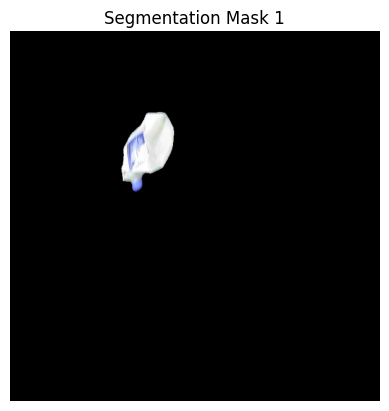

Segmentation mask saved as /content/rando2/1.png
Processing file: 88
tensor([[0.3352, 0.5703, 0.1547, 0.3320]], device='cuda:0')


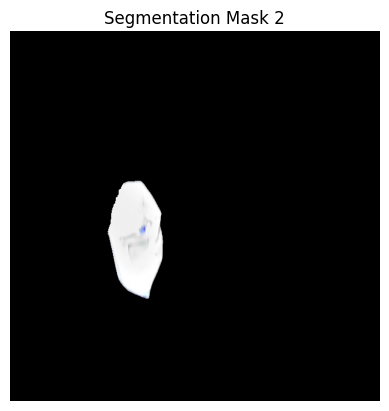

Segmentation mask saved as /content/rando2/2.png
Processing file: 98
tensor([[0.8500, 0.3906, 0.1133, 0.2906]], device='cuda:0')


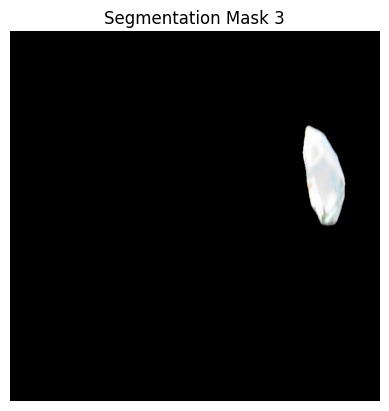

Segmentation mask saved as /content/rando2/3.png
Processing file: 42
tensor([[0.6102, 0.8953, 0.1344, 0.2094]], device='cuda:0')


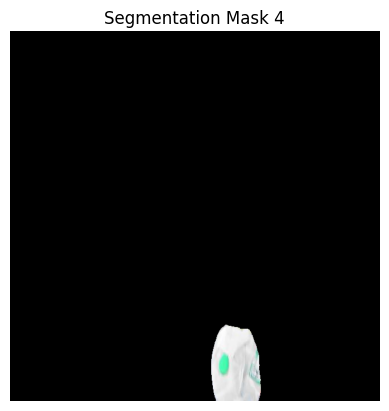

Segmentation mask saved as /content/rando2/4.png
Processing file: 349
tensor([[0.0734, 0.5813, 0.1375, 0.2508]], device='cuda:0')


KeyboardInterrupt: 

In [ ]:
import cv2
import torch
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt


# Move model parameters to GPU



# Check if GPU is available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

sam_predictor.model.to(device)

# If GPU is available, print a message
if device.type == 'cuda':
    print('Using GPU:', torch.cuda.get_device_name(0))
else:
    print('Using CPU for computation')

# If the file exists, find a unique filename by incrementing the indices
counter = 1
save_dir = '/content/rando2/'

# Start a loop here that goes through and segments all the images and stores the results.
for x in image_names:
    print(f"Processing file: {x}")  # Print the current file being processed

    path_name_images = "/content/Images"
    path_name_labels = "/content/Labels"

    image_source = cv2.imread(path_name_images + "/" + x + ".jpg")
    image_source = cv2.cvtColor(image_source, cv2.COLOR_BGR2RGB)

    # Initialize an empty list
    test = []

    # Open the file for reading
    with open(path_name_labels + "/" + x + ".txt", 'r') as file:
        # Iterate over each line in the file
        for line in file:
            # Split the line into parts
            temp = line.split()
            # Remove the first element
            temp.pop(0)
            # Convert remaining string elements to float
            temp = [float(x) for x in temp]
            # Append the list of floats to the test list
            test.append(temp)

    # Convert the list of lists into a PyTorch tensor and move it to GPU if available
    tensor = torch.tensor(test).to(device)
    boxes = tensor.to(device)
    print(boxes)

    ######################################################
    #####segmentation section!!!
    # Segmentation within Bounding Boxes
    sam_predictor.set_image(image_source)  # Set image for segmentation predictor

    # Convert boxes to Torch tensor and transform to xyxy format
    H, W, _ = image_source.shape
    boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.tensor([W, H, W, H], device=device)

    # Define a list to store all segmentation masks
    segmentation_masks = []

    # Generate masks for each bounding box
    for box in boxes_xyxy:
        # Apply segmentation within each bounding box
        transformed_box = sam_predictor.transform.apply_boxes_torch(box.unsqueeze(0), (H, W))

        # Move the transformed box to the same device as the boxes tensor
        transformed_box = transformed_box.to(device)

        # Move the `point_coords` and `point_labels` tensors to the same device as well
        point_coords = None  # Assuming it's None for this example
        point_labels = None  # Assuming it's None for this example
        if point_coords is not None:
            point_coords = point_coords.to(device)
        if point_labels is not None:
            point_labels = point_labels.to(device)

        # Ensure coords tensor is on the same device as other tensors
        if point_coords is not None:
            point_coords = point_coords.to(device)

        # Call the predict_torch method with tensors on the same device
        masks, _, _ = sam_predictor.predict_torch(
            point_coords=point_coords,
            point_labels=point_labels,
            boxes=transformed_box,
            multimask_output=False,
        )

        # Append the masks for the current bounding box to the list
        segmentation_masks.extend(masks)

    ##############################
    for i, box_masks in enumerate(segmentation_masks):
        for j, mask in enumerate(box_masks):
            # Convert the segmentation mask to a NumPy array
            segmentation_mask = mask.cpu().numpy()

            # Convert the segmentation mask to a PIL Image
            segmentation_mask_pil = Image.fromarray(segmentation_mask)

            # Get the height and width of the segmentation mask
            width, height = segmentation_mask_pil.size

            # Create a new image to store the result with original colors for the segmentation and black for everything else
            result_image = np.zeros_like(image_source)
            result_image[:, :, :] = [0, 0, 0]  # Fill with black color

            # Perform pixel matching and extraction of color from the original image
            for y in range(height):
                for x in range(width):
                    # Get the pixel value from the segmentation mask
                    mask_pixel = segmentation_mask_pil.getpixel((x, y))

                    # Check if the pixel in the segmentation mask is white
                    if mask_pixel == 255:  # Assuming white corresponds to segmentation
                        # Get the color from the original image at the same pixel location
                        original_color = image_source[y, x]

                        # Set the color in the result image at the same pixel location
                        result_image[y, x] = original_color

            # Generate the filename for the segmentation mask
            mask_filename = f"{counter}.png"
            mask_filepath = os.path.join(save_dir, mask_filename)

            # Save the segmentation mask as an image file
            plt.imsave(mask_filepath, result_image)

            # Display the segmentation mask
            plt.imshow(result_image)
            plt.title(f"Segmentation Mask {counter}")
            plt.axis('off')
            plt.show()

            print(f"Segmentation mask saved as {mask_filepath}")

            # Increment the counter for the next image
            counter += 1


In [ ]:
import cv2
import os

# Path to the video file
video_path = "/content/img/video1.mov"

# Create a directory to save the images if it doesn't exist
output_dir = "/content/video_images"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Open the video file
video_capture = cv2.VideoCapture(video_path)

# Get the frame rate of the video
fps = video_capture.get(cv2.CAP_PROP_FPS)

# Calculate the frame interval for 4 seconds
frame_interval = int(fps * 4)

# Initialize variables for frame index and image index
frame_index = 0
image_index = 0

# Read frames from the video
while True:
    # Read a frame from the video
    ret, frame = video_capture.read()

    # Break the loop if no frame is retrieved
    if not ret:
        break

    # Check if it's time to save an image (every 4 seconds)
    if frame_index % frame_interval == 0:
        # Save the image
        image_filename = os.path.join(output_dir, f"image_{image_index}.jpg")
        cv2.imwrite(image_filename, frame)
        print(f"Saved image {image_filename}")

        # Increment the image index
        image_index += 1

    # Increment the frame index
    frame_index += 1

# Release the video capture object
video_capture.release()


In [ ]:
#local_image_path = '/content/GroundingDINO/{HOME}/video_images/image_10.jpg'
#local_image_path = '/content/video_images/image_15.jpg'
local_image_path = '/content/rando/6.jpg'

In [ ]:
save_dir = '/content/rando2/'

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


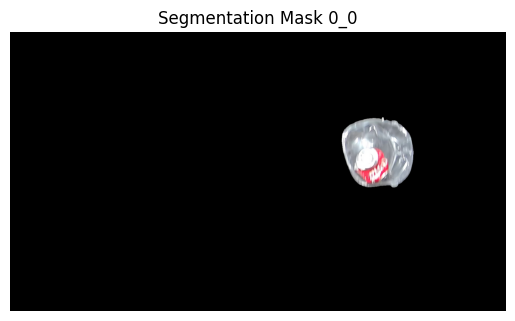

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0.png


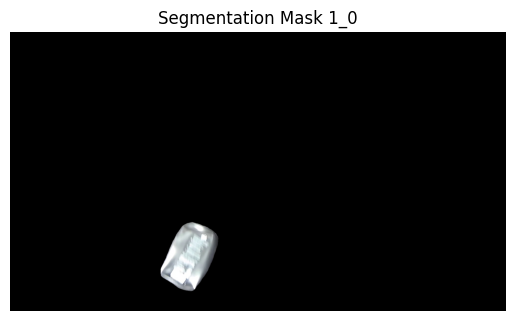

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0.png


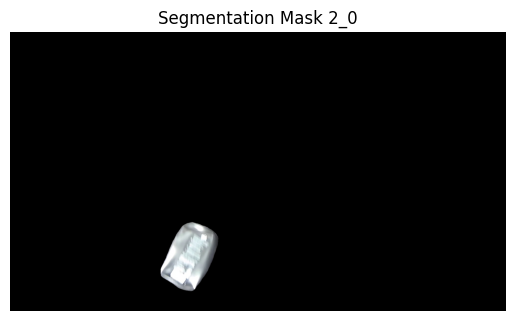

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0.png


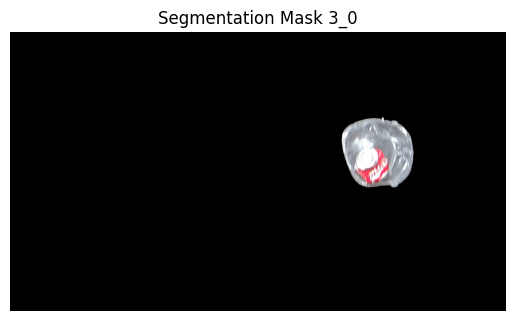

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0.png


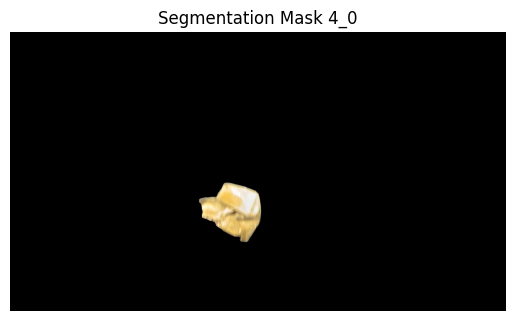

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0.png


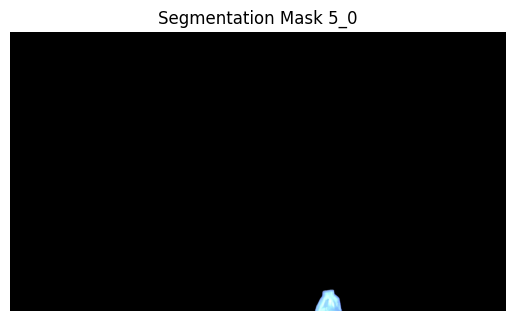

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


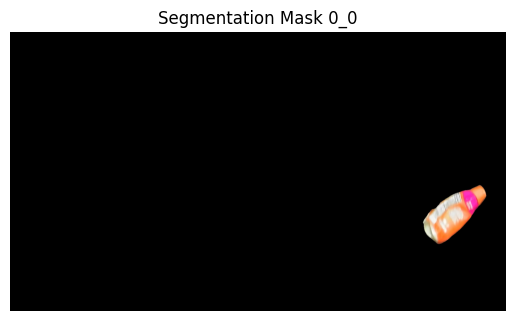

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_1.png


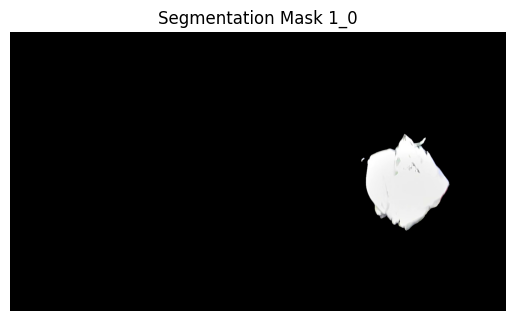

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_1.png


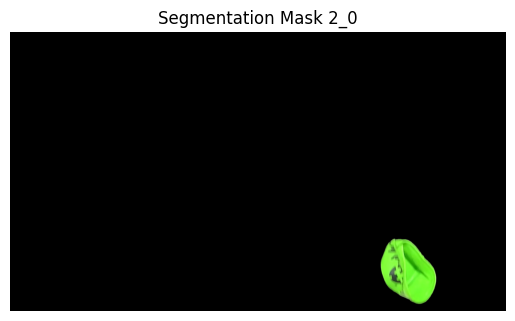

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_1.png


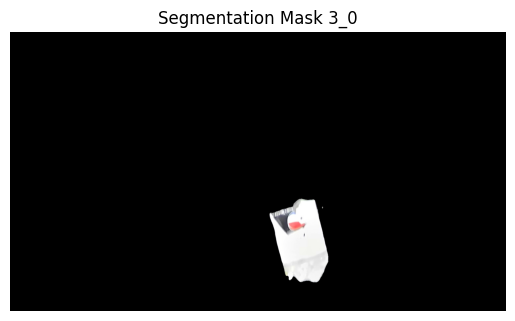

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_1.png


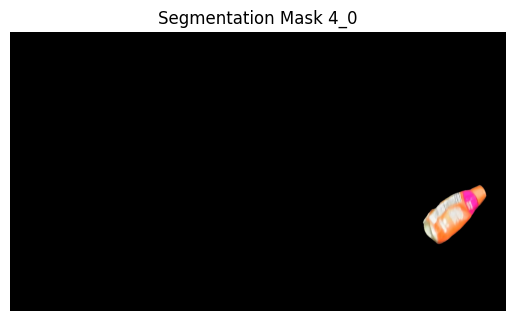

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_1.png


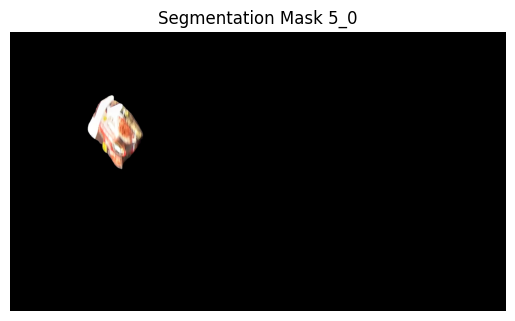

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_1.png


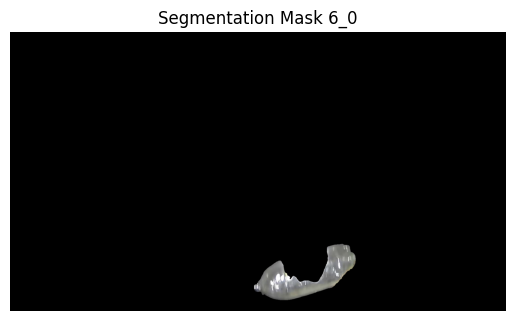

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0.png


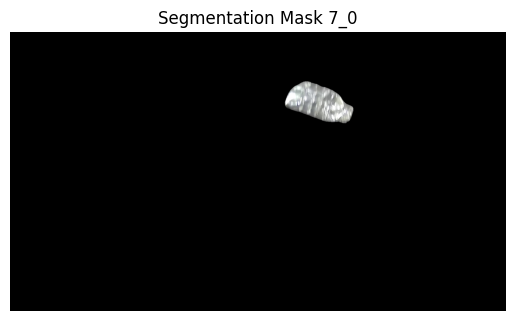

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


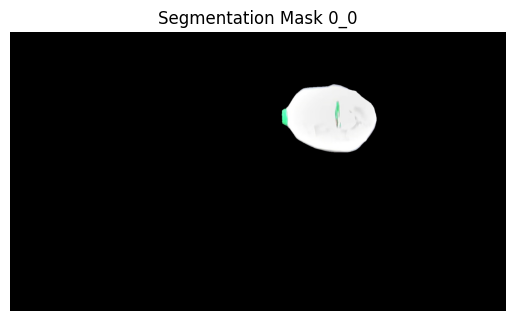

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_2.png


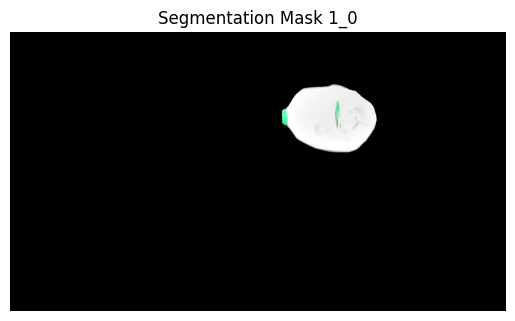

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_2.png


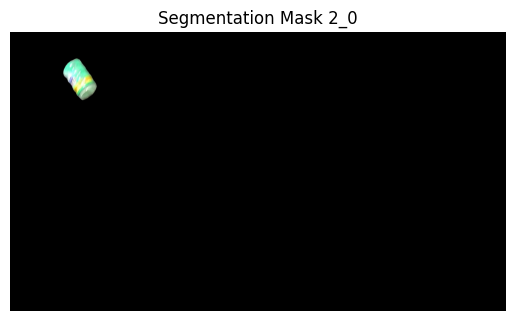

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_2.png


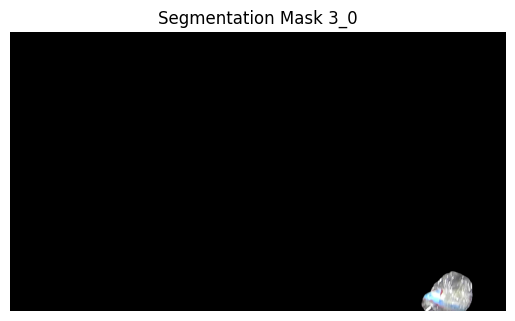

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_2.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


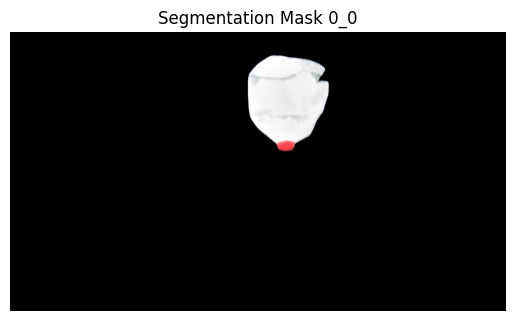

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_3.png


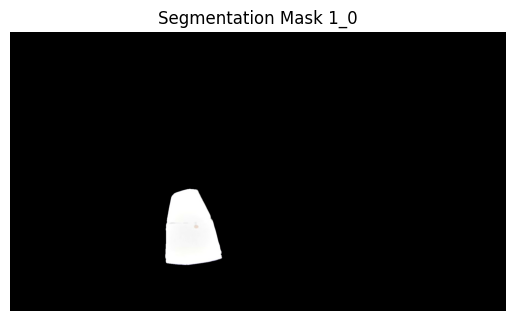

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_3.png


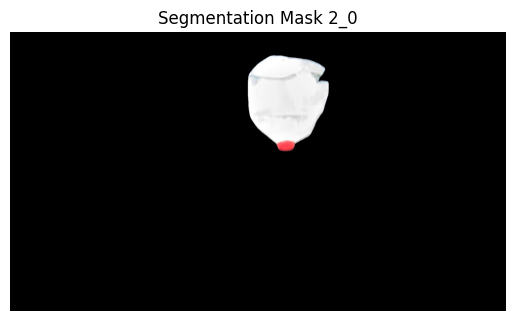

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_3.png


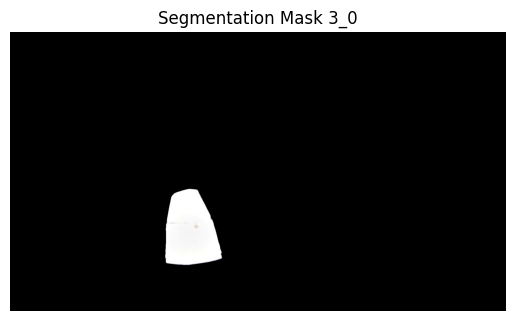

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_3.png


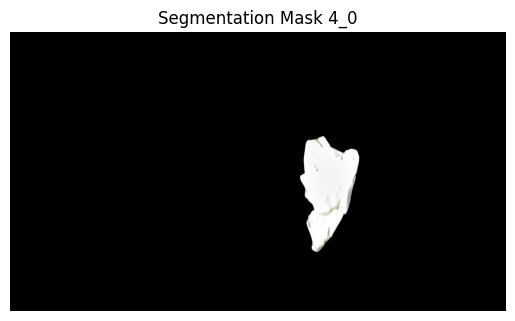

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_2.png


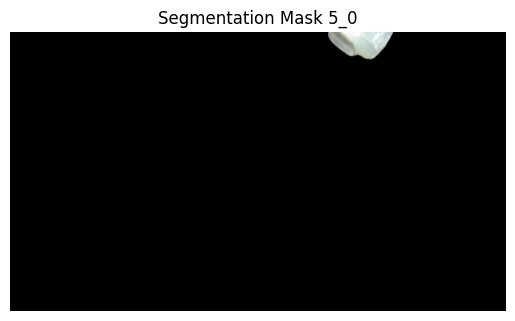

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_2.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


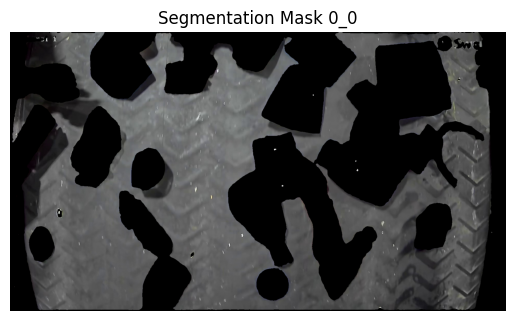

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_4.png


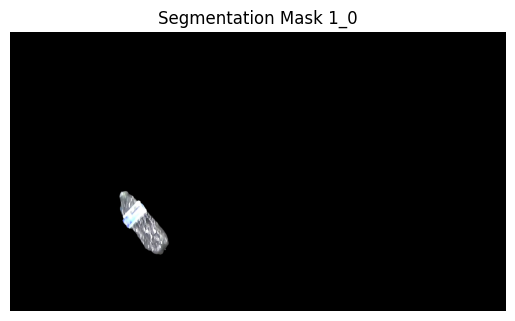

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_4.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


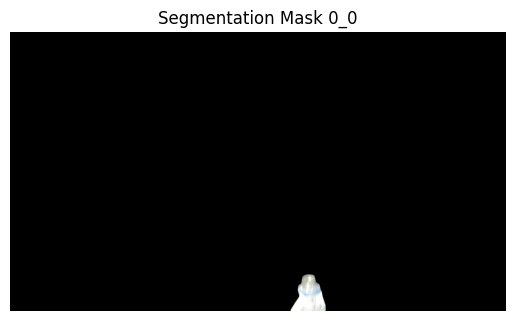

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_5.png


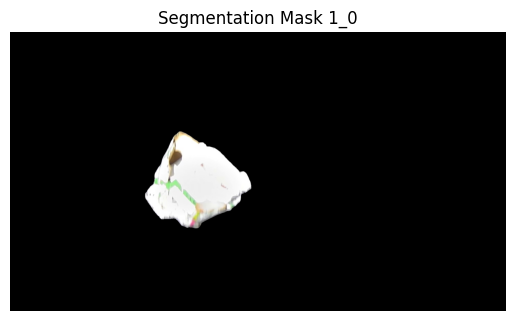

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_5.png


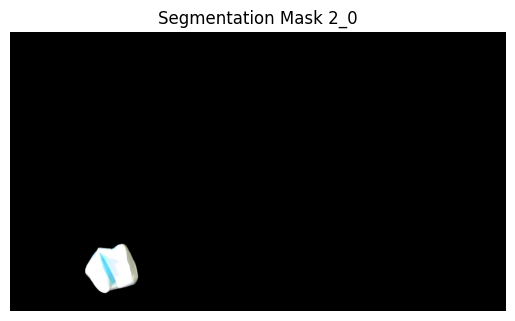

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_4.png


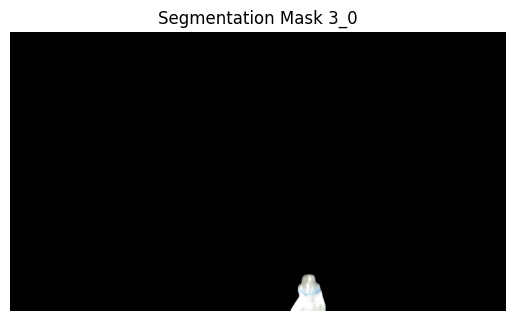

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_4.png


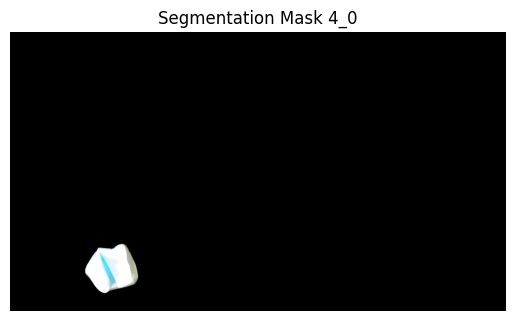

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_3.png


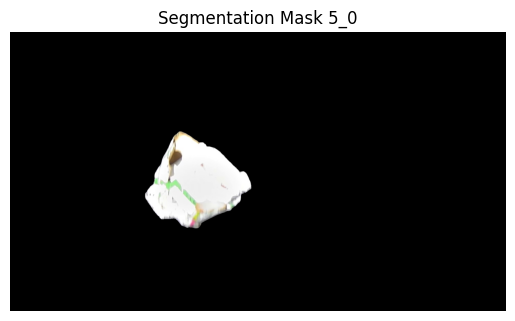

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_3.png


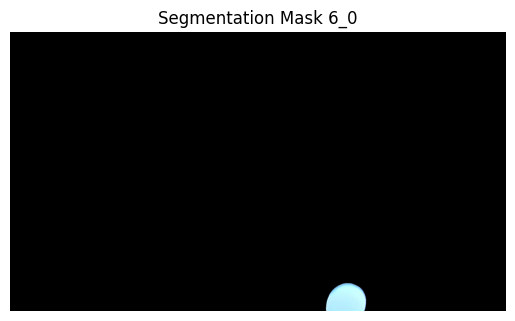

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_1.png


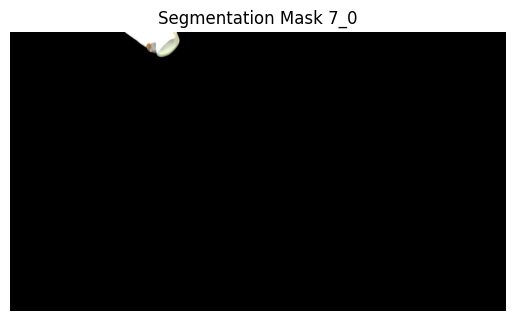

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_1.png


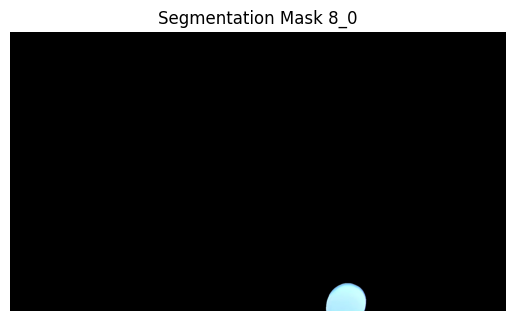

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0.png


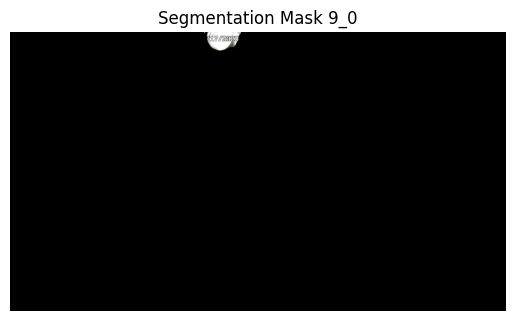

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


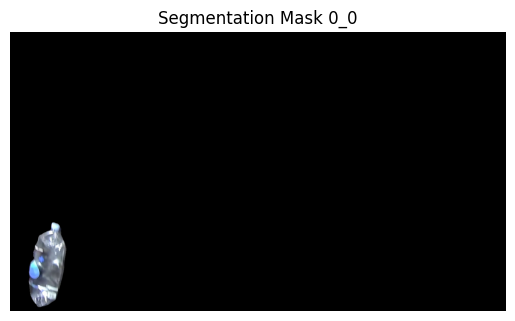

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_6.png


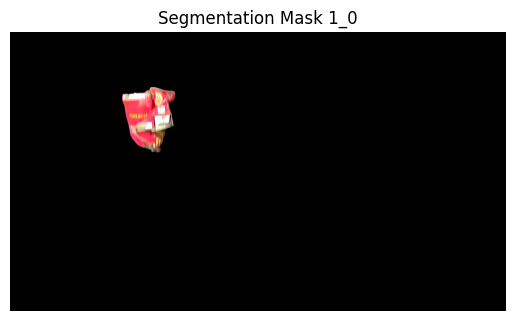

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_6.png


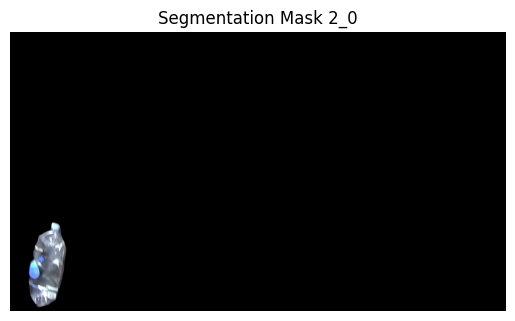

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_5.png


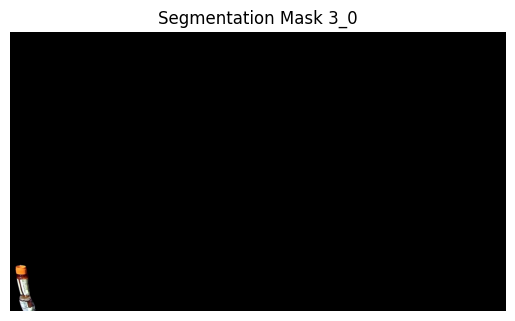

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_5.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


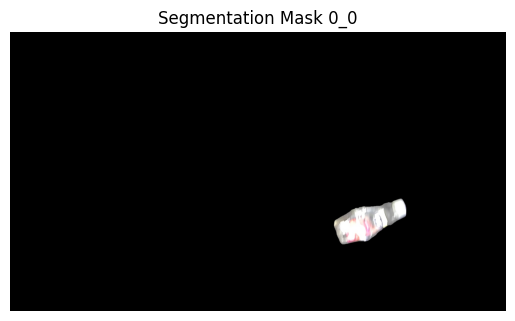

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_7.png


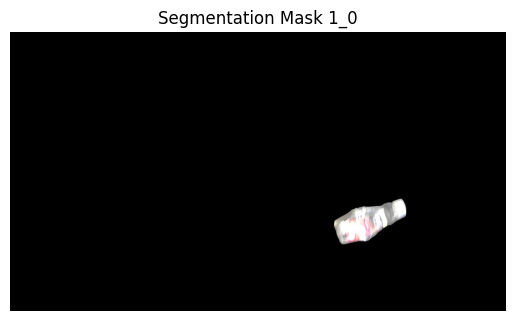

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_7.png


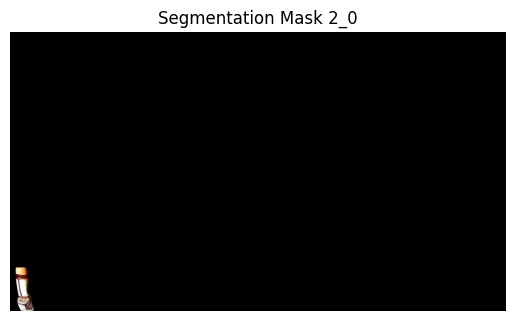

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_6.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


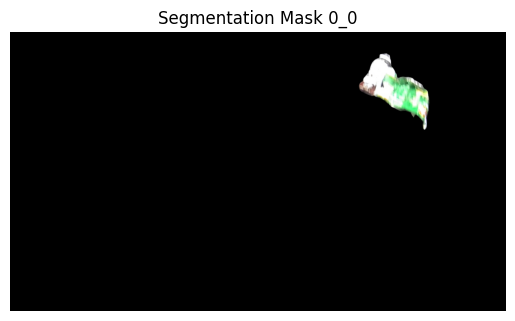

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_8.png


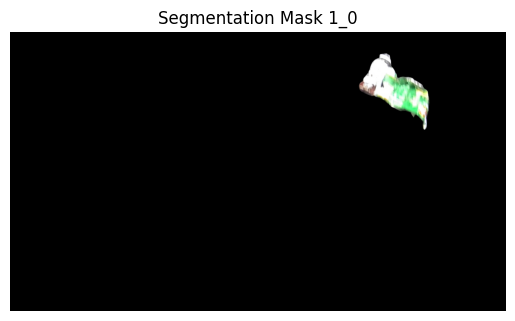

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_8.png


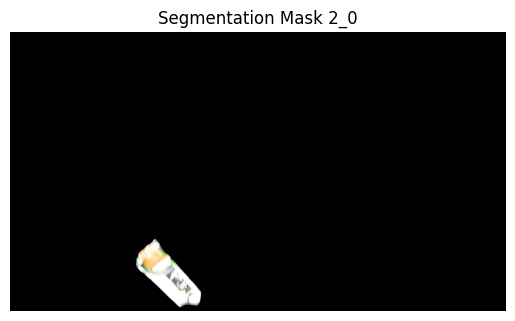

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_7.png


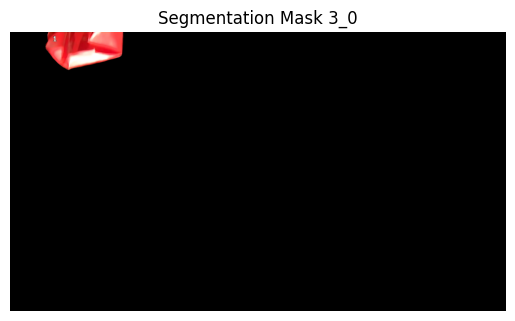

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_6.png


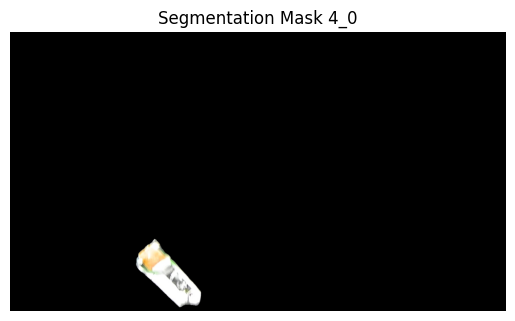

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_4.png


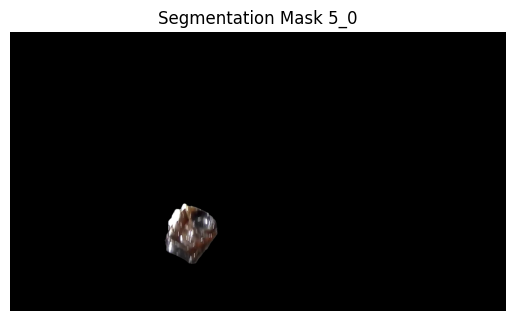

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_4.png


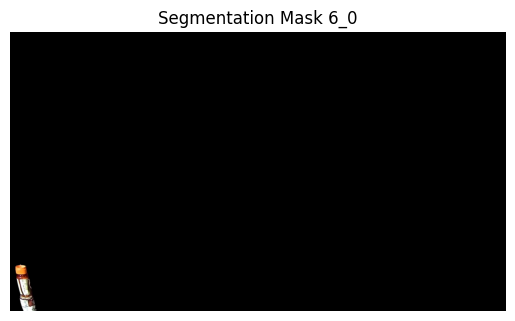

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_2.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


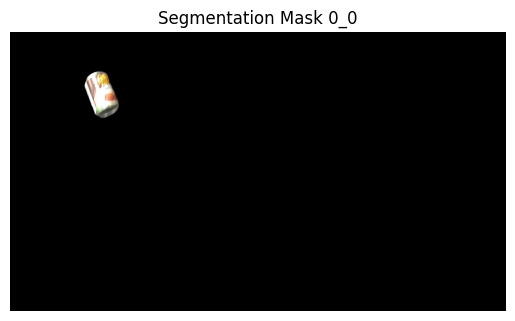

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_9.png


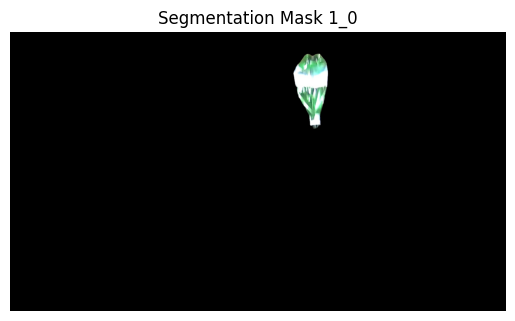

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_9.png


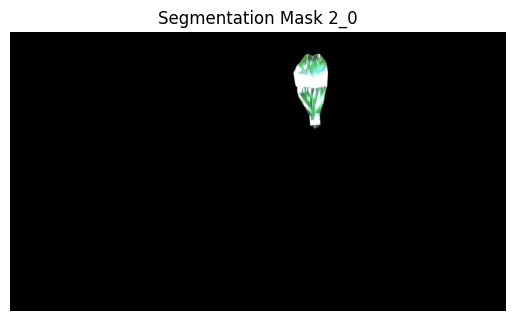

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_8.png


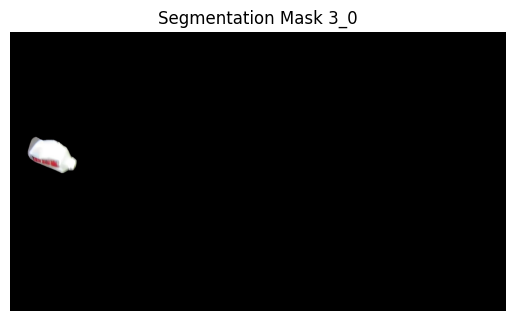

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_7.png


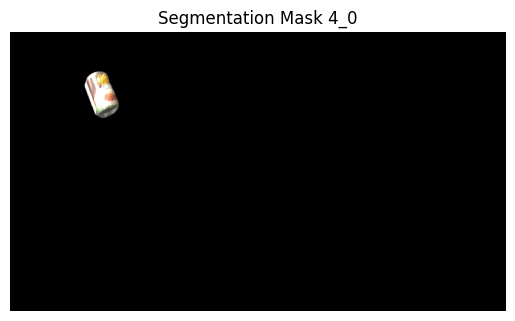

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_5.png


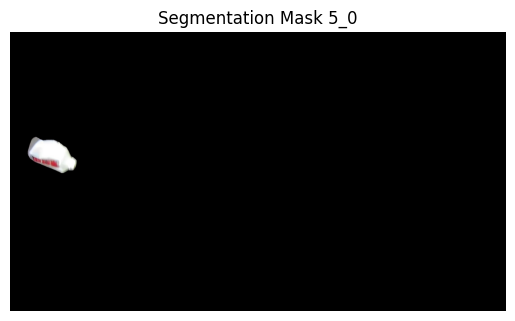

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_5.png


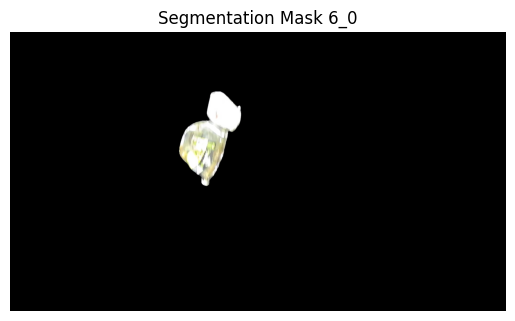

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_3.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


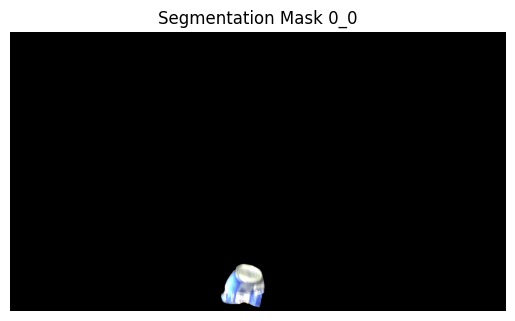

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_10.png


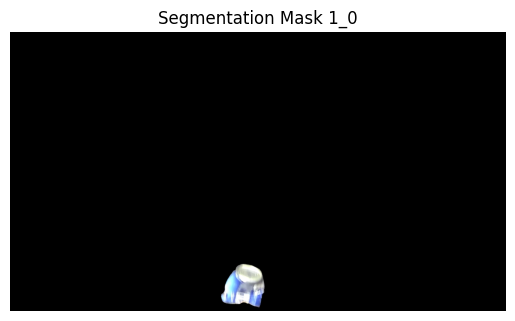

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_10.png


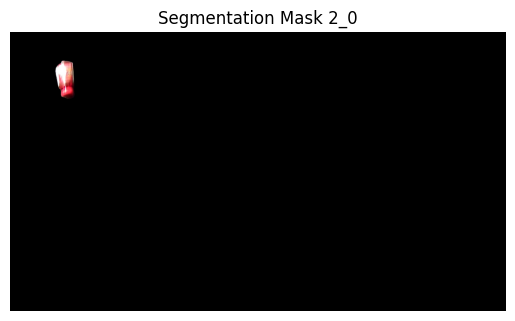

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_9.png


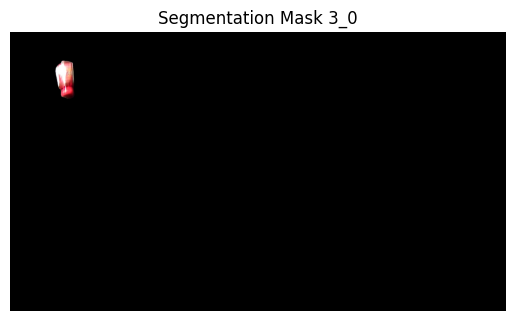

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_8.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


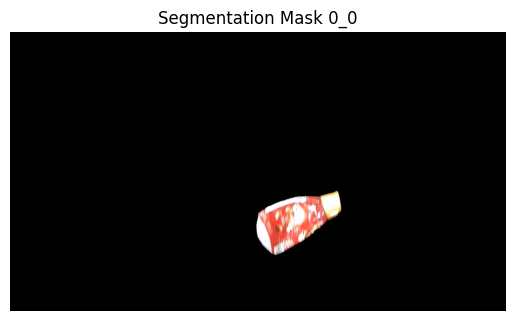

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_11.png


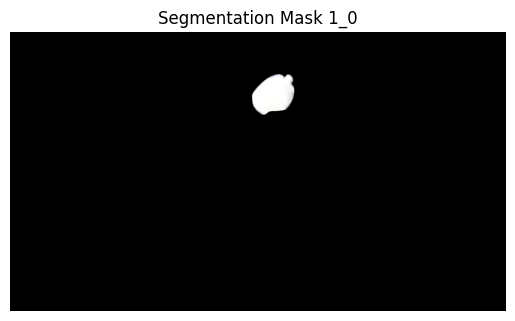

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_11.png


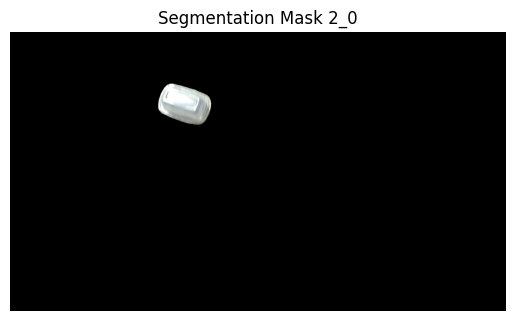

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_10.png


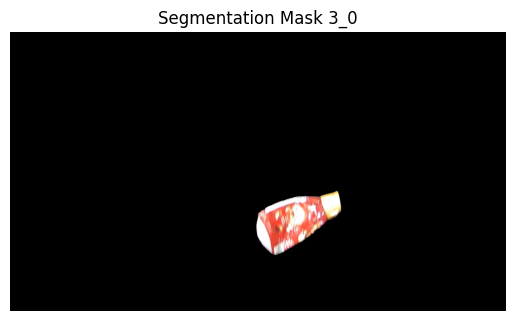

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_9.png


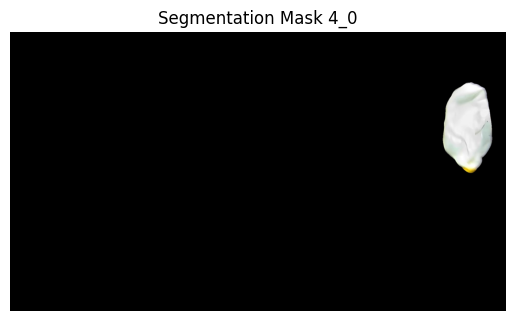

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_6.png


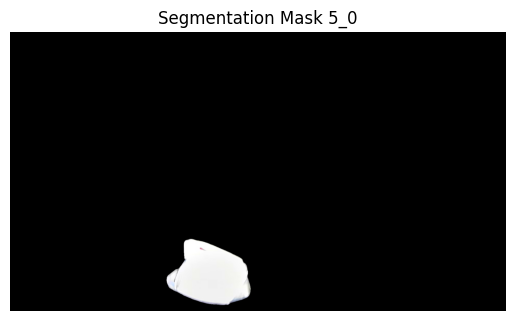

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_6.png


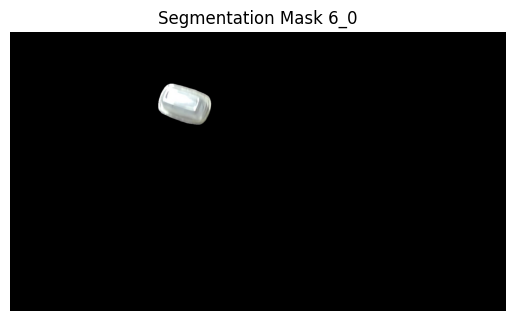

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_4.png


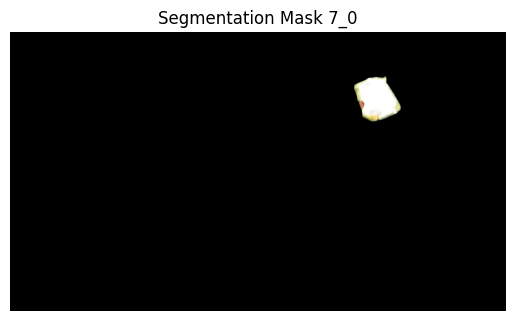

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_2.png


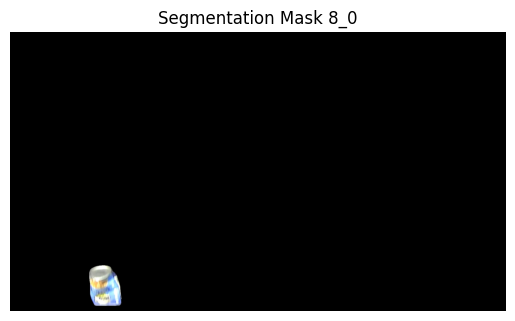

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_1.png


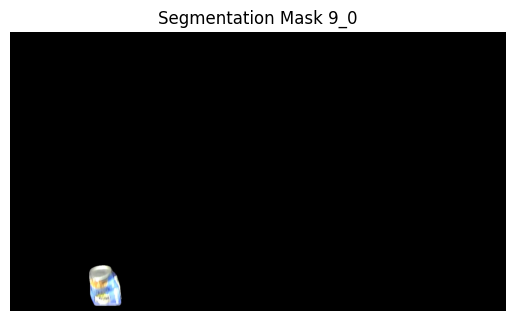

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_1.png


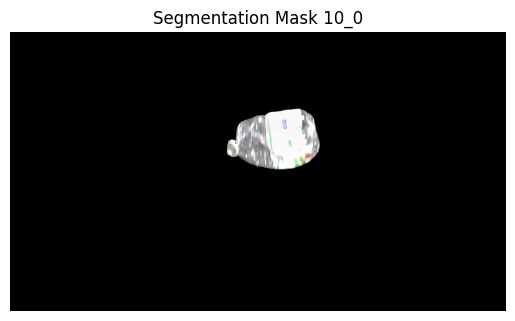

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0.png


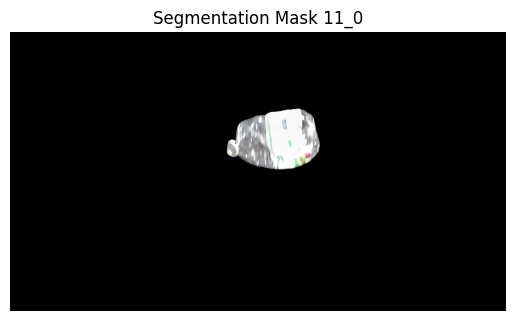

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0.png


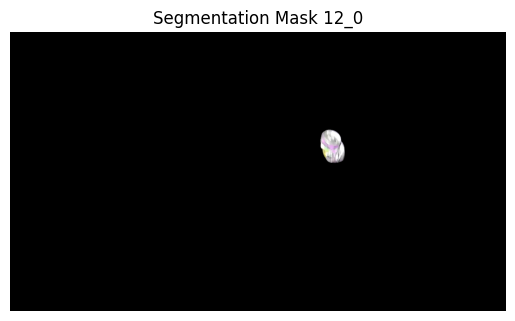

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0.png


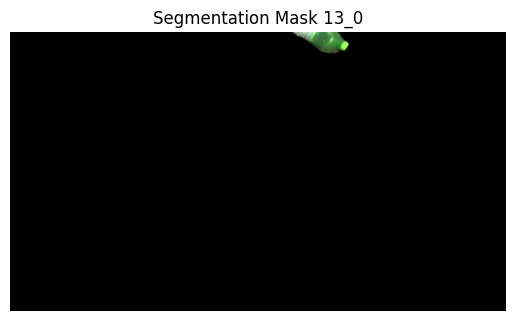

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


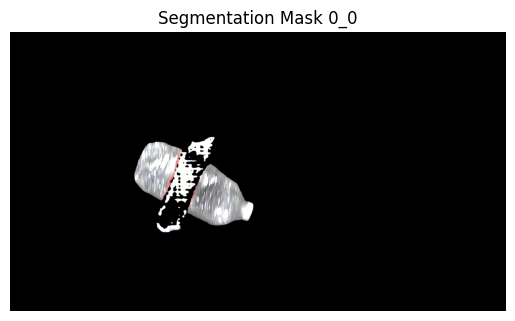

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_12.png


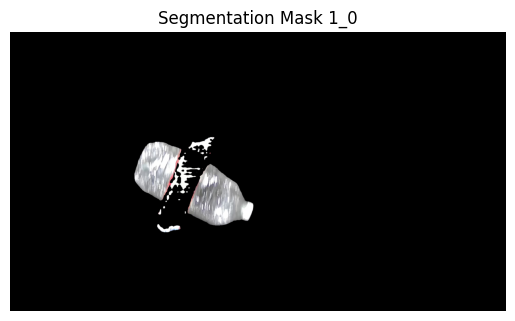

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_12.png


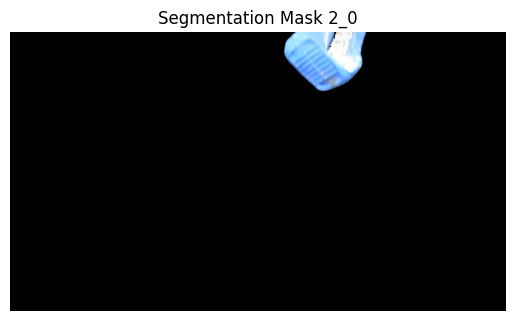

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_11.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


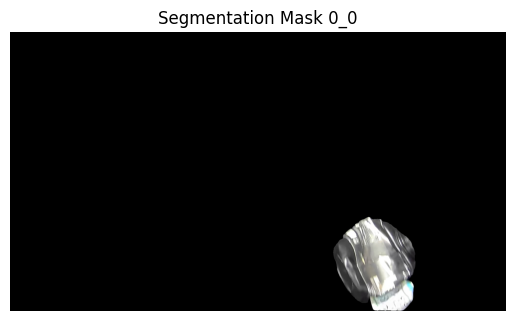

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_13.png


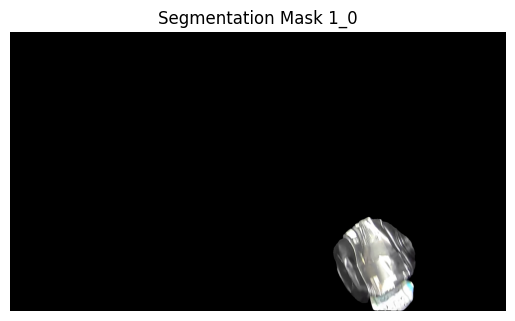

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_13.png


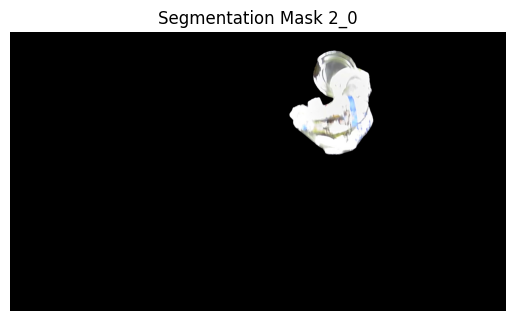

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_12.png


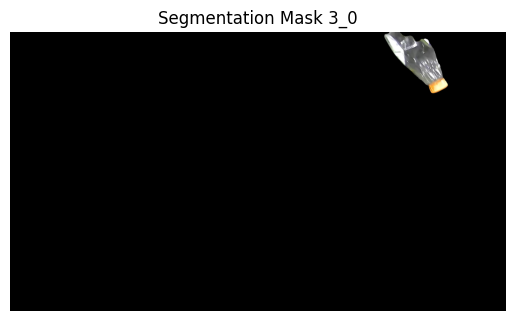

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_10.png


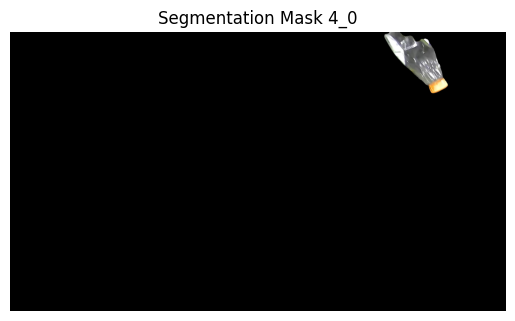

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_7.png


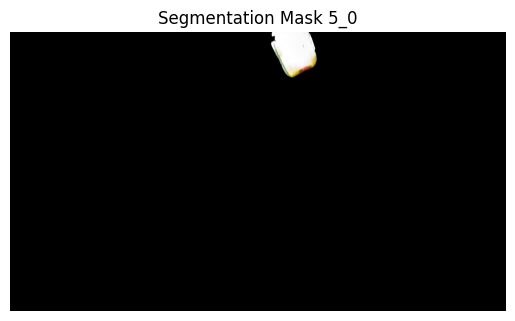

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_7.png


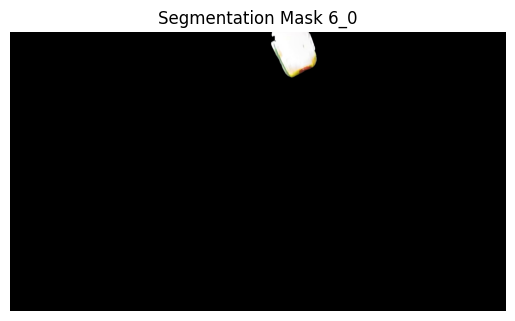

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_5.png


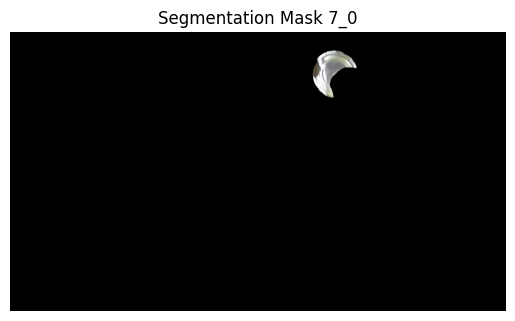

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_3.png


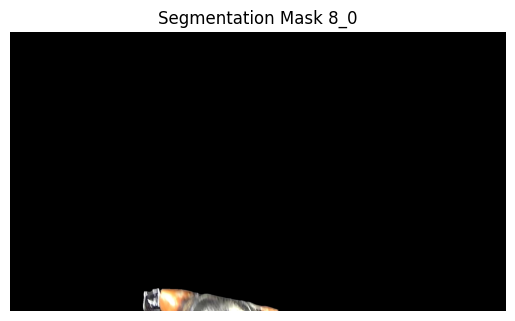

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_2.png


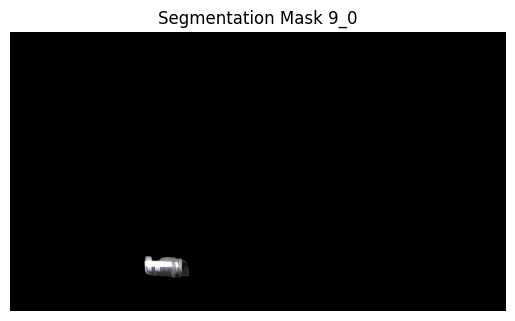

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_2.png


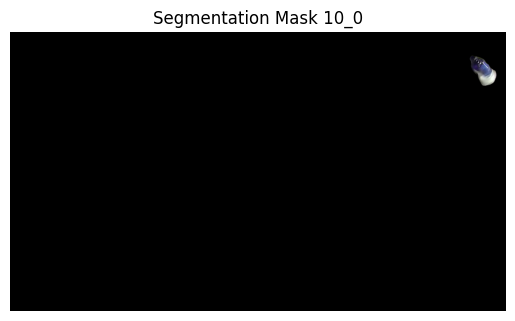

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_1.png


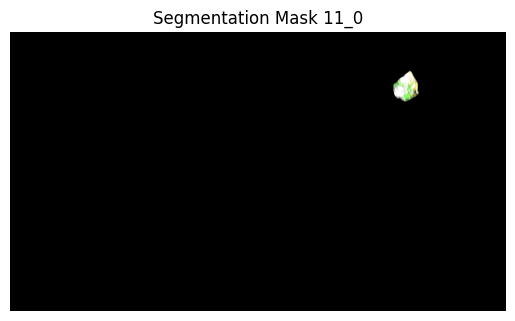

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_1.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


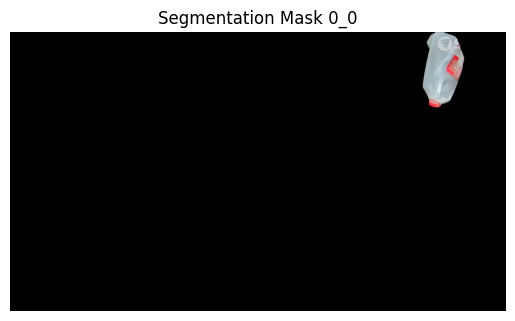

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_14.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


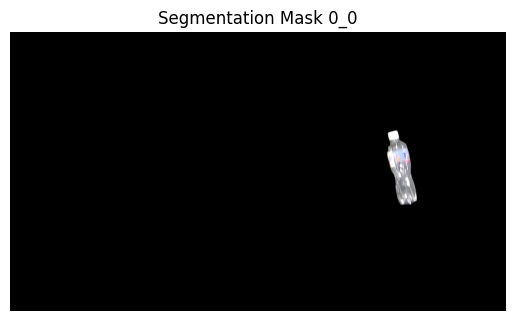

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_15.png


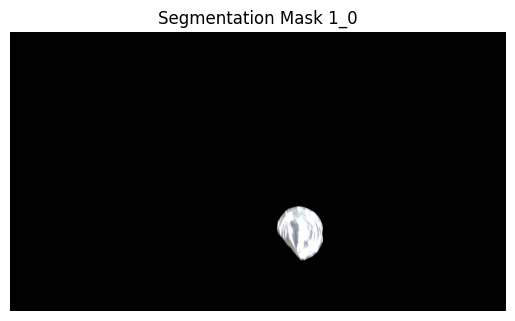

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_14.png


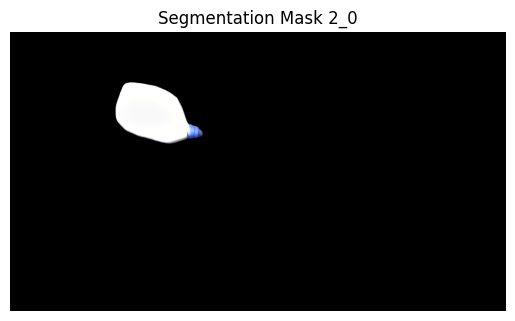

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_13.png


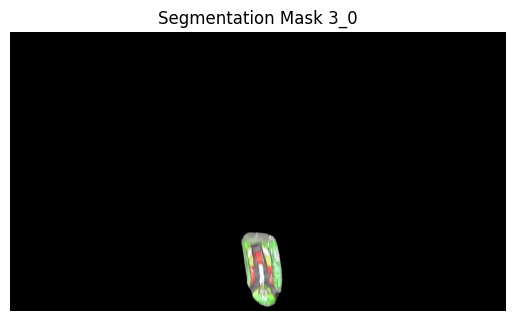

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_11.png


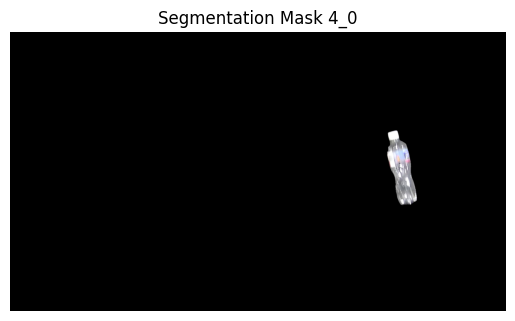

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_8.png


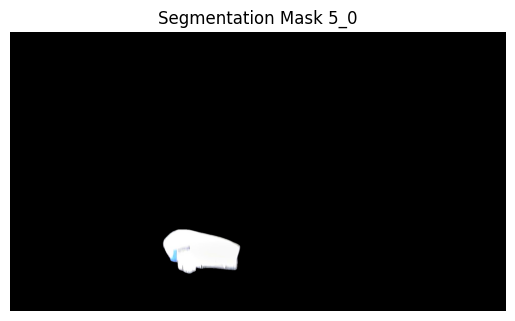

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_8.png


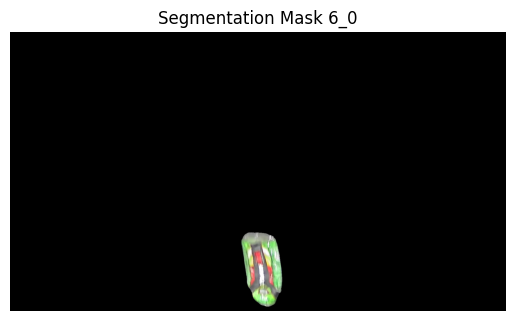

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_6.png


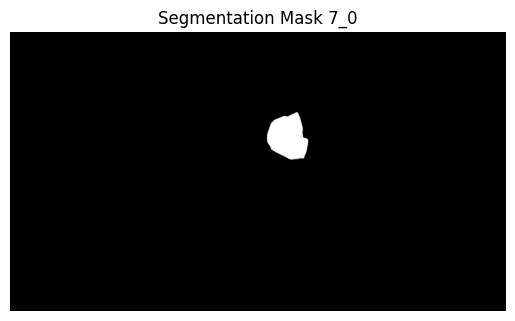

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_4.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


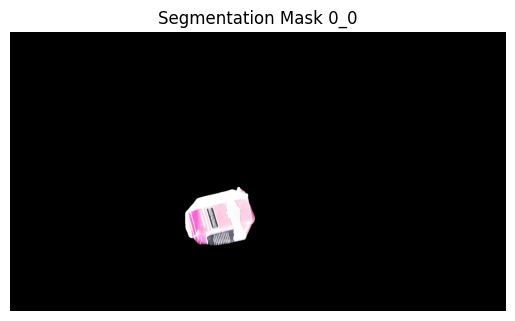

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_16.png


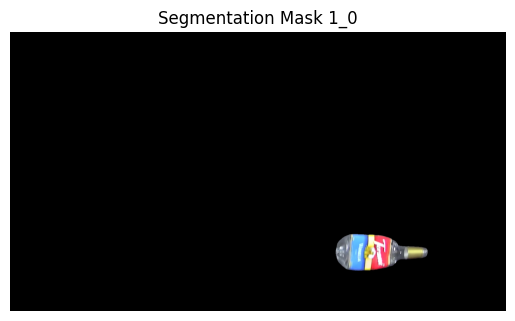

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_15.png


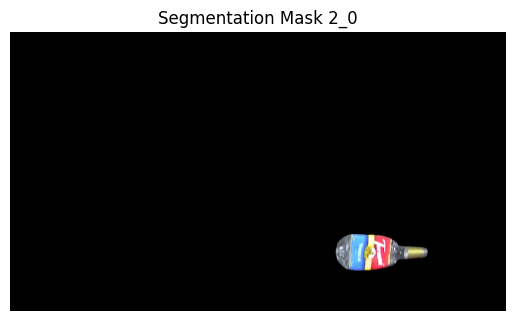

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_14.png


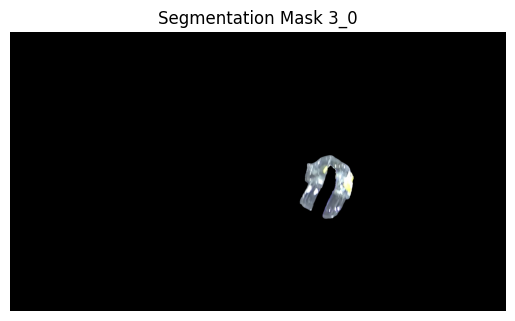

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_12.png


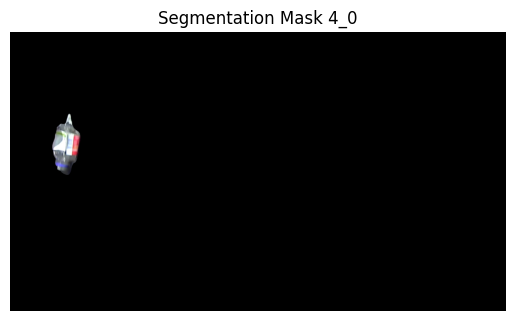

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_9.png


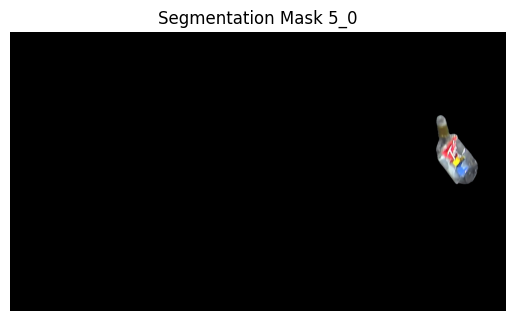

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_9.png


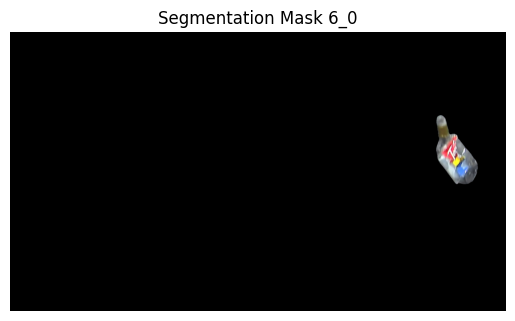

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_7.png


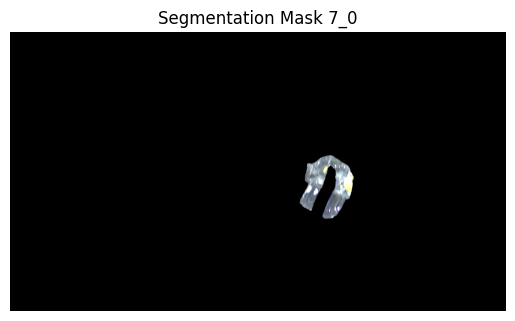

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_5.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


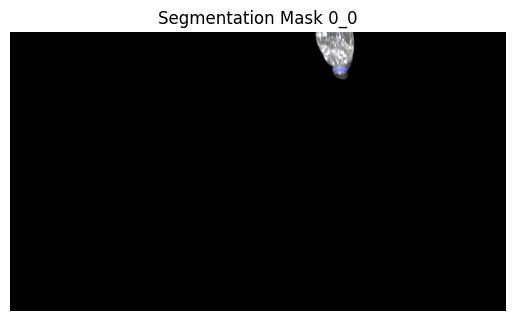

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_17.png


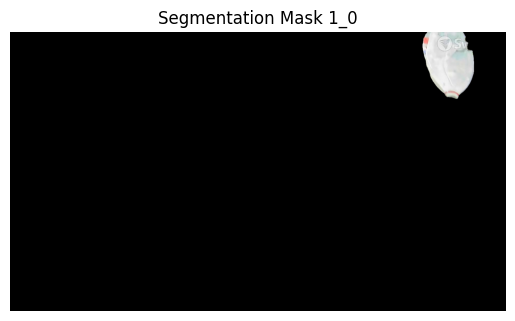

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_16.png


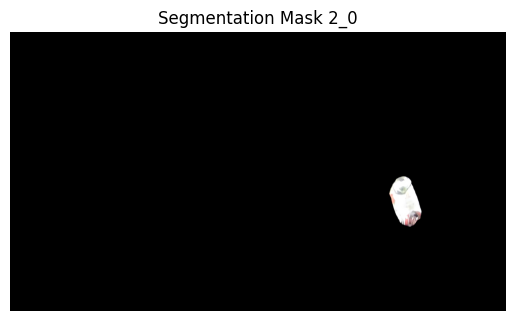

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_15.png


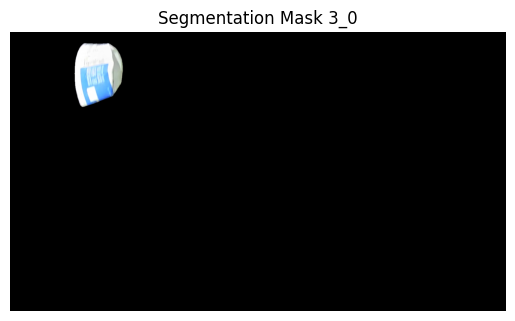

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_13.png


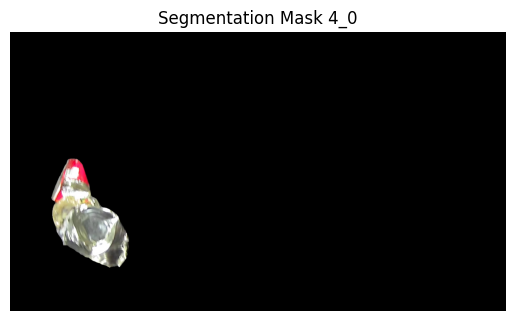

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_10.png


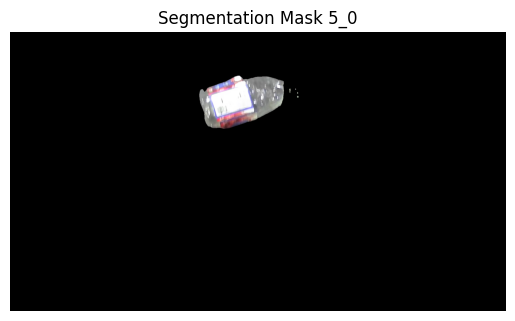

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_10.png


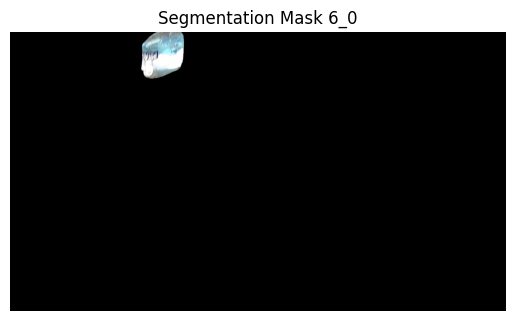

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_8.png


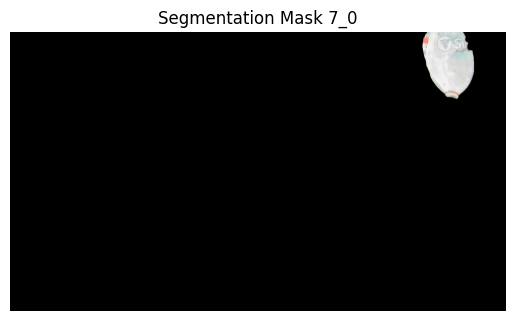

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_6.png


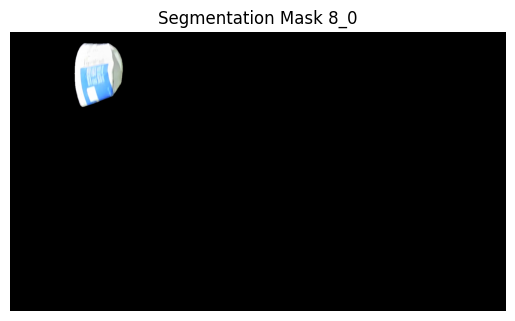

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_3.png


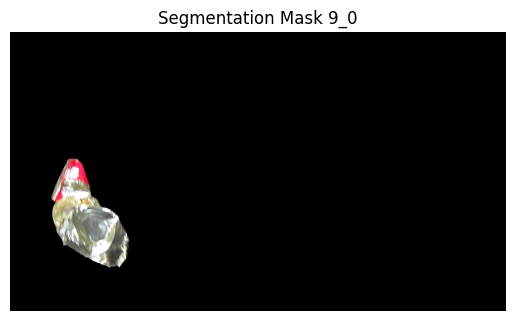

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_3.png


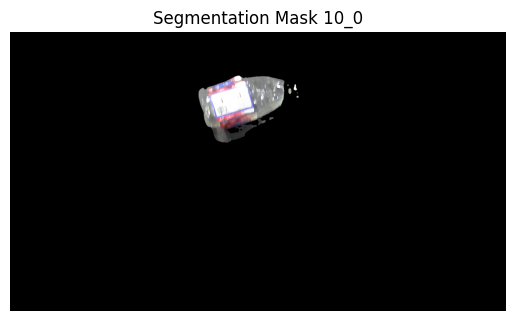

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_2.png


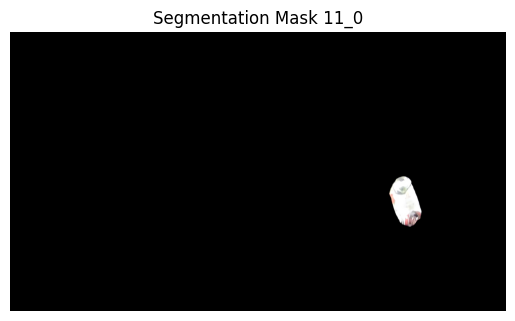

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_2.png


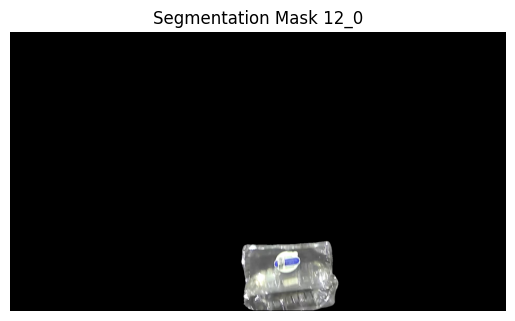

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_1.png


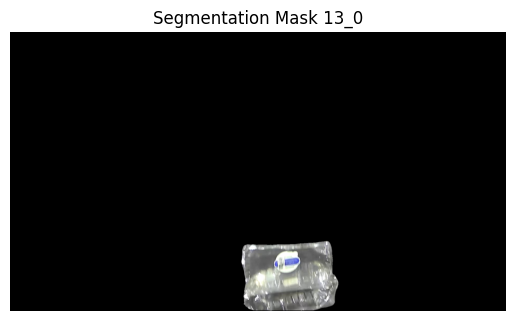

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_1.png


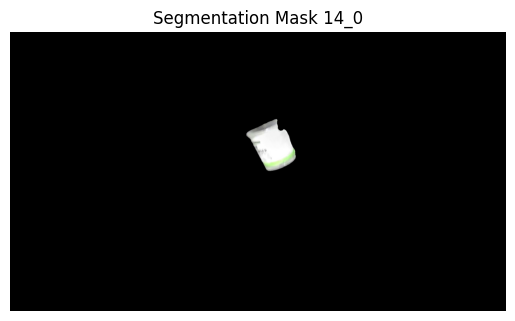

Segmentation mask 14_0 saved as /content/rando4/segmentation_mask_14_0.png


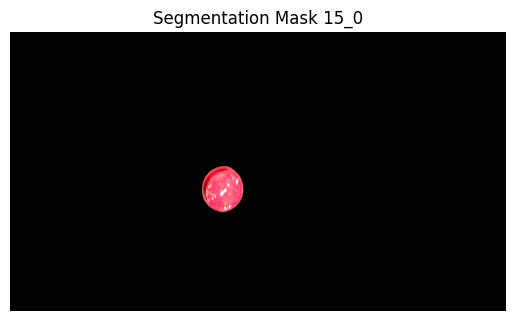

Segmentation mask 15_0 saved as /content/rando4/segmentation_mask_15_0.png


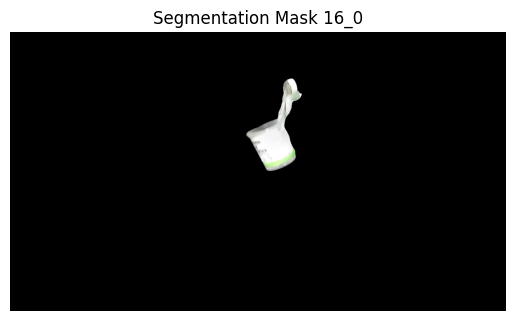

Segmentation mask 16_0 saved as /content/rando4/segmentation_mask_16_0.png


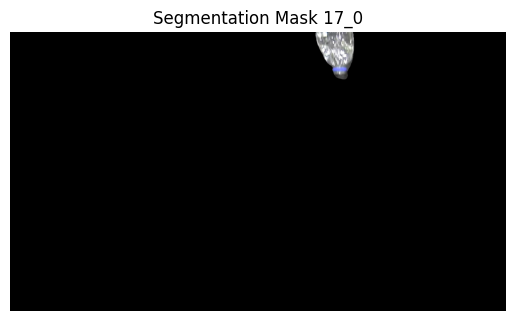

Segmentation mask 17_0 saved as /content/rando4/segmentation_mask_17_0.png


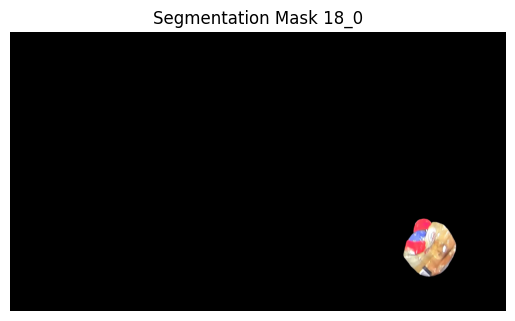

Segmentation mask 18_0 saved as /content/rando4/segmentation_mask_18_0.png


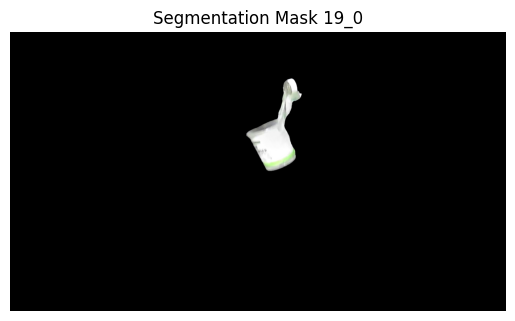

Segmentation mask 19_0 saved as /content/rando4/segmentation_mask_19_0.png


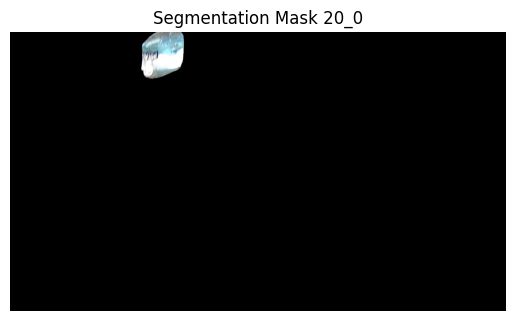

Segmentation mask 20_0 saved as /content/rando4/segmentation_mask_20_0.png


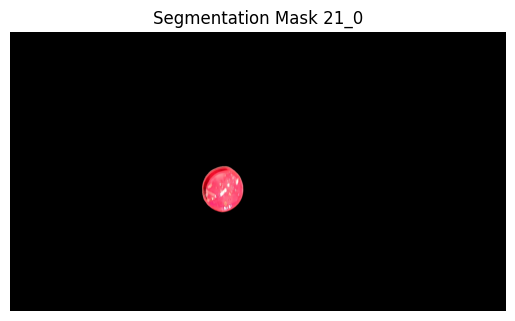

Segmentation mask 21_0 saved as /content/rando4/segmentation_mask_21_0.png


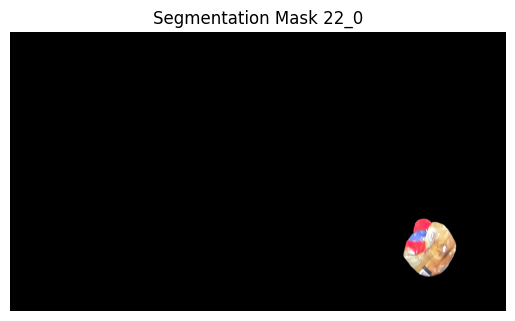

Segmentation mask 22_0 saved as /content/rando4/segmentation_mask_22_0.png


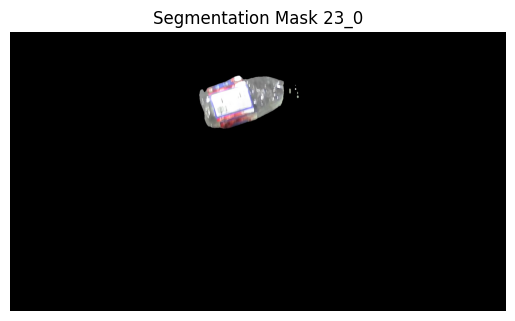

Segmentation mask 23_0 saved as /content/rando4/segmentation_mask_23_0.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


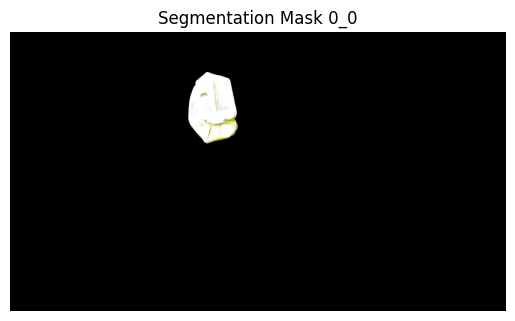

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_18.png


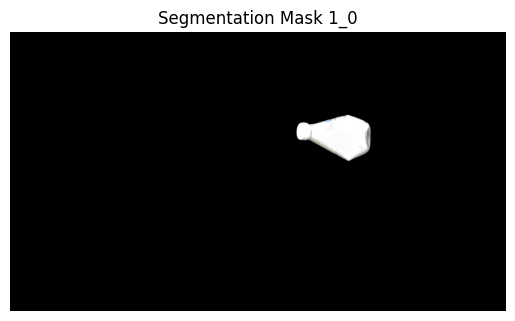

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_17.png


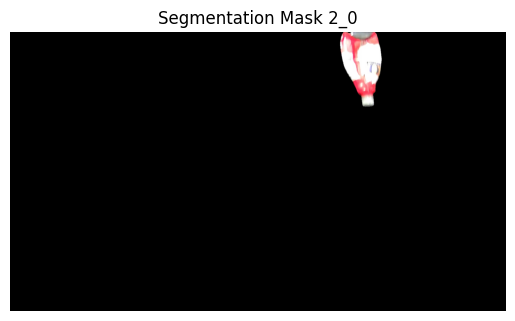

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_16.png


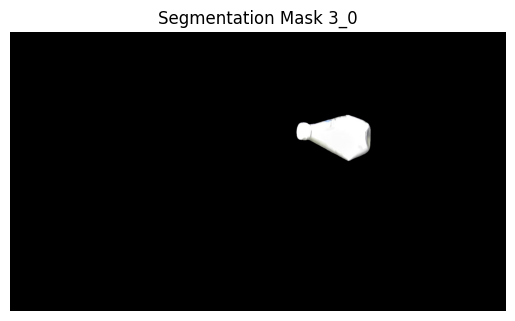

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_14.png


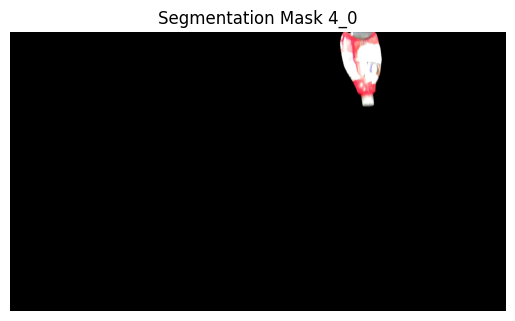

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_11.png


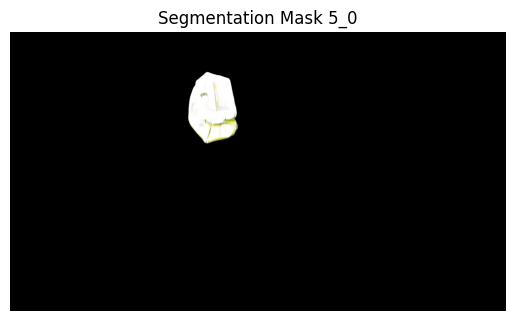

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_11.png


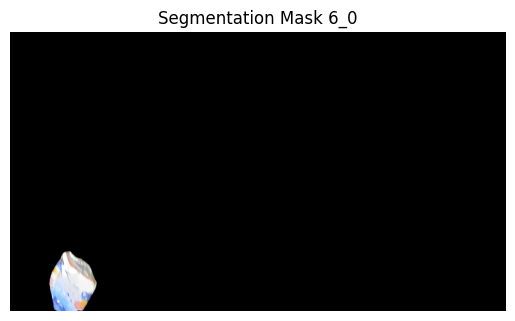

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_9.png


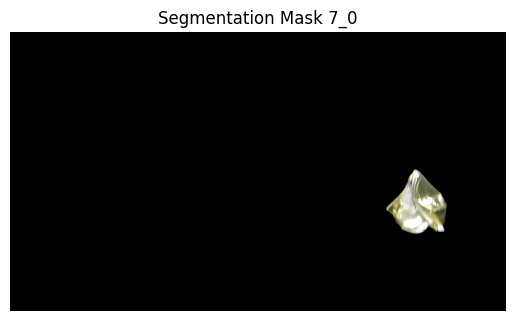

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_7.png


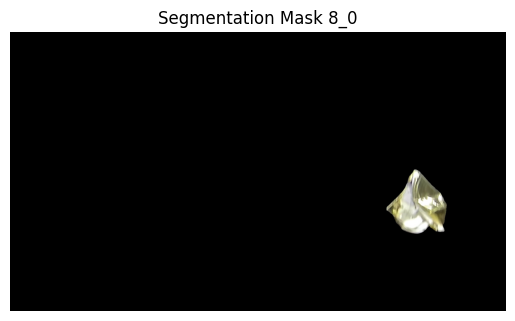

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_4.png


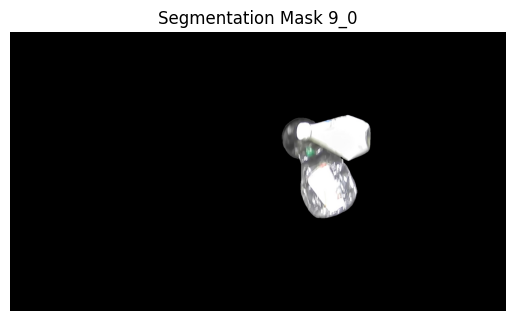

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_4.png


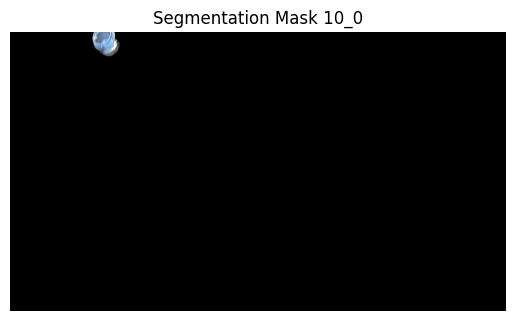

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_3.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


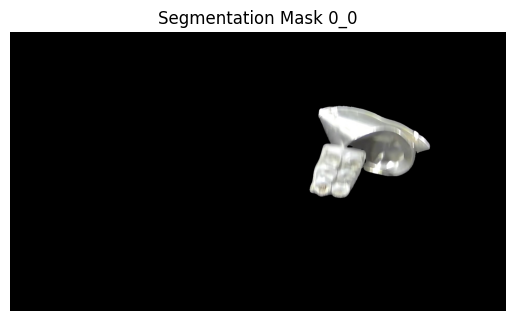

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_19.png


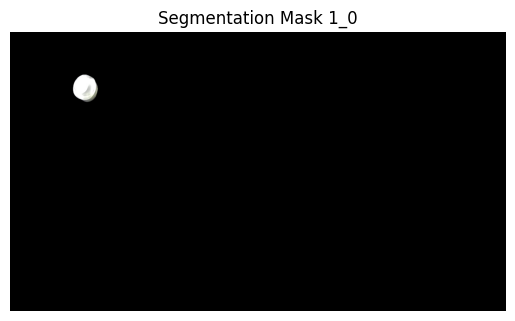

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_18.png


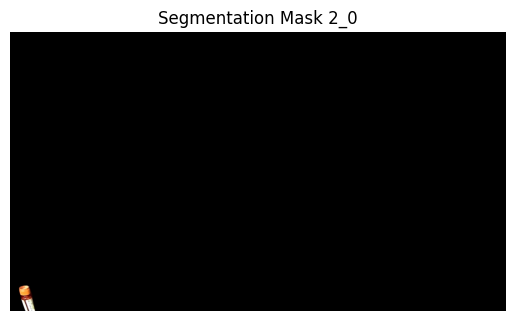

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_17.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


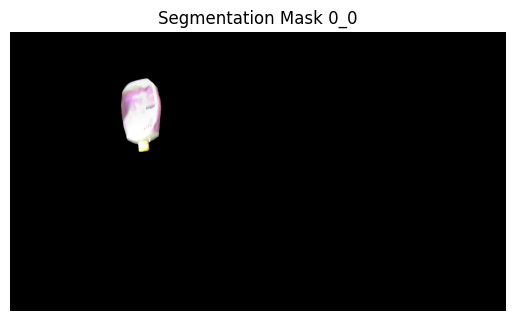

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_20.png


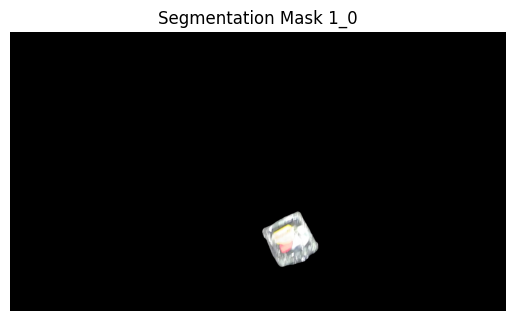

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_19.png


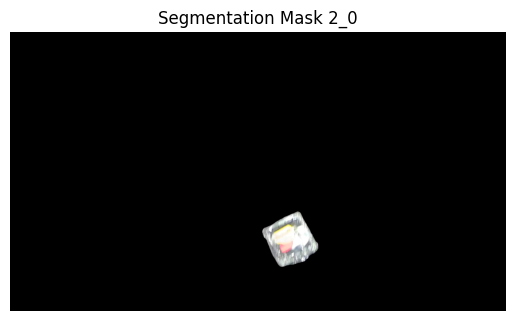

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_18.png


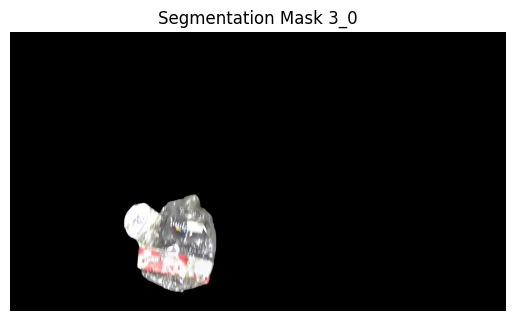

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_15.png


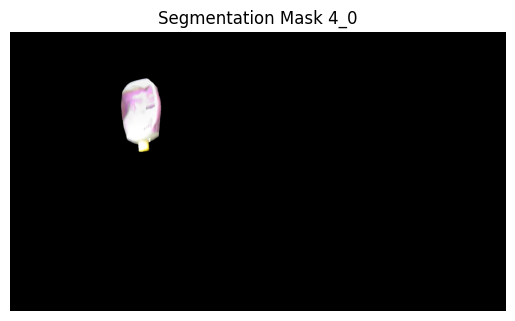

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_12.png


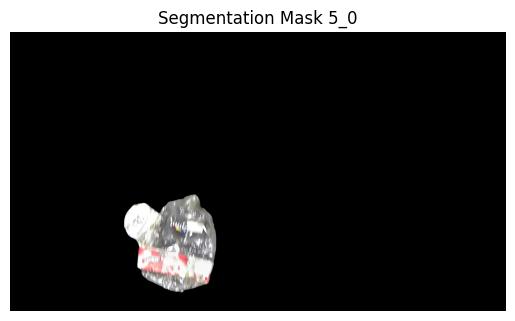

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_12.png


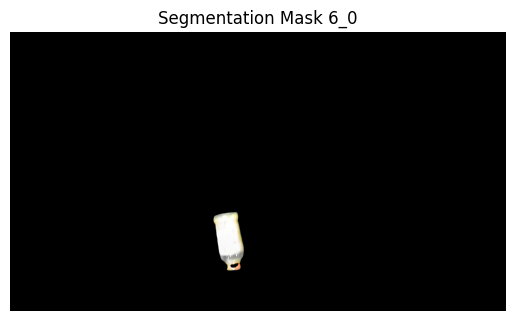

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_10.png


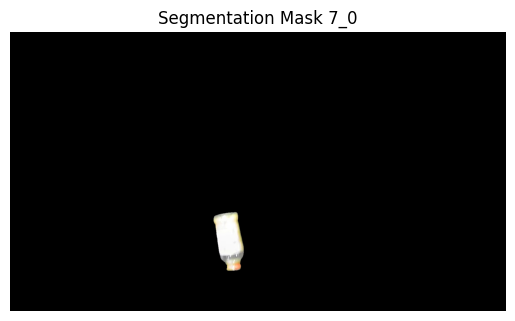

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_8.png


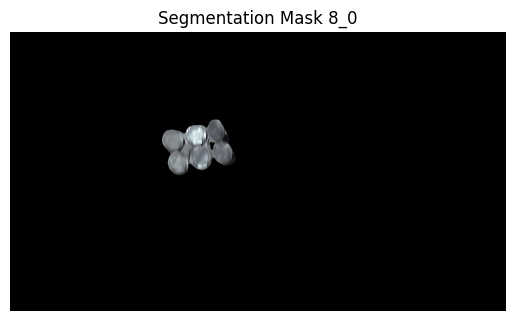

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_5.png


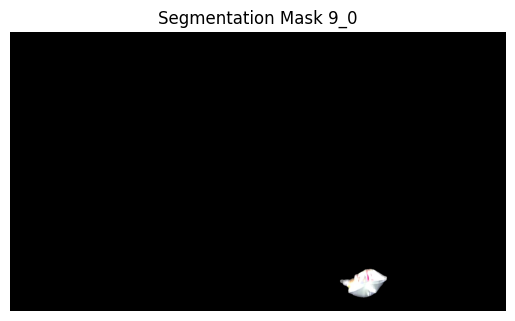

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_5.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


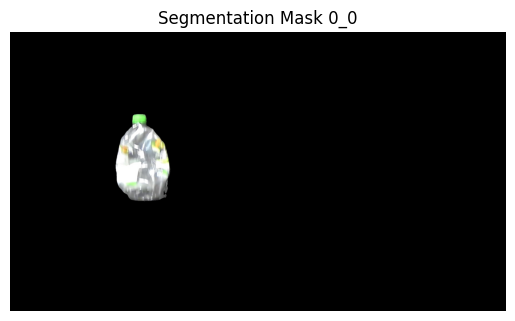

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_21.png


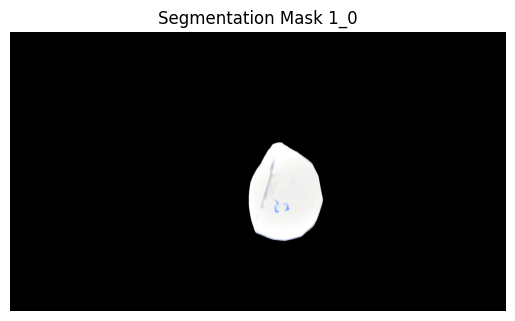

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_20.png


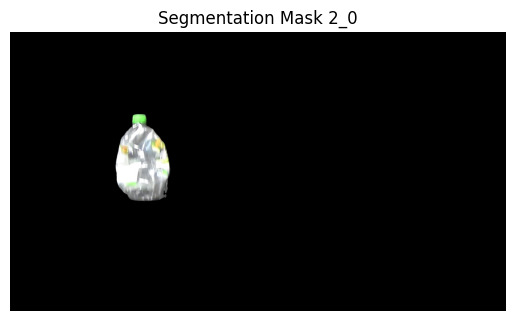

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_19.png


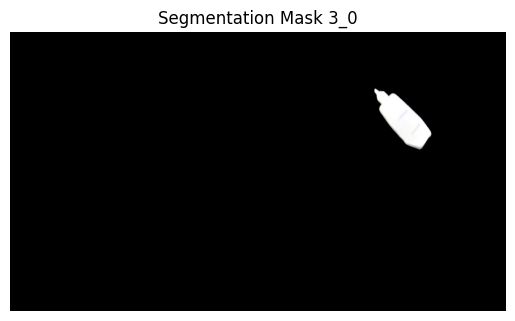

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_16.png


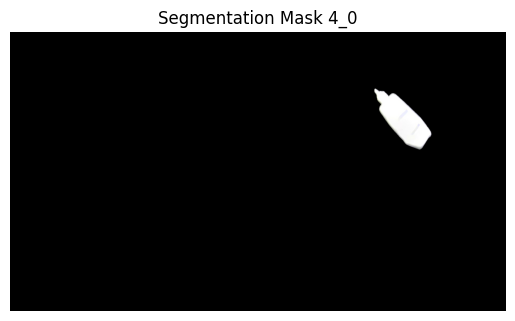

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_13.png


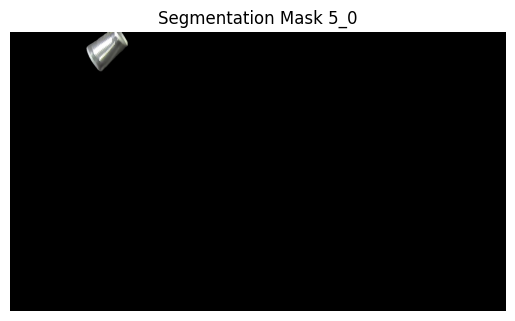

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_13.png


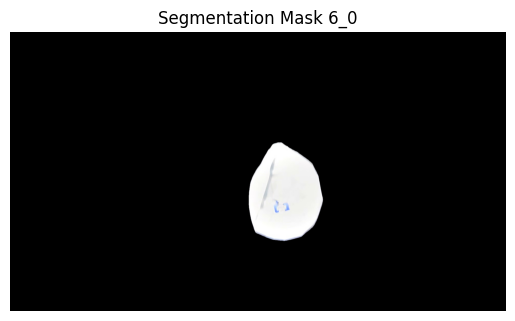

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_11.png


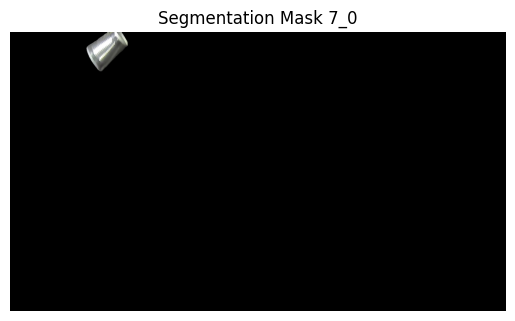

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_9.png


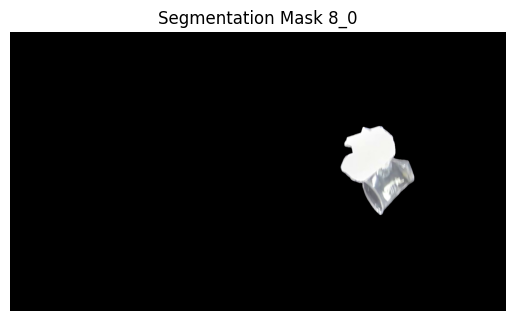

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_6.png


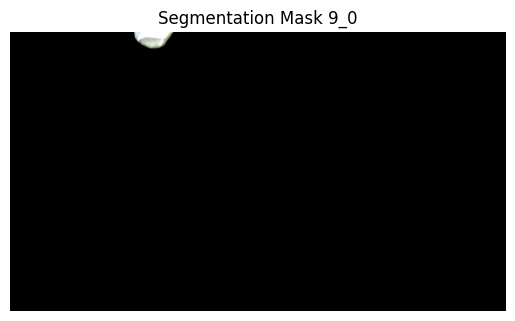

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_6.png


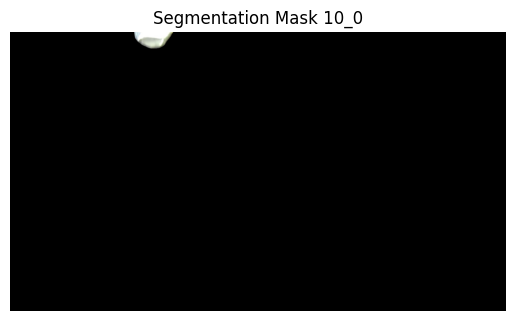

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_4.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


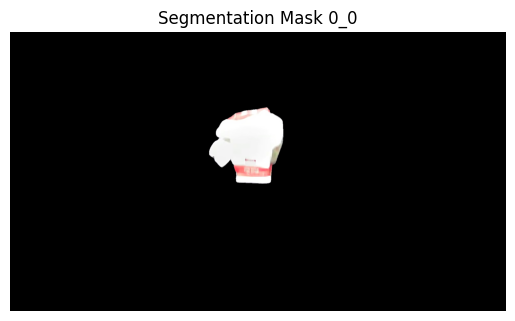

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_22.png


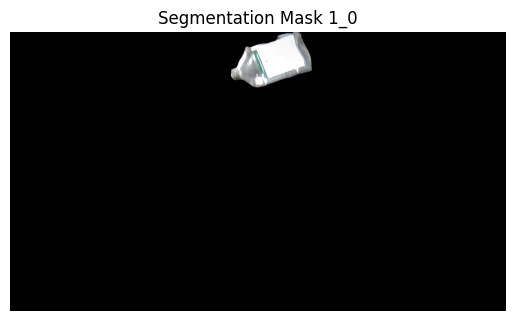

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_21.png


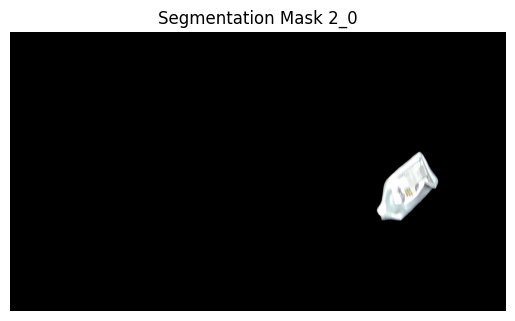

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_20.png


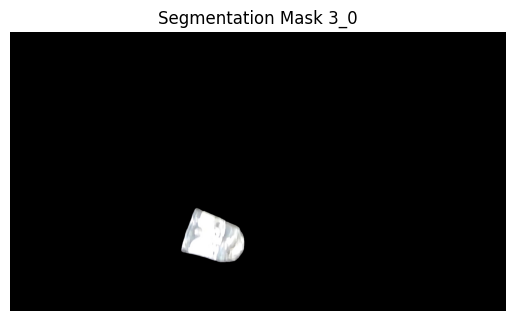

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_17.png


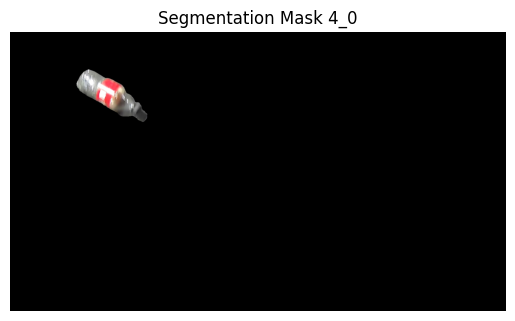

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_14.png


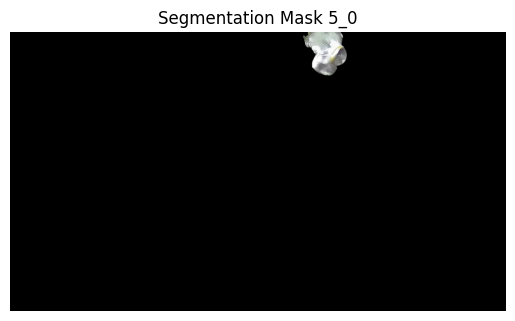

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_14.png


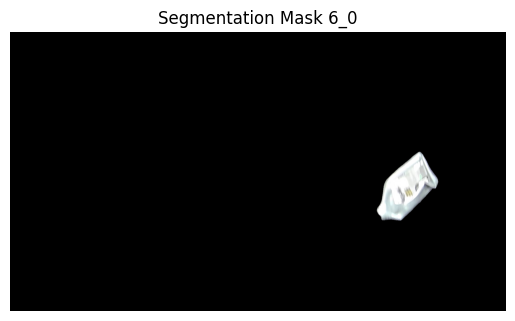

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_12.png


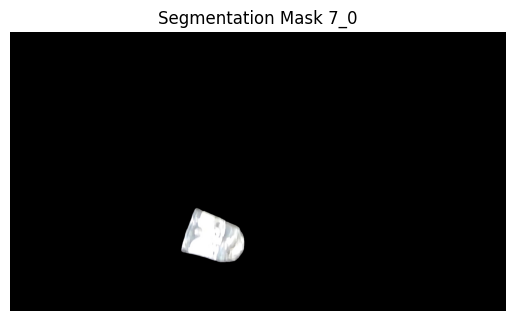

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_10.png


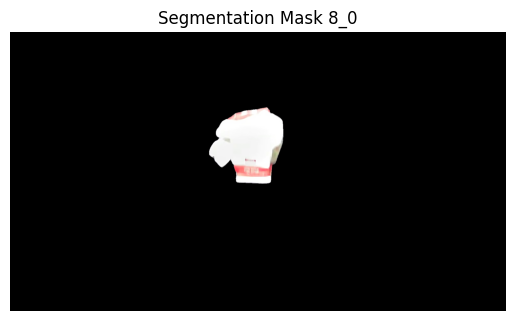

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_7.png


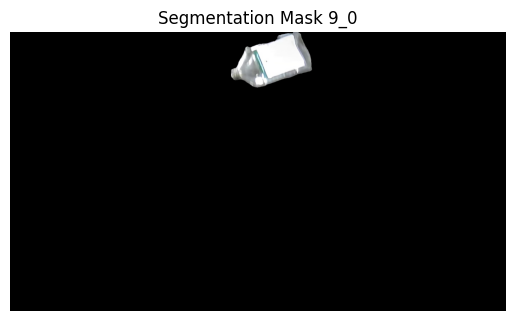

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_7.png


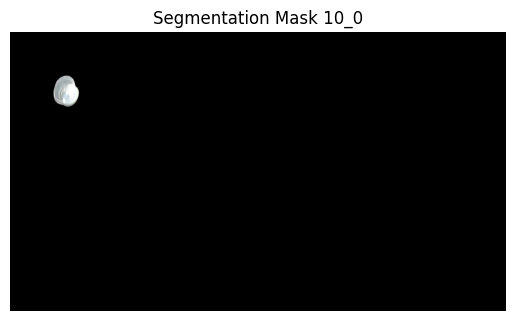

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_5.png


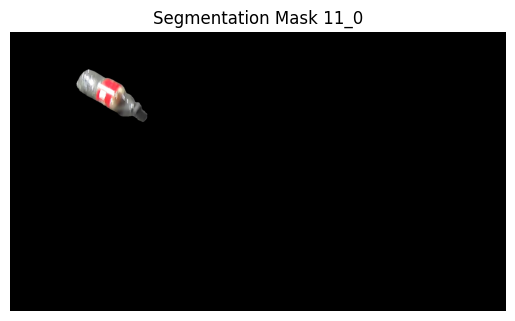

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_3.png


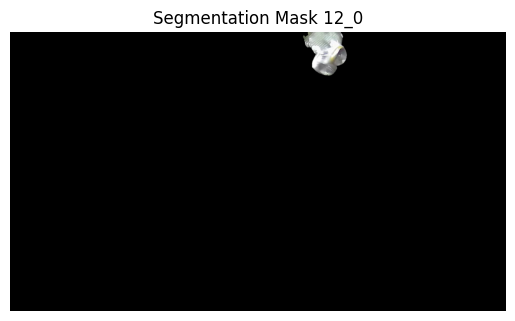

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_2.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


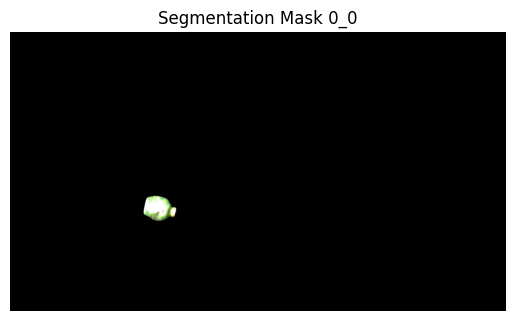

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_23.png


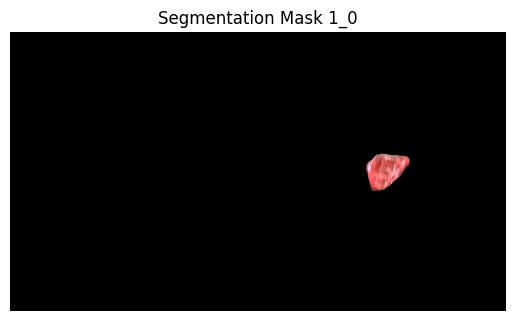

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_22.png


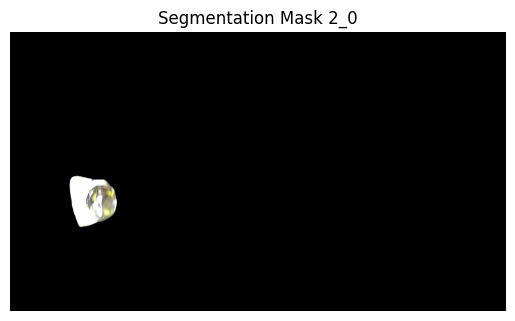

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_21.png


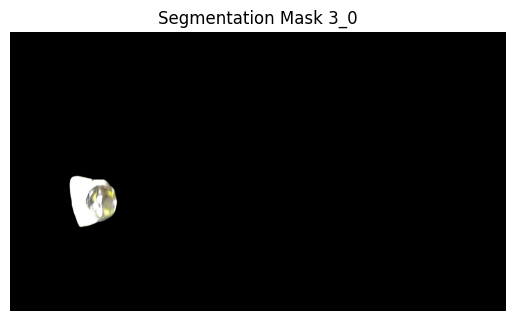

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_18.png


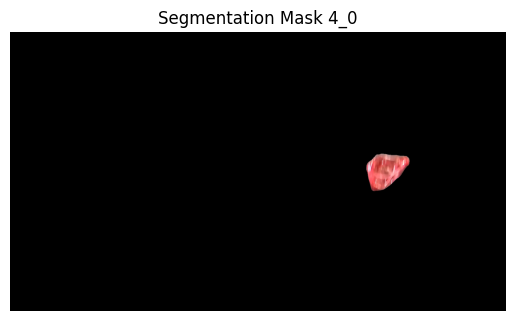

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_15.png


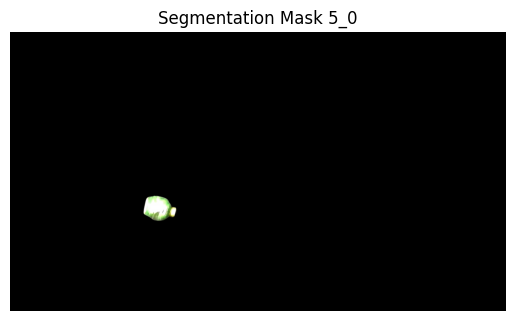

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_15.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


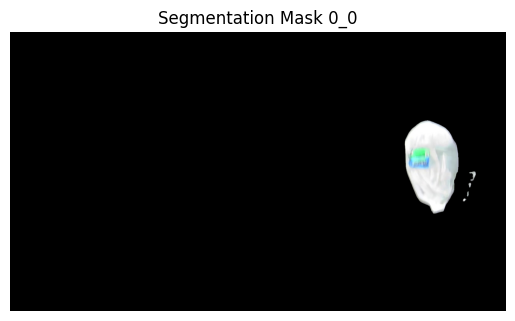

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_24.png


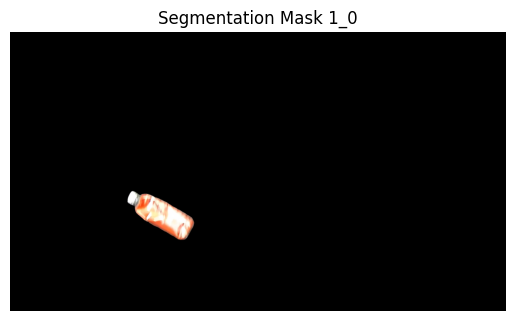

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_23.png


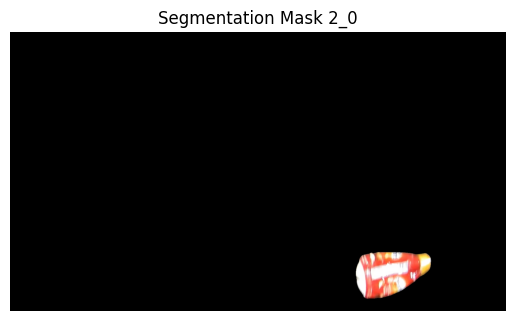

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_22.png


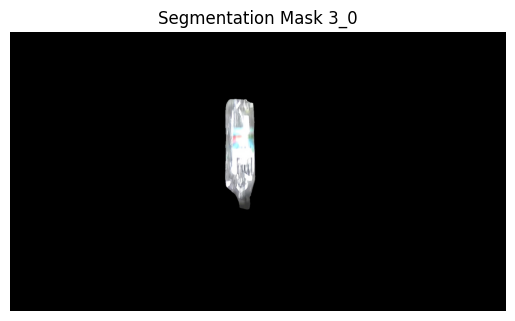

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_19.png


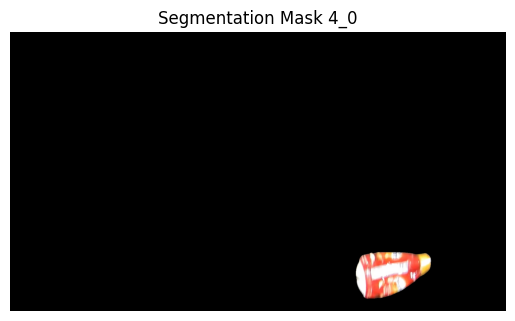

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_16.png


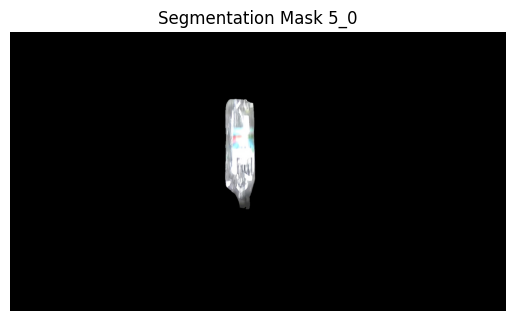

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_16.png


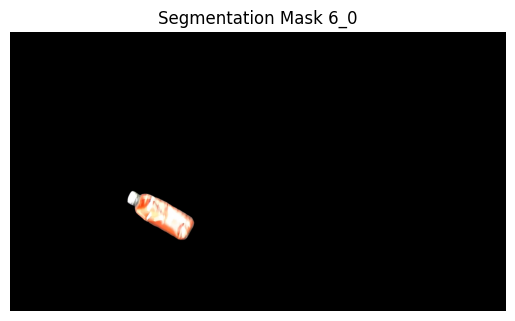

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_13.png


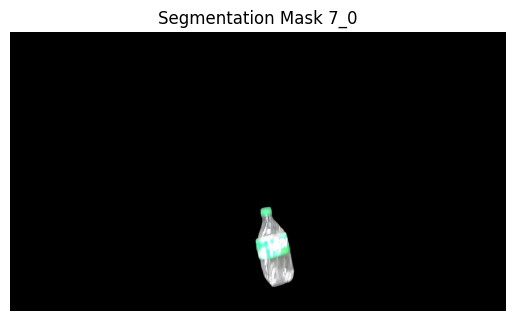

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_11.png


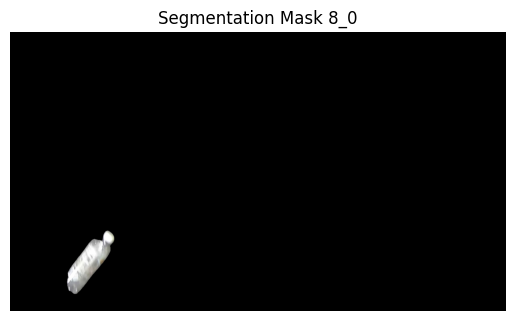

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_8.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


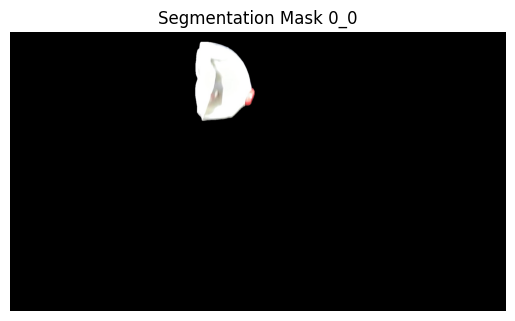

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_25.png


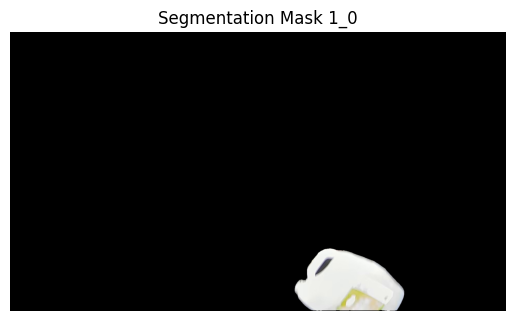

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_24.png


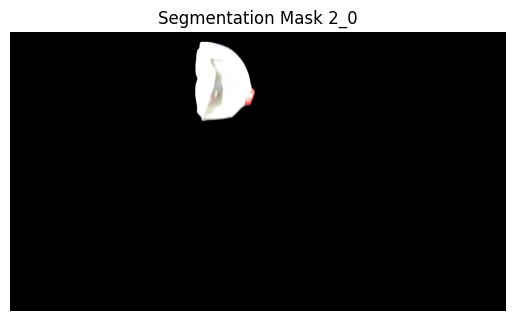

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_23.png


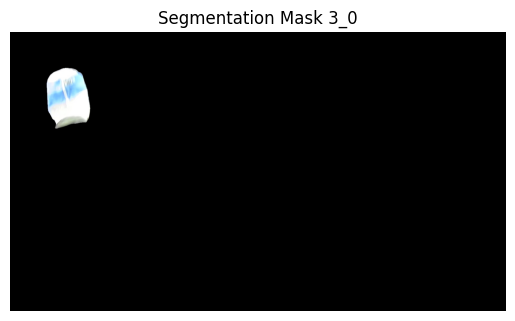

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_20.png


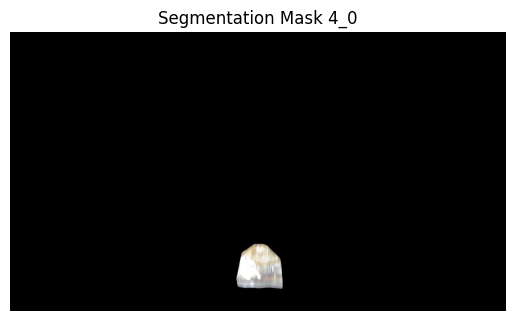

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_17.png


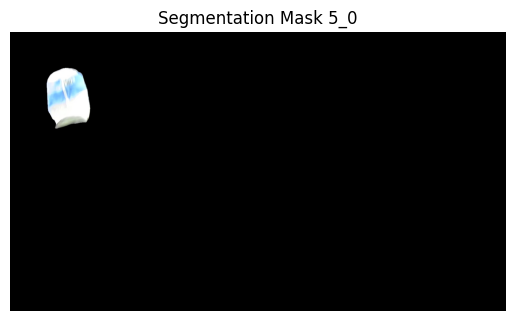

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_17.png


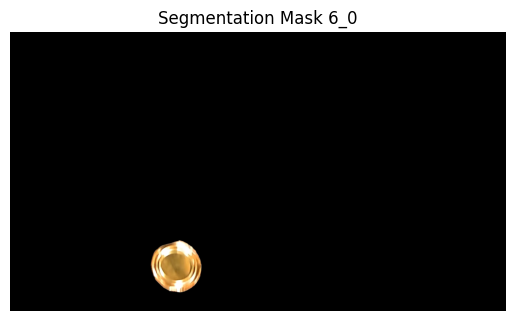

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_14.png


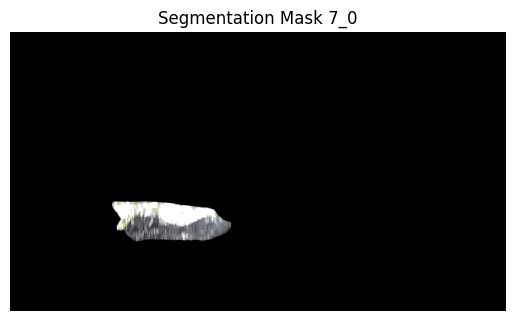

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_12.png


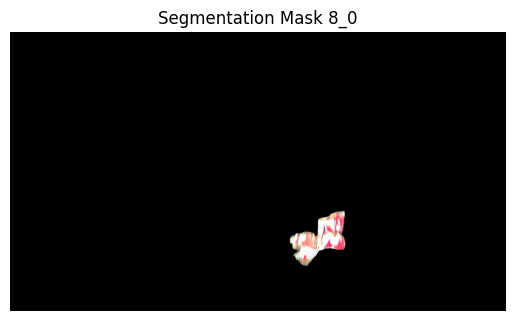

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_9.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


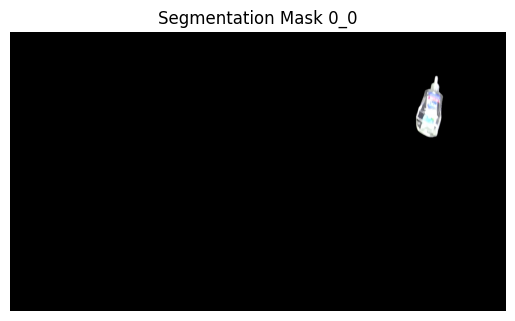

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_26.png


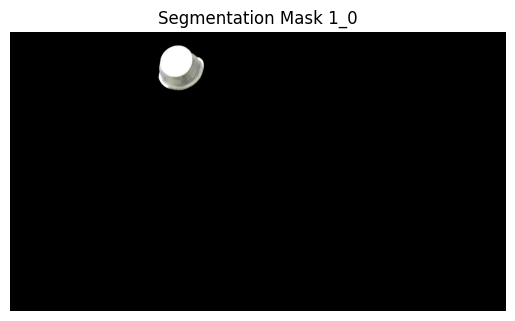

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_25.png


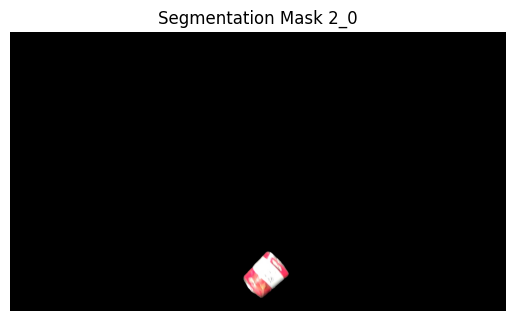

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_24.png


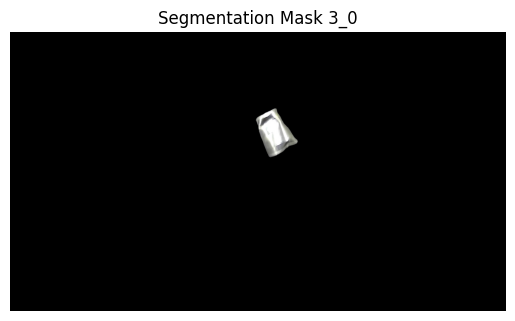

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_21.png


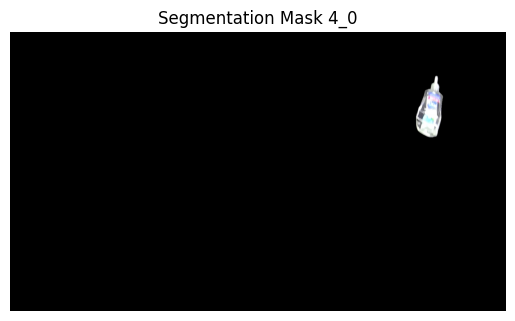

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_18.png


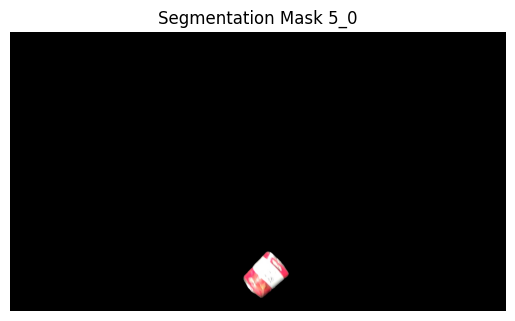

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_18.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


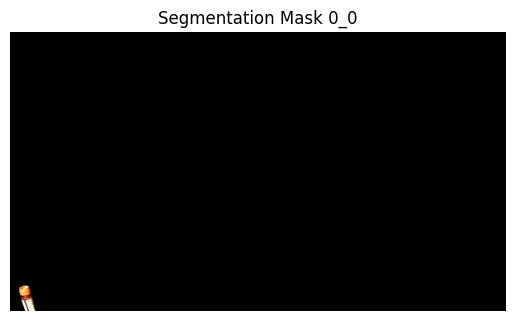

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_27.png


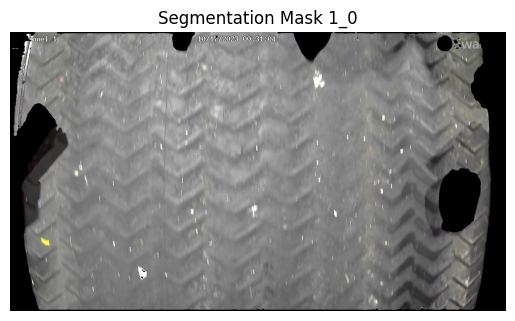

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_26.png


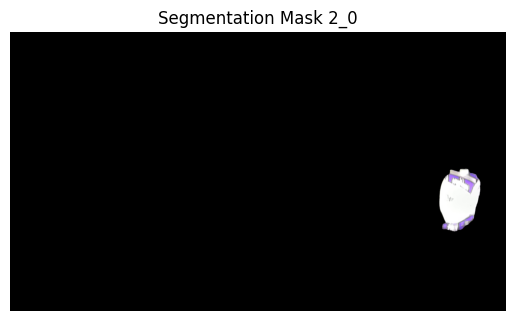

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_25.png


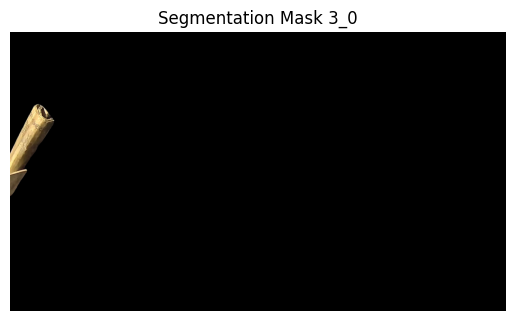

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_22.png


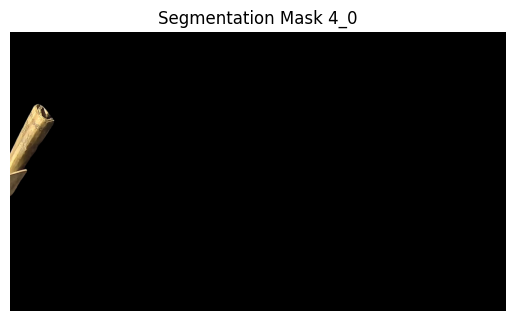

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_19.png


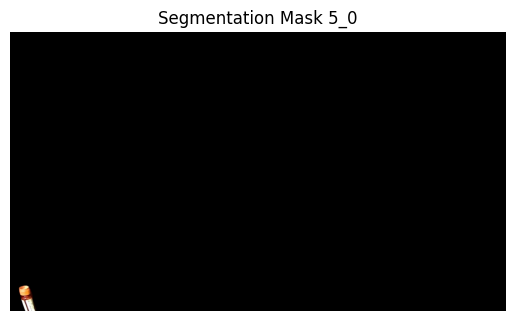

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_19.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


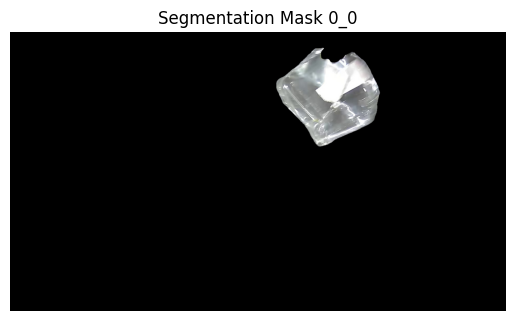

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_28.png


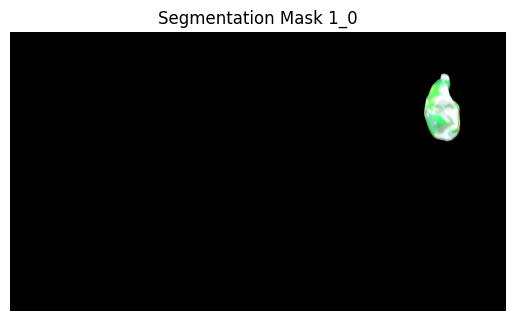

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_27.png


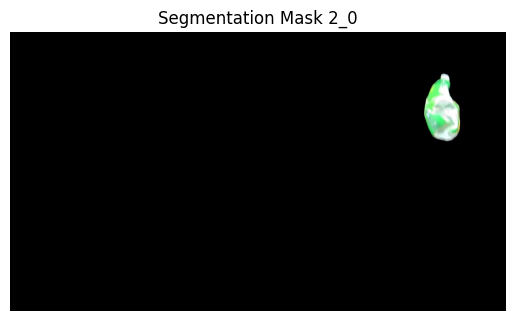

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_26.png


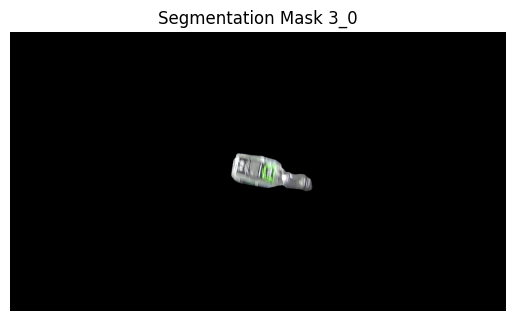

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_23.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


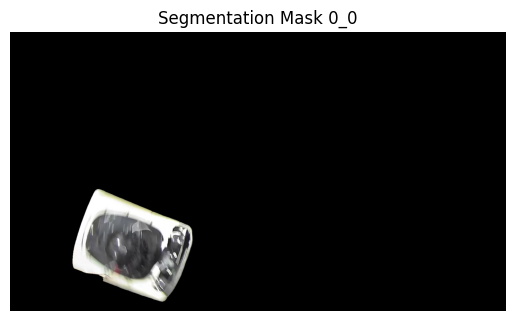

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_29.png


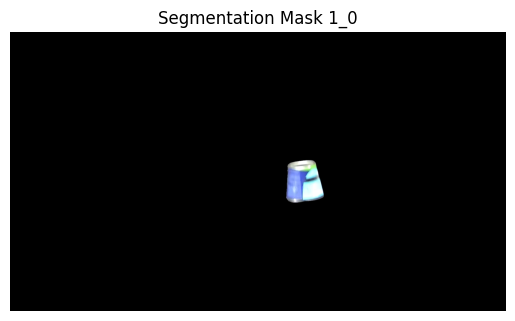

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_28.png


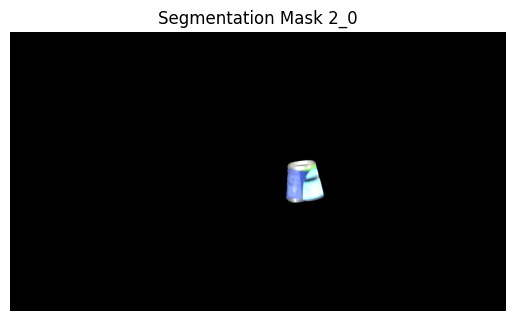

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_27.png


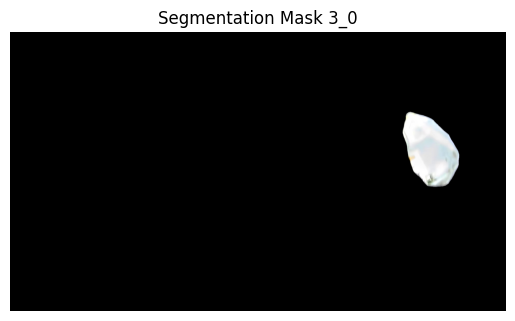

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_24.png


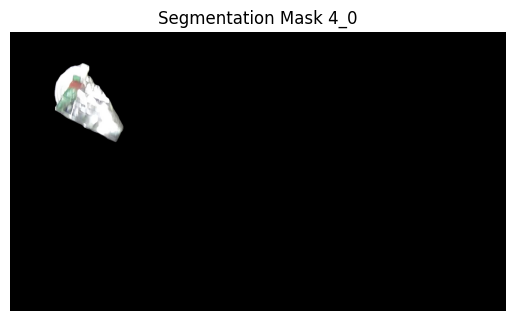

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_20.png


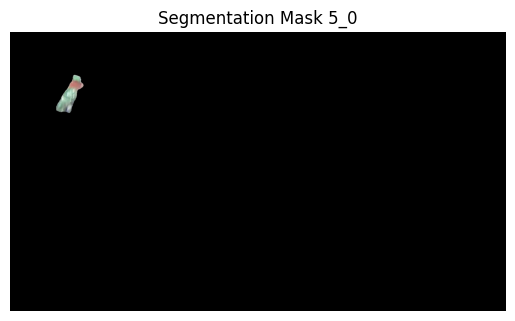

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_20.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


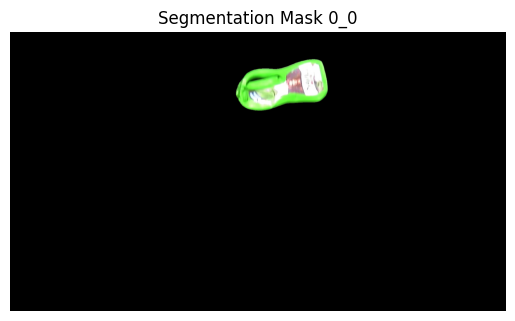

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_30.png


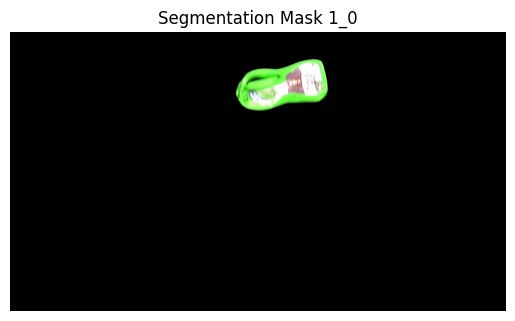

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_29.png


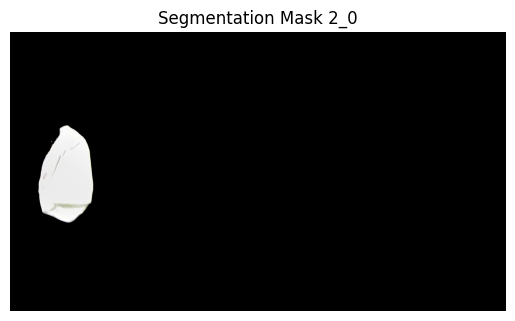

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_28.png


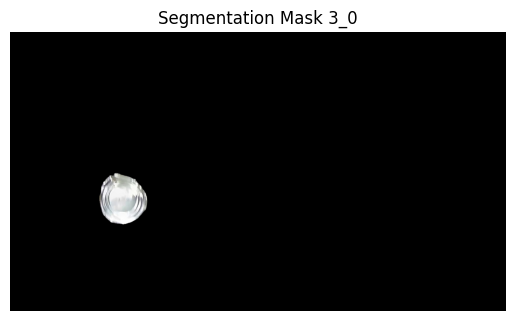

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_25.png


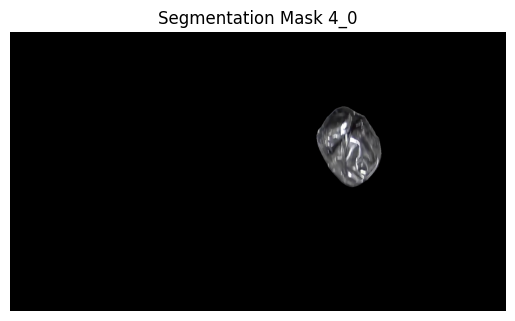

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_21.png


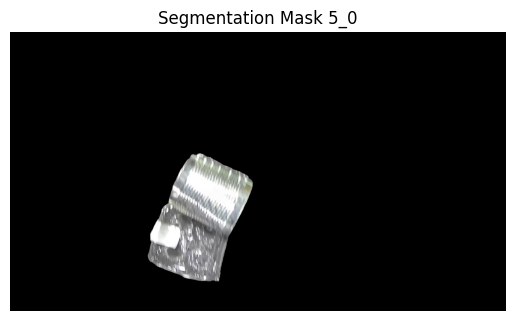

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_21.png


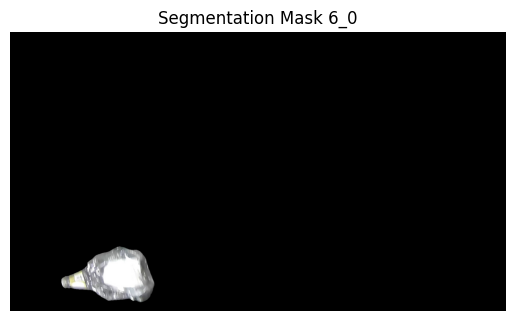

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_15.png


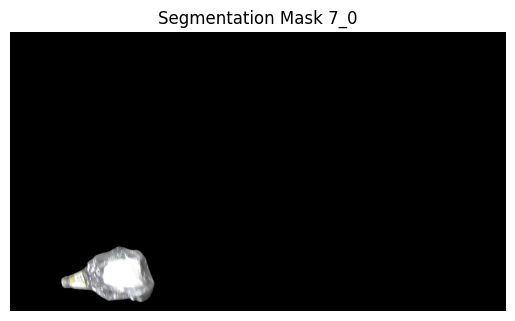

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_13.png


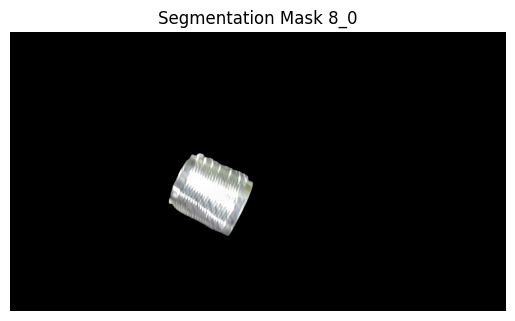

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_10.png


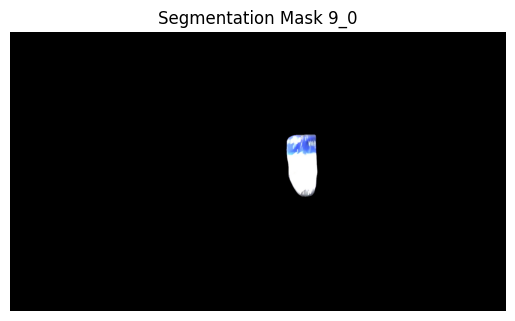

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_8.png


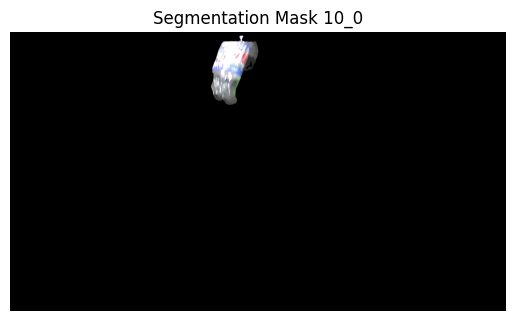

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_6.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


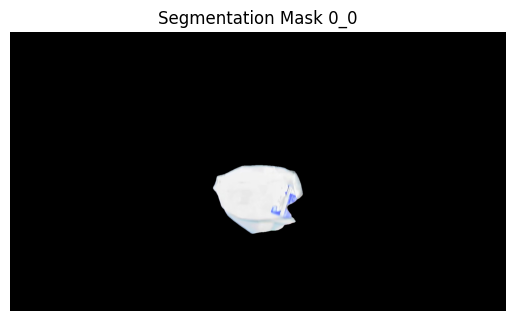

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_31.png


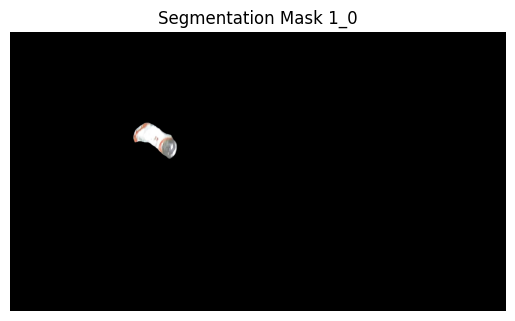

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_30.png


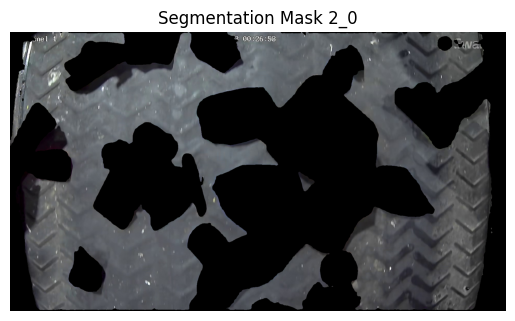

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_29.png


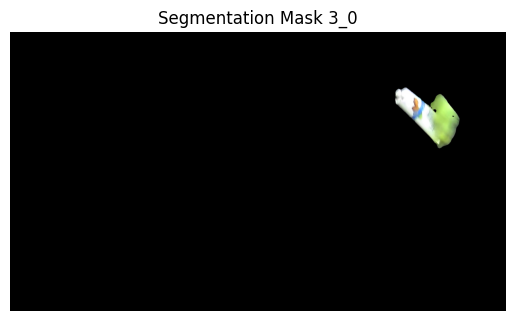

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_26.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


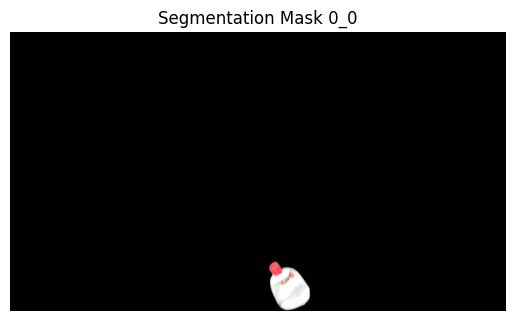

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_32.png


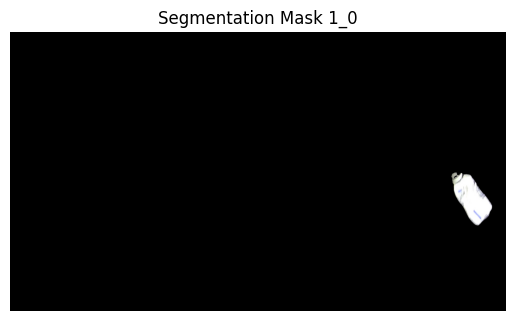

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_31.png


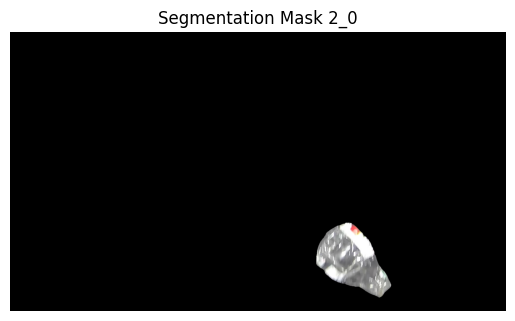

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_30.png


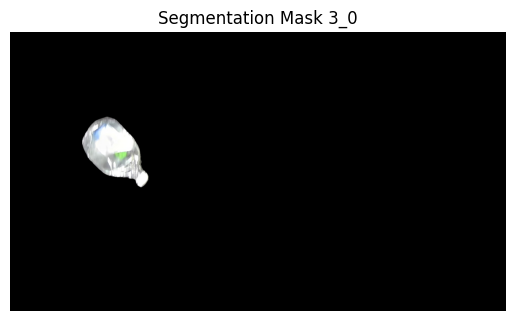

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_27.png


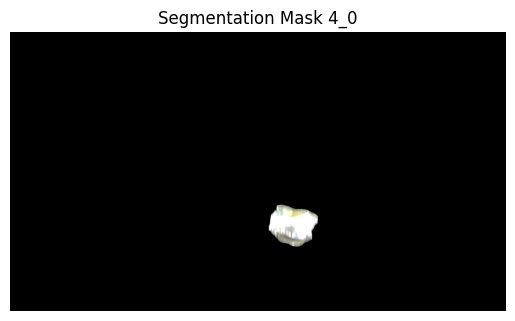

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_22.png


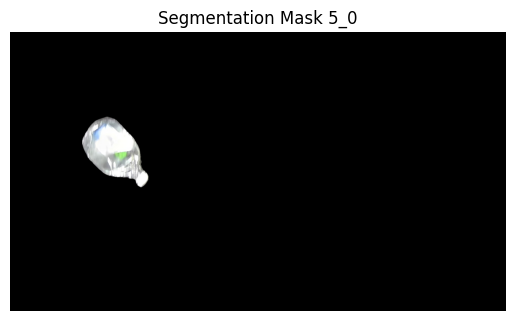

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_22.png


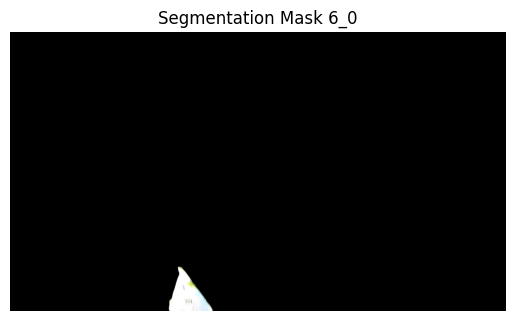

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_16.png


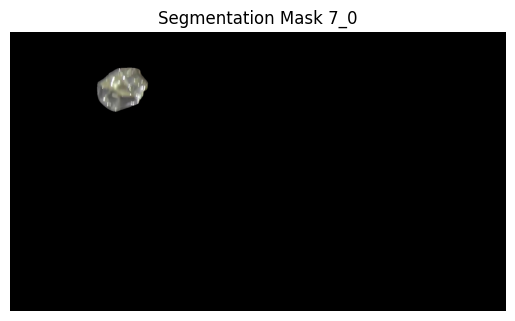

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_14.png


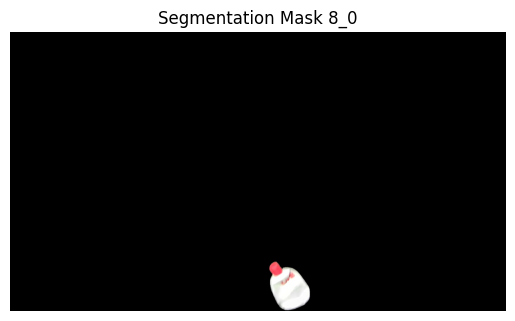

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_11.png


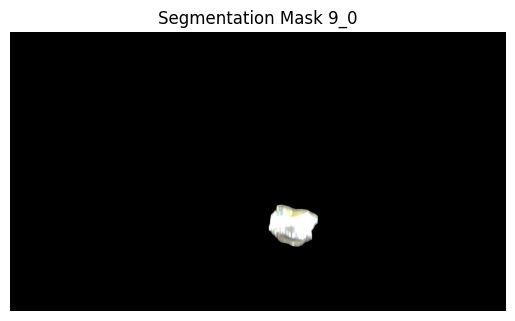

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_9.png


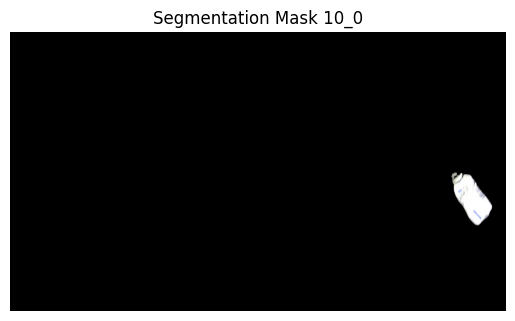

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_7.png


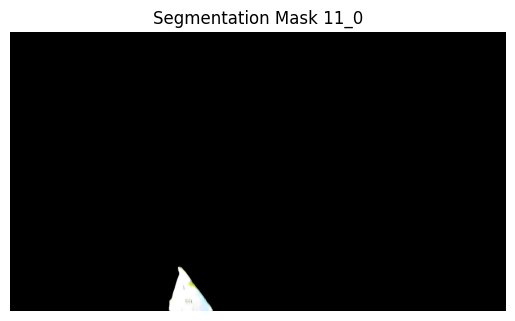

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_4.png


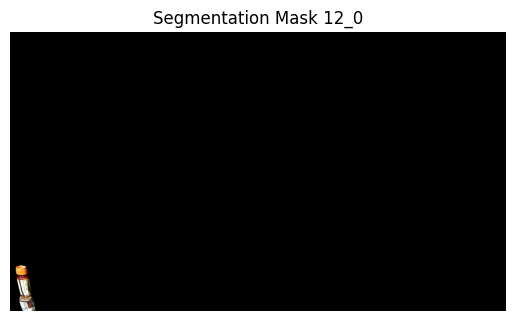

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_3.png


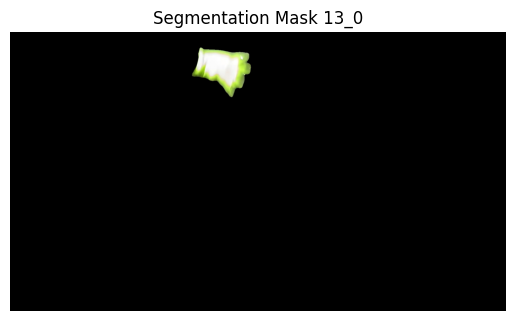

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_2.png


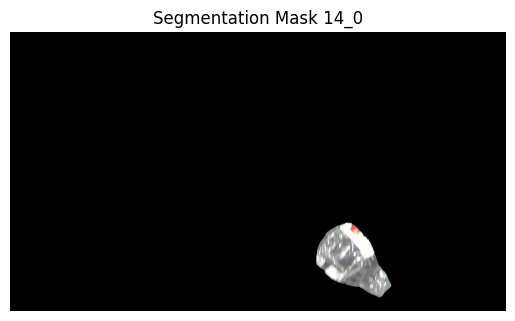

Segmentation mask 14_0 saved as /content/rando4/segmentation_mask_14_0_1.png


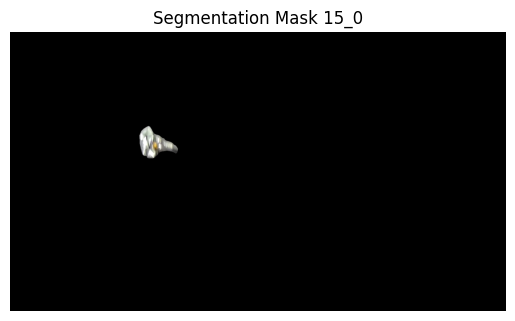

Segmentation mask 15_0 saved as /content/rando4/segmentation_mask_15_0_1.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


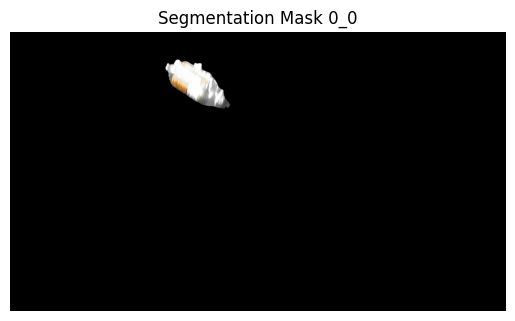

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_33.png


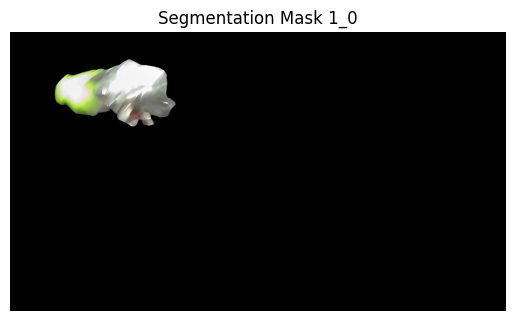

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_32.png


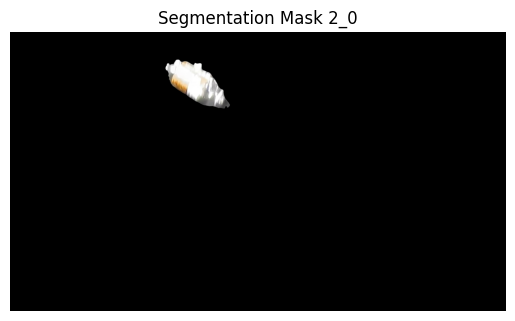

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_31.png


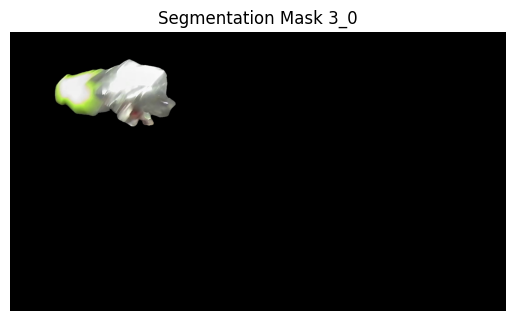

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_28.png


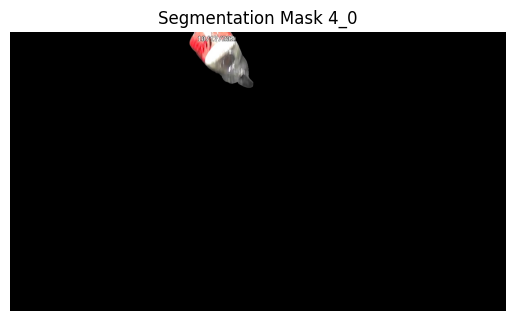

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_23.png


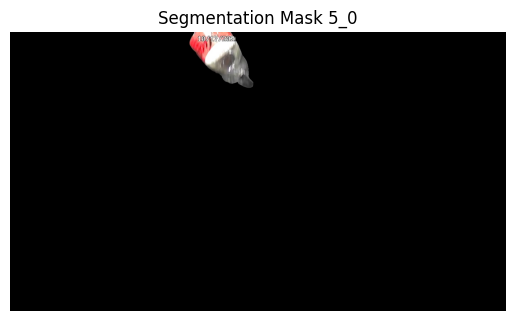

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_23.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


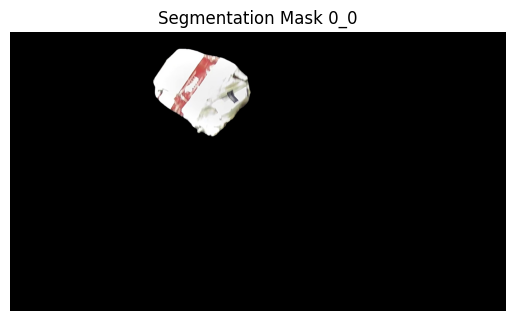

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_34.png


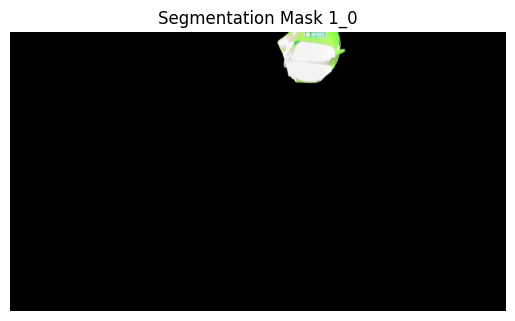

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_33.png


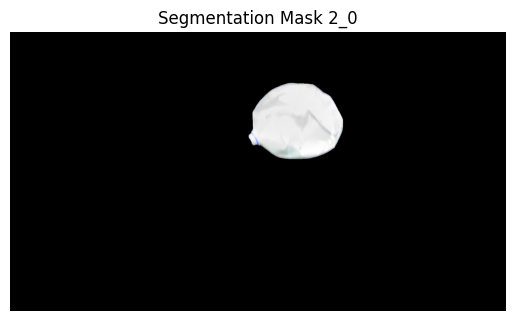

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_32.png


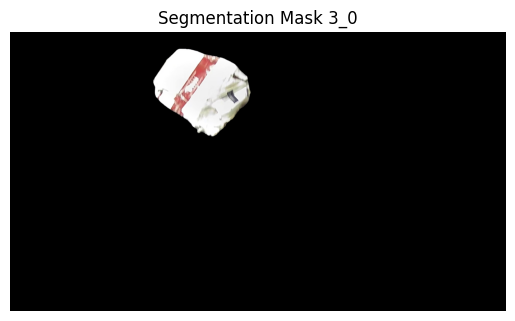

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_29.png


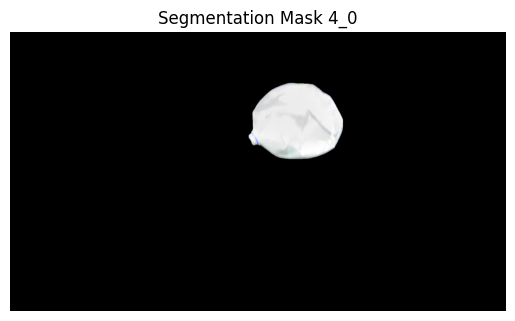

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_24.png


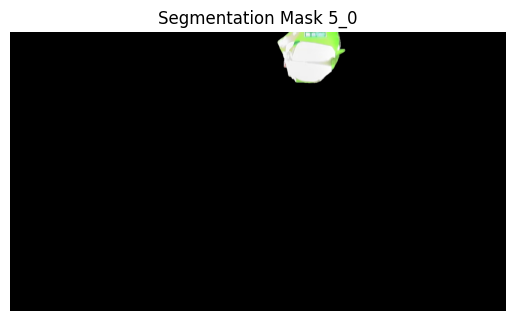

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_24.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


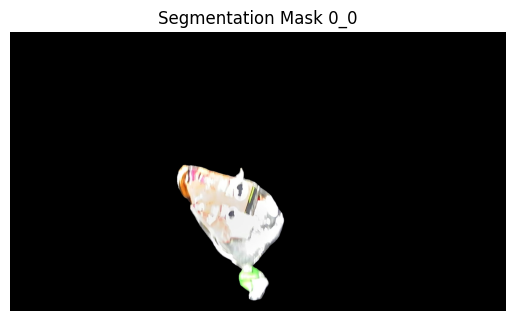

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_35.png


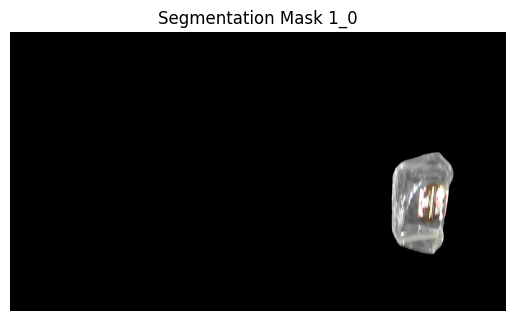

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_34.png


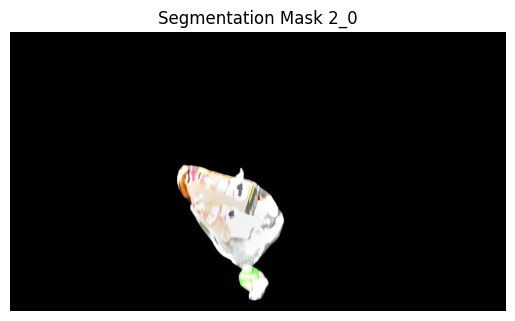

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_33.png


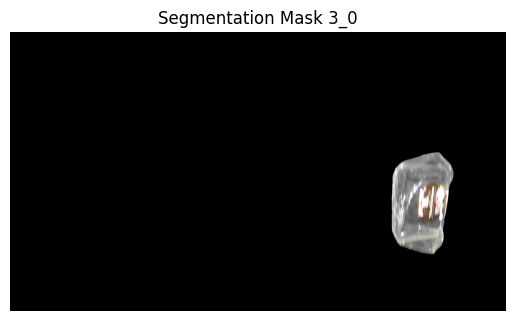

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_30.png


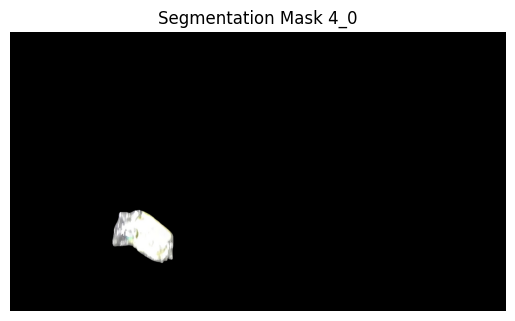

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_25.png


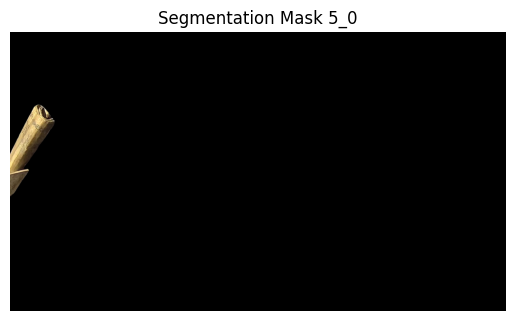

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_25.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


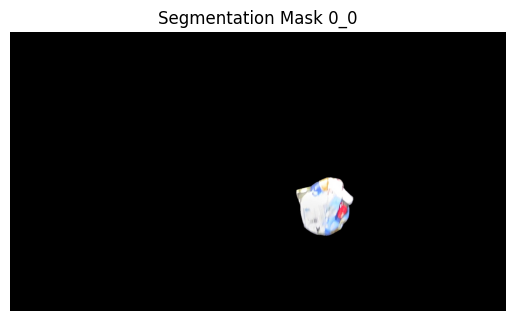

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_36.png


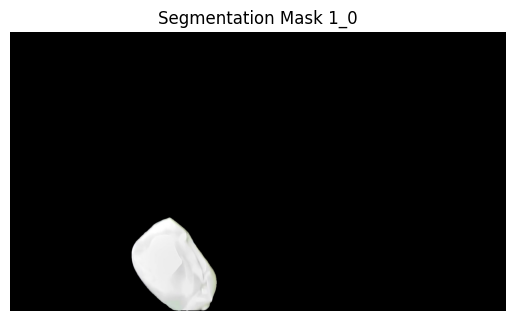

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_35.png


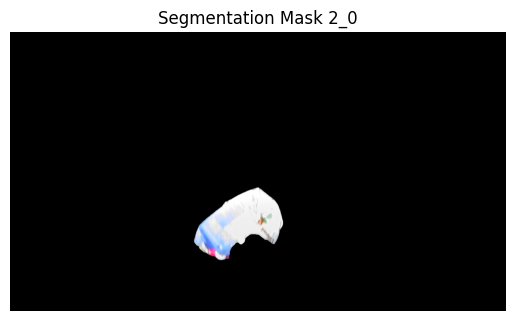

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_34.png


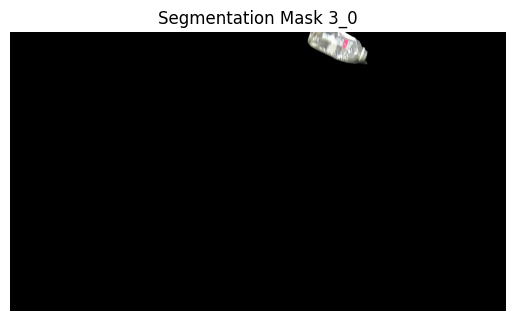

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_31.png


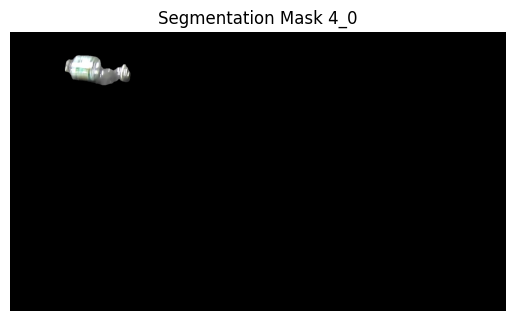

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_26.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


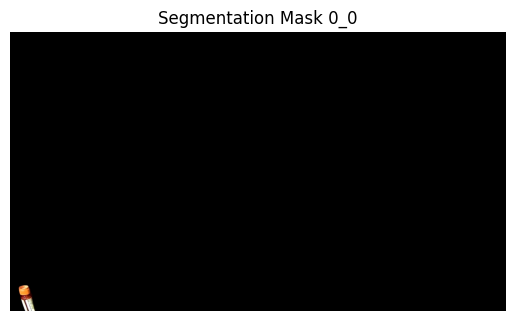

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_37.png


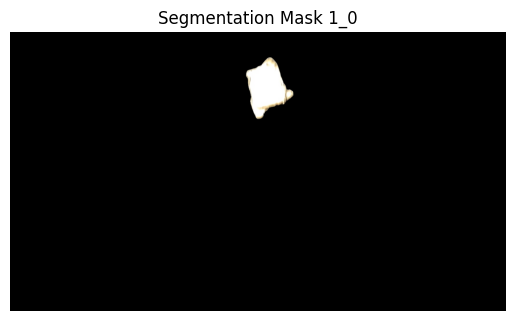

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_36.png


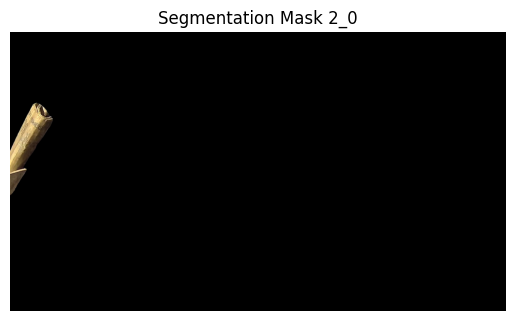

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_35.png


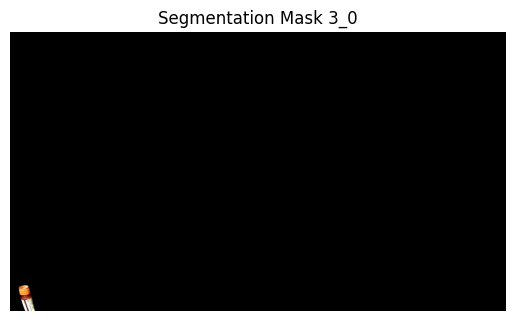

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_32.png


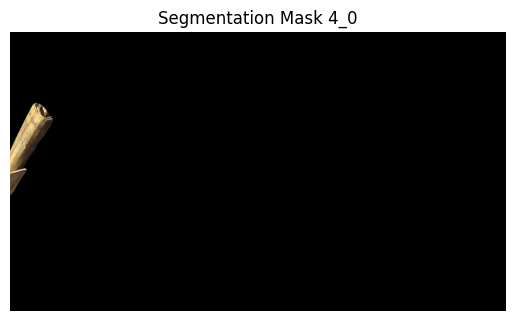

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_27.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


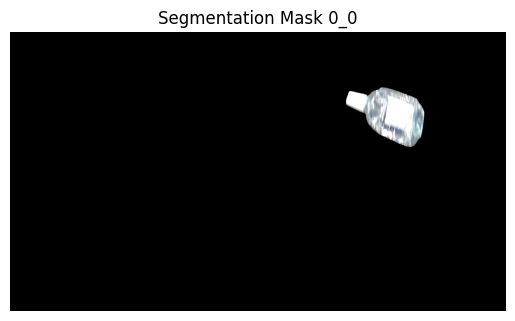

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_38.png


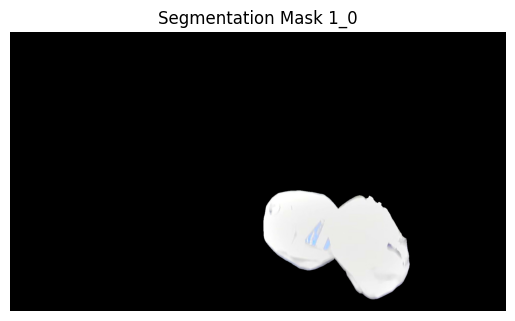

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_37.png


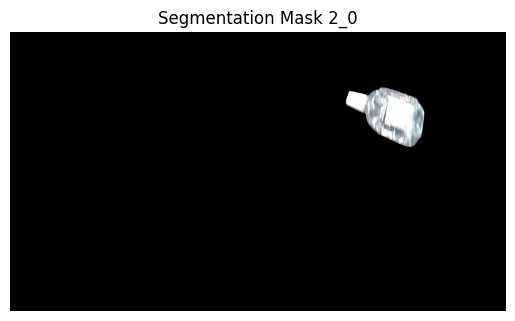

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_36.png


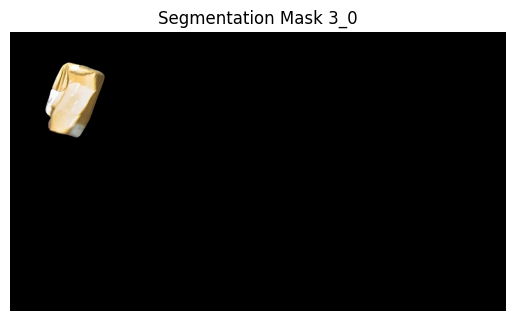

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_33.png


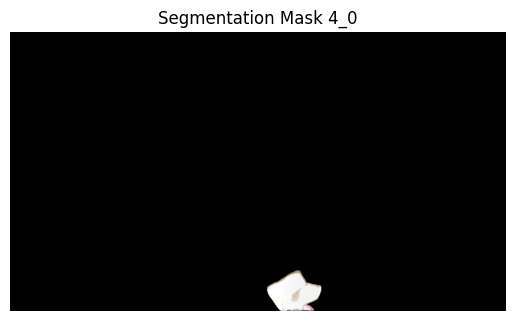

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_28.png


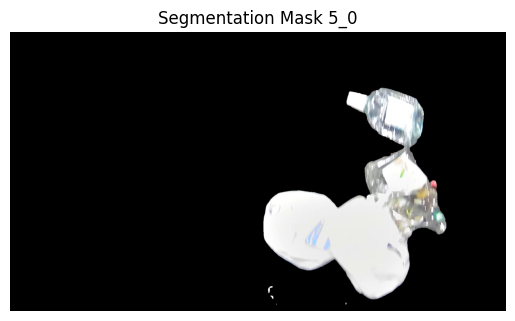

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_26.png


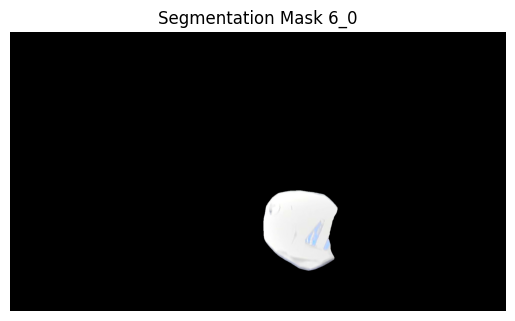

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_17.png


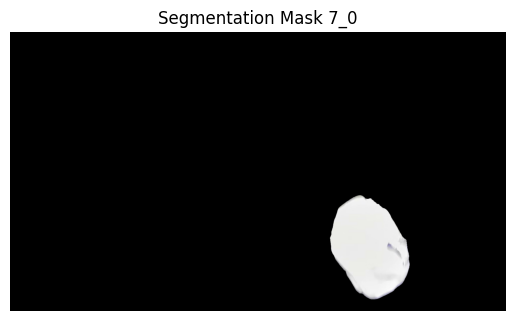

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_15.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


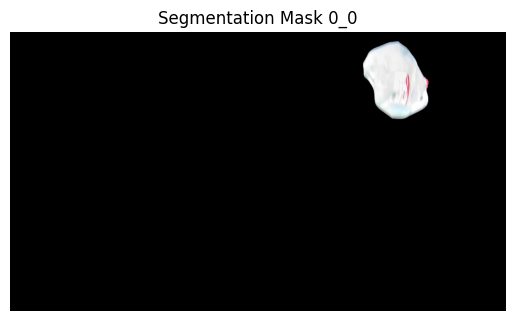

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_39.png


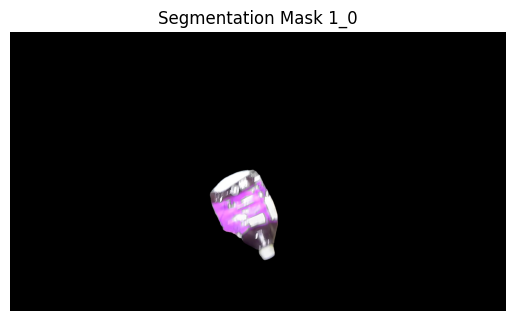

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_38.png


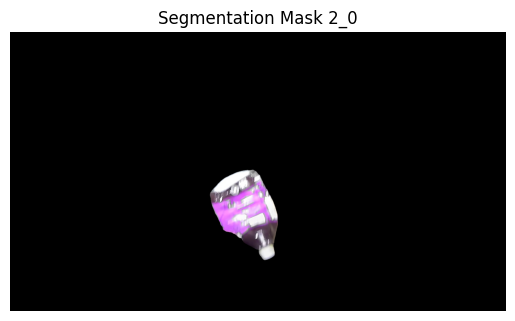

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_37.png


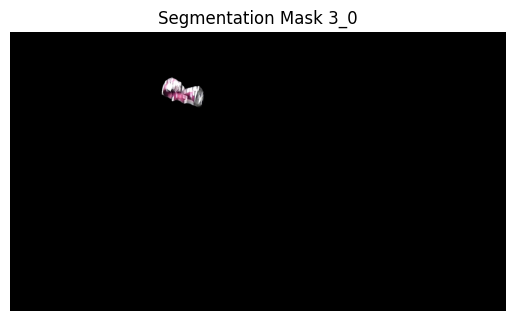

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_34.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


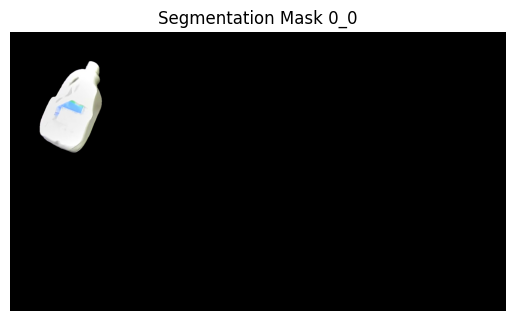

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_40.png


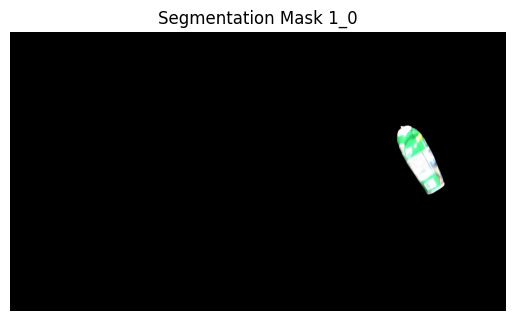

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_39.png


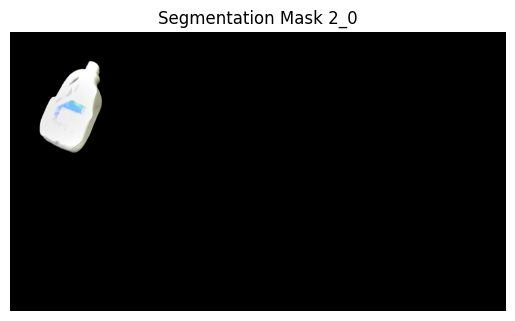

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_38.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


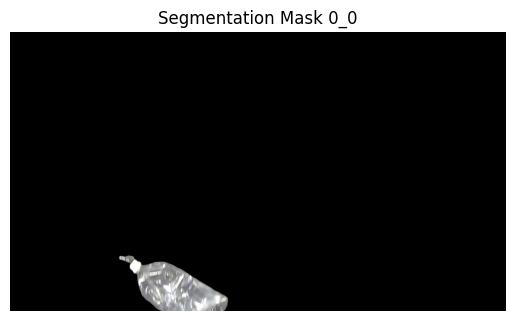

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_41.png


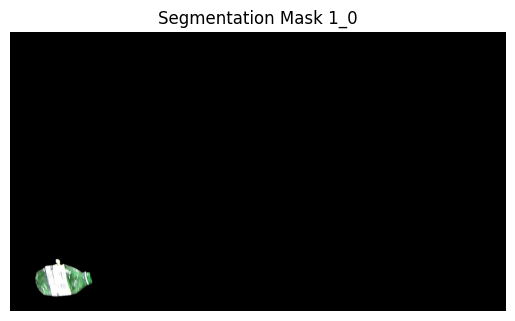

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_40.png


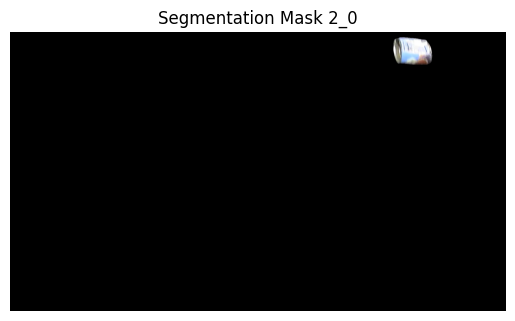

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_39.png


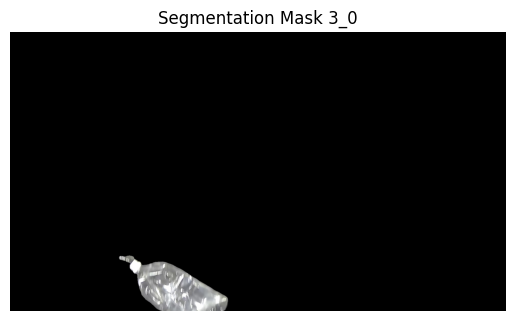

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_35.png


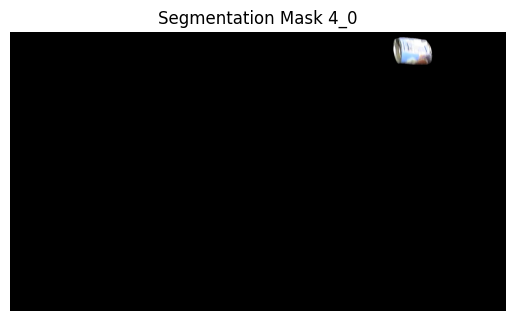

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_29.png


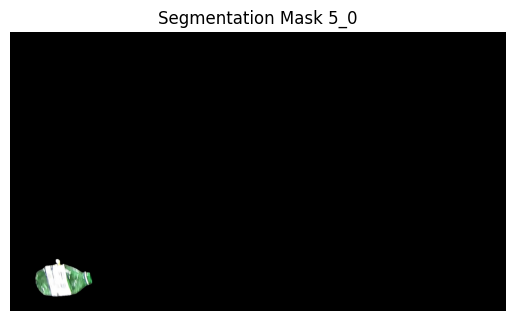

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_27.png


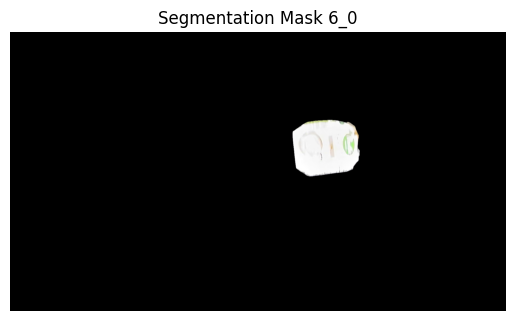

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_18.png


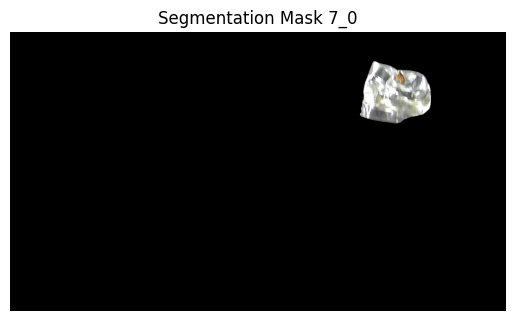

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_16.png


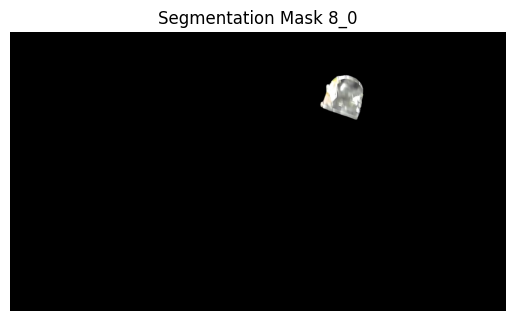

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_12.png


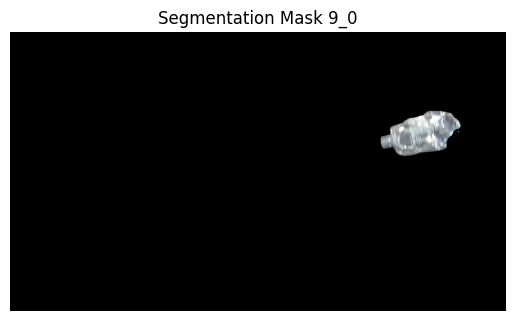

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_10.png


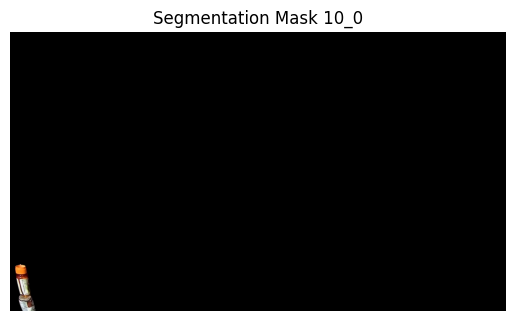

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_8.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


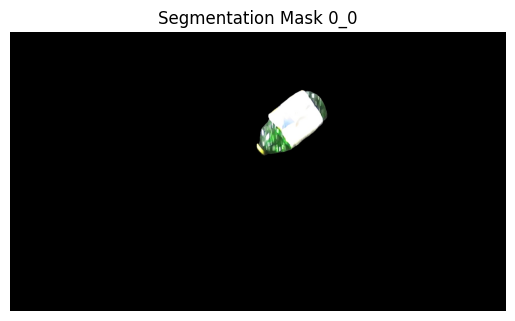

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_42.png


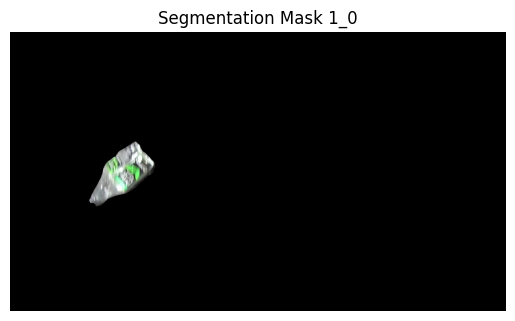

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_41.png


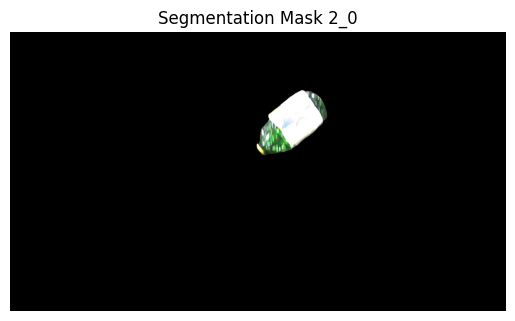

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_40.png


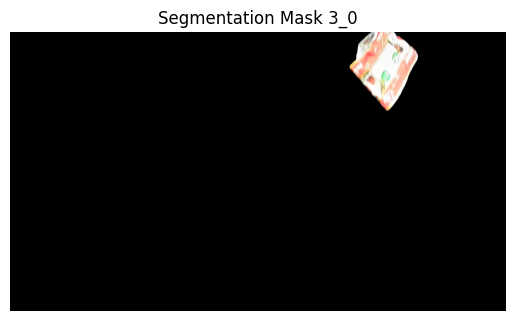

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_36.png


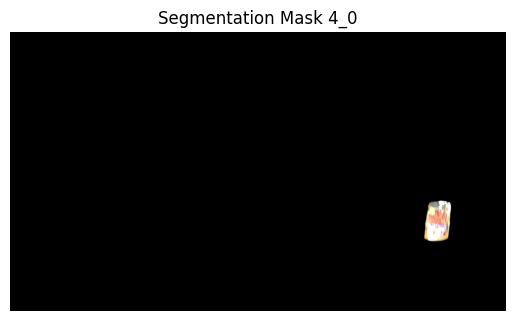

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_30.png


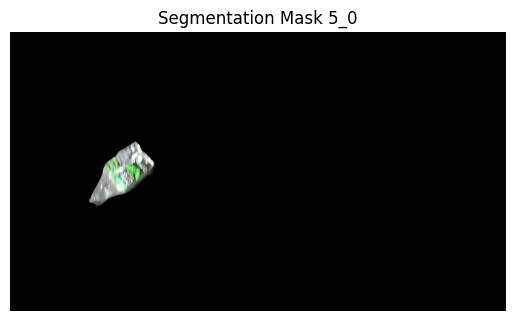

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_28.png


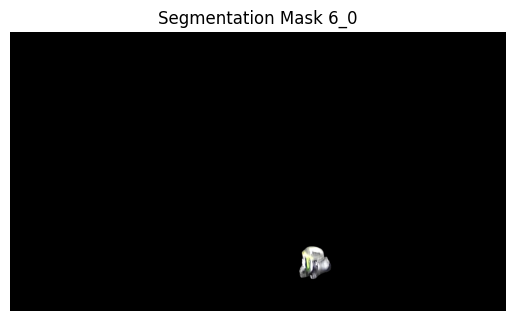

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_19.png


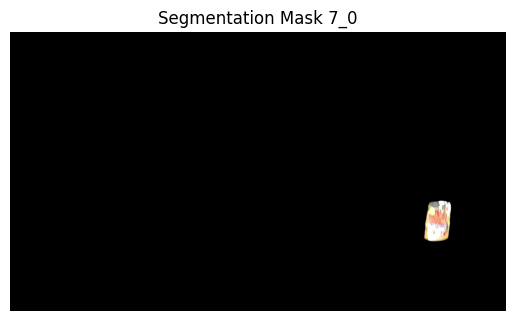

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_17.png


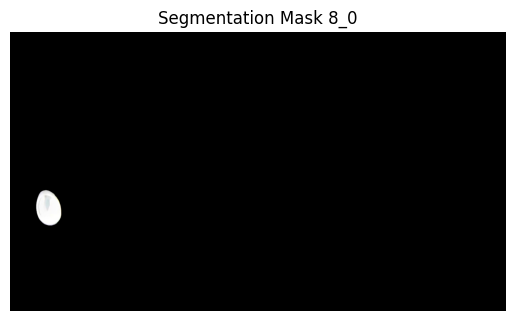

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_13.png


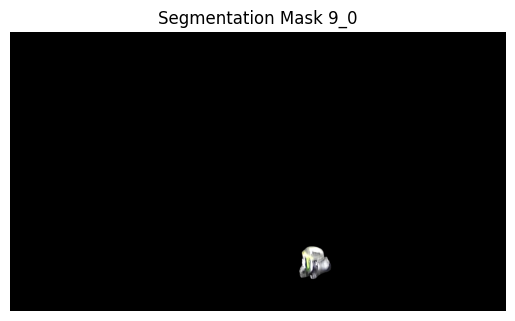

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_11.png


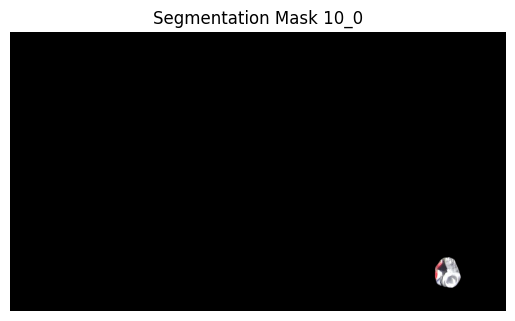

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_9.png


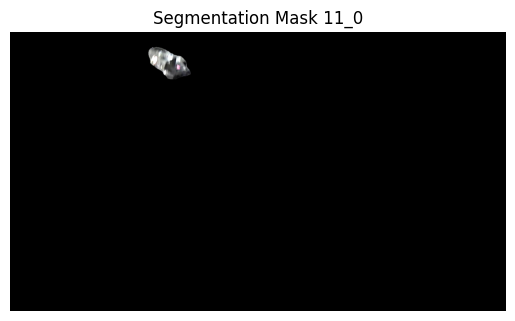

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_5.png


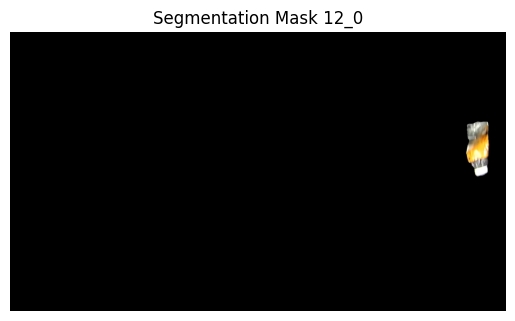

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_4.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


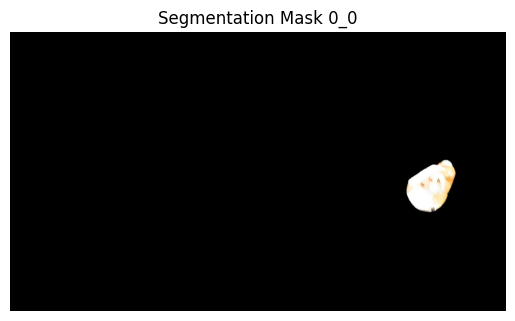

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_43.png


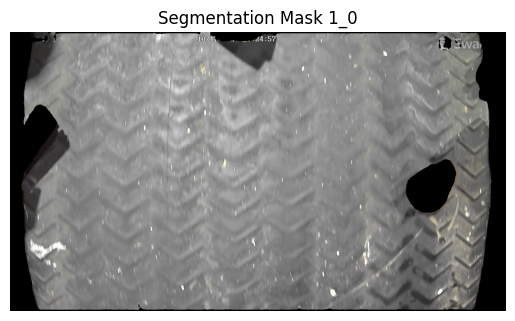

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_42.png


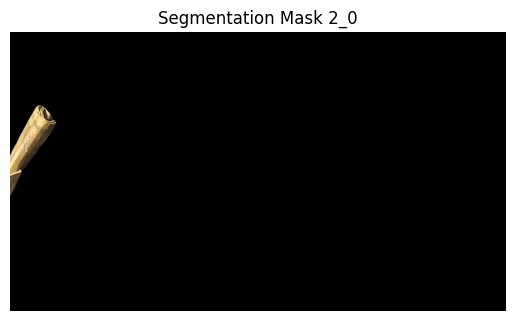

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_41.png


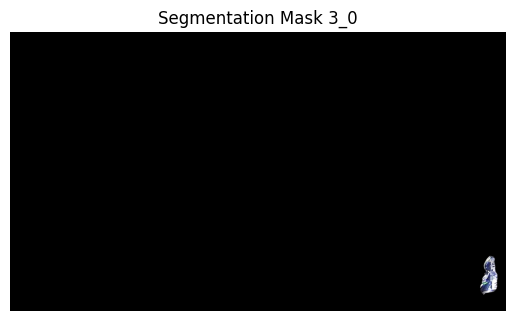

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_37.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


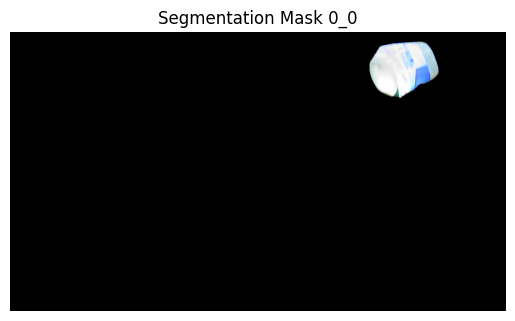

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_44.png


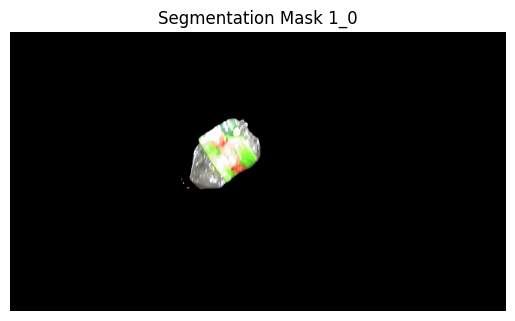

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_43.png


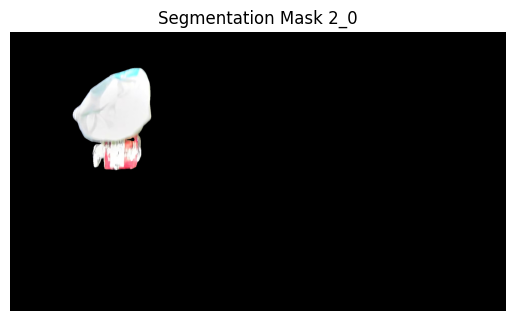

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_42.png


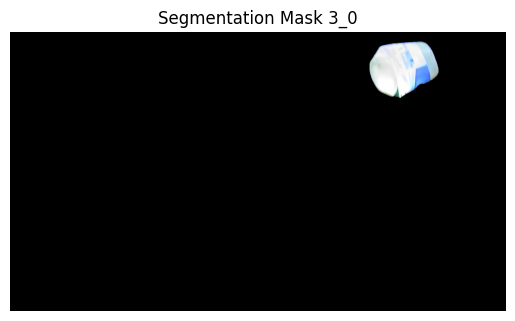

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_38.png


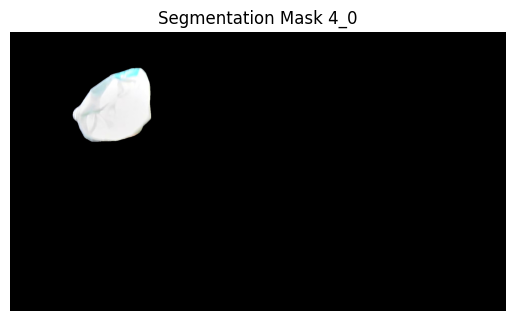

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_31.png


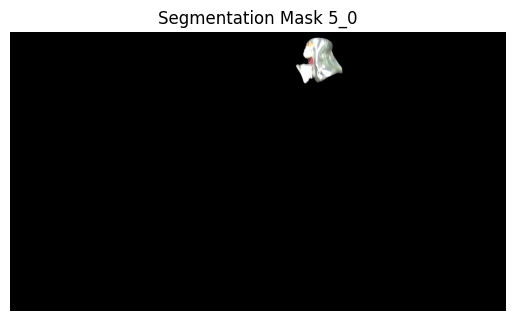

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_29.png


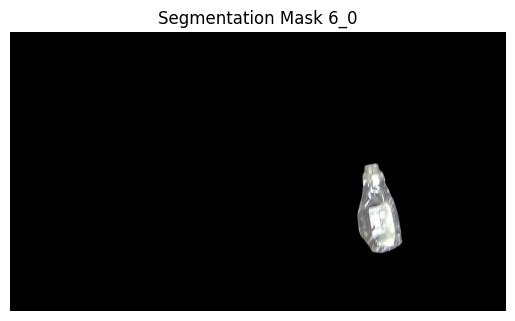

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_20.png


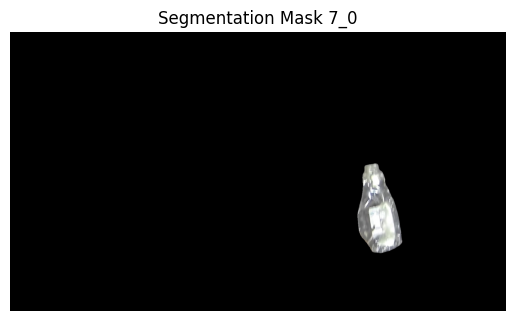

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_18.png


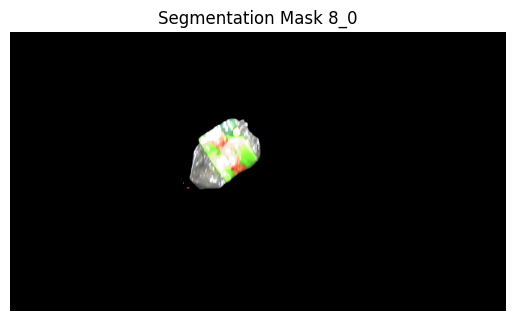

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_14.png


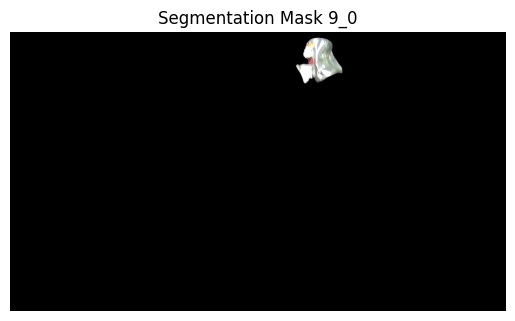

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_12.png


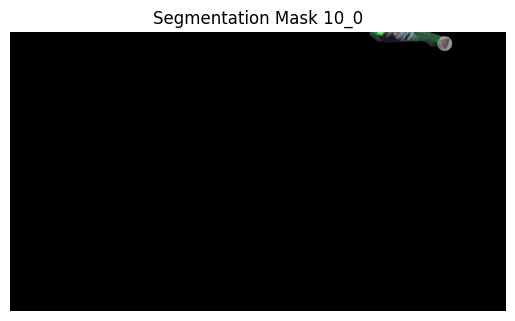

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_10.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


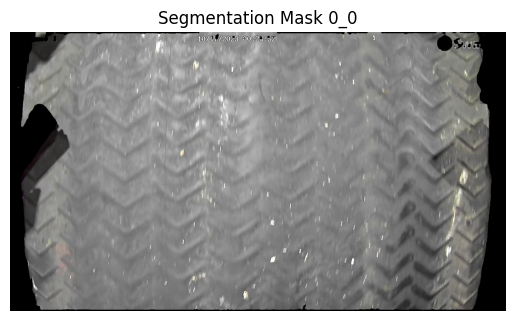

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_45.png


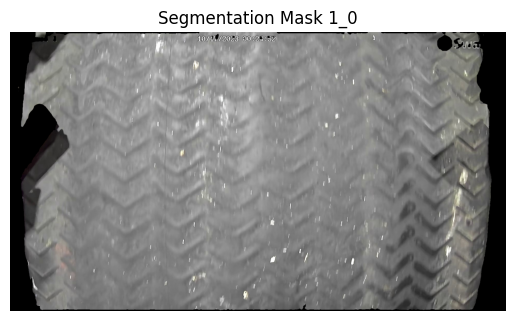

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_44.png


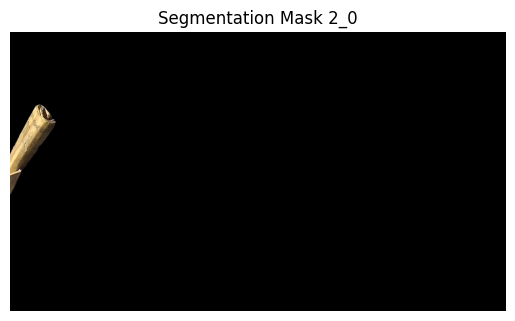

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_43.png


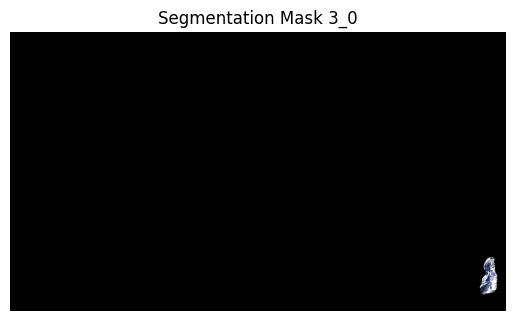

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_39.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


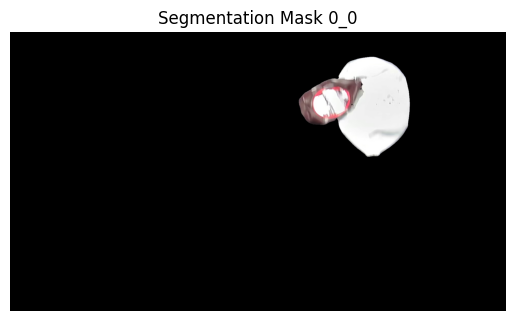

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_46.png


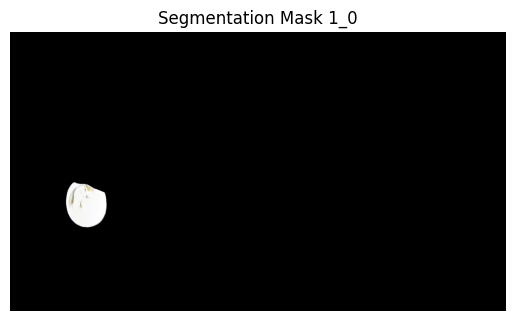

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_45.png


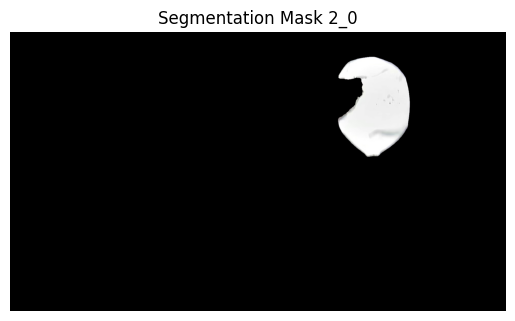

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_44.png


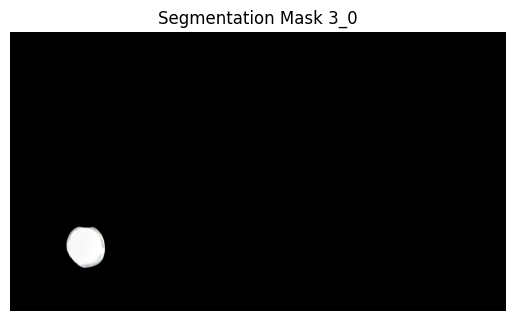

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_40.png


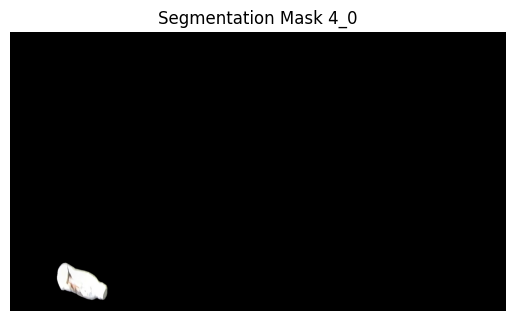

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_32.png


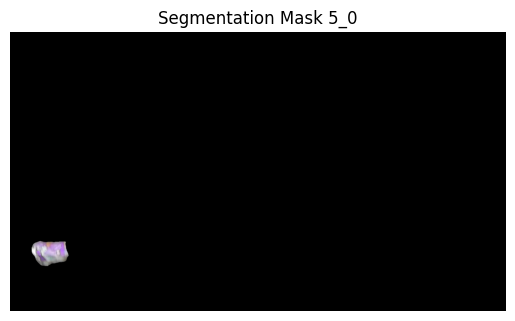

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_30.png


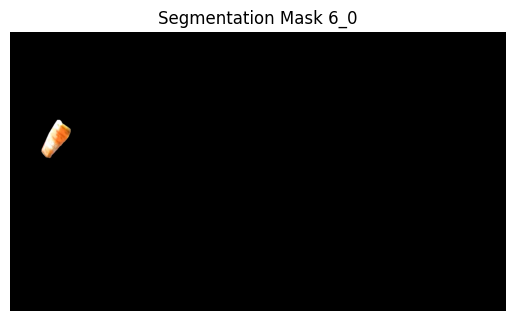

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_21.png


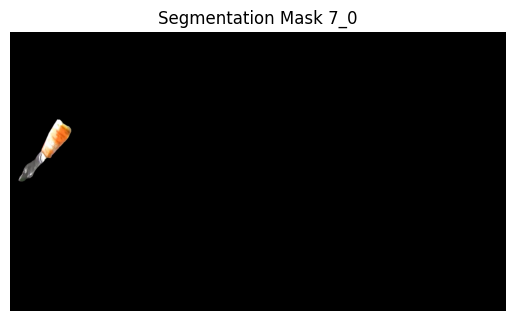

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_19.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


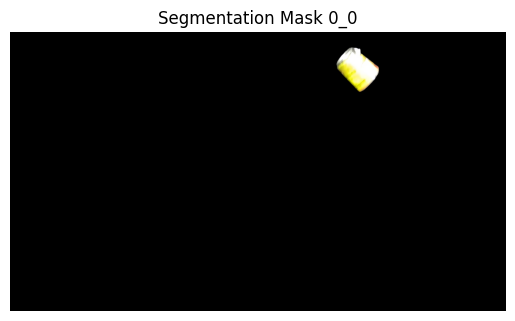

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_47.png


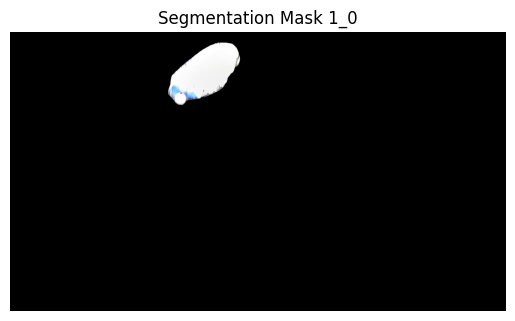

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_46.png


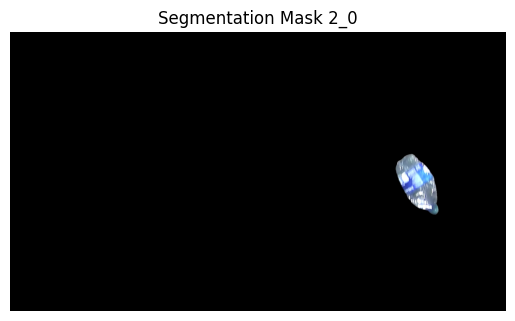

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_45.png


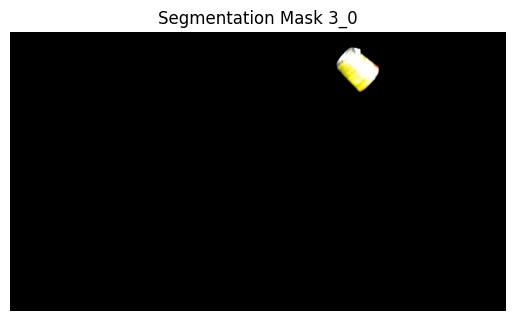

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_41.png


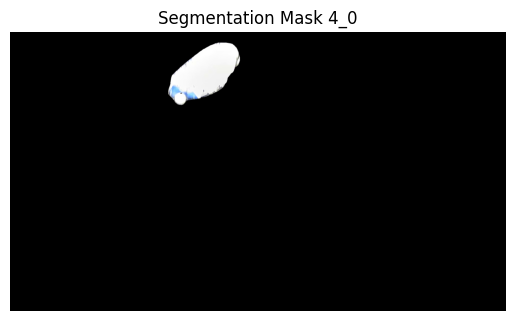

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_33.png


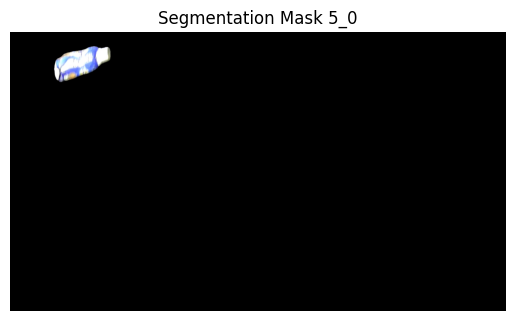

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_31.png


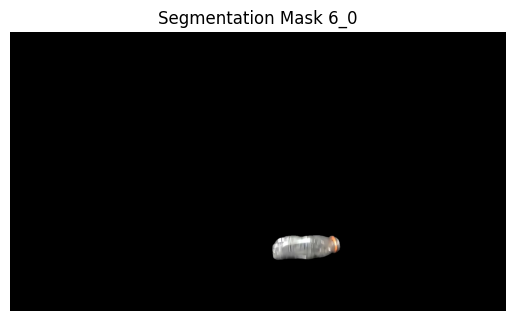

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_22.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


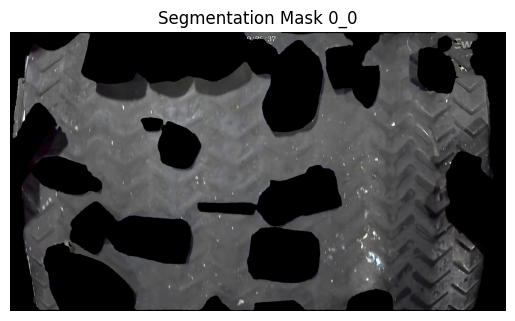

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_48.png


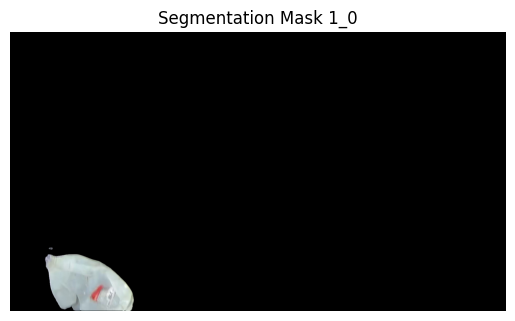

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_47.png


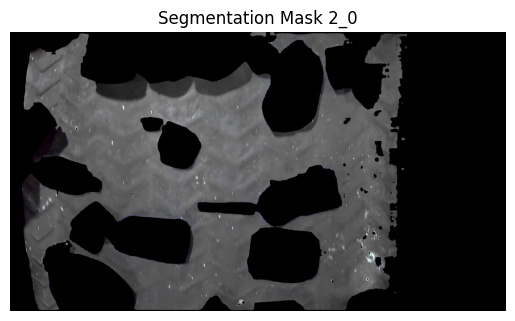

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_46.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


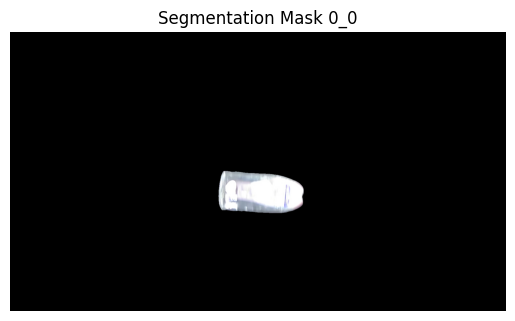

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_49.png


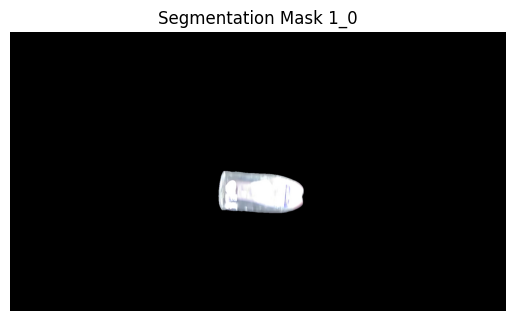

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_48.png


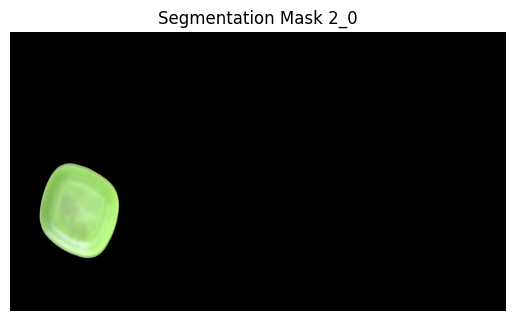

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_47.png


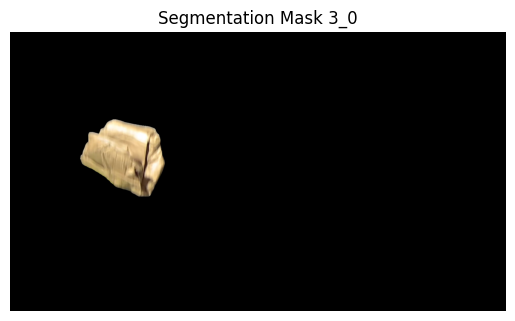

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_42.png


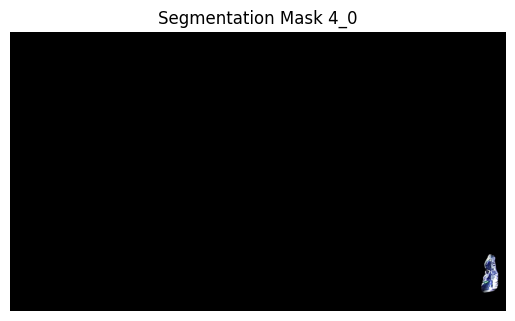

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_34.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


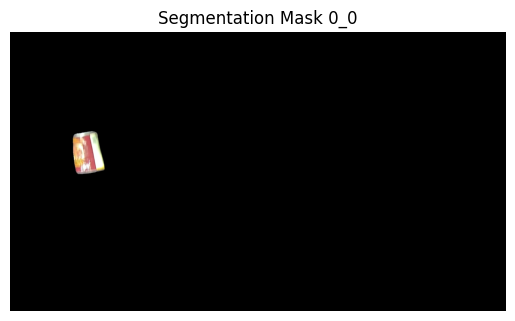

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_50.png


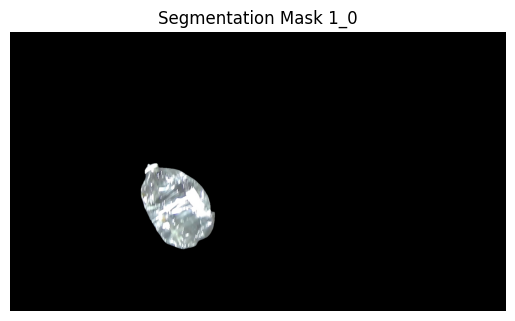

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_49.png


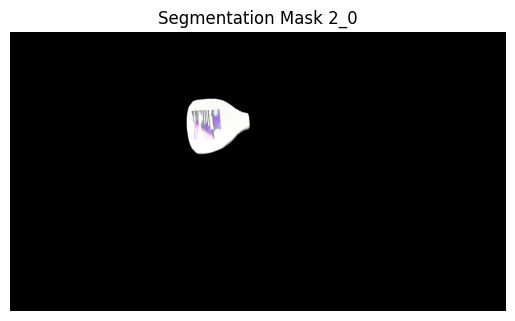

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_48.png


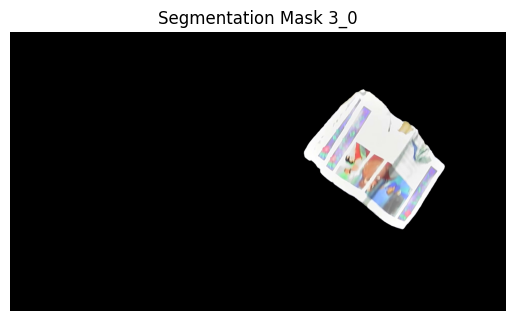

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_43.png


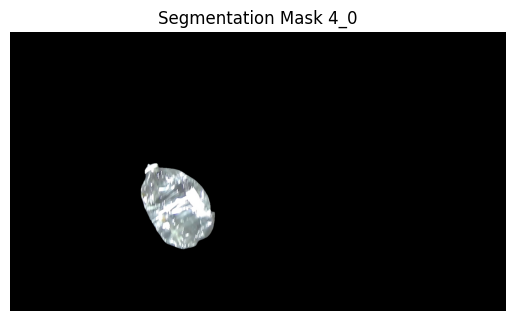

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_35.png


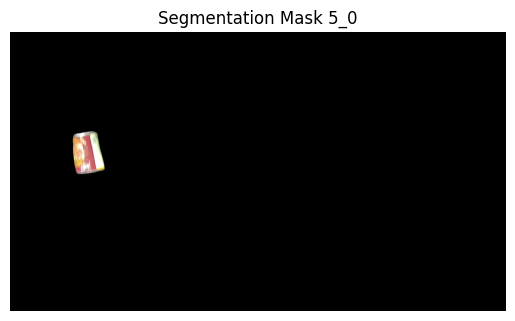

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_32.png


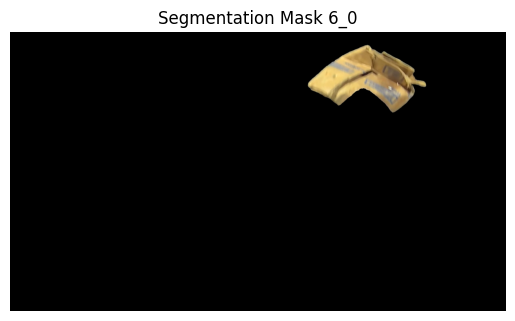

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_23.png


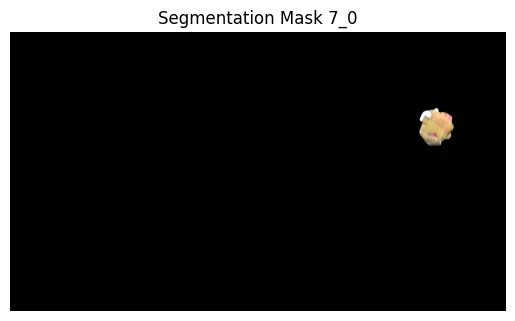

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_20.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


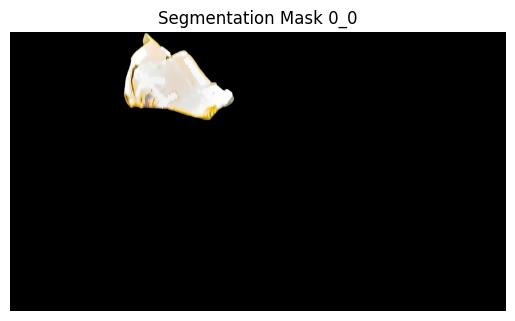

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_51.png


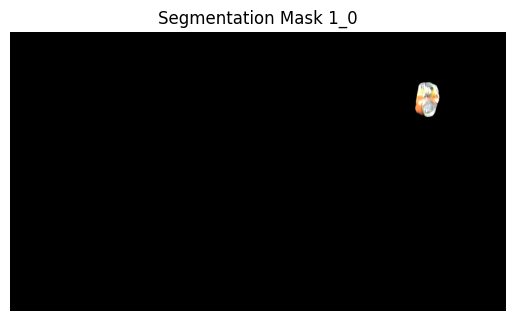

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_50.png


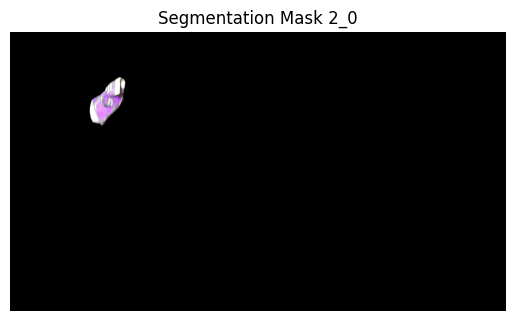

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_49.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


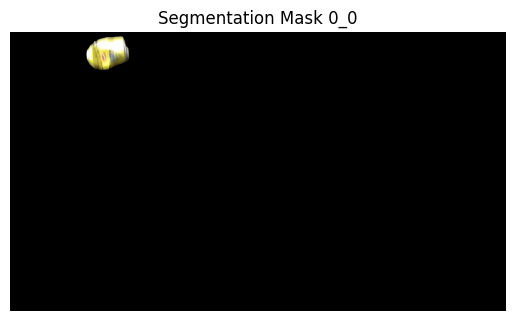

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_52.png


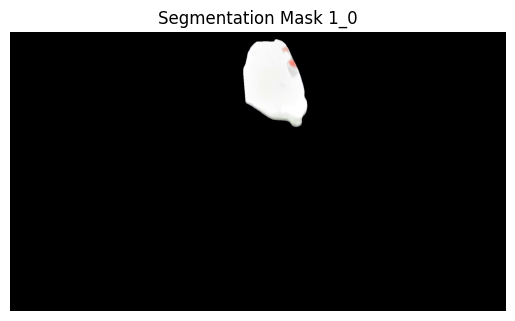

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_51.png


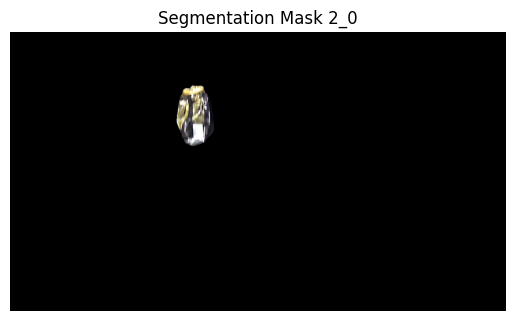

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_50.png


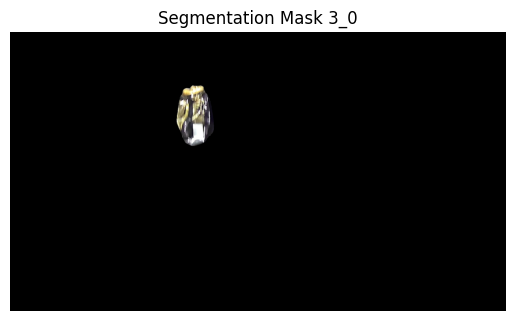

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_44.png


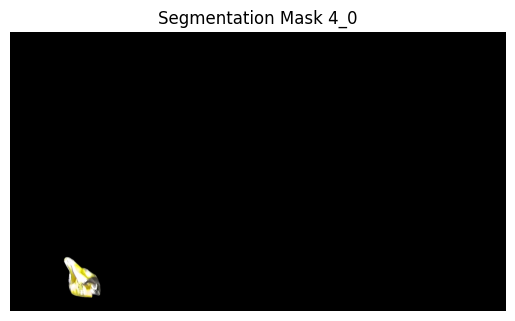

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_36.png


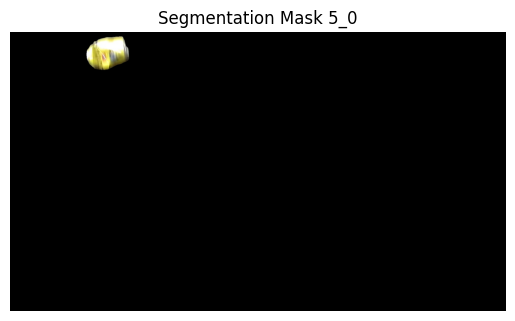

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_33.png


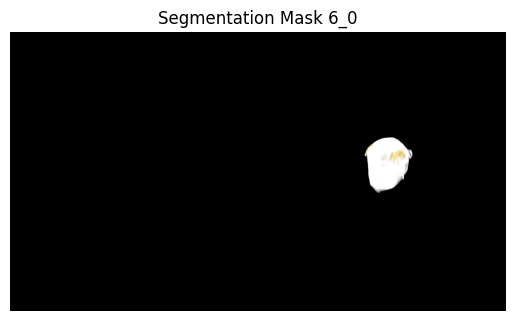

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_24.png


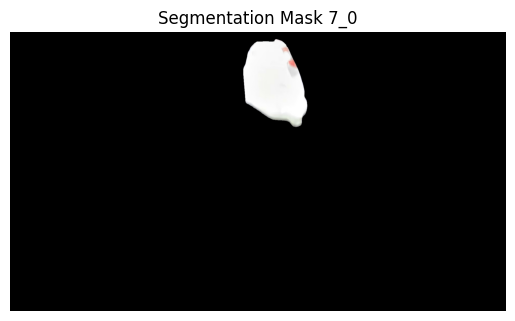

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_21.png


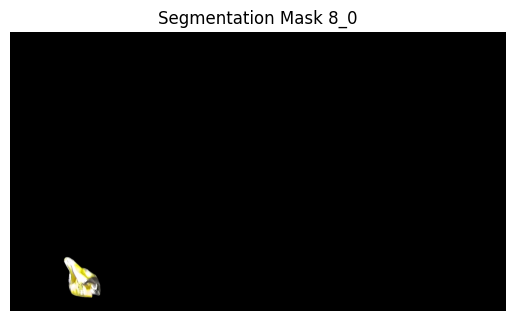

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_15.png


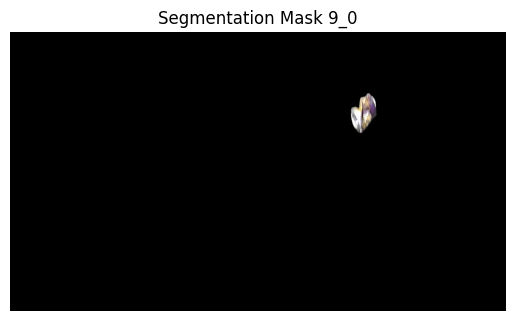

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_13.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


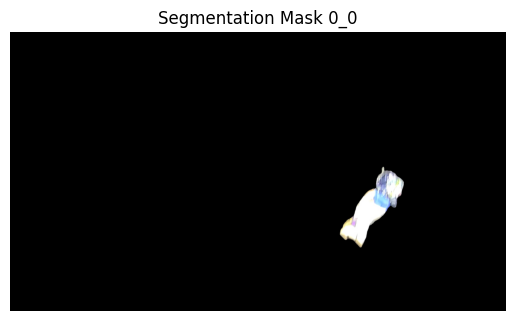

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_53.png


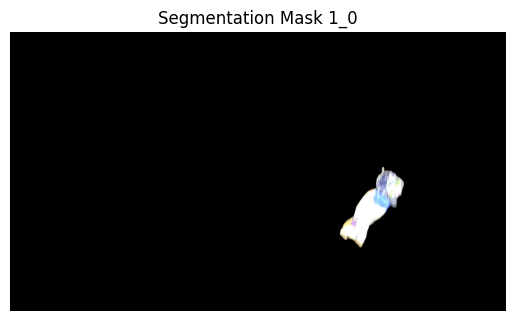

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_52.png


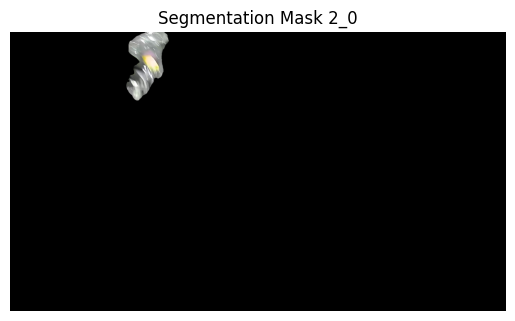

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_51.png


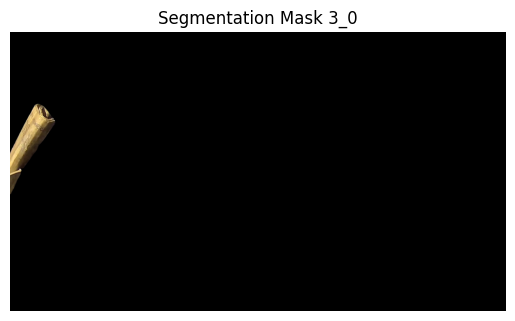

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_45.png


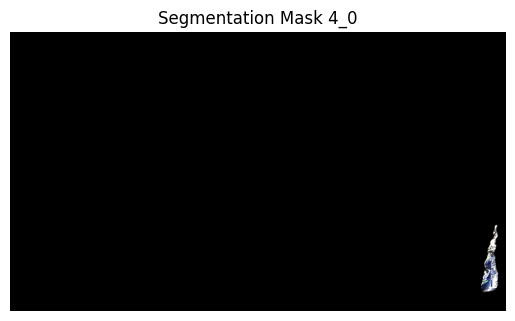

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_37.png


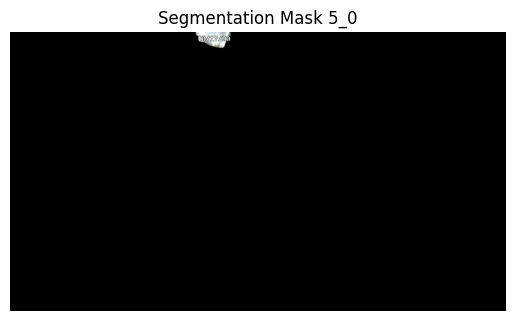

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_34.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


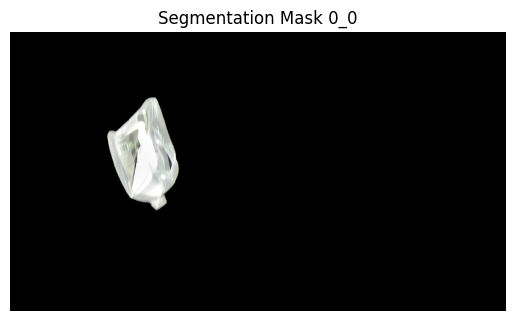

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_54.png


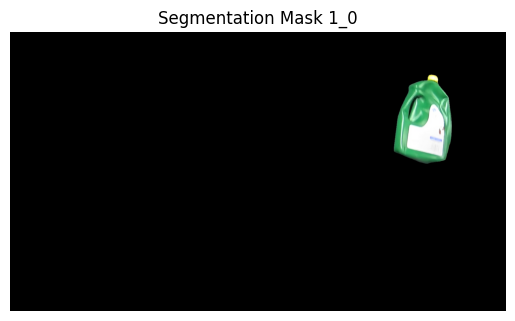

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_53.png


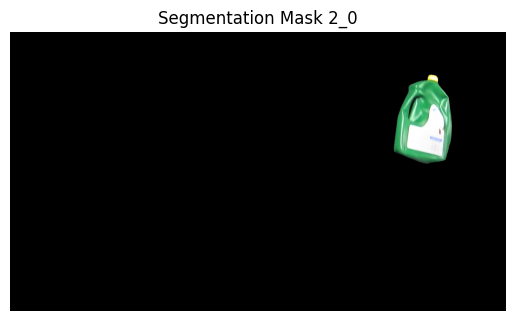

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_52.png


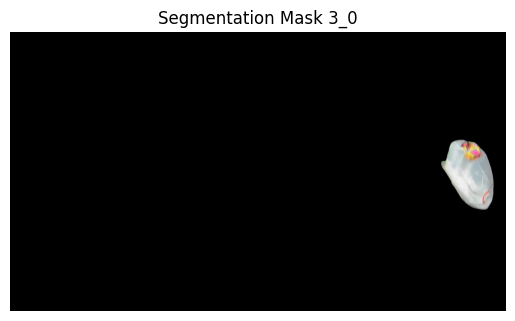

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_46.png


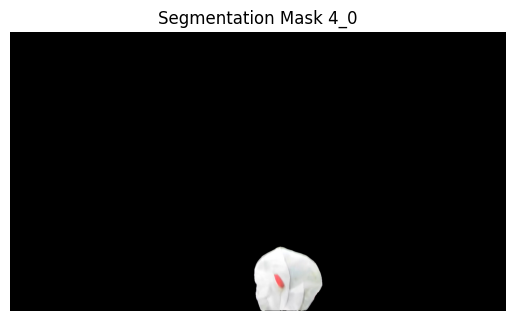

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_38.png


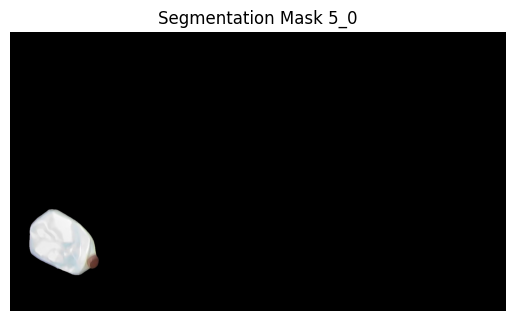

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_35.png


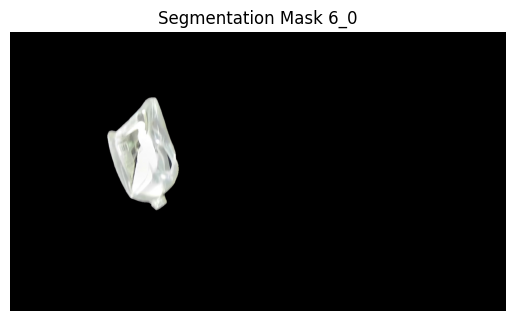

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_25.png


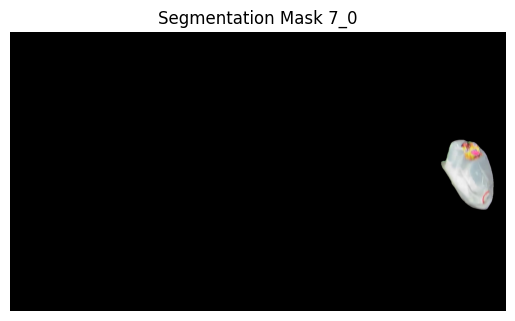

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_22.png


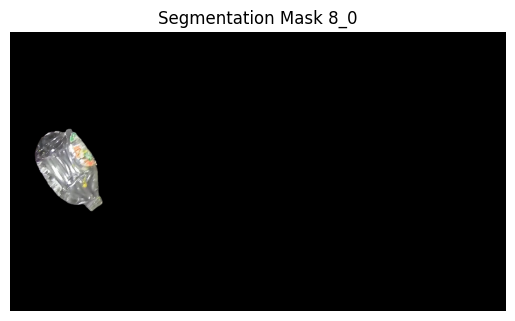

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_16.png


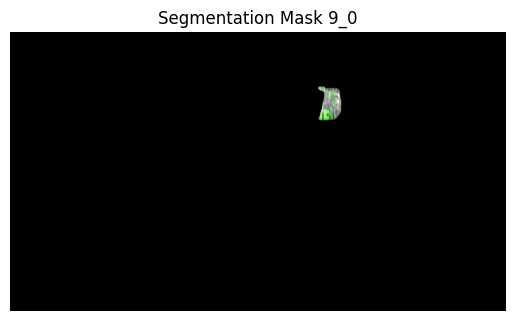

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_14.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


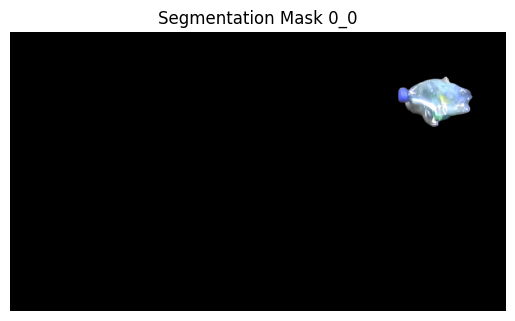

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_55.png


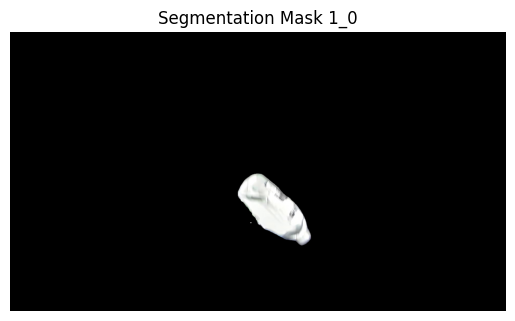

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_54.png


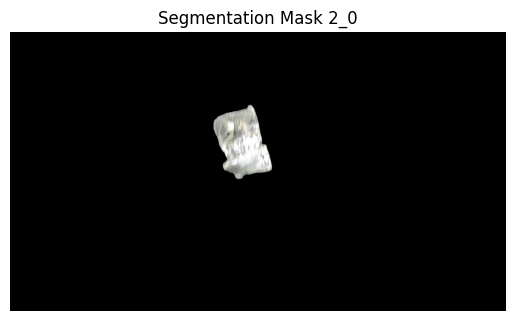

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_53.png


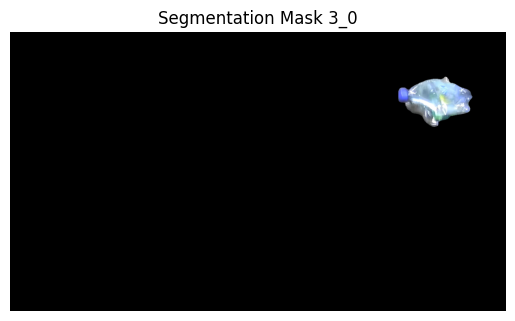

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_47.png


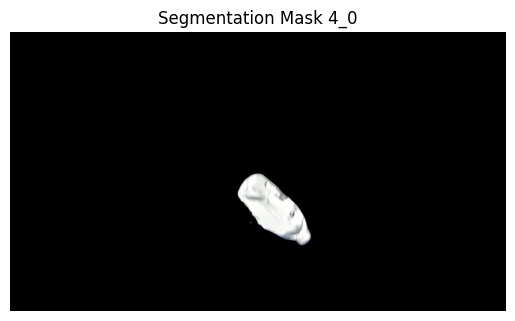

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_39.png


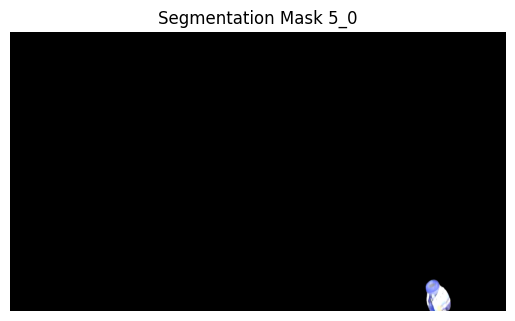

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_36.png


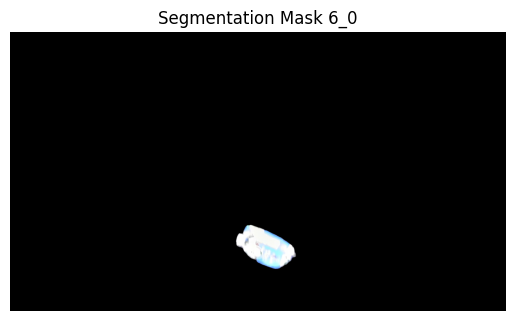

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_26.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


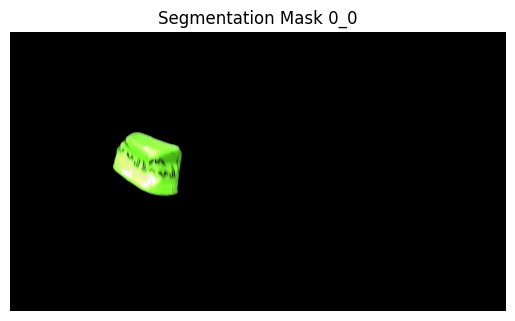

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_56.png


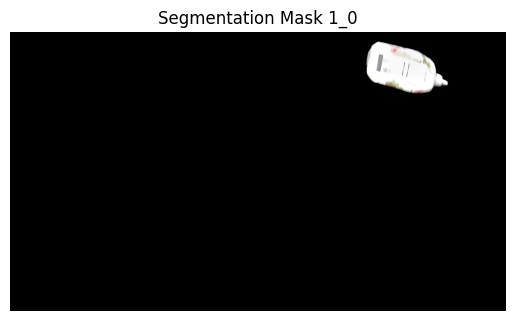

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_55.png


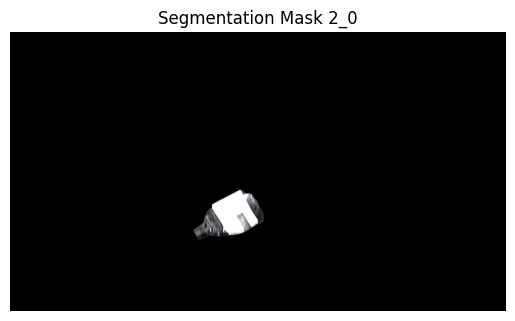

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_54.png


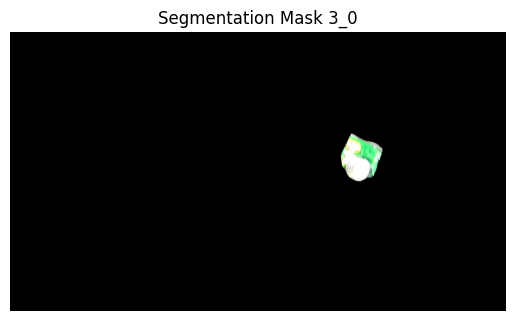

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_48.png


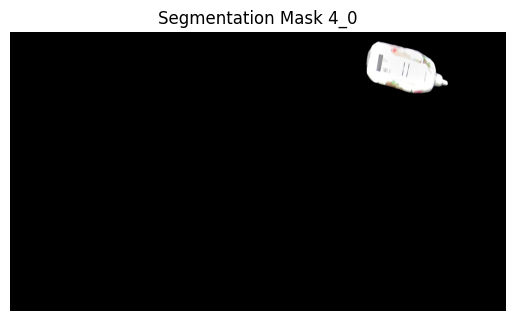

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_40.png


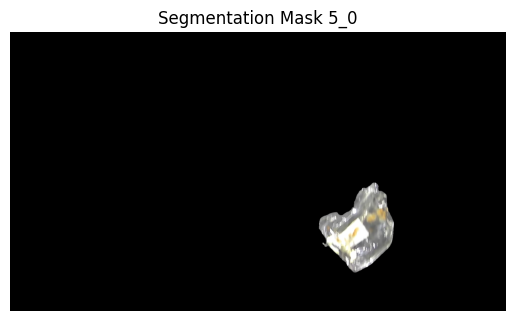

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_37.png


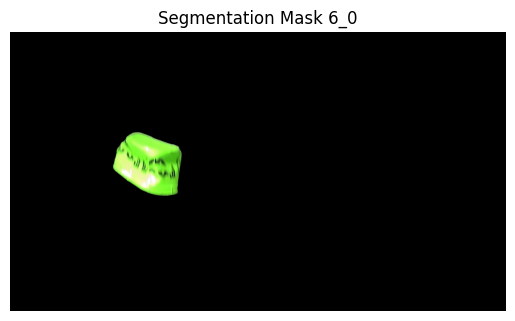

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_27.png


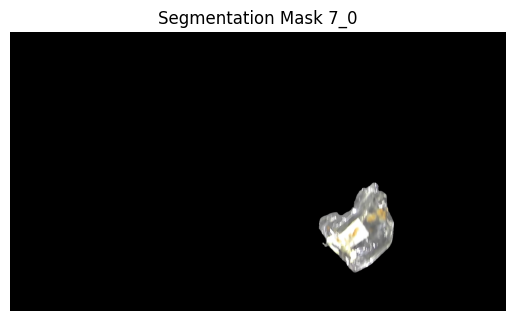

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_23.png


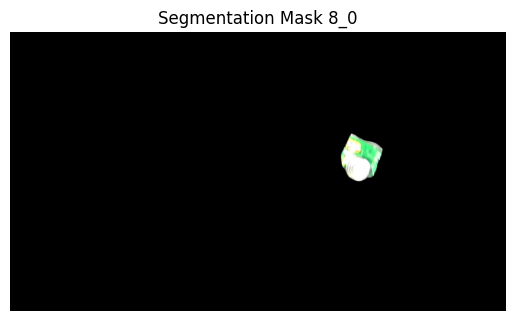

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_17.png


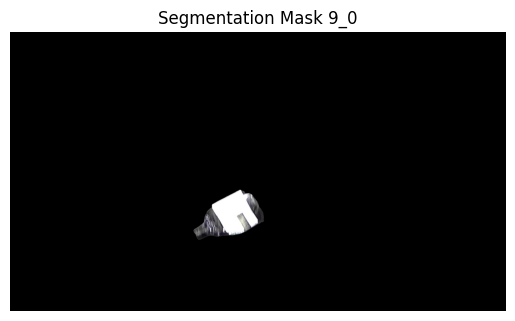

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_15.png


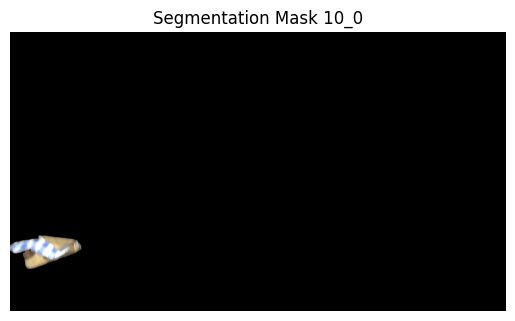

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_11.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


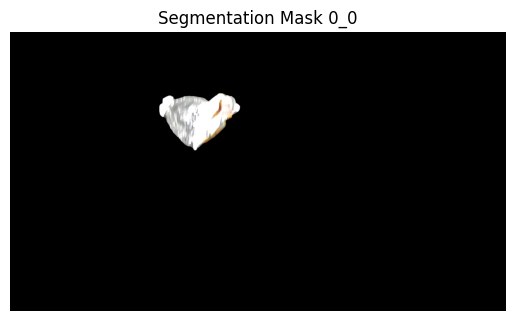

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_57.png


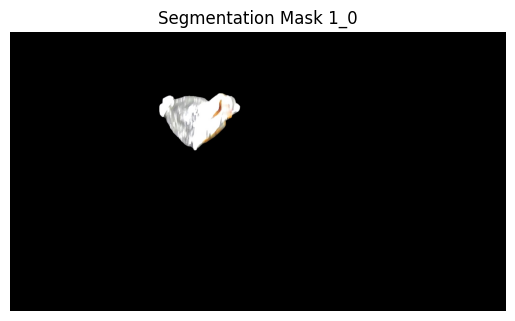

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_56.png


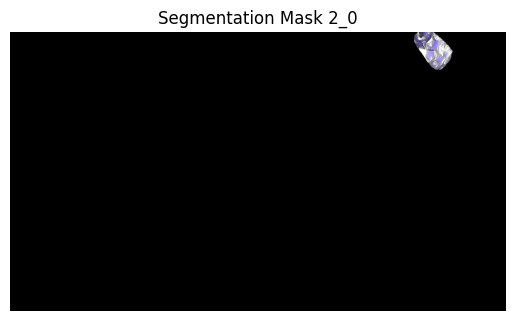

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_55.png


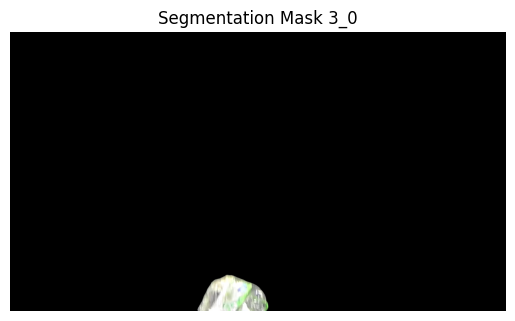

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_49.png


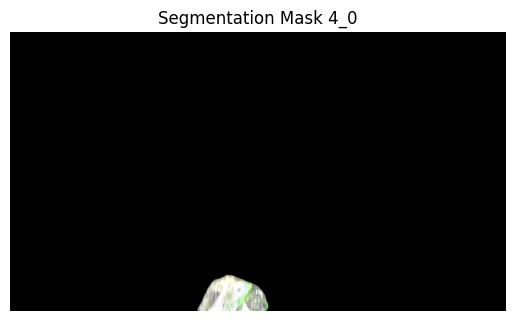

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_41.png


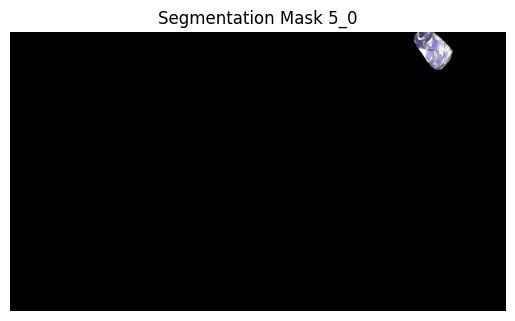

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_38.png


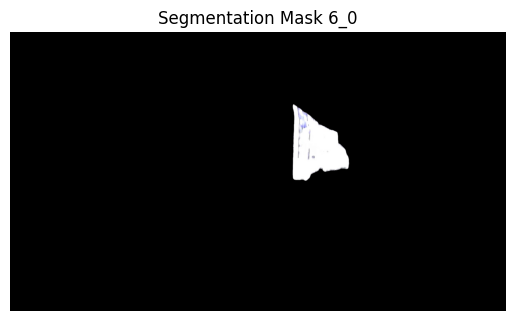

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_28.png


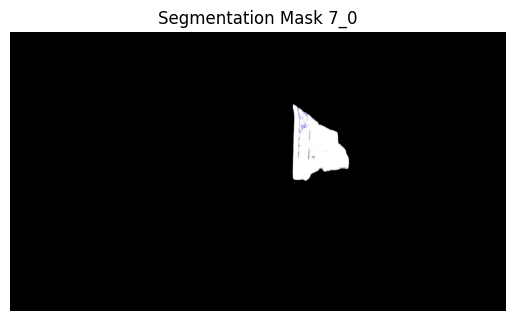

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_24.png


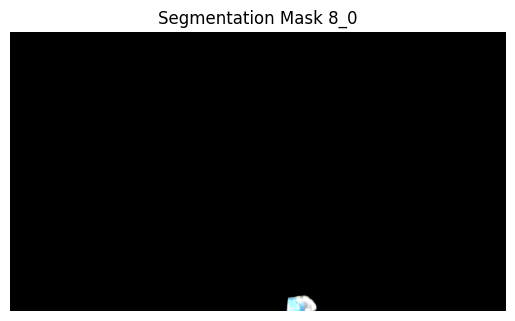

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_18.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


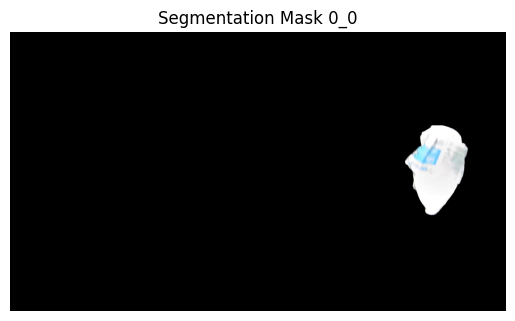

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_58.png


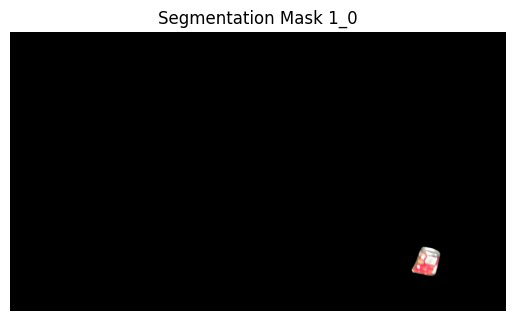

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_57.png


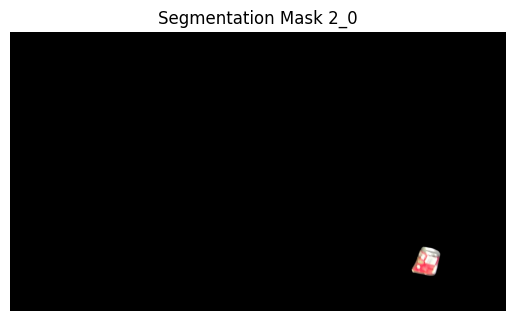

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_56.png


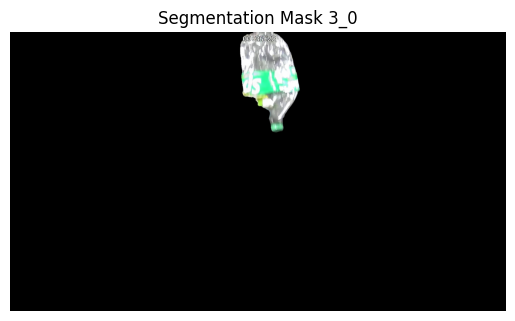

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_50.png


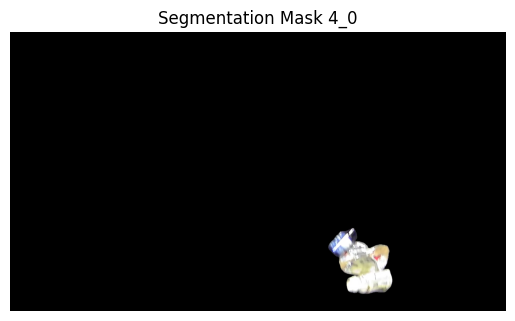

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_42.png


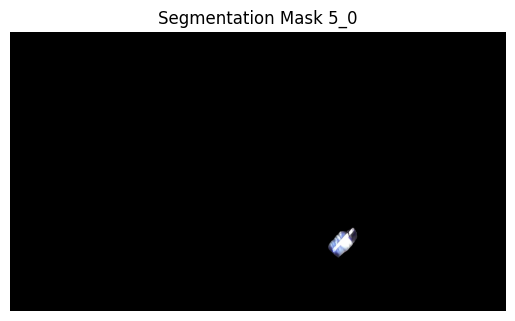

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_39.png


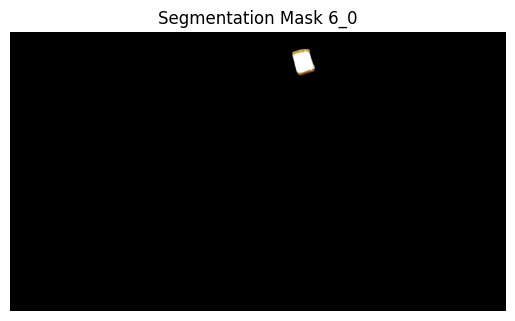

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_29.png


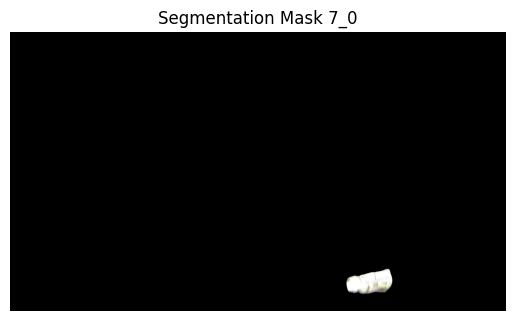

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_25.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


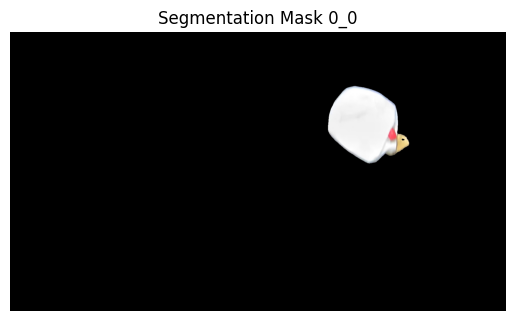

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_59.png


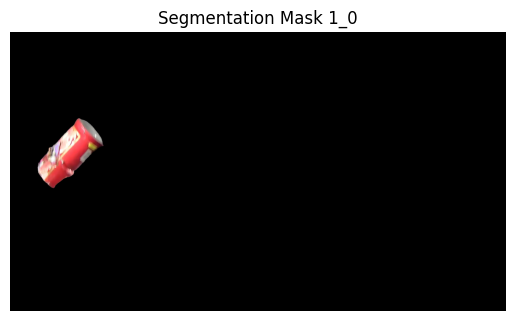

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_58.png


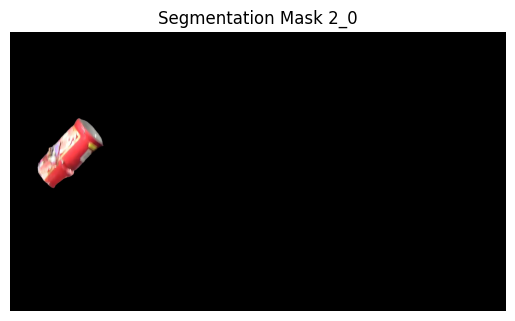

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_57.png


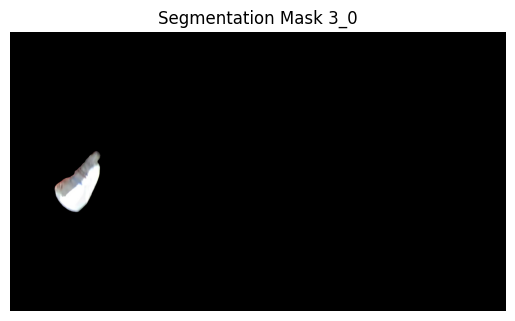

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_51.png


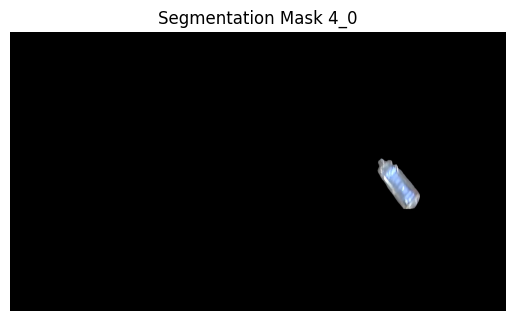

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_43.png


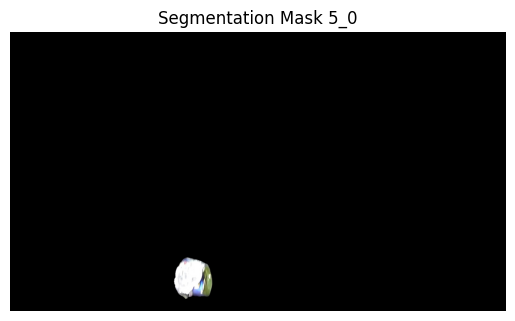

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_40.png


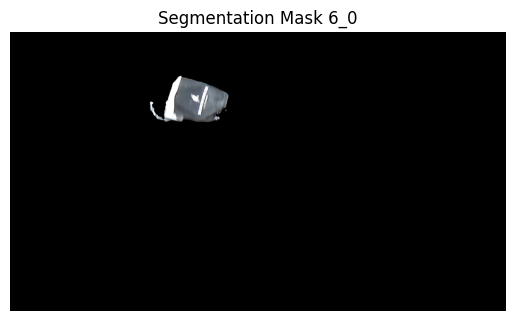

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_30.png


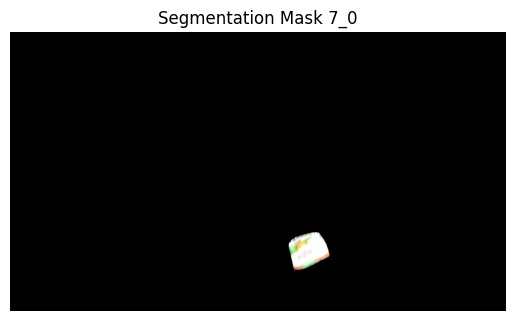

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_26.png


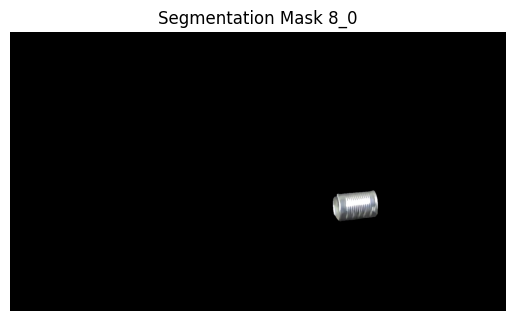

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_19.png


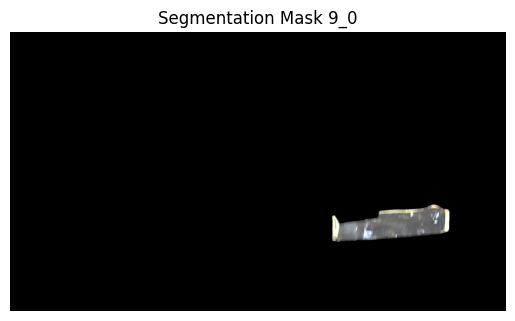

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_16.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


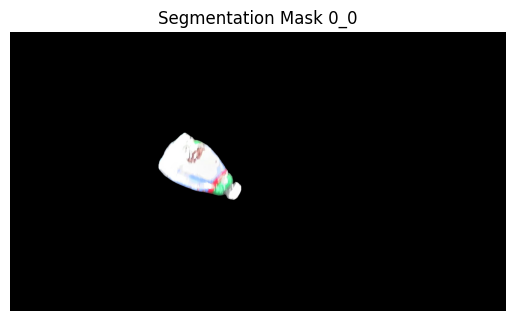

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_60.png


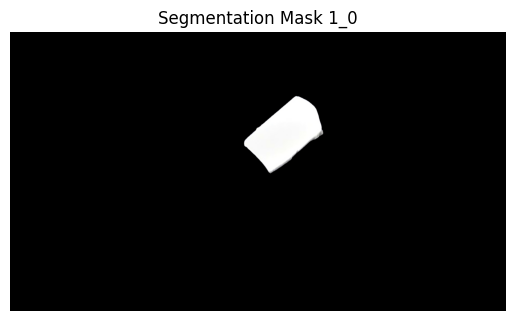

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_59.png


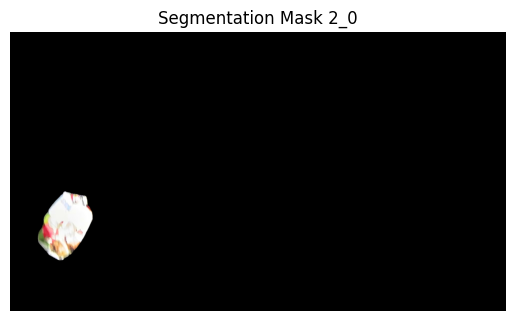

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_58.png


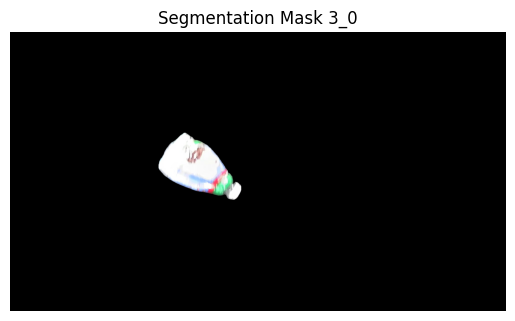

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_52.png


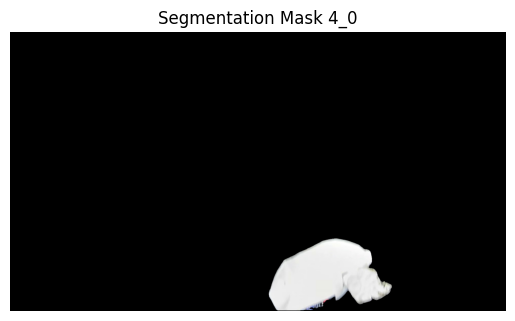

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_44.png


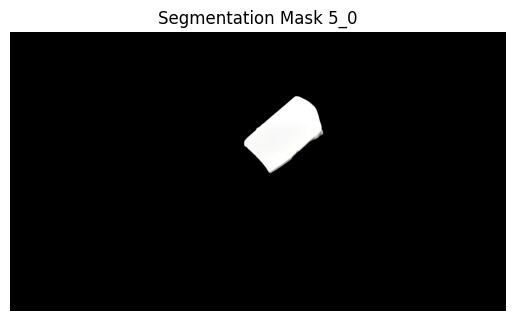

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_41.png


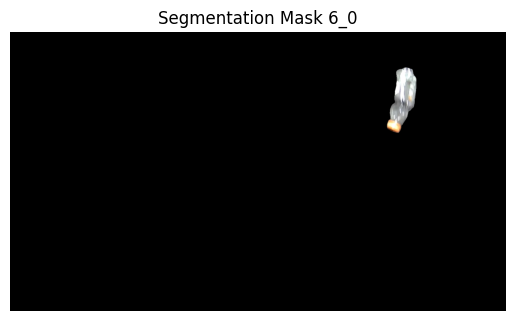

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_31.png


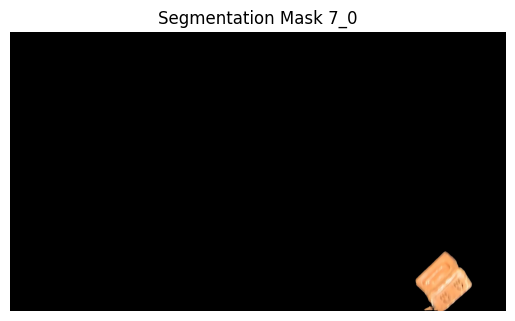

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_27.png


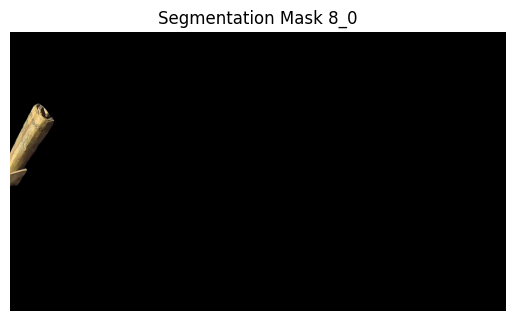

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_20.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


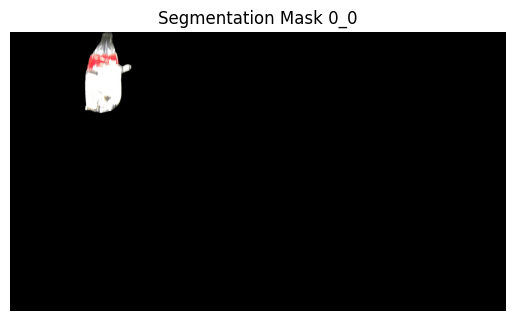

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_61.png


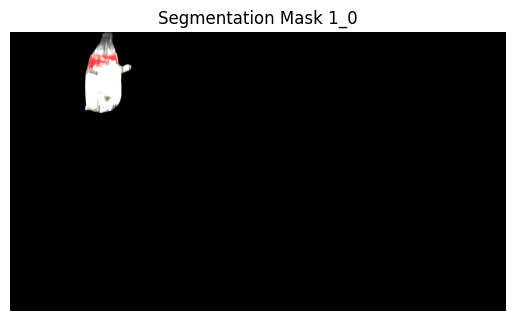

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_60.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


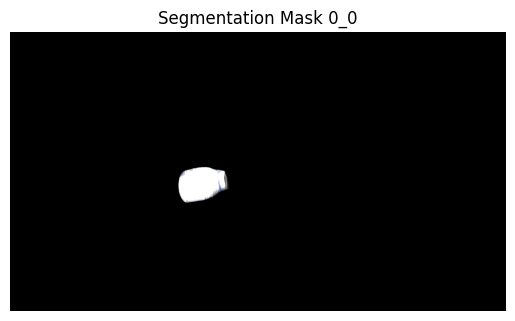

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_62.png


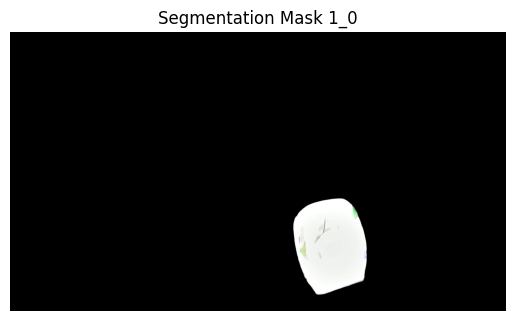

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_61.png


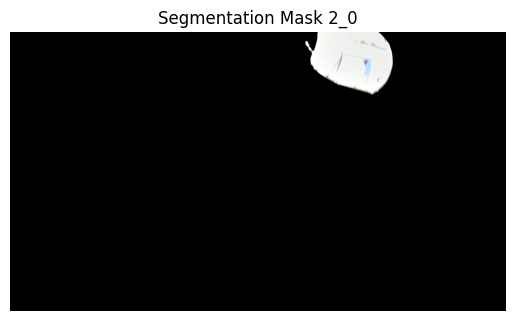

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_59.png


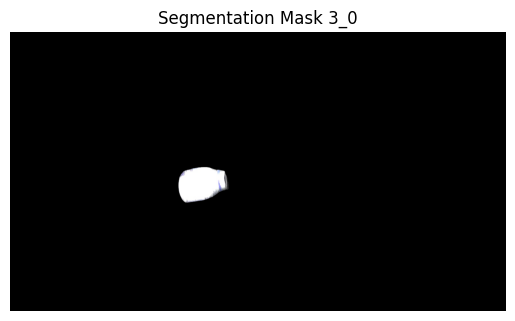

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_53.png


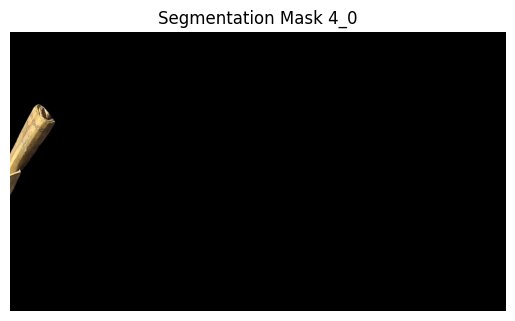

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_45.png


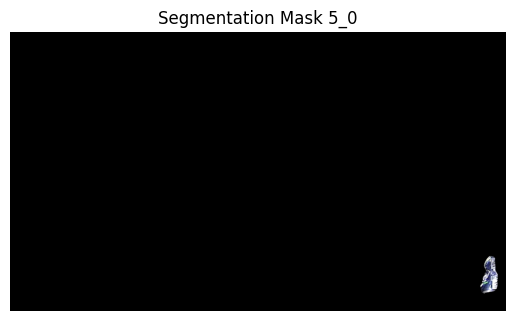

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_42.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


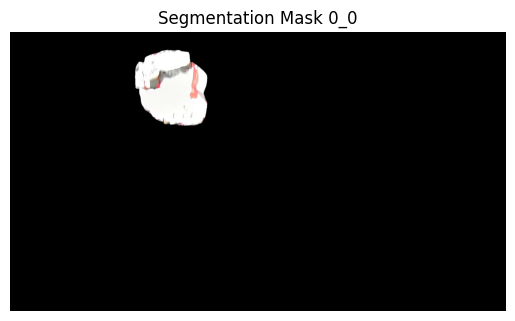

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_63.png


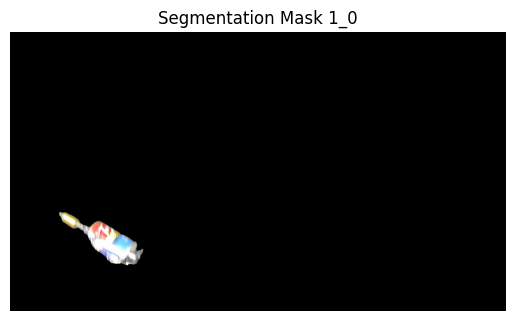

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_62.png


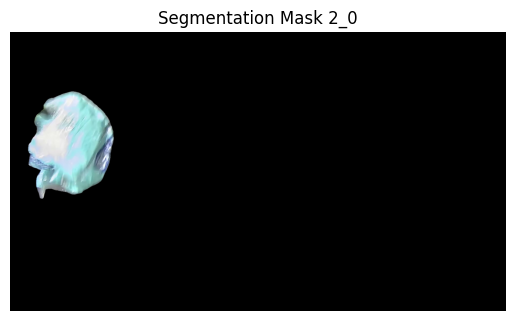

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_60.png


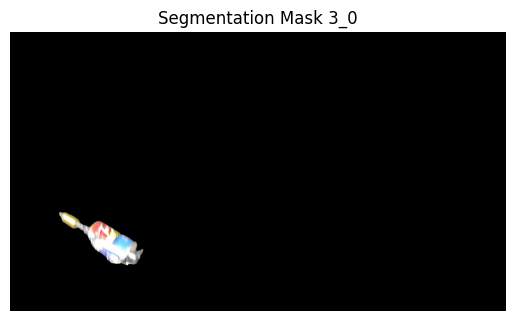

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_54.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


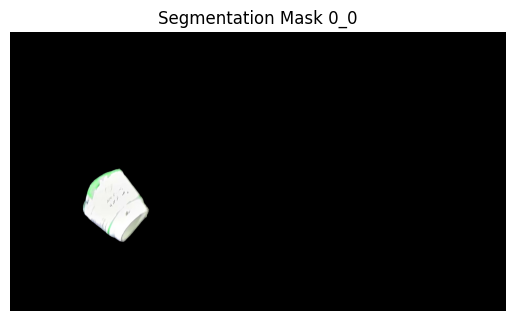

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_64.png


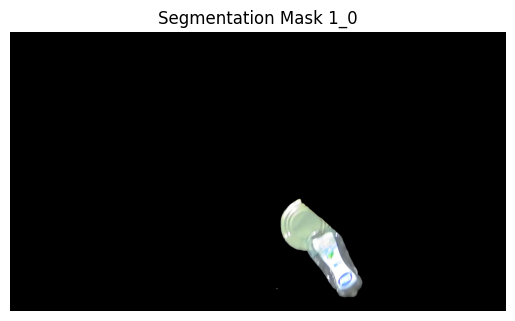

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_63.png


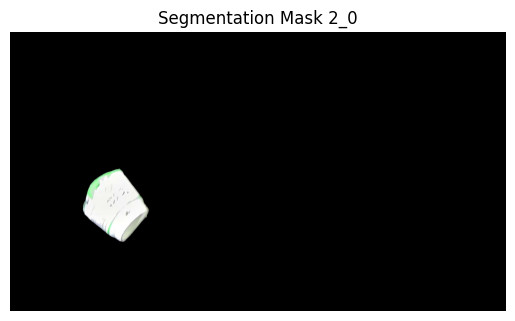

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_61.png


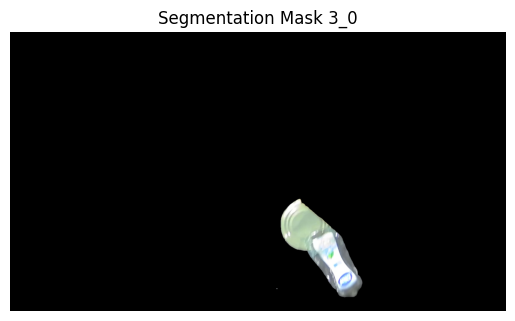

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_55.png


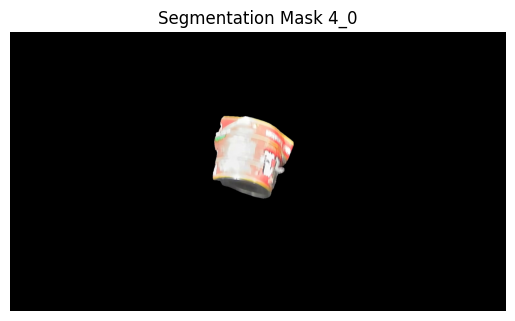

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_46.png


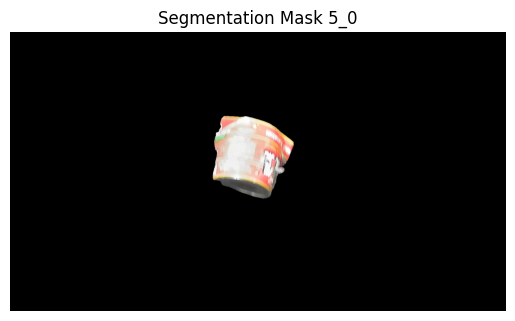

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_43.png


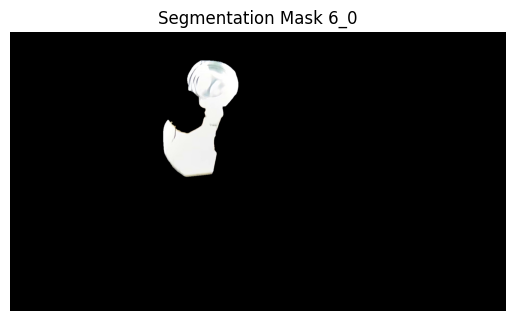

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_32.png


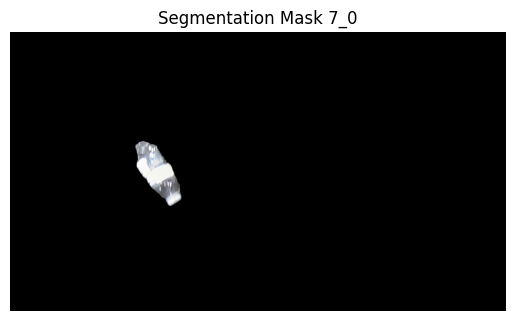

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_28.png


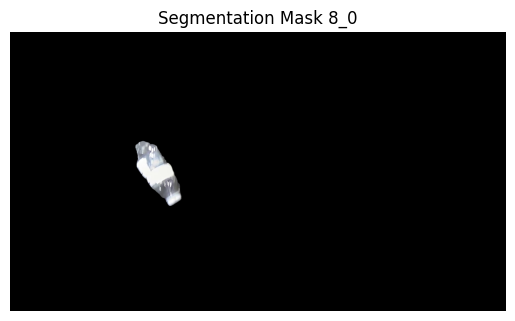

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_21.png


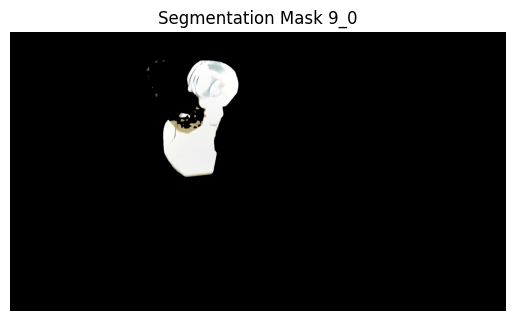

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_17.png


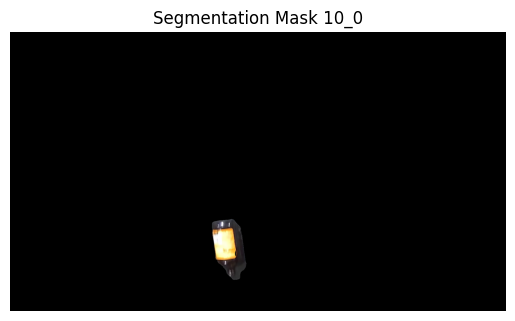

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_12.png


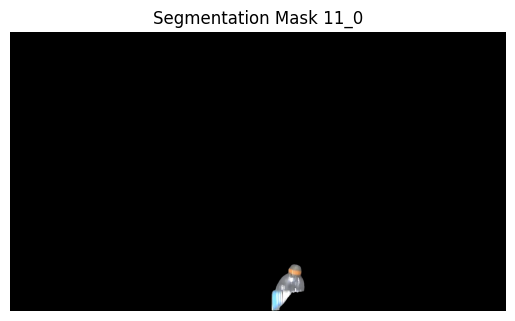

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_6.png


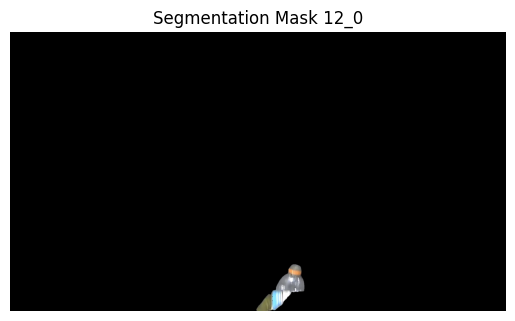

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_5.png


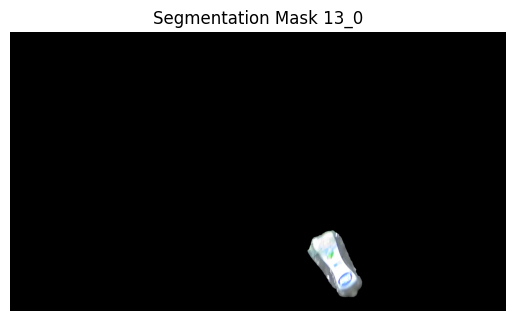

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_3.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


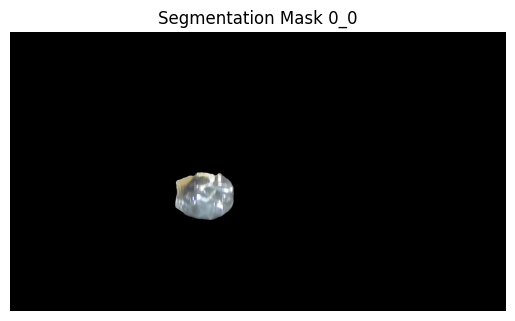

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_65.png


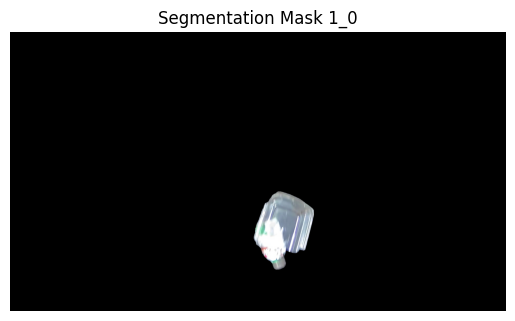

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_64.png


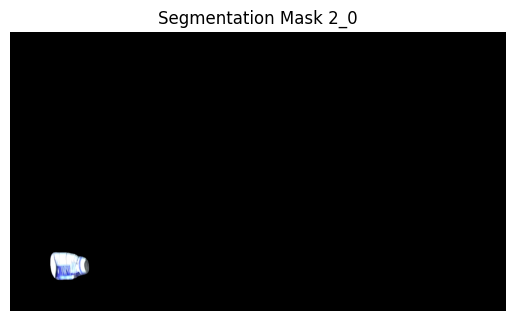

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_62.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


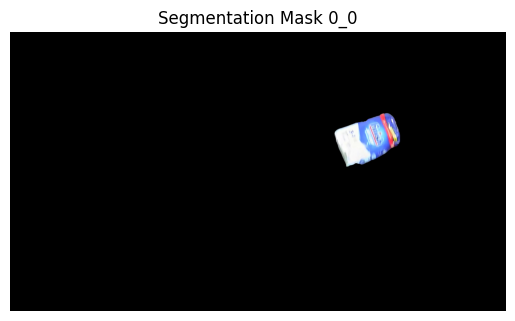

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_66.png


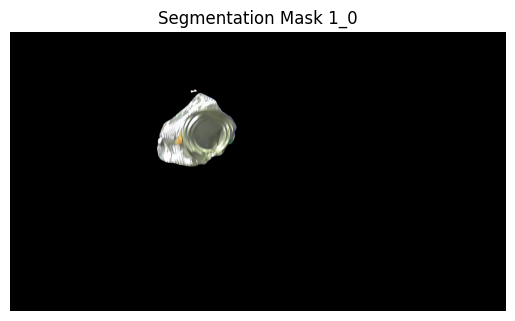

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_65.png


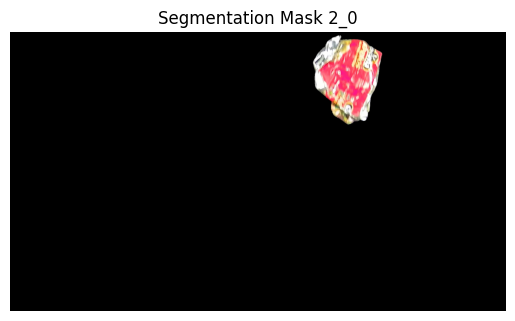

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_63.png


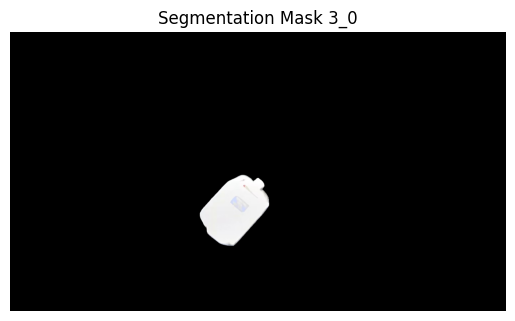

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_56.png


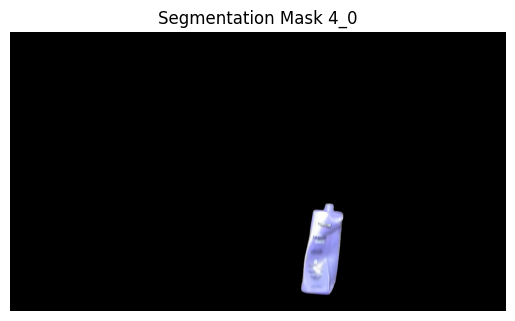

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_47.png


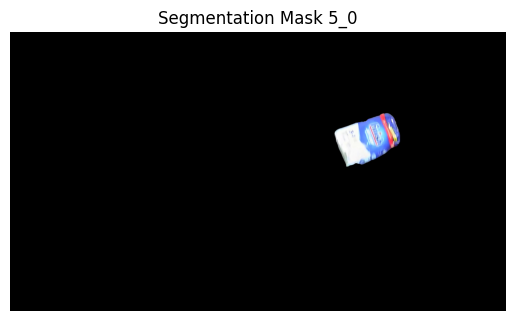

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_44.png


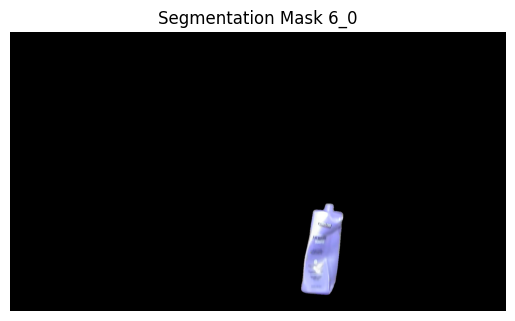

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_33.png


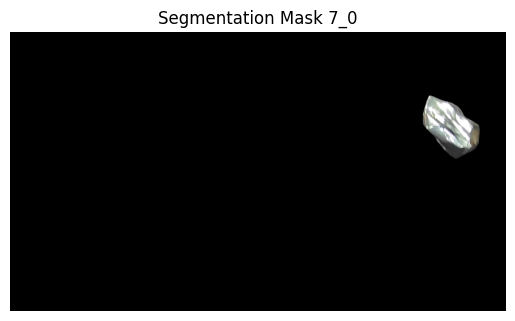

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_29.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


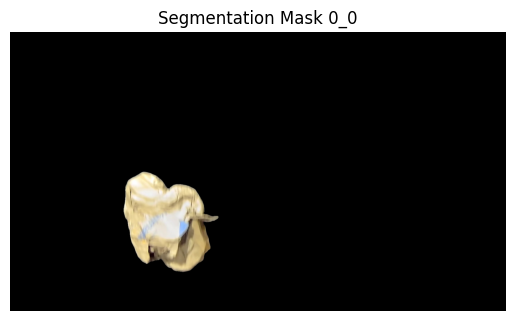

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_67.png


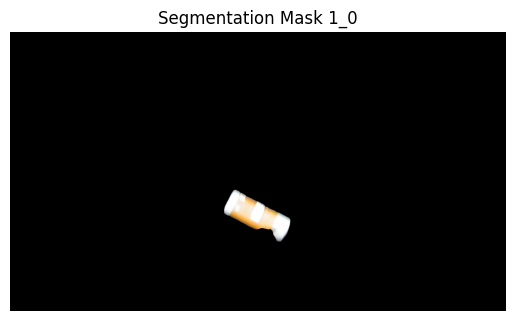

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_66.png


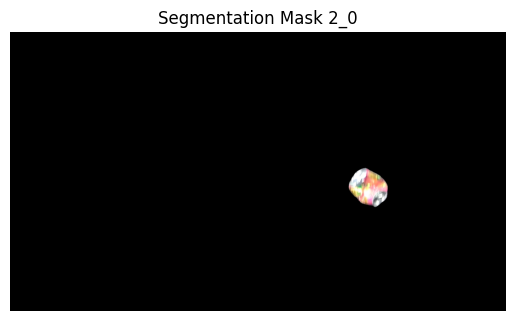

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_64.png


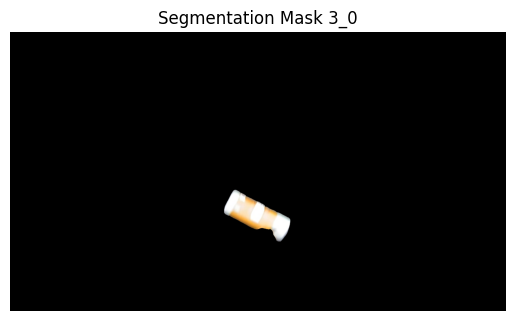

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_57.png


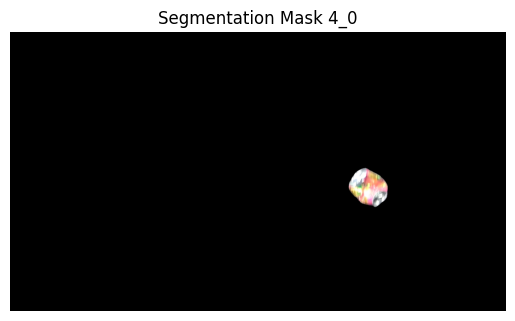

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_48.png


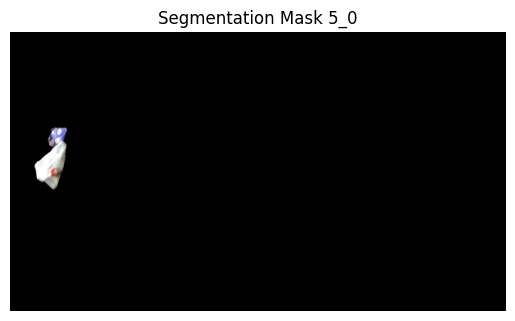

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_45.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


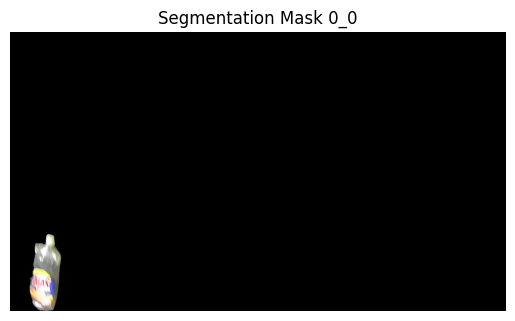

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_68.png


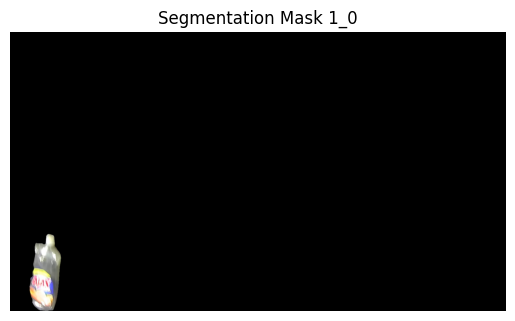

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_67.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


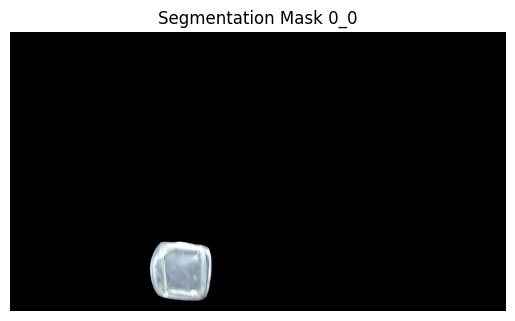

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_69.png


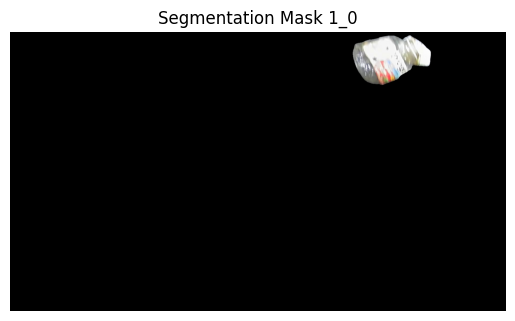

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_68.png


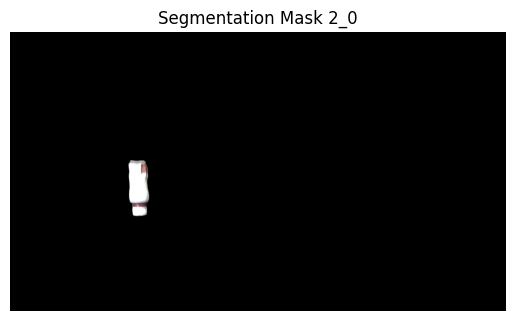

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_65.png


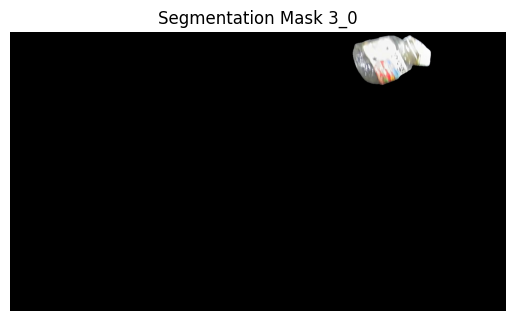

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_58.png


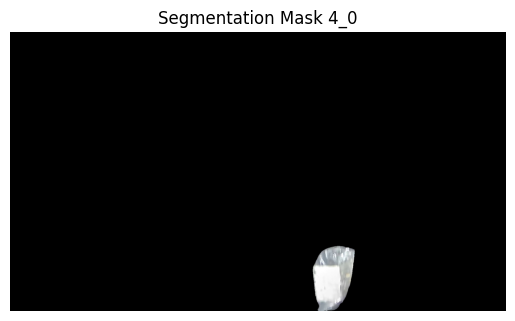

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_49.png


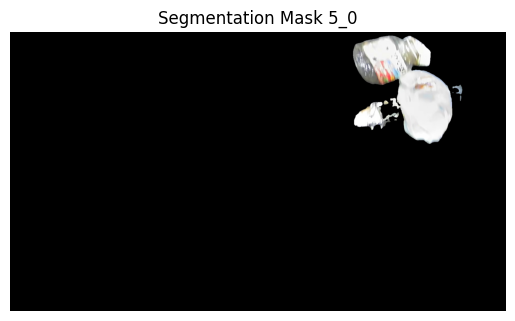

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_46.png


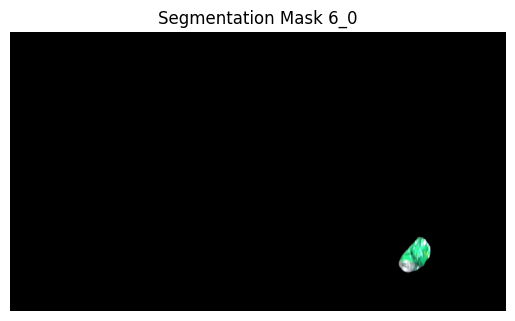

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_34.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


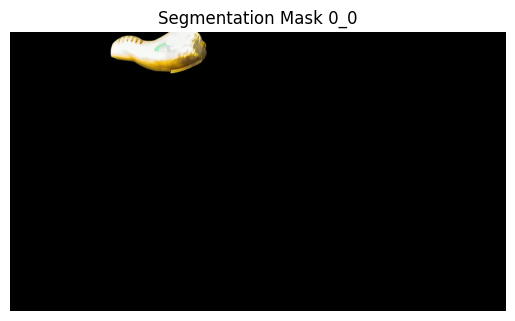

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_70.png


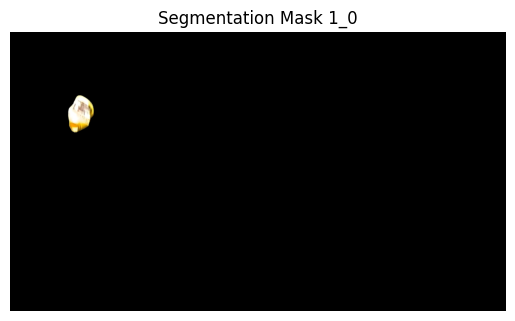

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_69.png


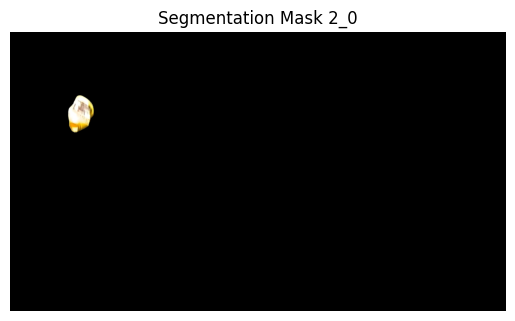

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_66.png


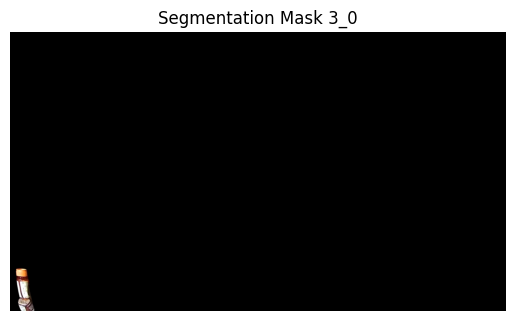

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_59.png


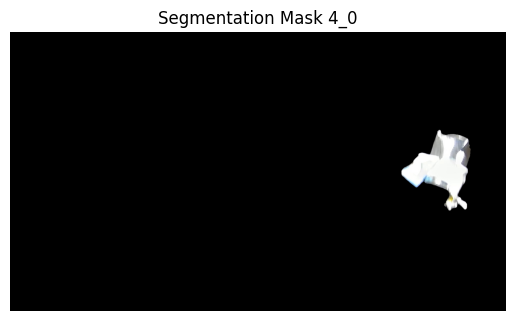

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_50.png


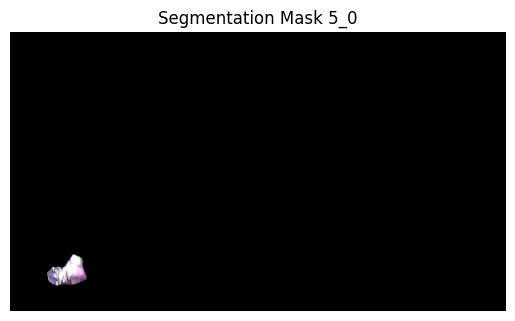

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_47.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


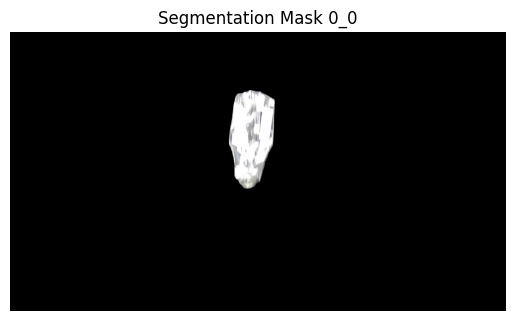

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_71.png


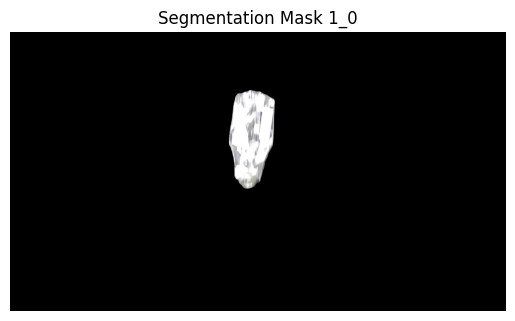

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_70.png


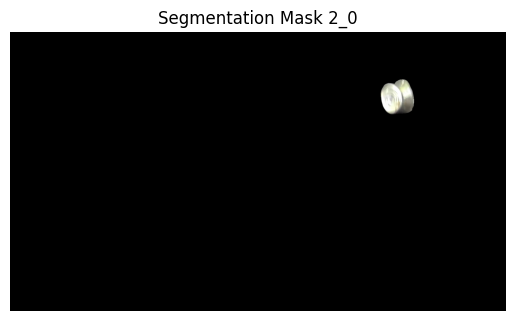

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_67.png


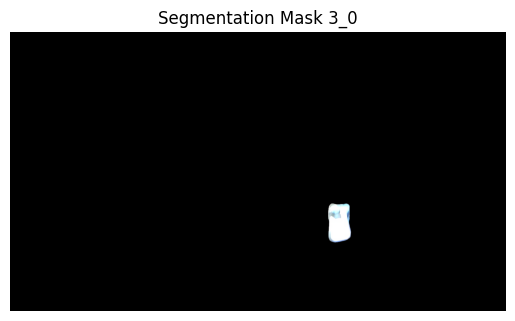

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_60.png


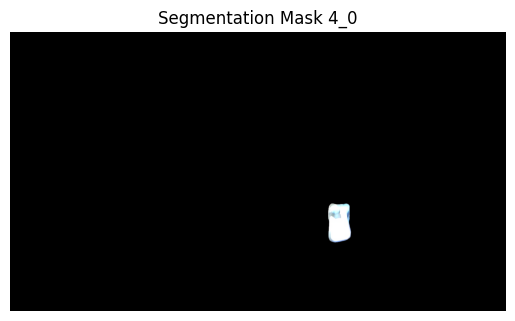

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_51.png


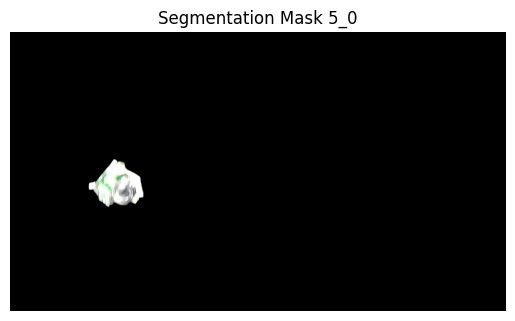

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_48.png


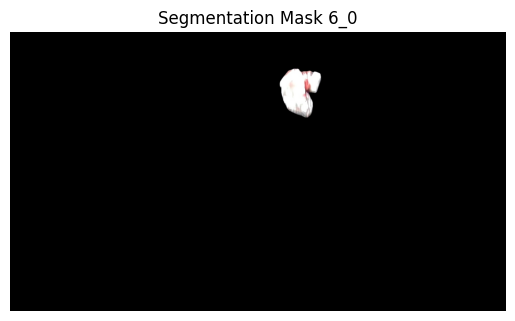

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_35.png


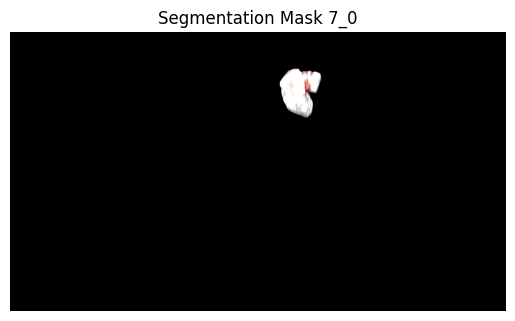

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_30.png


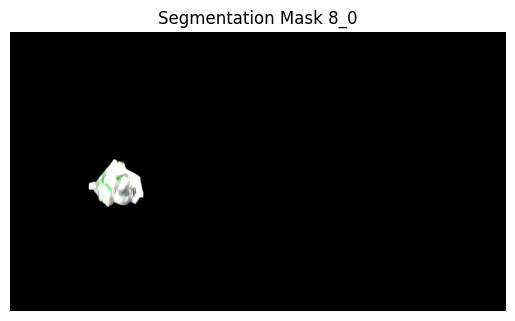

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_22.png


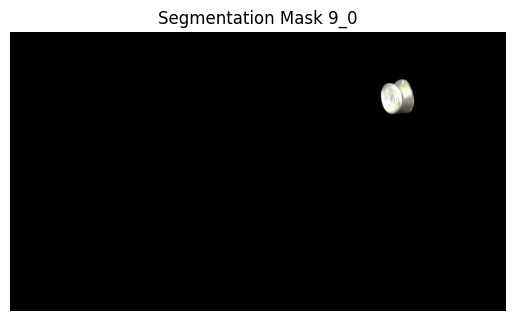

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_18.png


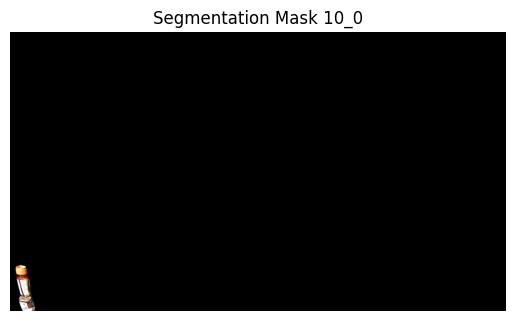

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_13.png


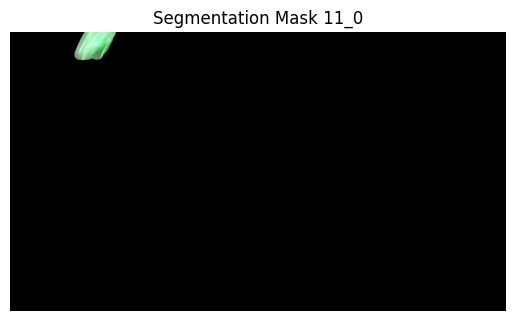

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_7.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


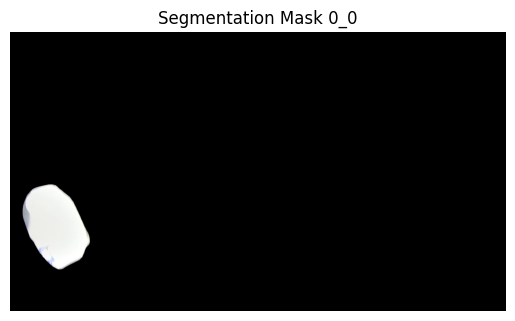

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_72.png


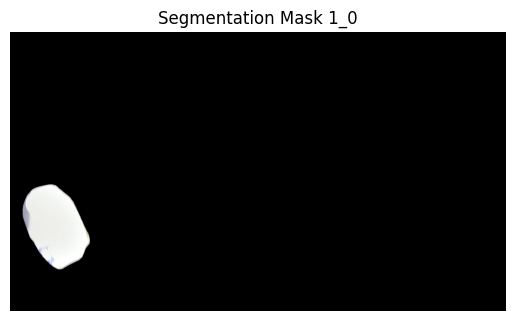

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_71.png


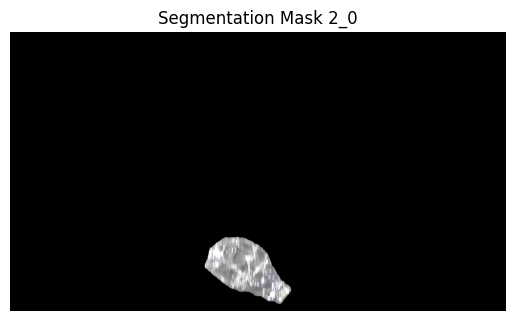

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_68.png


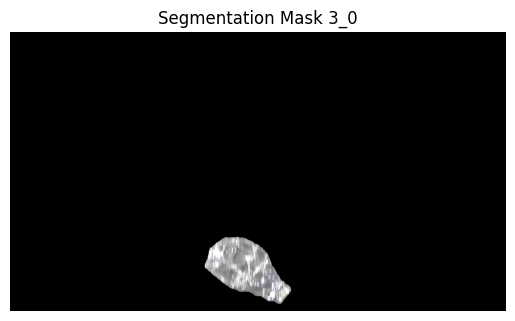

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_61.png


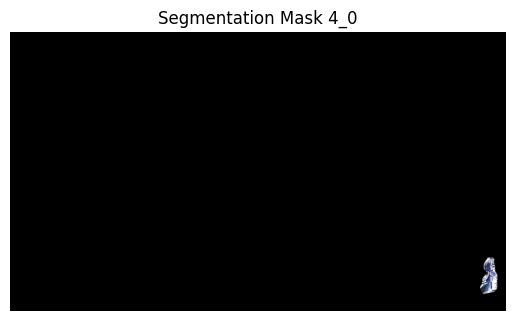

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_52.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


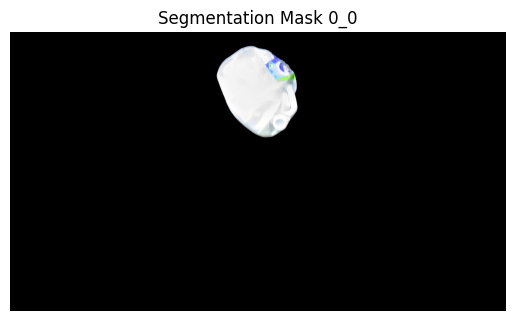

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_73.png


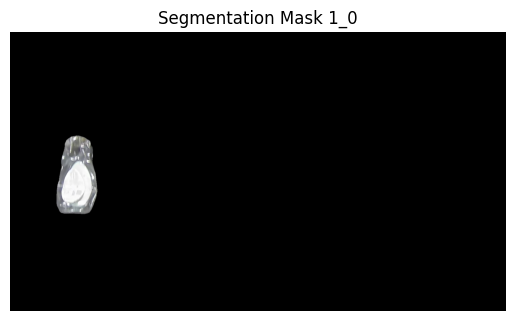

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_72.png


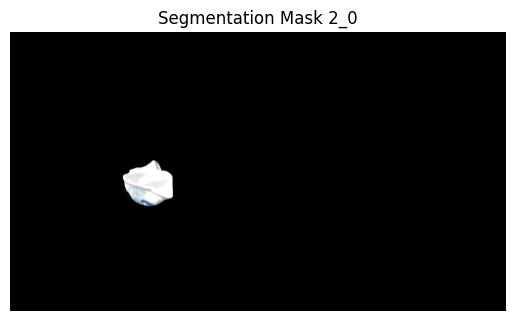

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_69.png


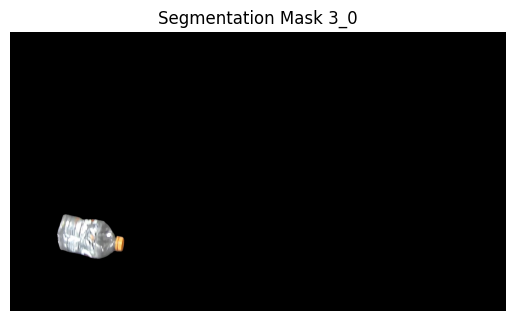

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_62.png


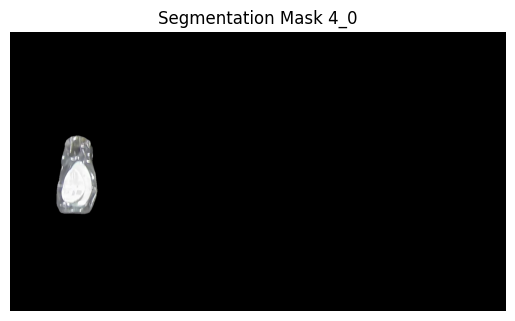

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_53.png


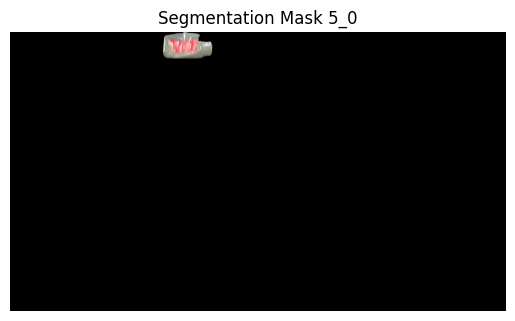

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_49.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


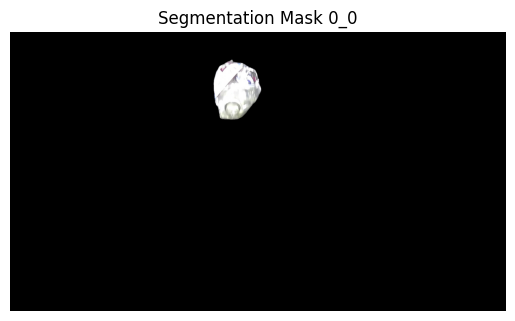

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_74.png


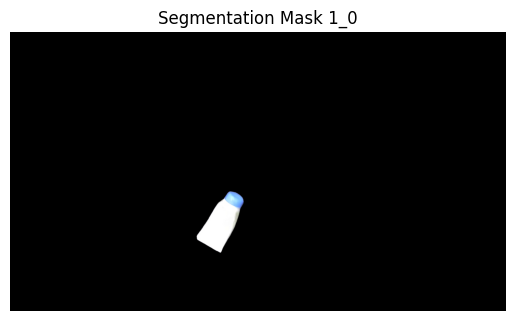

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_73.png


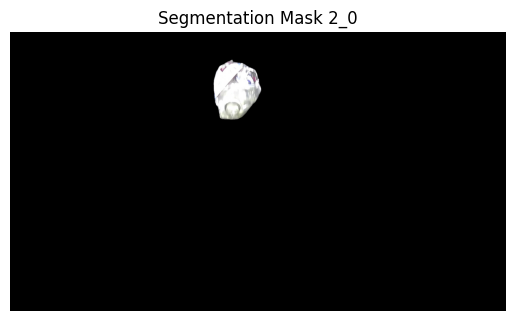

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_70.png


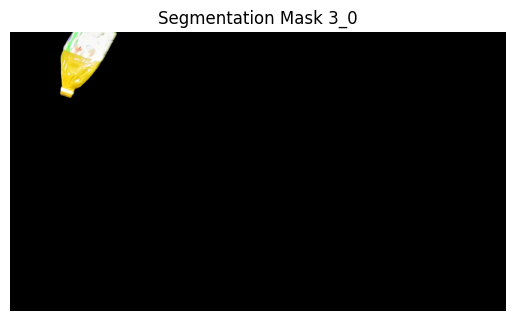

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_63.png


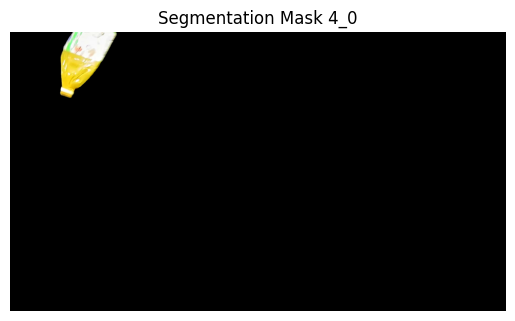

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_54.png


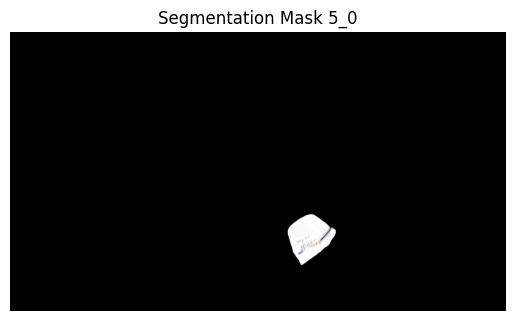

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_50.png


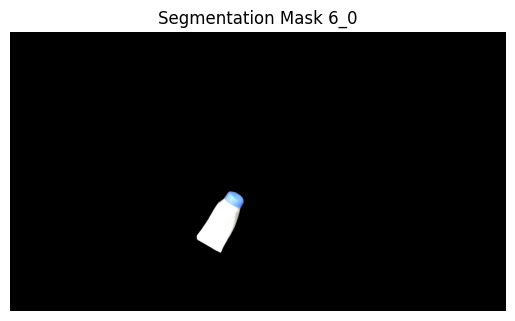

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_36.png


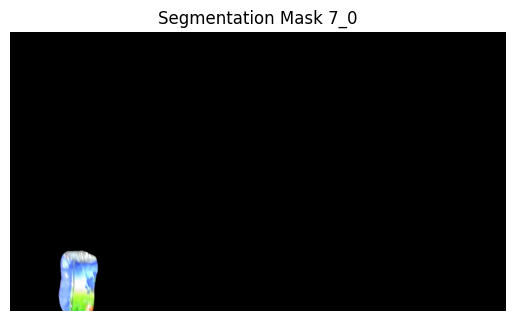

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_31.png


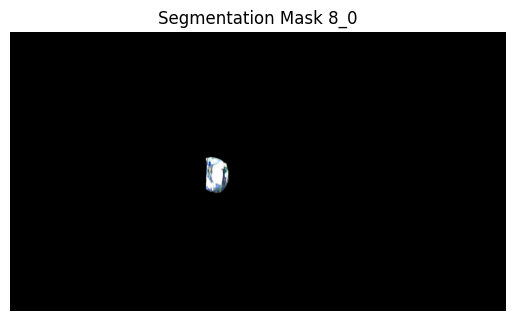

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_23.png


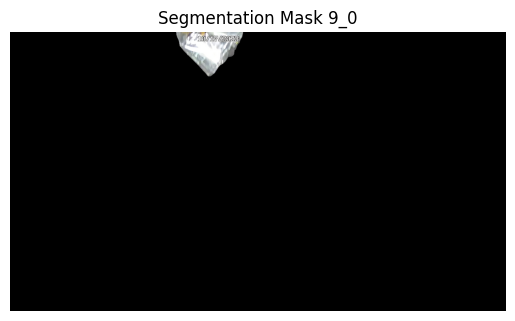

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_19.png


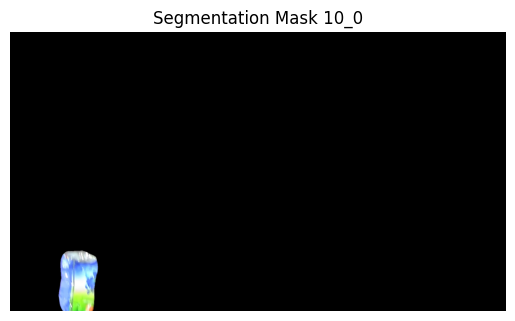

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_14.png


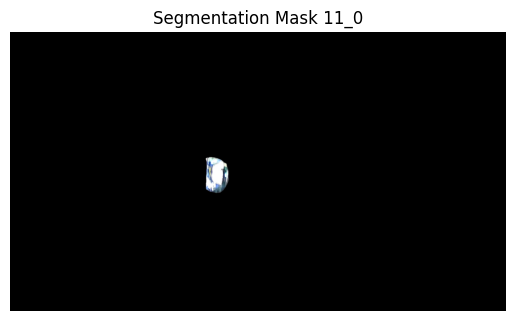

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_8.png


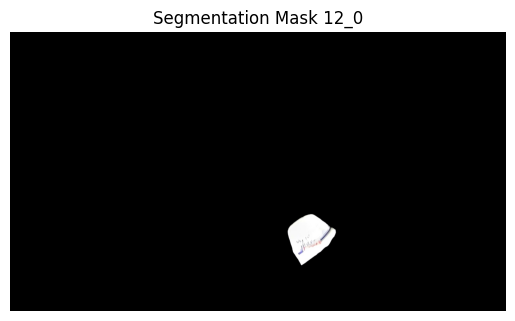

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_6.png


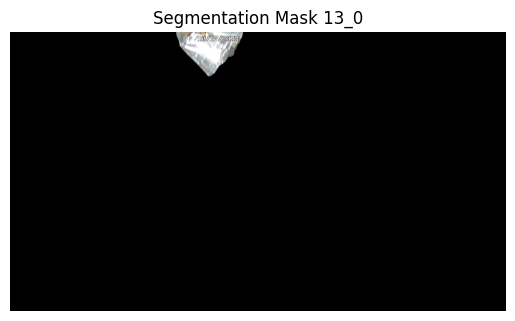

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_4.png


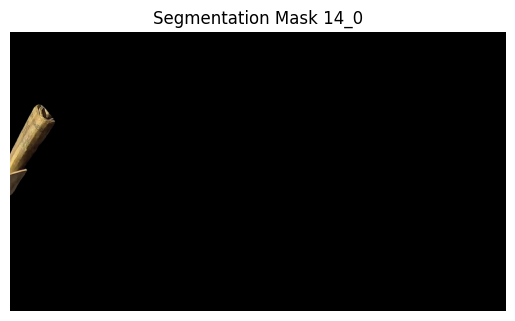

Segmentation mask 14_0 saved as /content/rando4/segmentation_mask_14_0_2.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


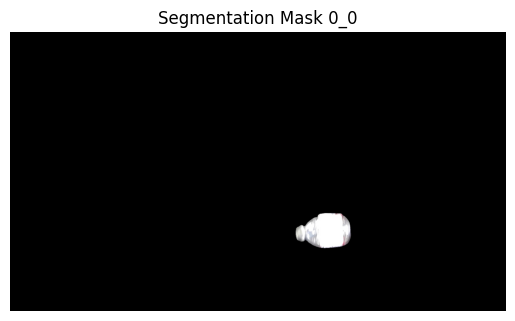

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_75.png


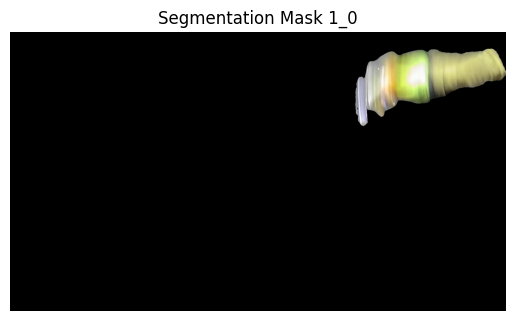

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_74.png


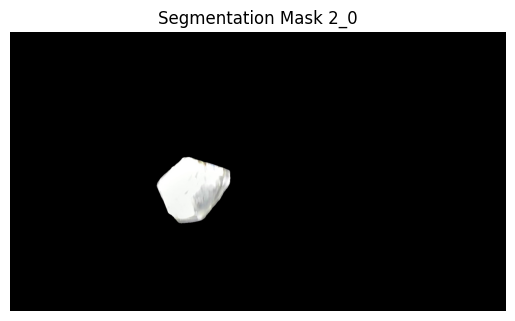

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_71.png


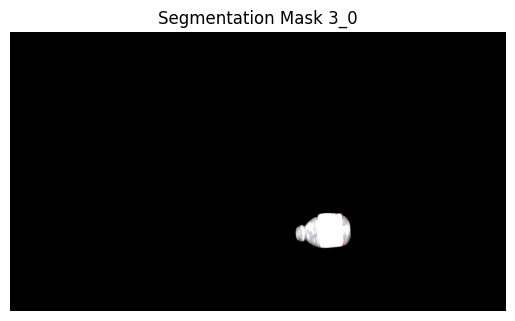

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_64.png


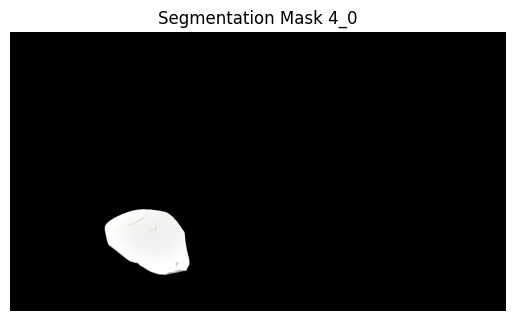

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_55.png


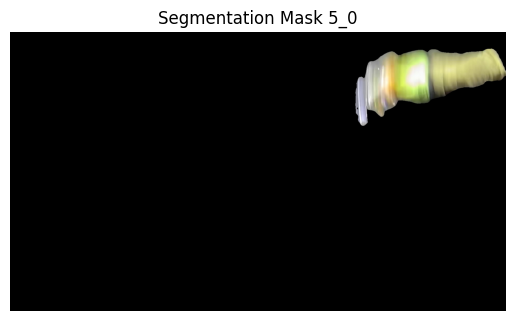

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_51.png


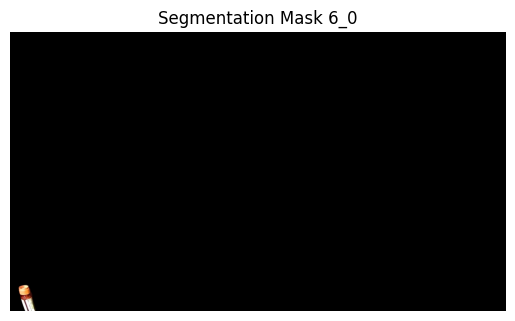

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_37.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


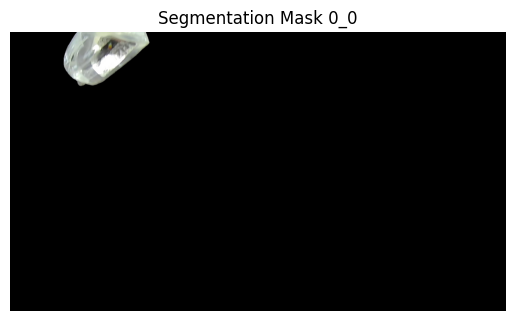

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_76.png


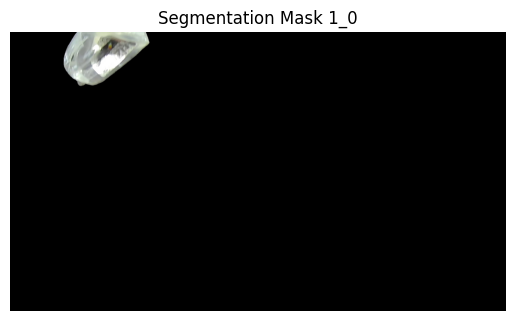

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_75.png


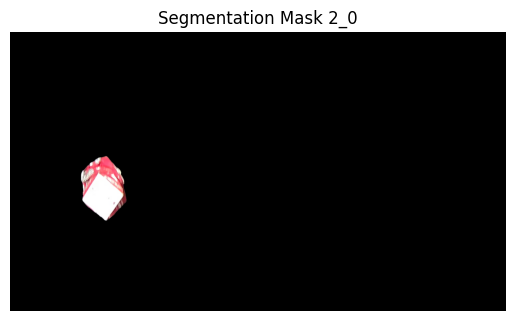

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_72.png


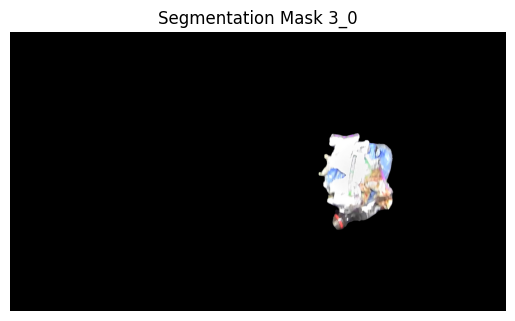

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_65.png


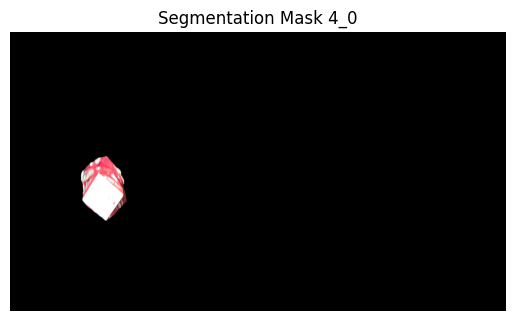

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_56.png


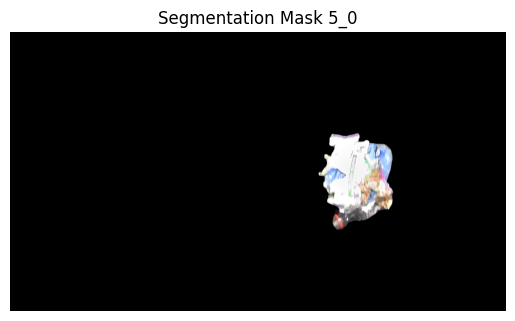

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_52.png


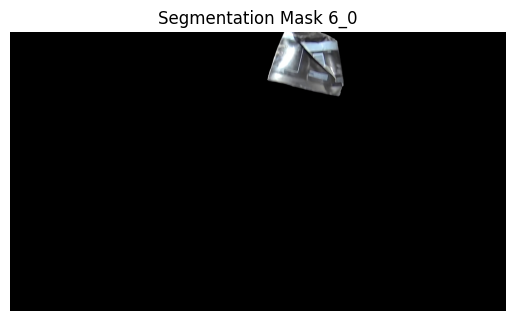

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_38.png


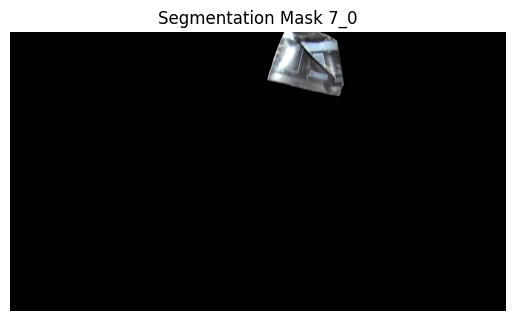

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_32.png


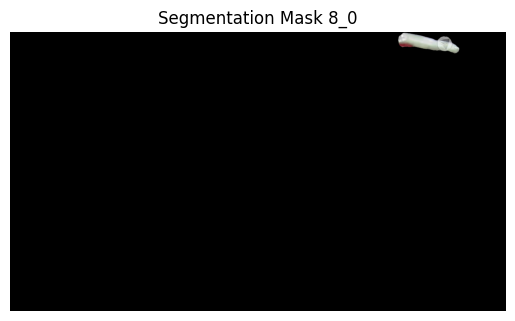

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_24.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


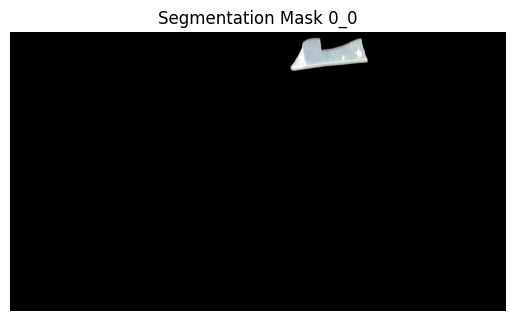

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_77.png


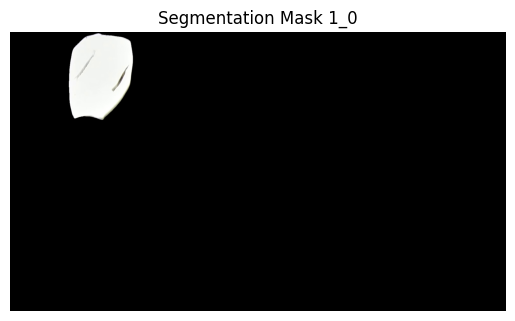

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_76.png


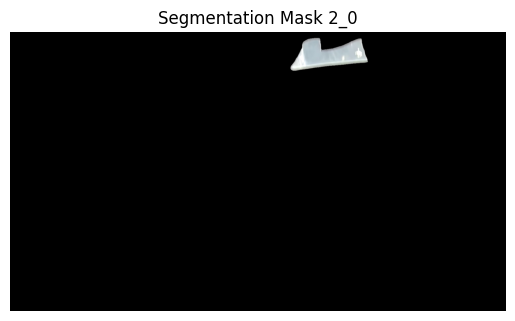

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_73.png


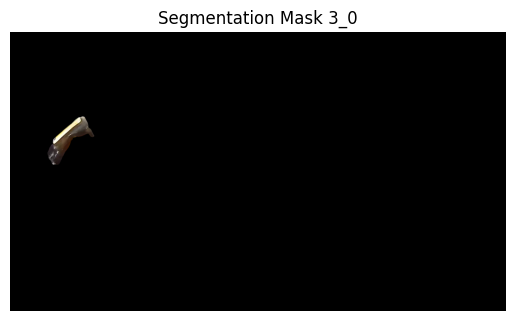

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_66.png


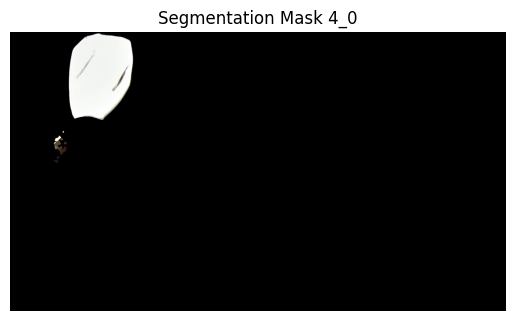

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_57.png


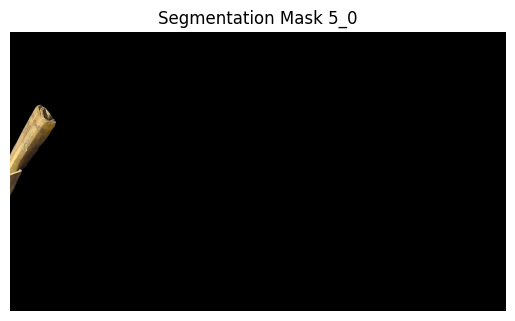

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_53.png


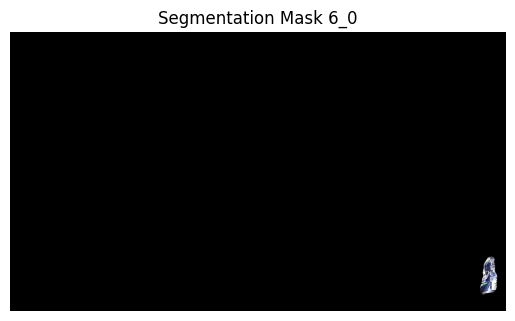

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_39.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


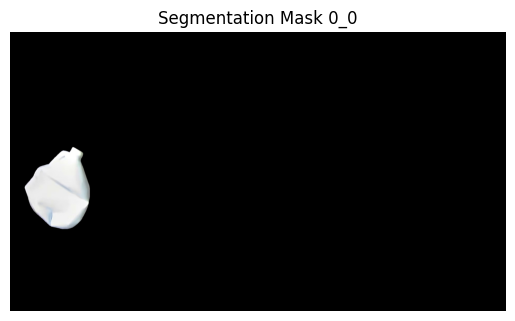

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_78.png


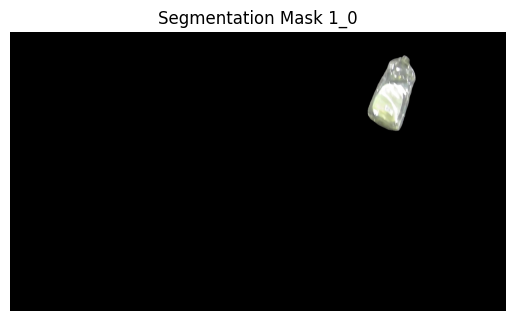

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_77.png


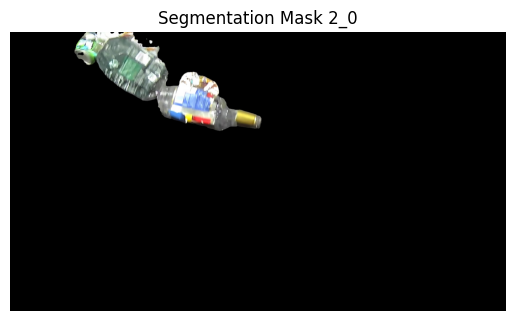

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_74.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


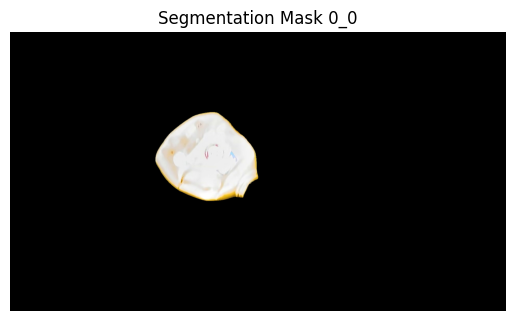

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_79.png


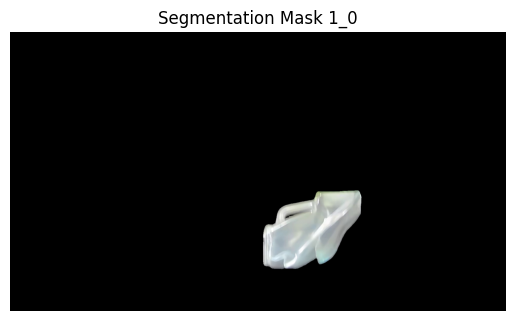

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_78.png


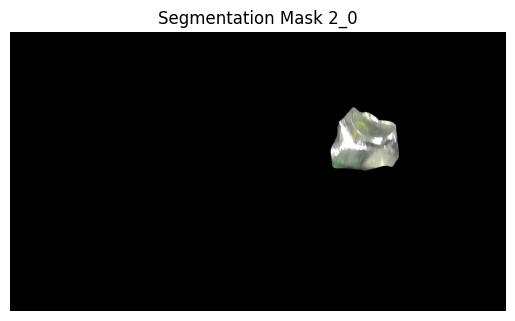

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_75.png


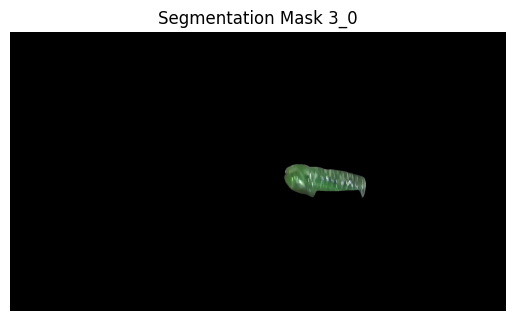

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_67.png


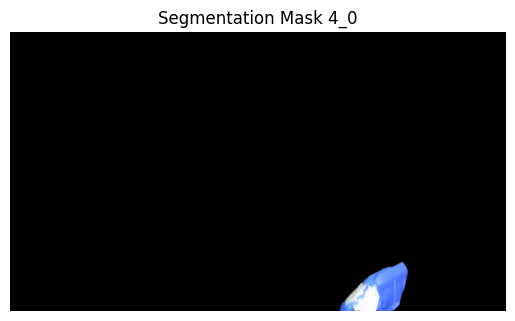

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_58.png


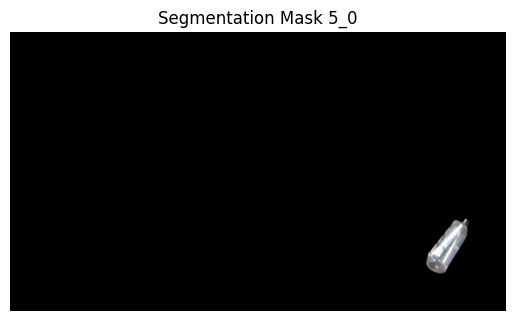

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_54.png


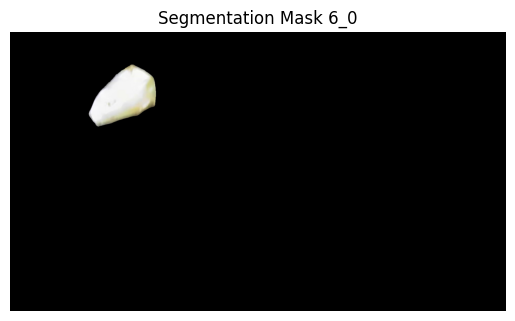

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_40.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


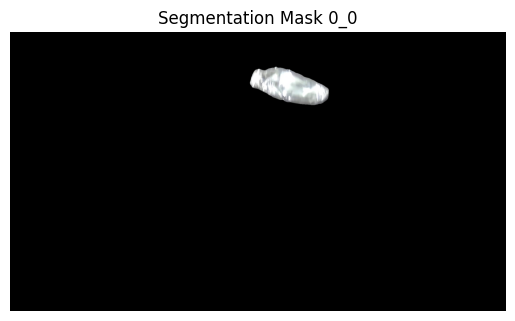

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_80.png


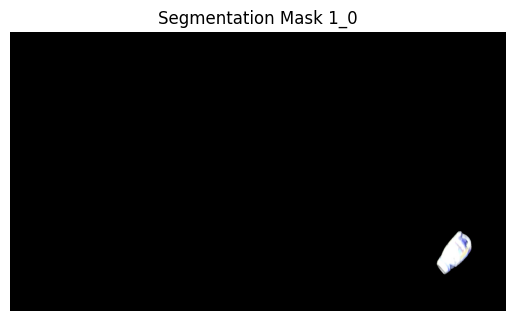

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_79.png


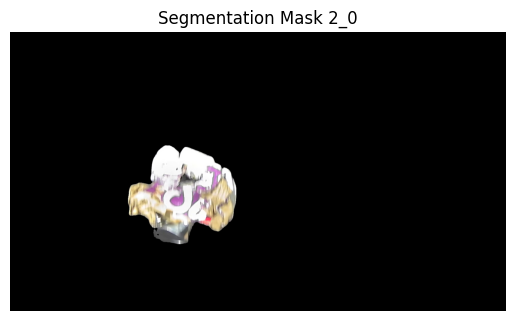

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_76.png


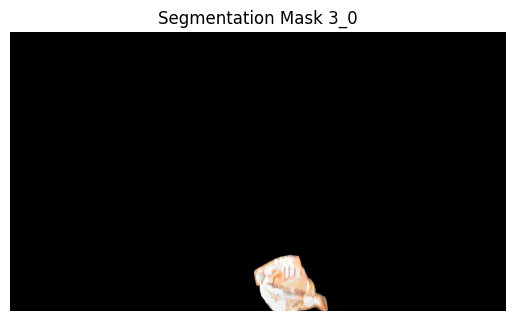

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_68.png


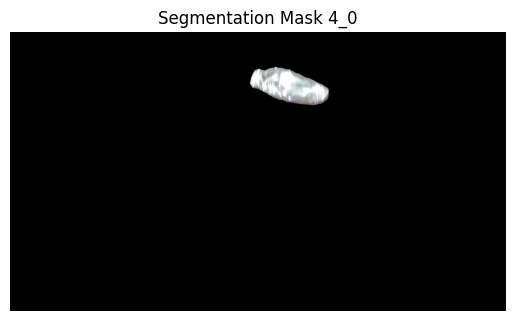

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_59.png


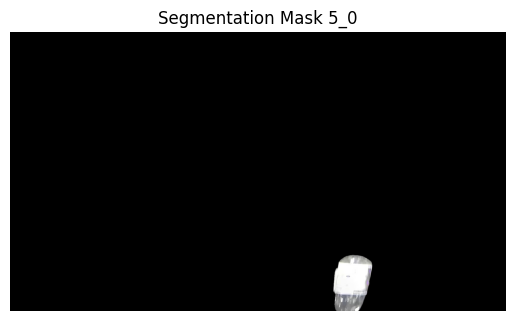

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_55.png


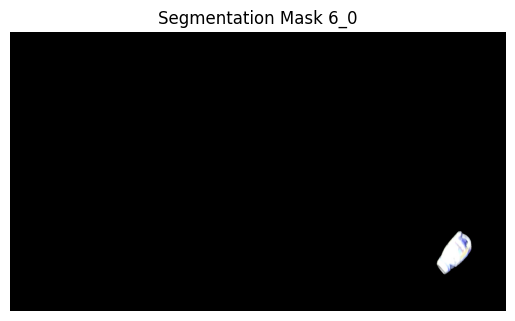

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_41.png


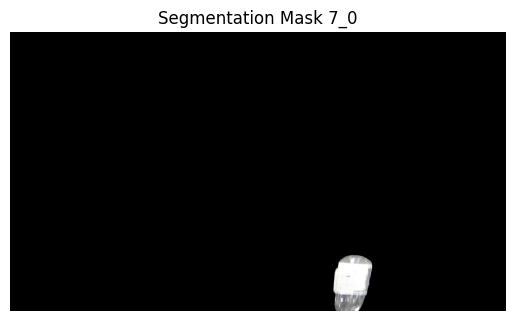

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_33.png


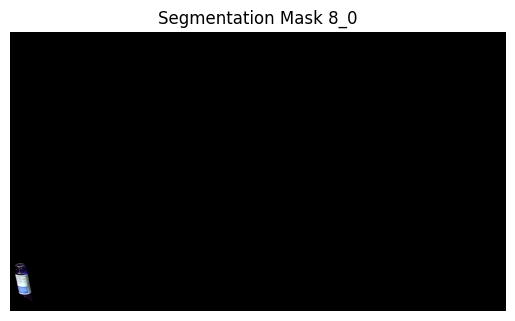

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_25.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


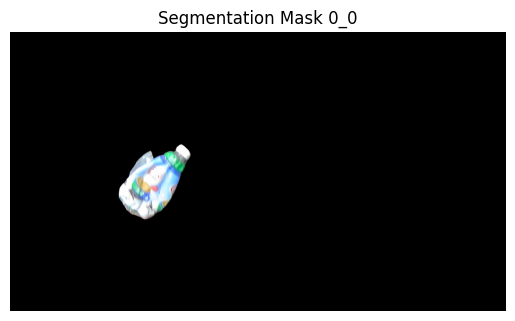

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_81.png


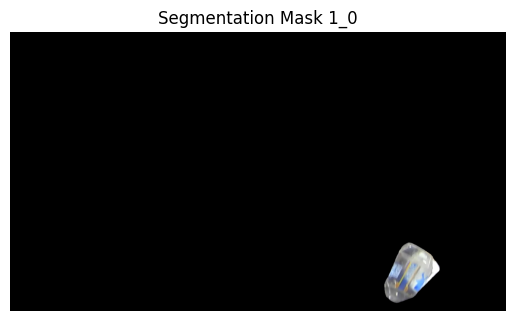

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_80.png


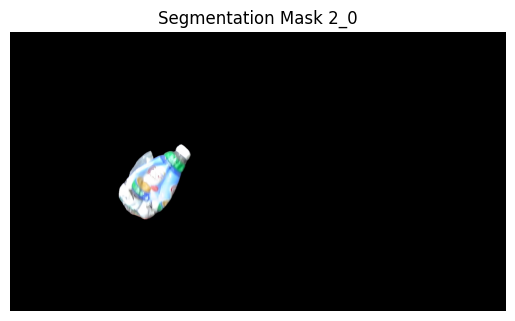

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_77.png


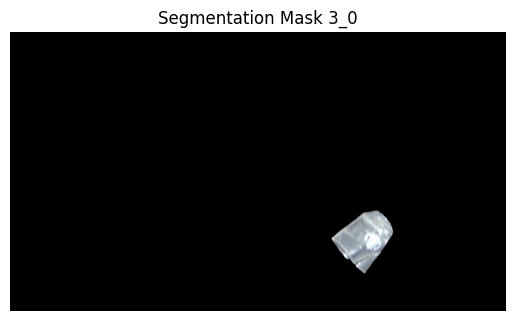

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_69.png


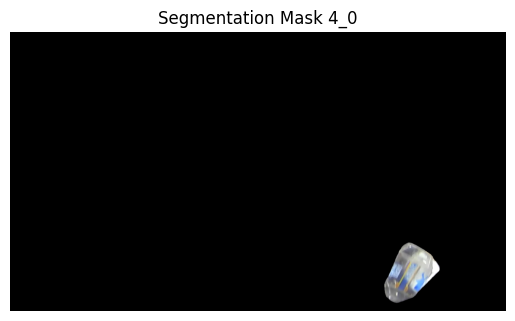

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_60.png


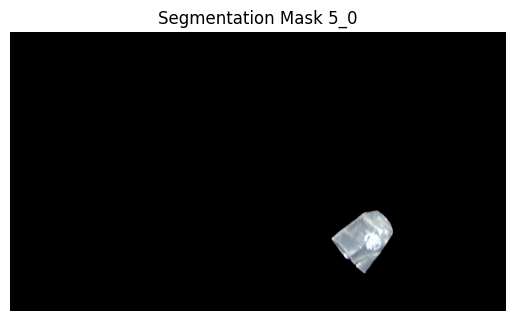

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_56.png


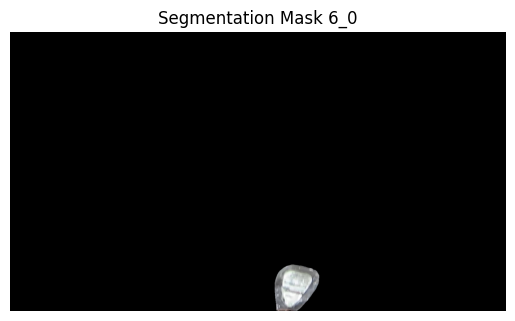

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_42.png


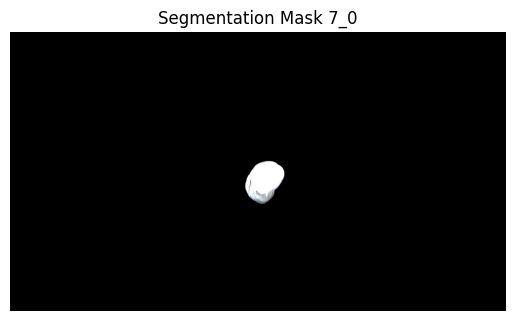

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_34.png


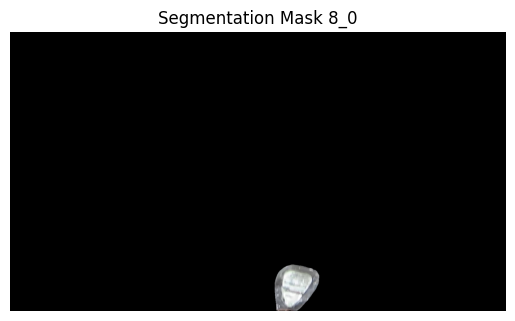

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_26.png


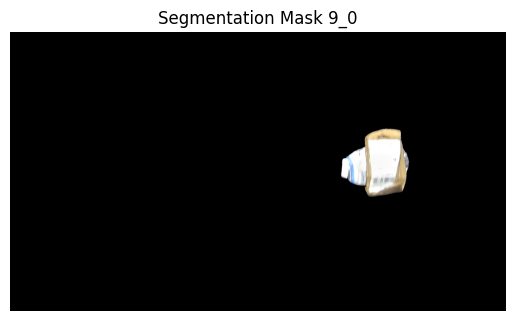

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_20.png


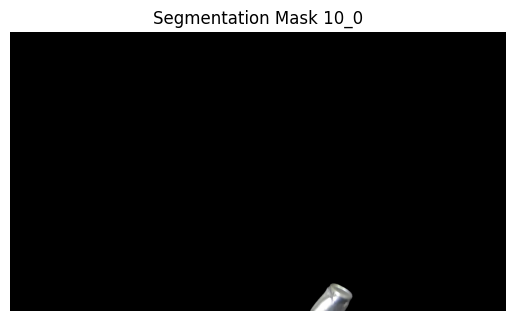

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_15.png


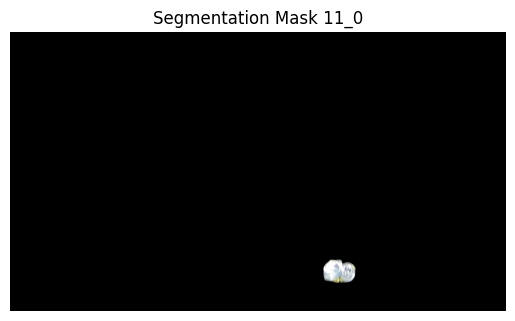

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_9.png


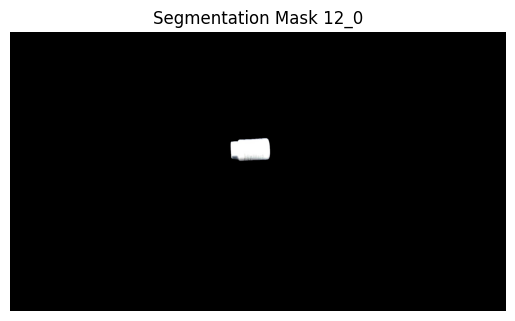

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_7.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


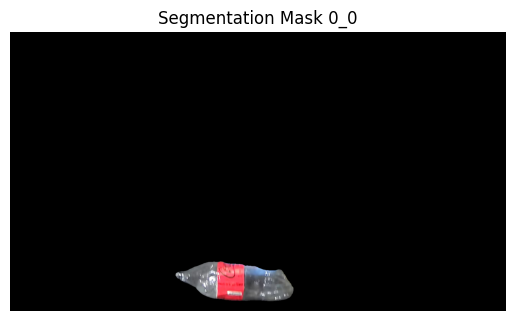

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_82.png


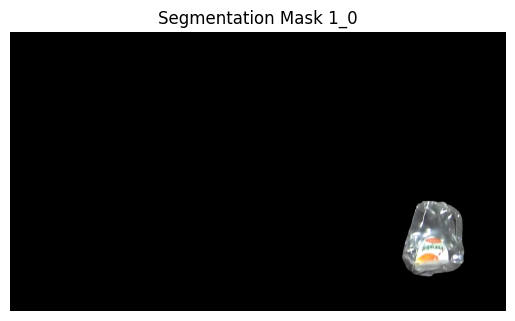

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_81.png


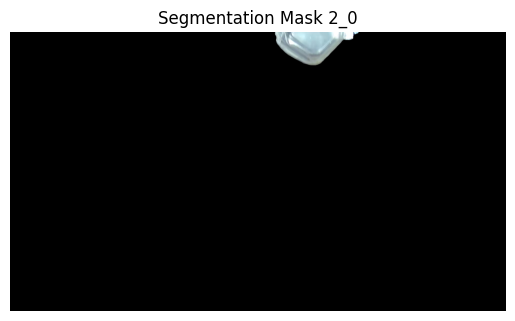

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_78.png


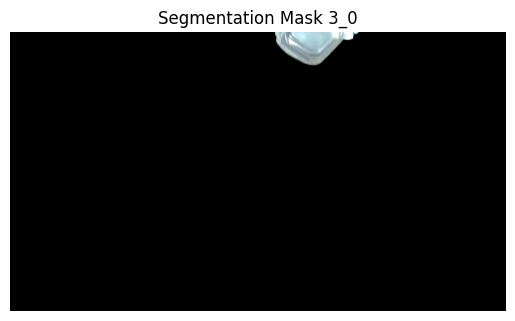

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_70.png


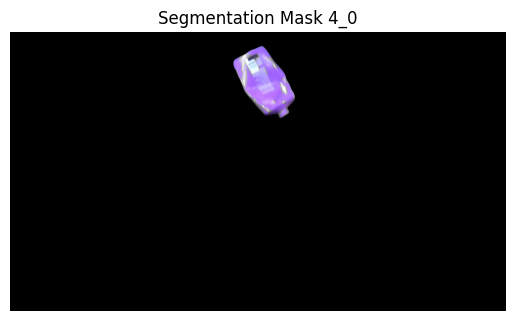

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_61.png


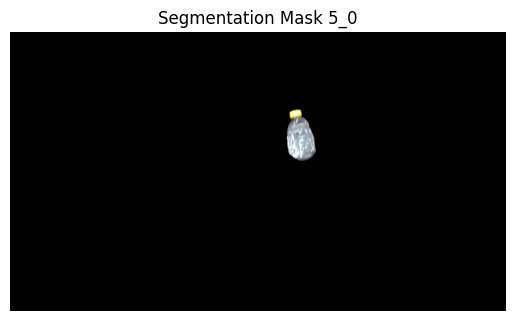

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_57.png


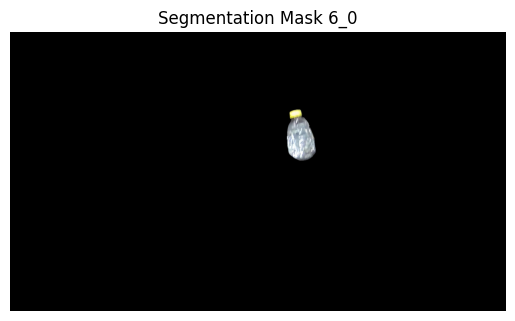

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_43.png


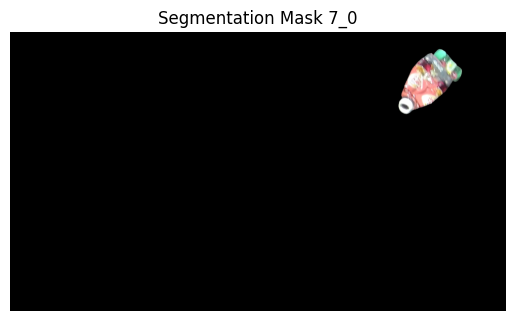

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_35.png


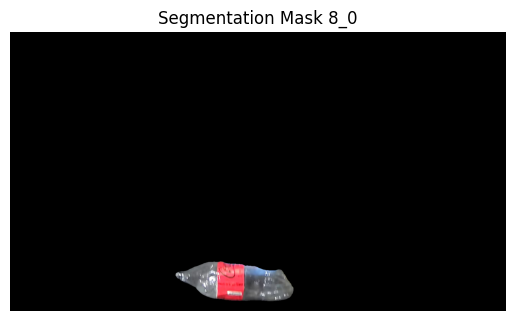

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_27.png


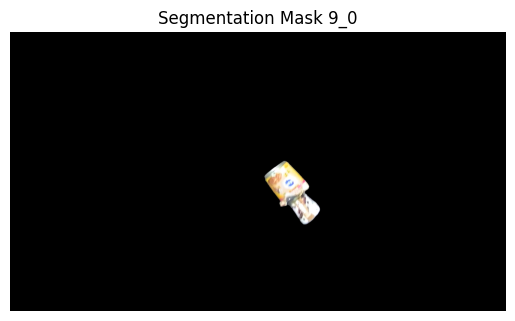

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_21.png


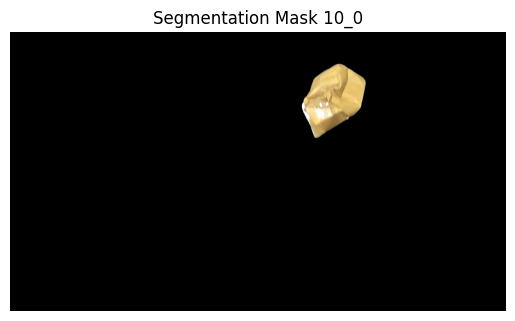

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_16.png


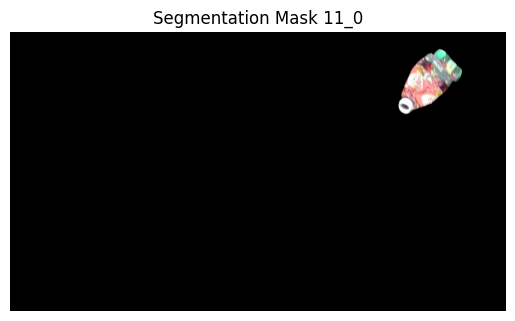

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_10.png


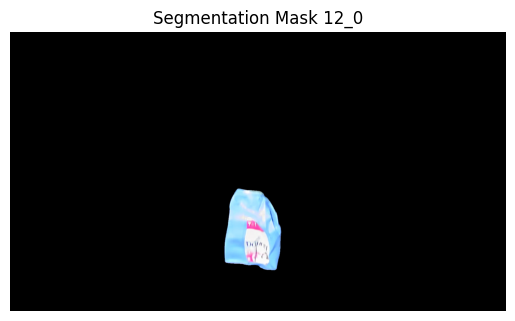

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_8.png


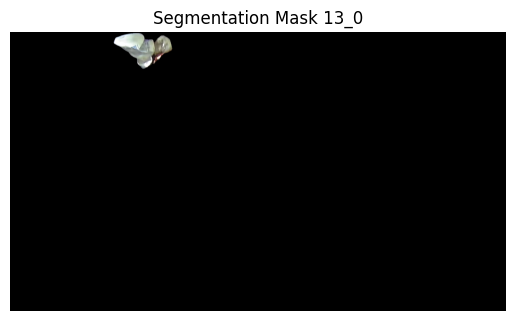

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_5.png


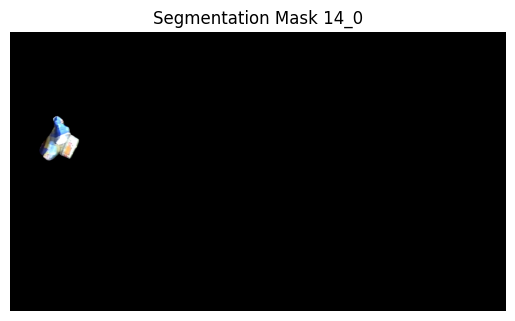

Segmentation mask 14_0 saved as /content/rando4/segmentation_mask_14_0_3.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


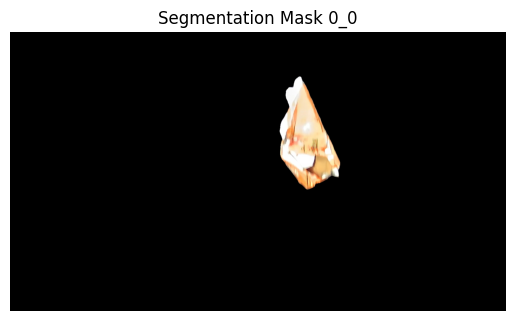

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_83.png


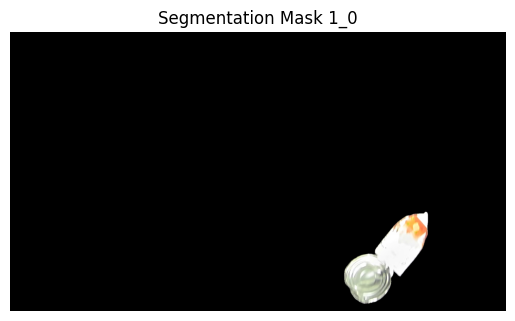

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_82.png


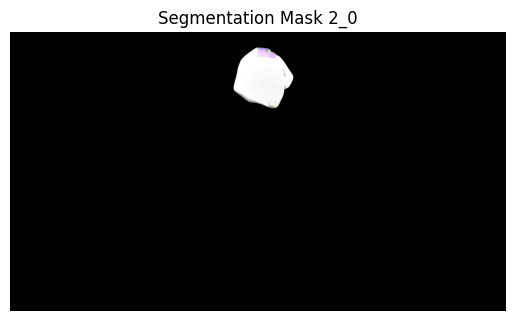

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_79.png


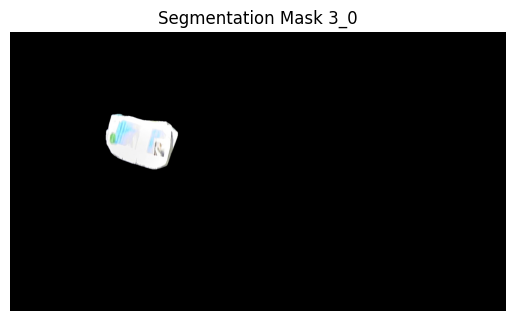

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_71.png


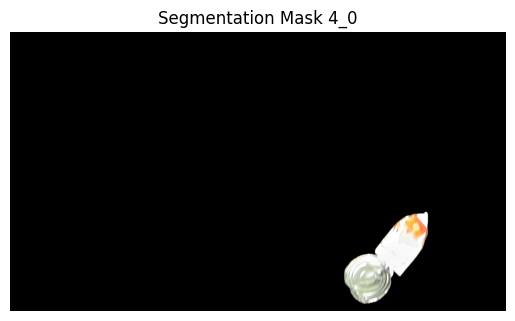

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_62.png


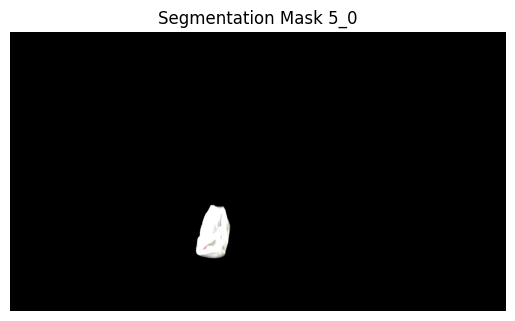

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_58.png


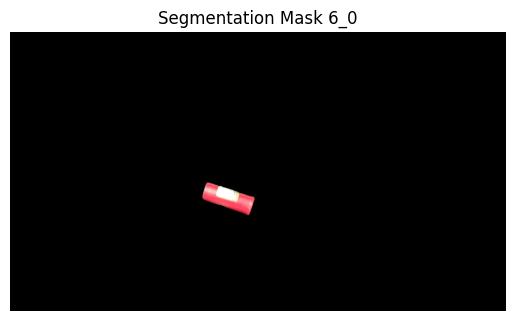

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_44.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


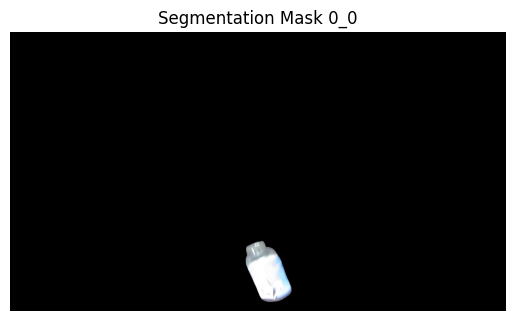

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_84.png


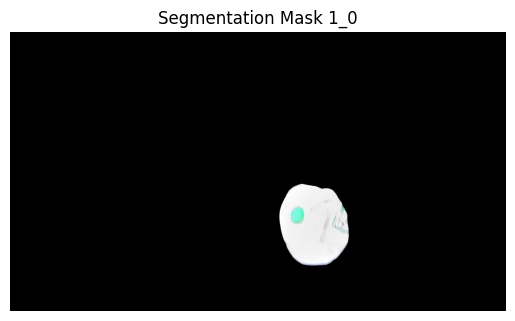

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_83.png


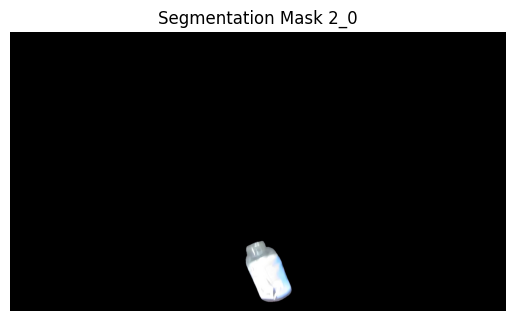

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_80.png


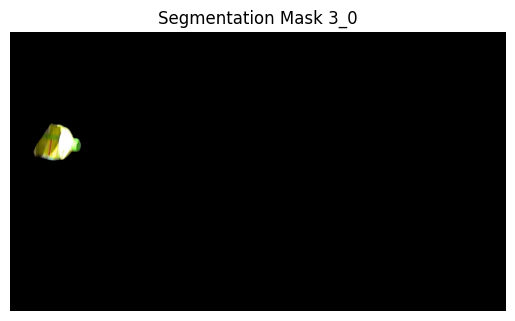

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_72.png


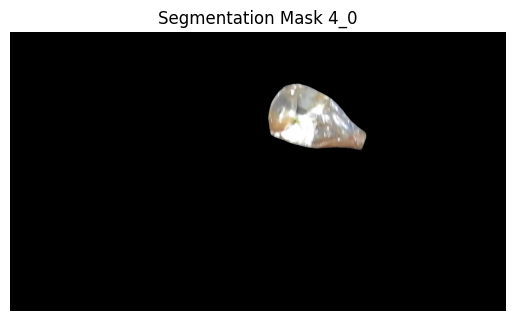

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_63.png


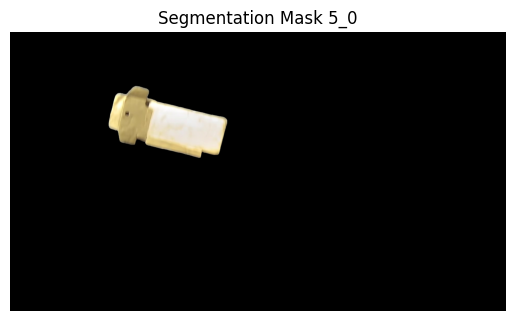

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_59.png


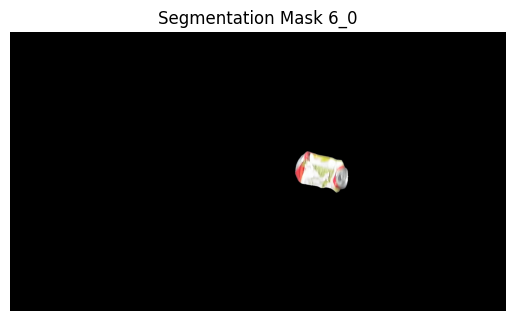

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_45.png


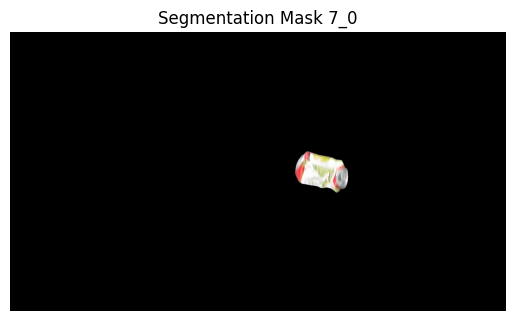

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_36.png


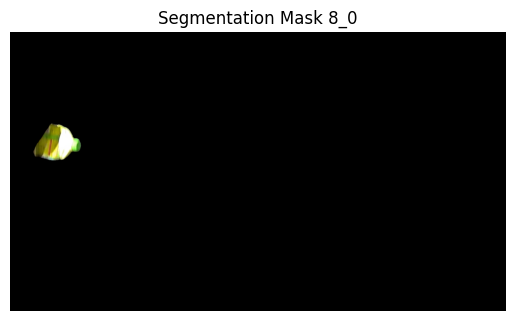

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_28.png


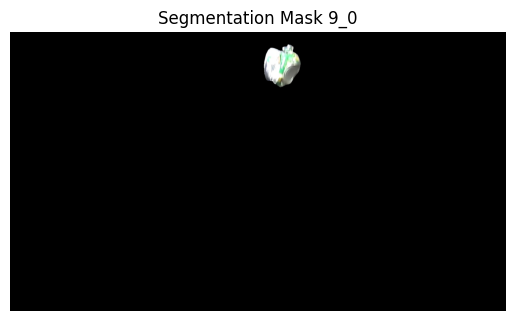

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_22.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


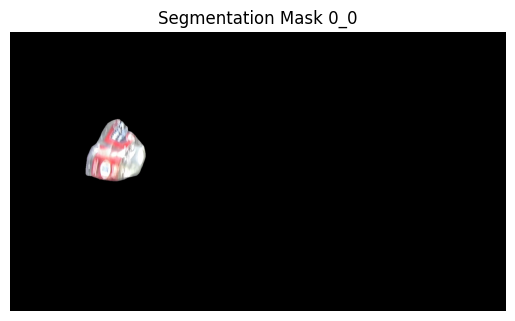

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_85.png


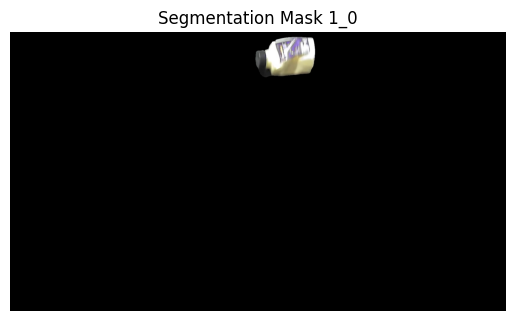

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_84.png


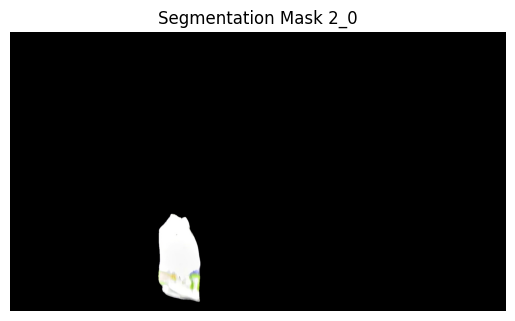

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_81.png


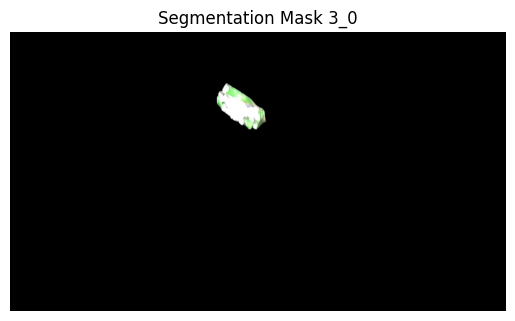

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_73.png


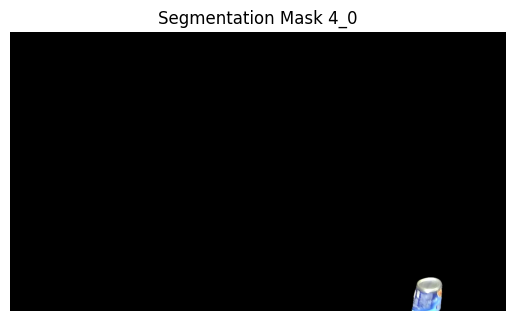

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_64.png


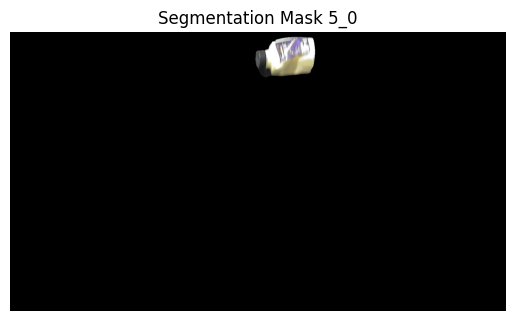

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_60.png


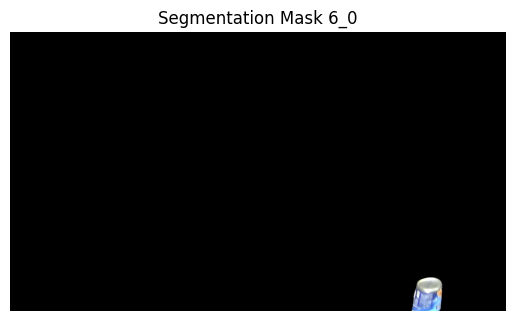

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_46.png


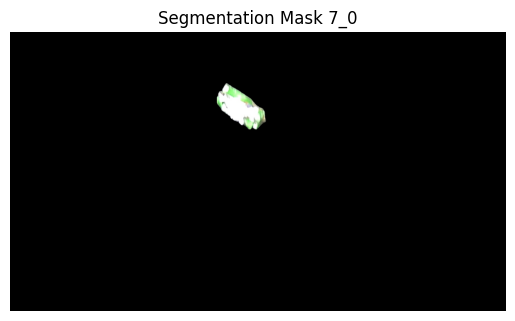

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_37.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


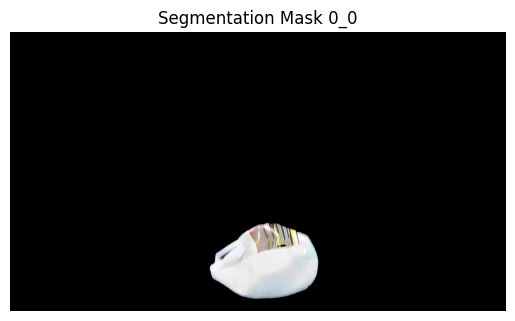

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_86.png


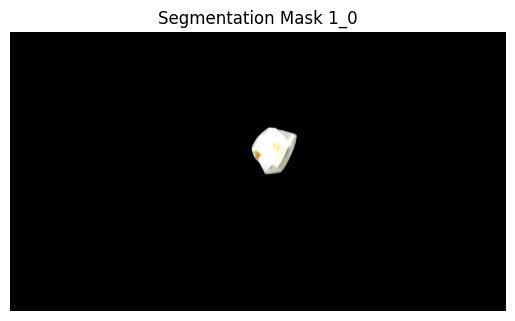

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_85.png


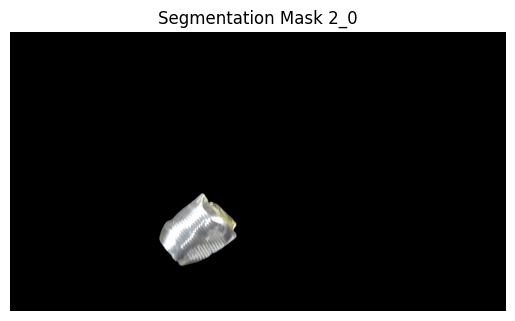

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_82.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


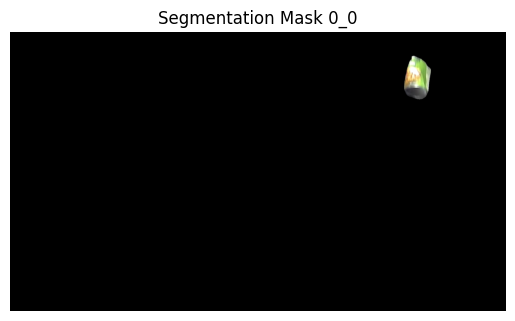

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_87.png


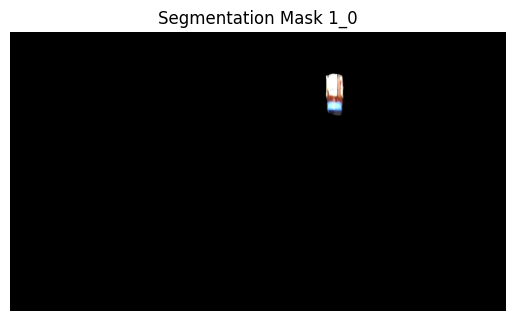

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_86.png


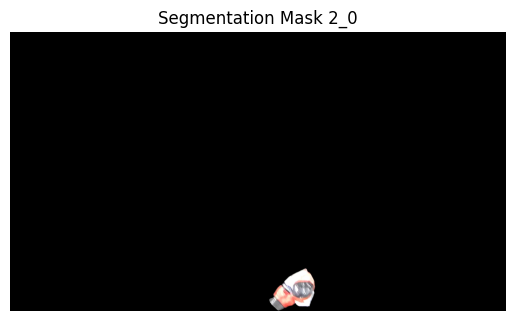

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_83.png


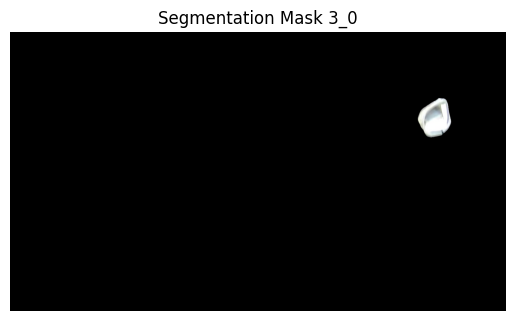

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_74.png


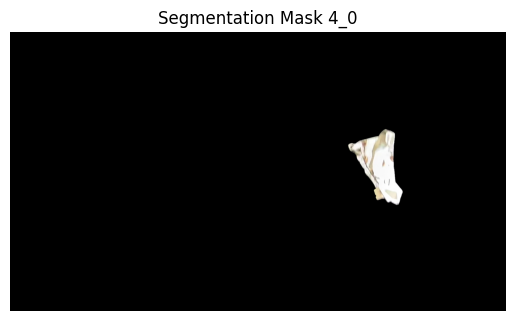

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_65.png


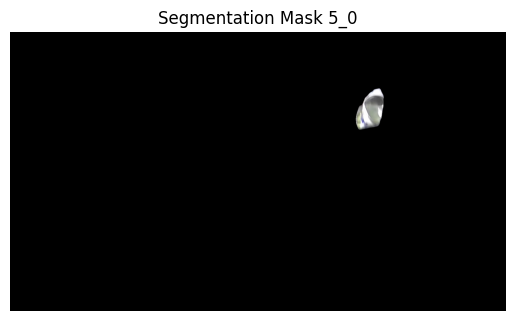

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_61.png


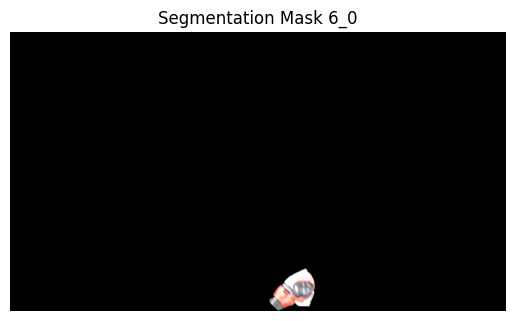

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_47.png


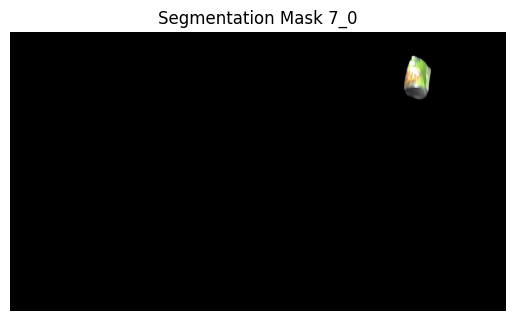

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_38.png


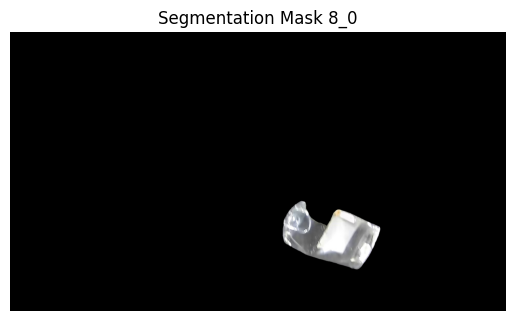

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_29.png


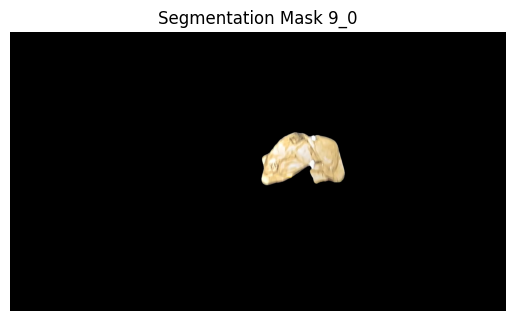

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_23.png


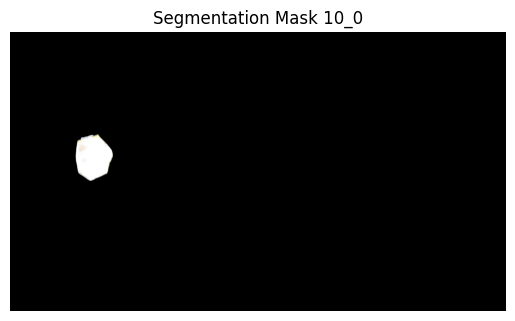

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_17.png


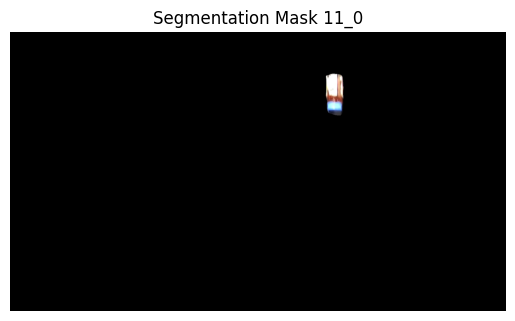

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_11.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


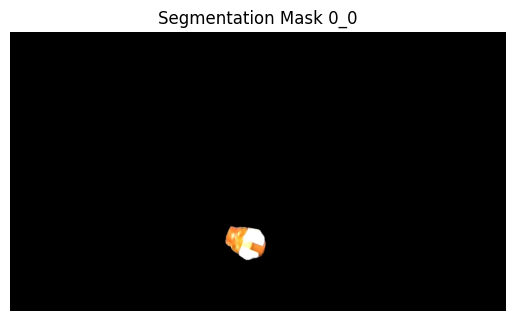

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_88.png


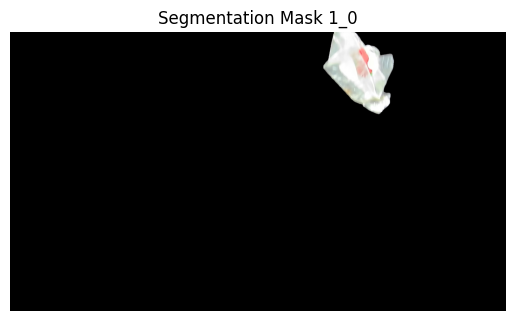

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_87.png


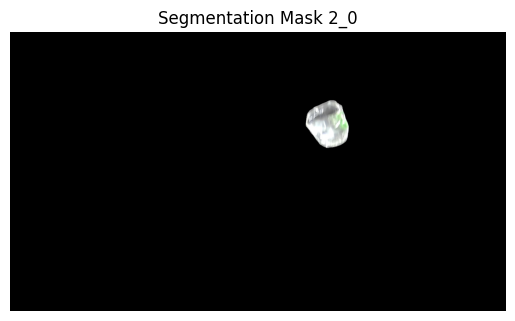

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_84.png


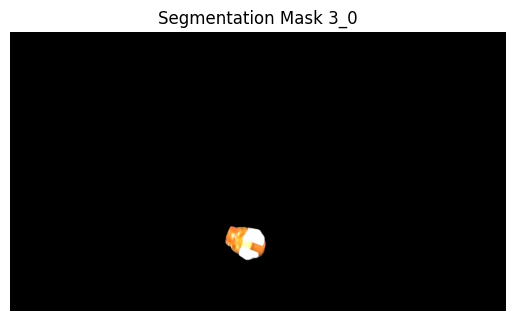

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_75.png


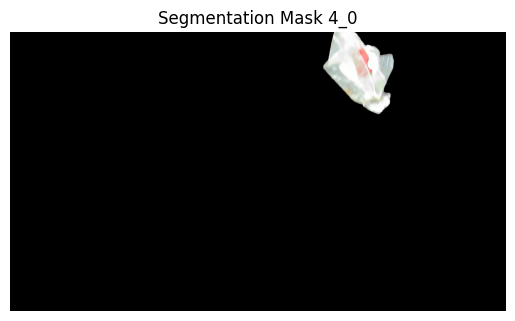

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_66.png


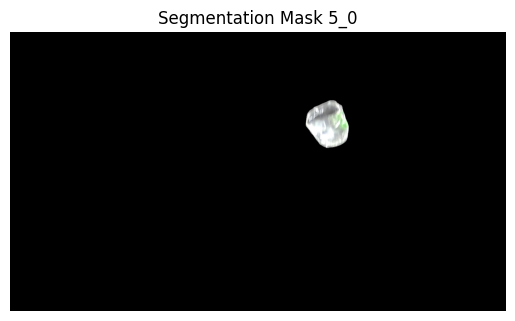

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_62.png


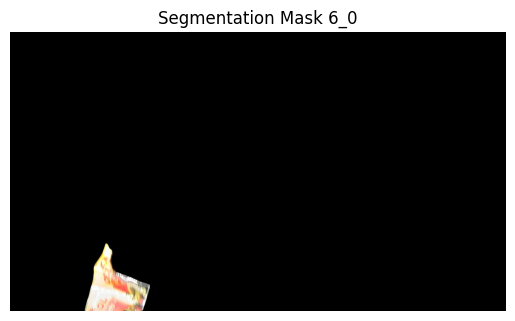

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_48.png


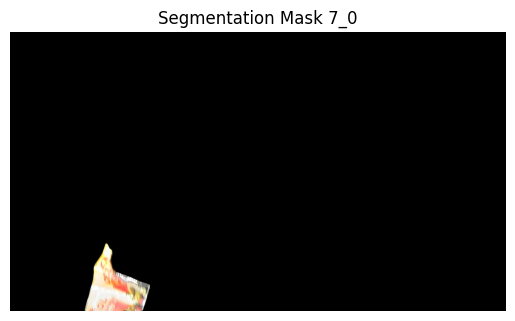

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_39.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


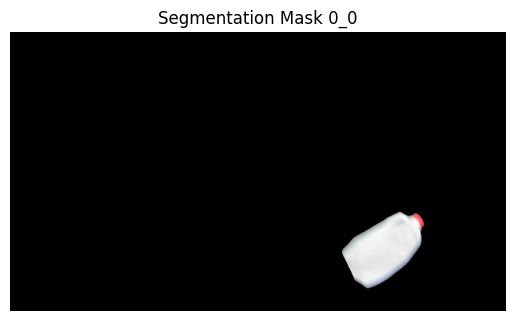

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_89.png


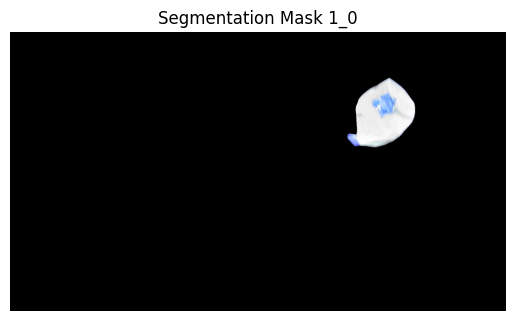

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_88.png


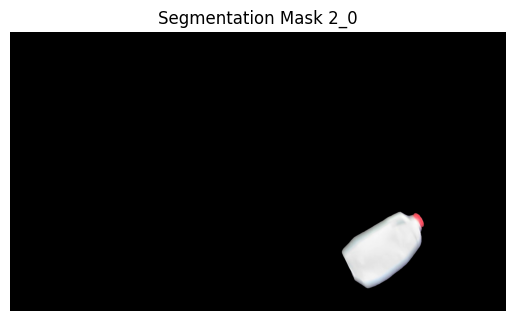

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_85.png


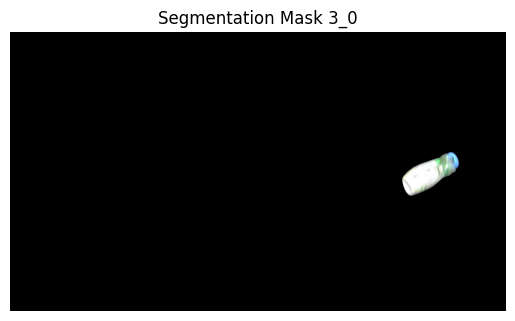

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_76.png


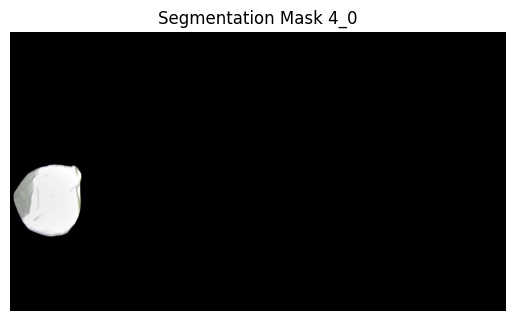

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_67.png


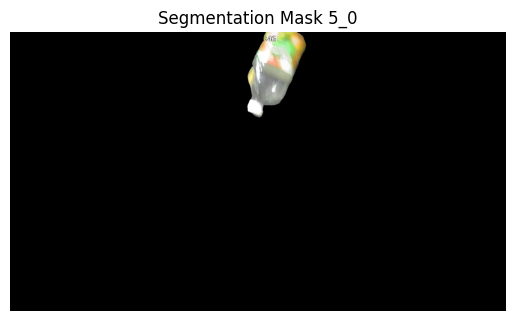

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_63.png


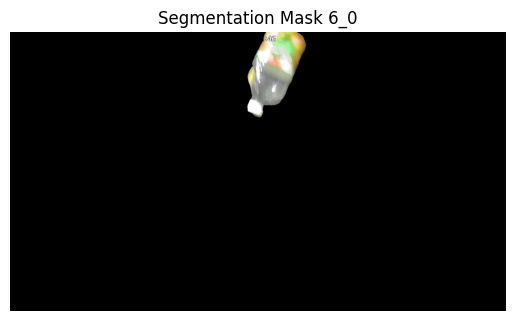

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_49.png


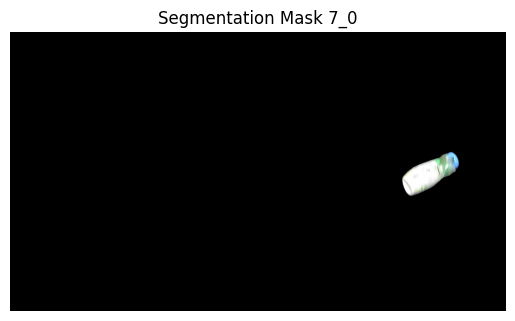

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_40.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


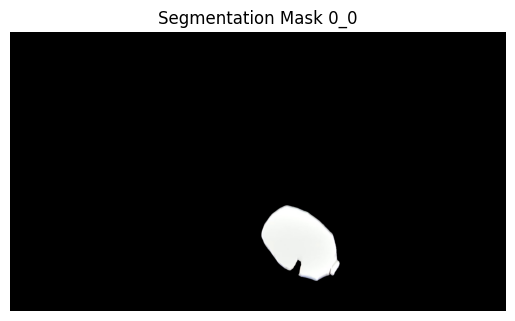

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_90.png


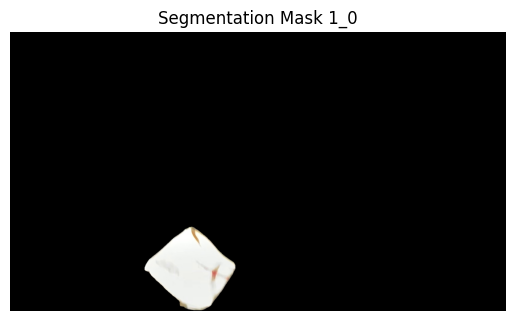

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_89.png


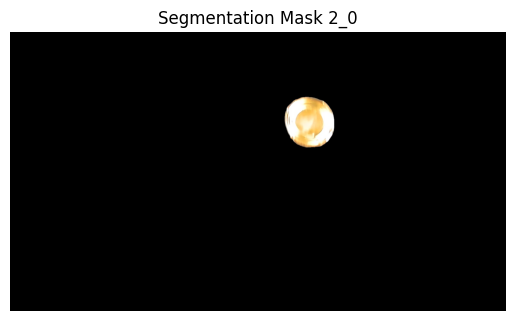

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_86.png


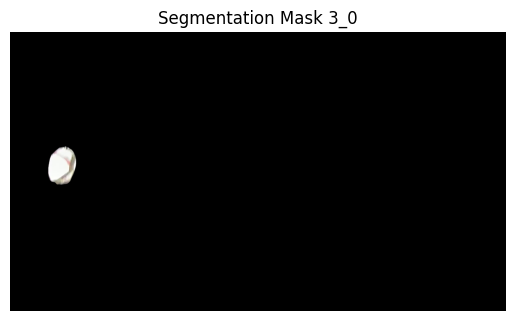

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_77.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


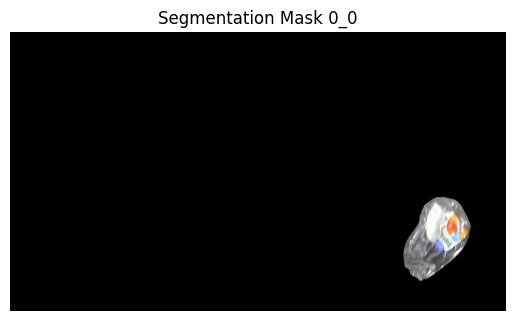

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_91.png


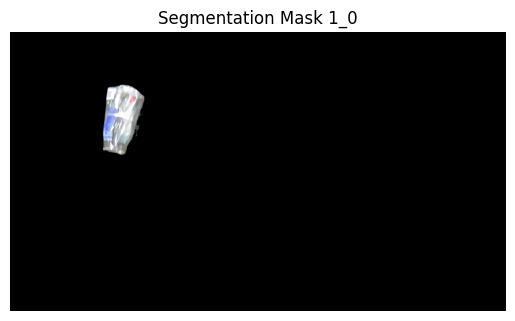

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_90.png


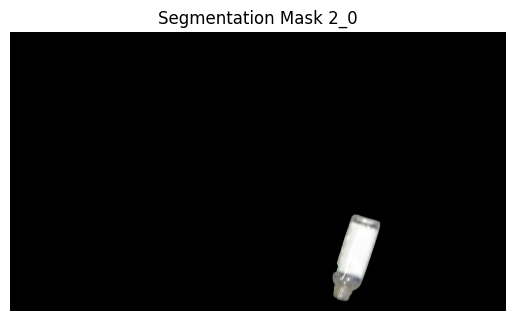

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_87.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


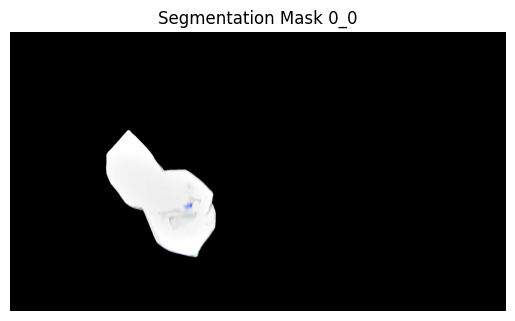

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_92.png


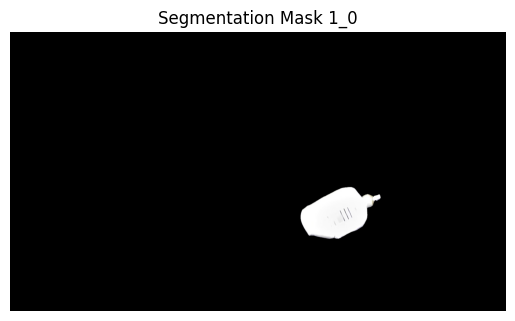

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_91.png


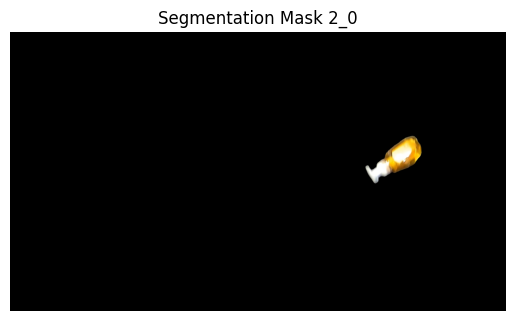

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_88.png


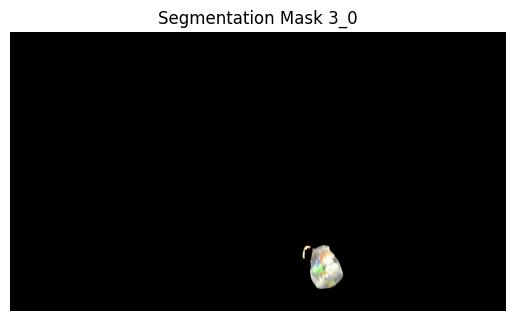

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_78.png


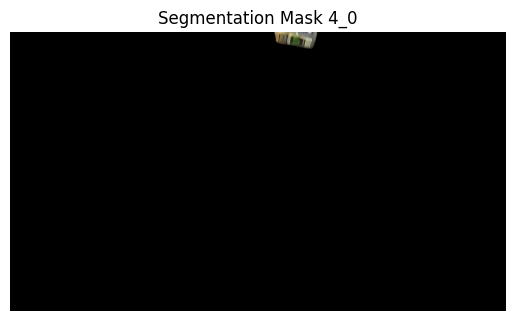

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_68.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


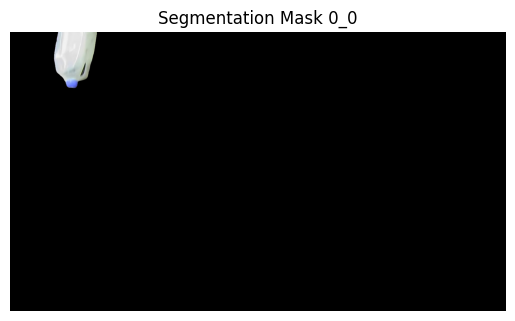

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_93.png


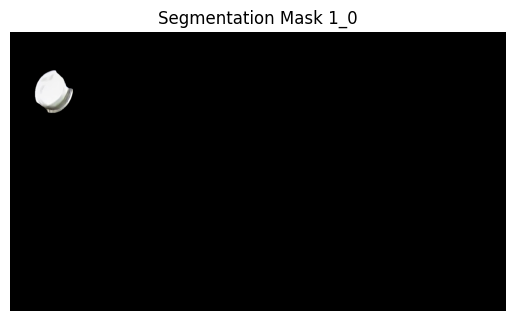

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_92.png


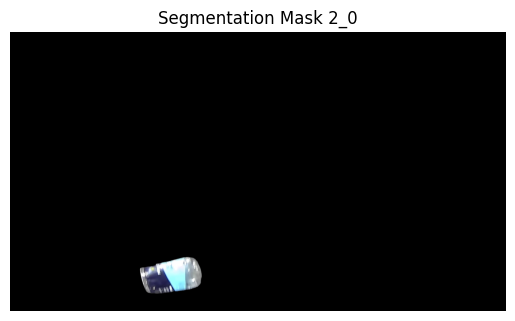

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_89.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


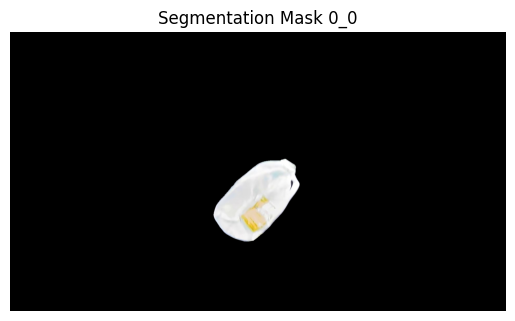

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_94.png


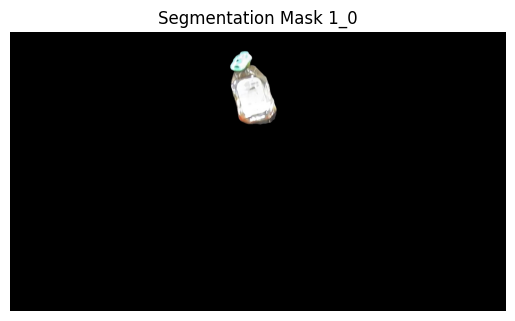

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_93.png


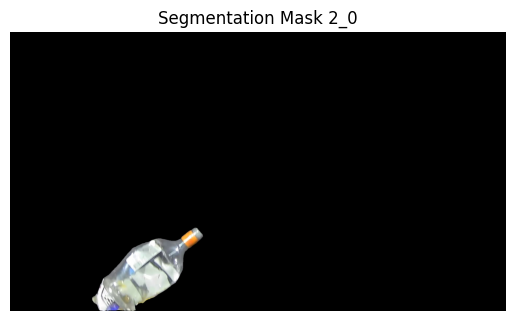

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_90.png


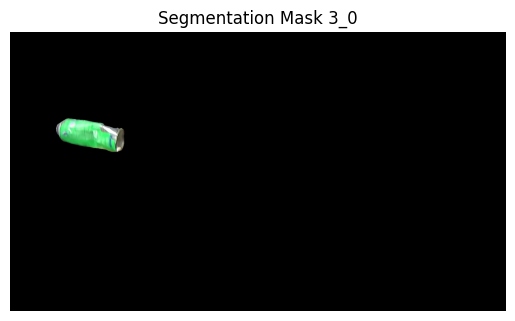

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_79.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


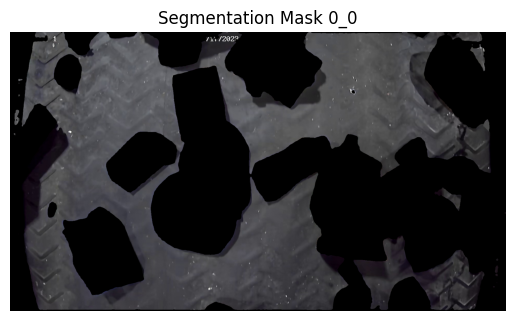

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_95.png


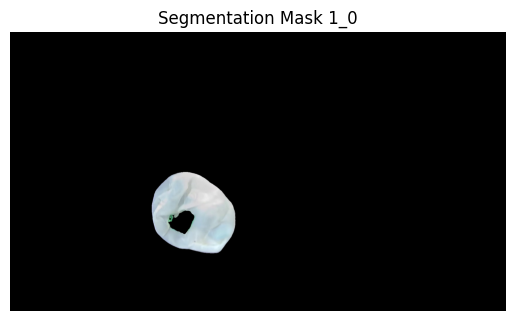

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_94.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


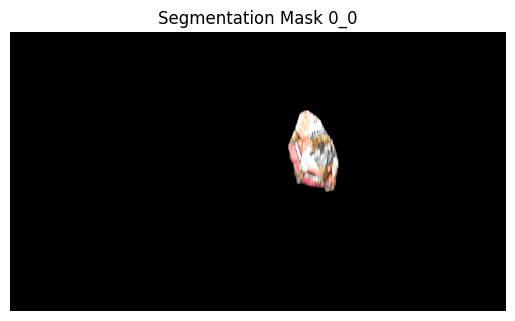

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_96.png


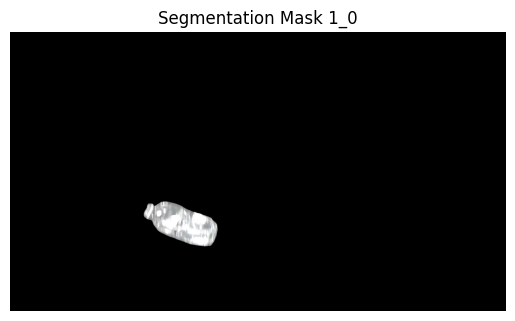

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_95.png


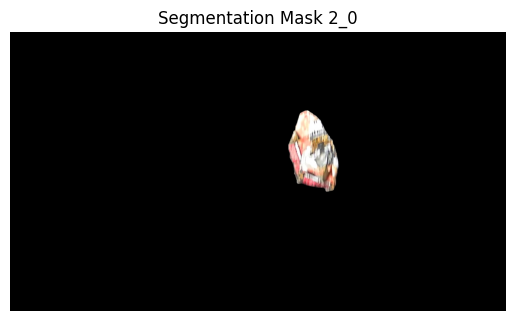

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_91.png


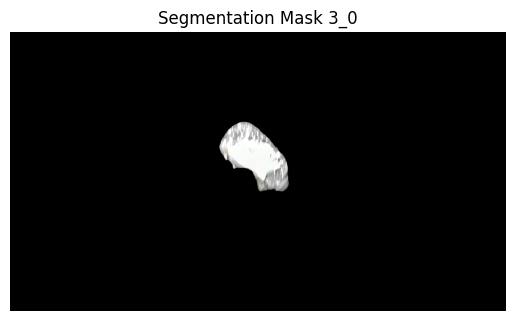

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_80.png


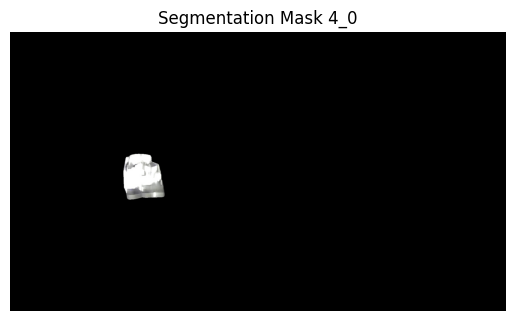

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_69.png


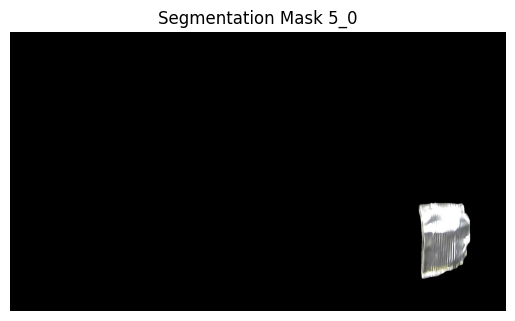

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_64.png


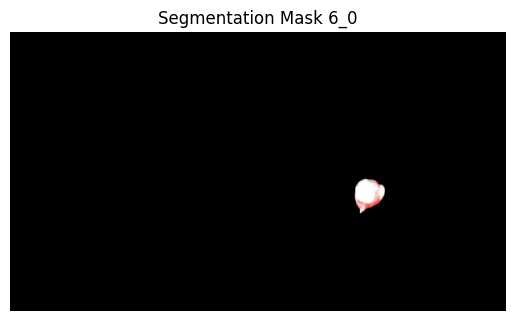

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_50.png


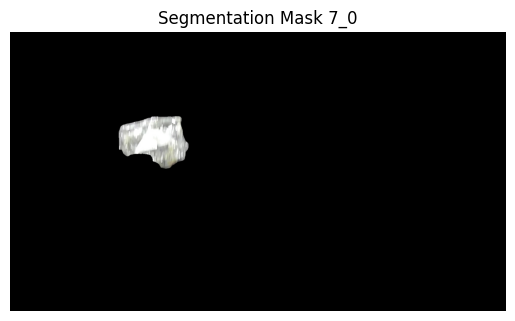

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_41.png


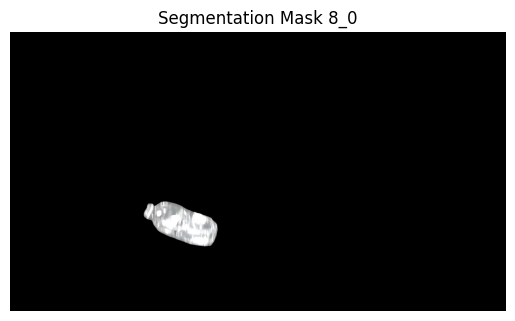

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_30.png


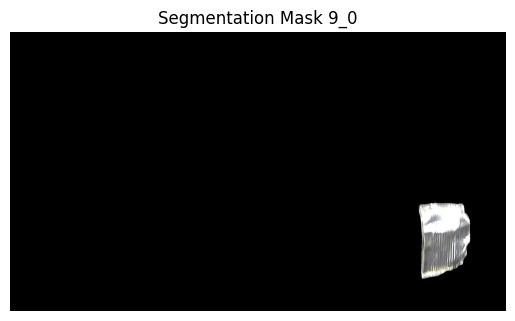

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_24.png


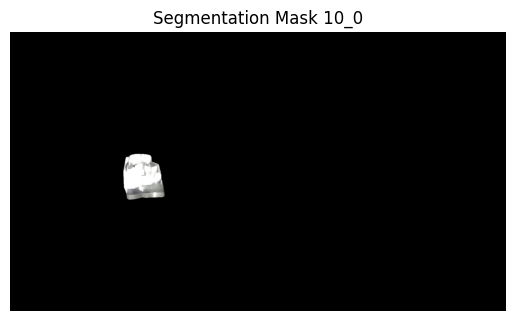

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_18.png


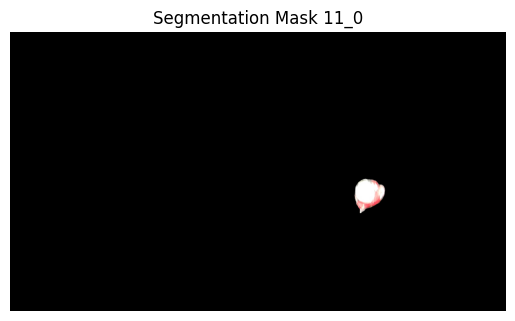

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_12.png


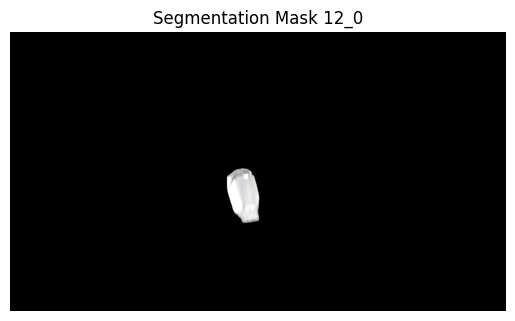

Segmentation mask 12_0 saved as /content/rando4/segmentation_mask_12_0_9.png


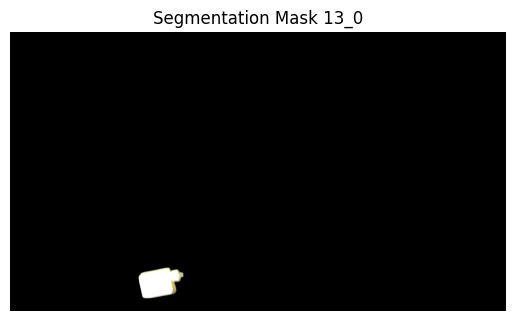

Segmentation mask 13_0 saved as /content/rando4/segmentation_mask_13_0_6.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


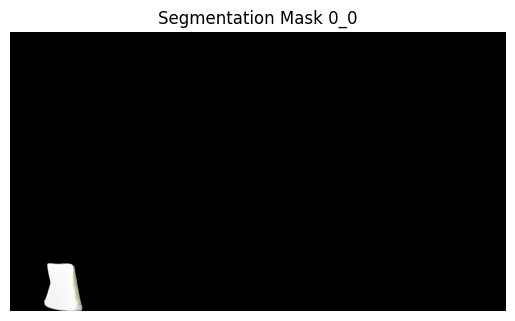

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_97.png


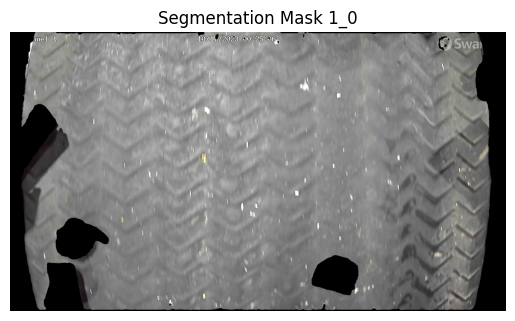

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_96.png


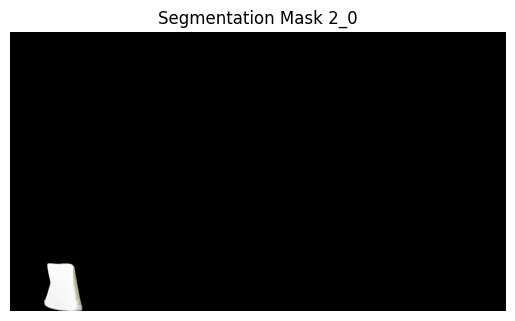

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_92.png


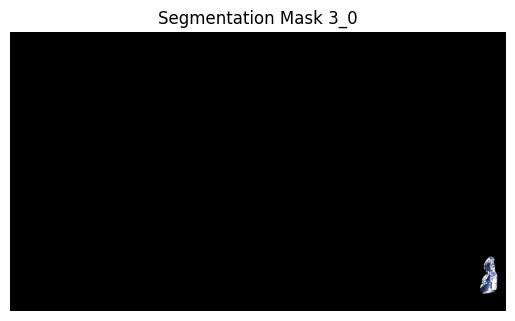

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_81.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


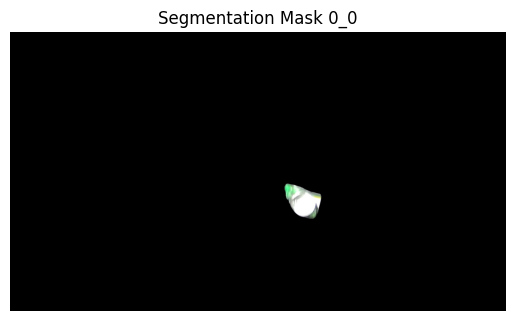

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_98.png


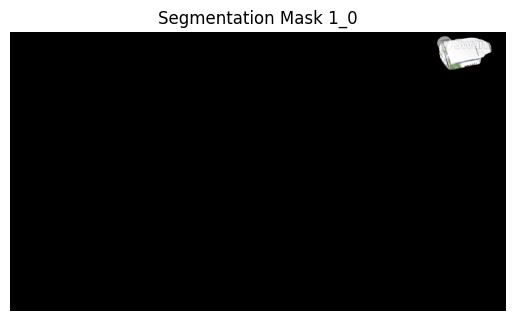

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_97.png


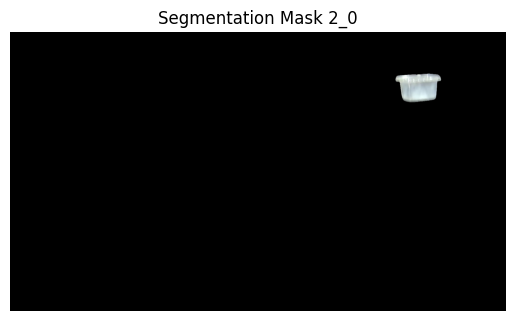

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_93.png


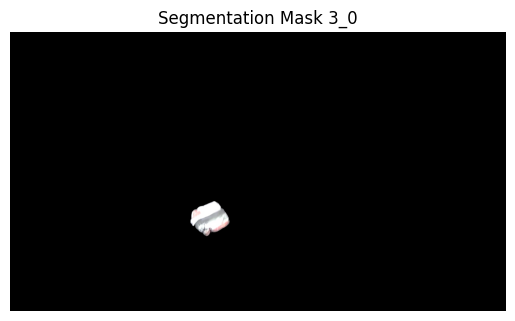

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_82.png


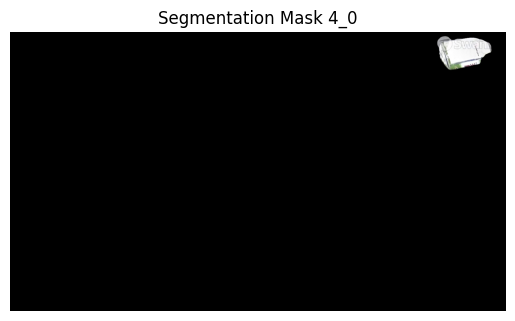

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_70.png


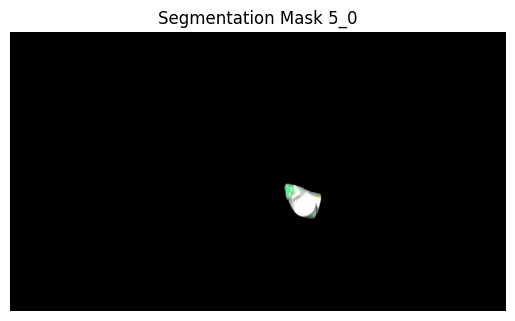

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_65.png


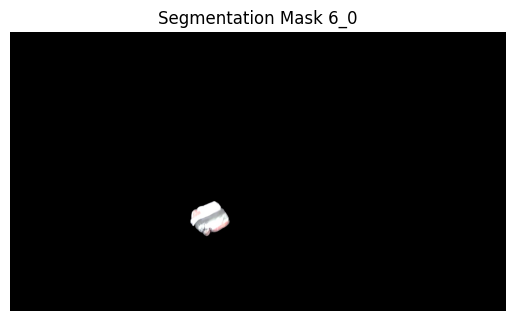

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_51.png


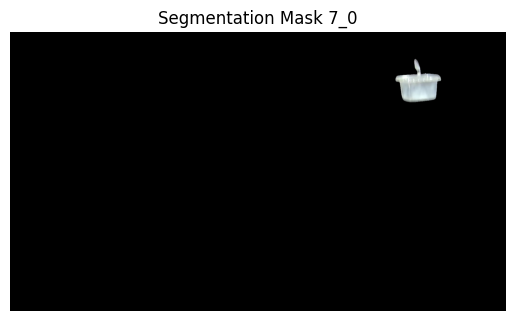

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_42.png


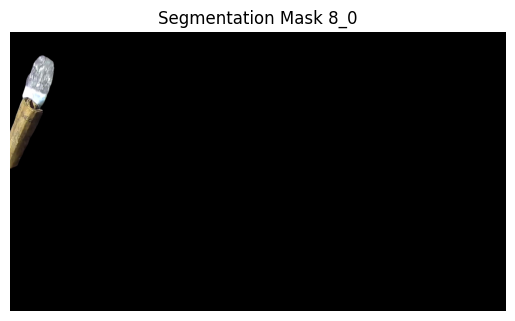

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_31.png


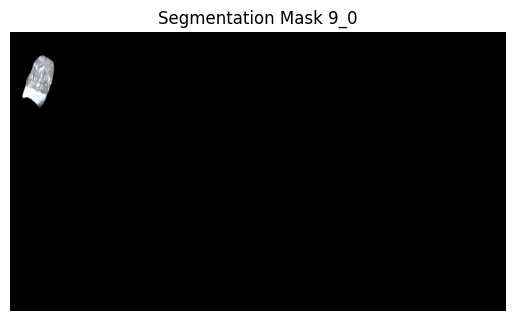

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_25.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


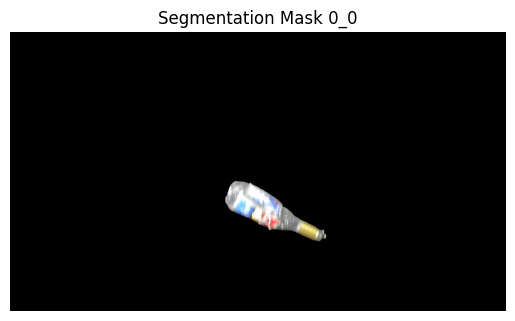

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_99.png


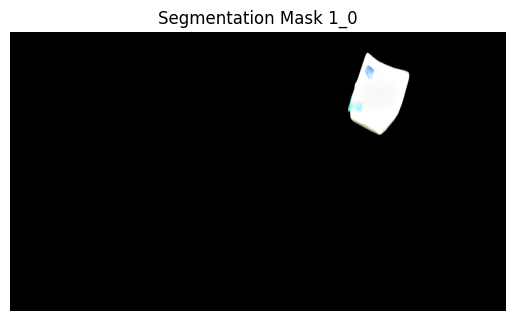

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_98.png


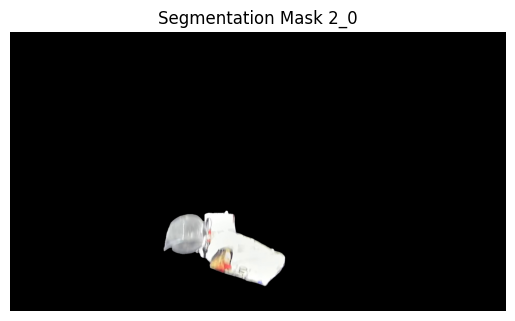

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_94.png


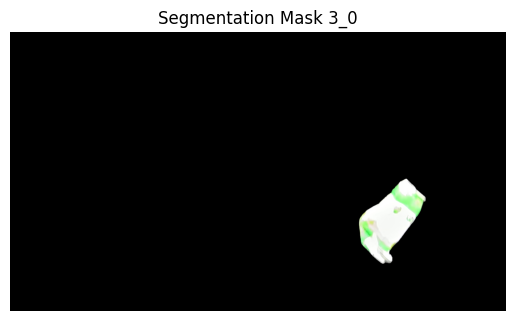

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_83.png


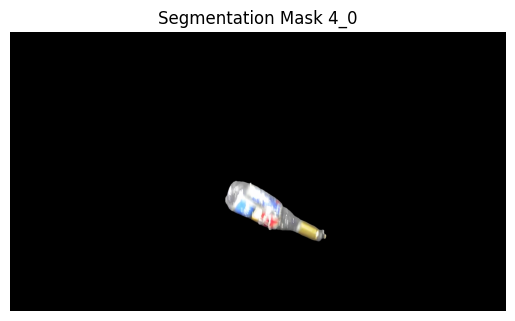

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_71.png


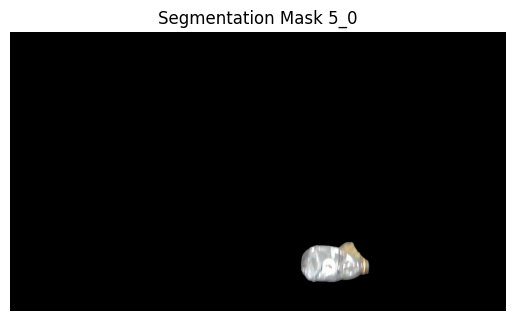

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_66.png


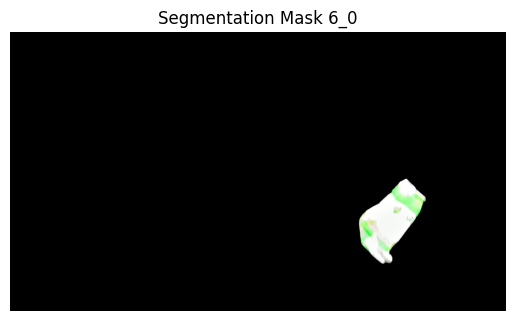

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_52.png


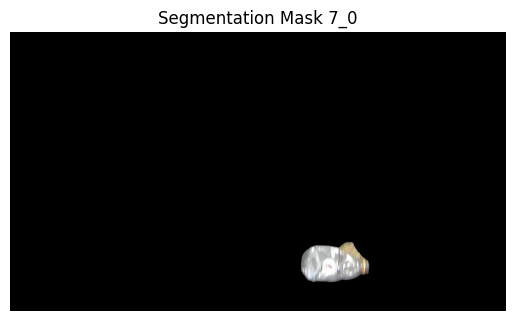

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_43.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


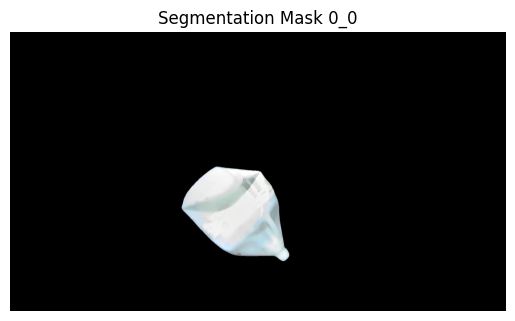

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_100.png


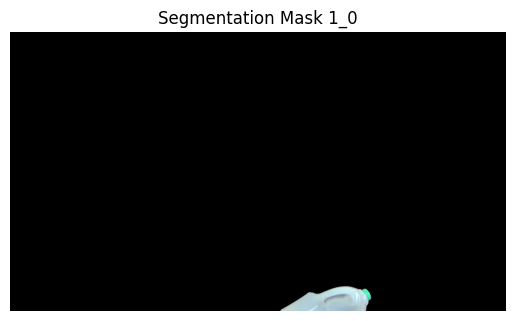

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_99.png


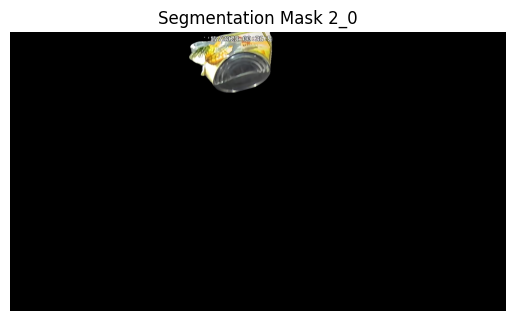

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_95.png


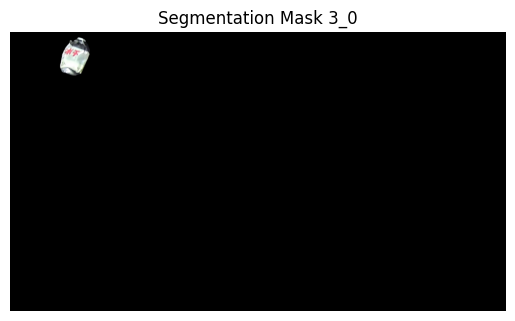

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_84.png


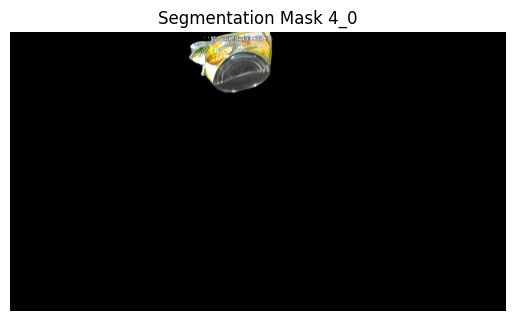

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_72.png


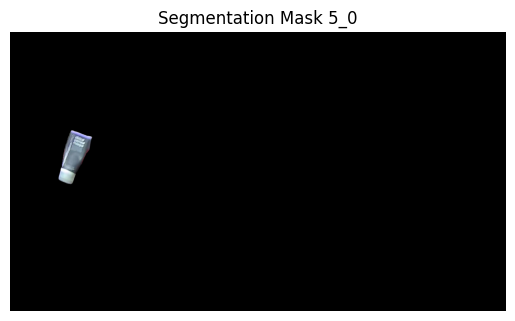

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_67.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


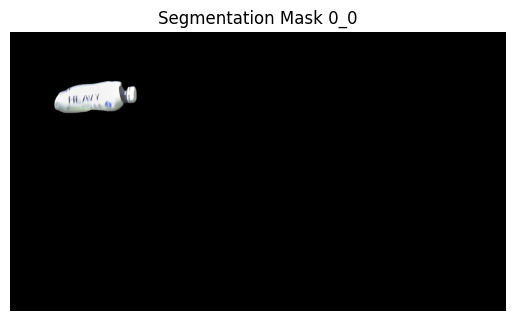

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_101.png


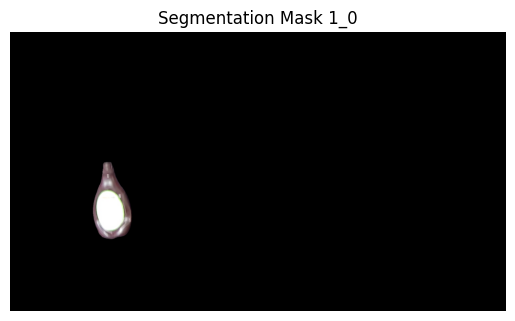

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_100.png


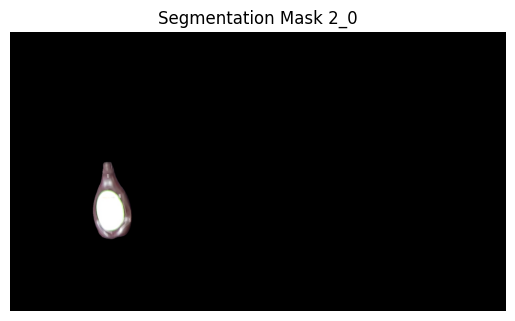

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_96.png


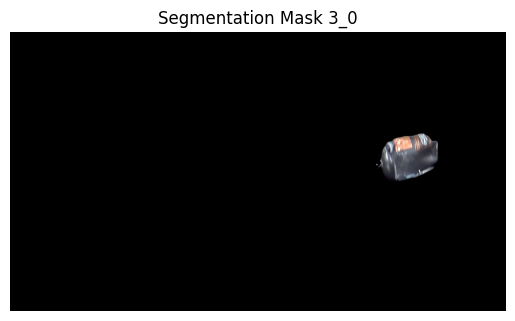

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_85.png


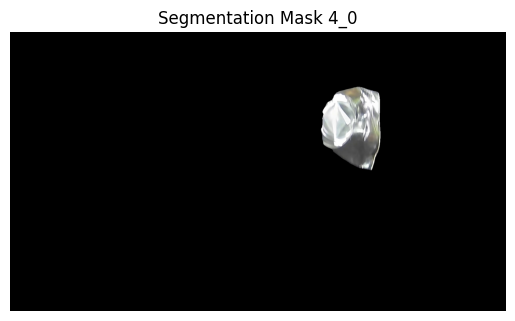

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_73.png


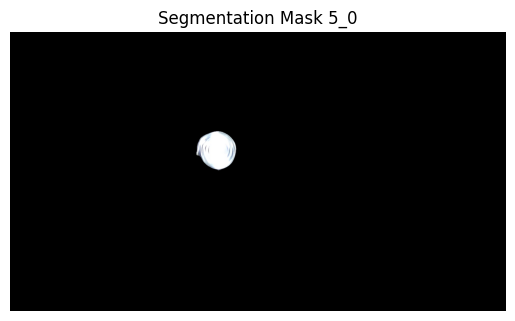

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_68.png


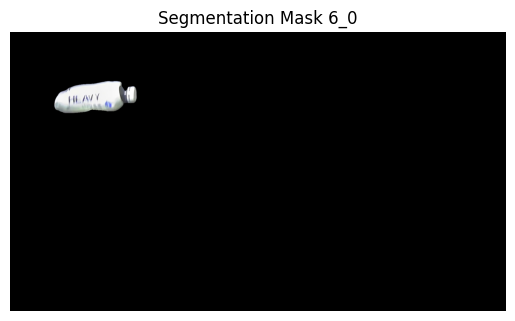

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_53.png


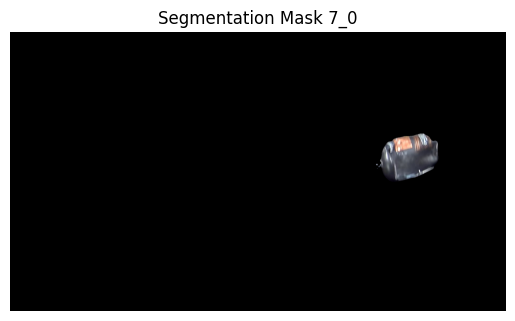

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_44.png


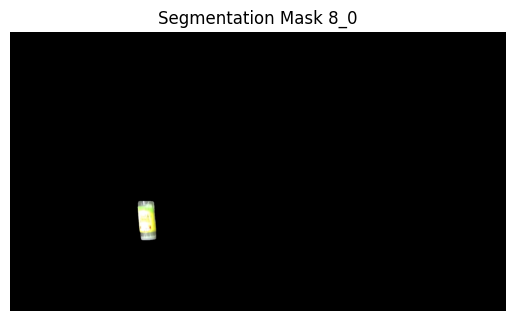

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_32.png


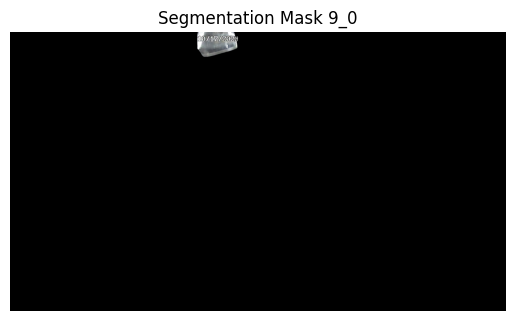

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_26.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


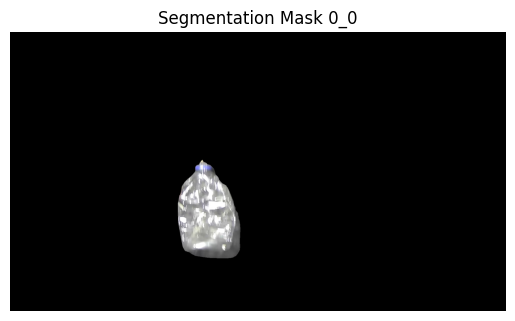

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_102.png


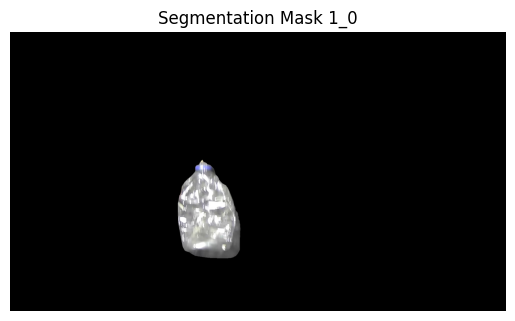

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_101.png


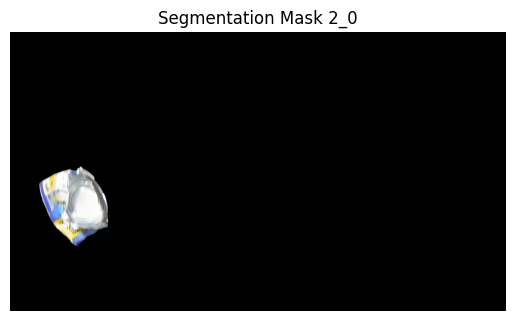

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_97.png


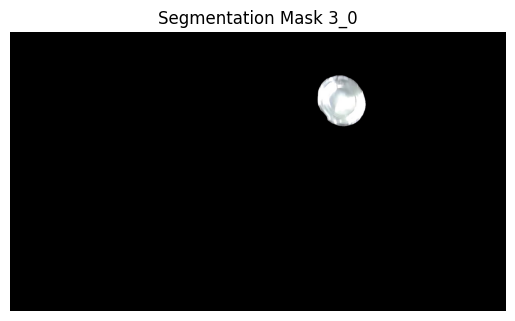

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_86.png


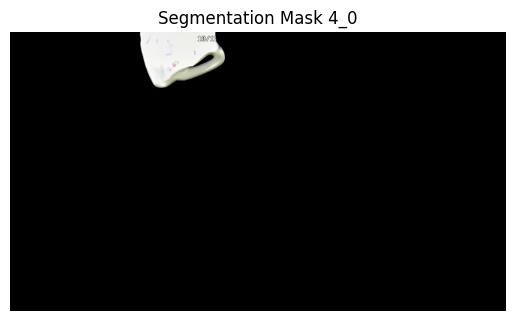

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_74.png


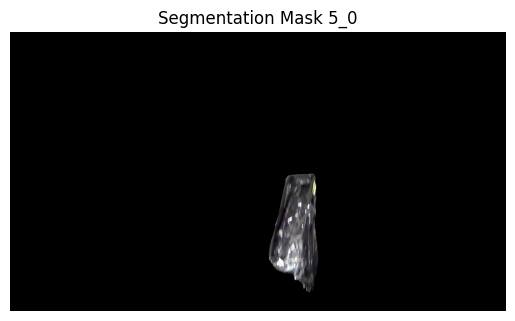

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_69.png


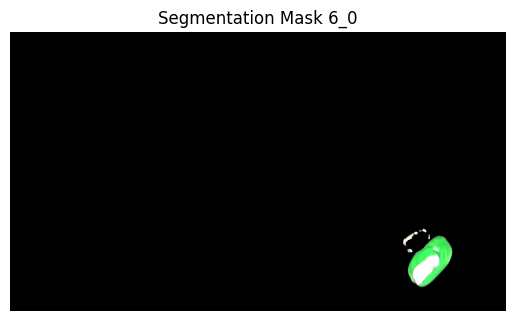

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_54.png


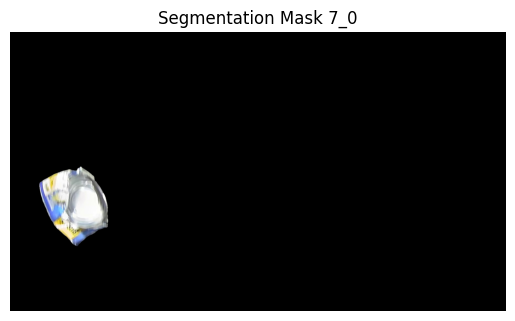

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_45.png


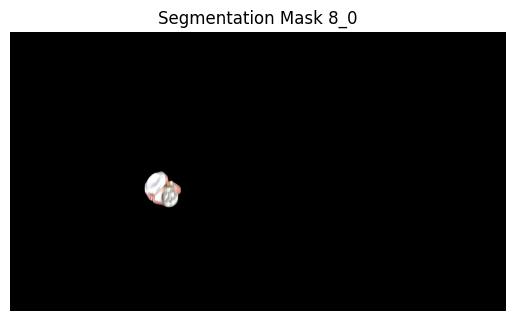

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_33.png


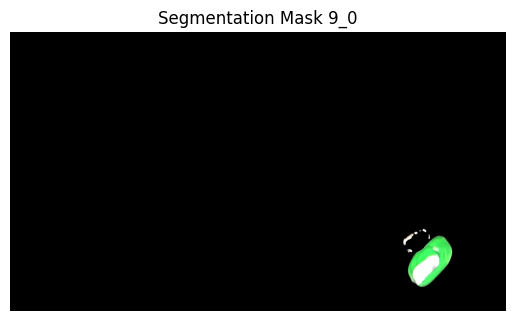

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_27.png


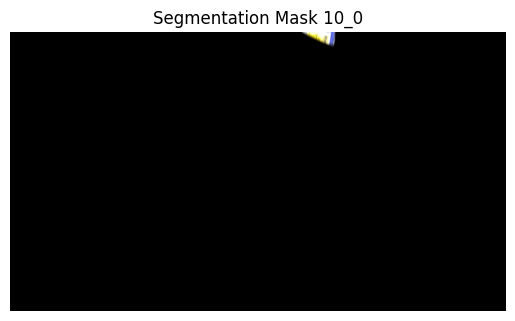

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_19.png


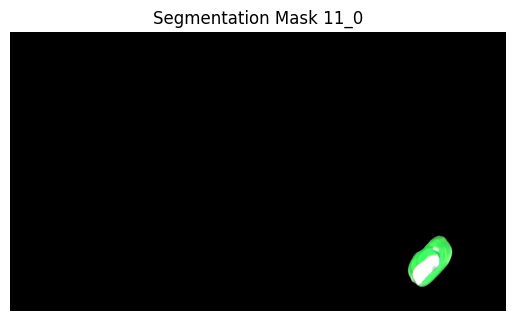

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_13.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


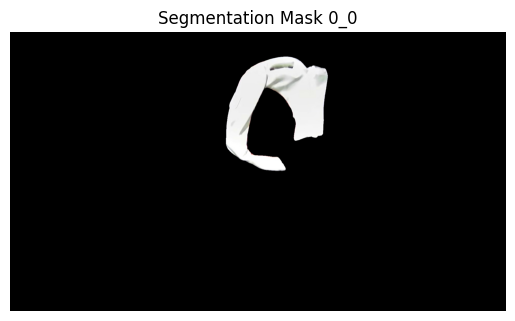

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_103.png


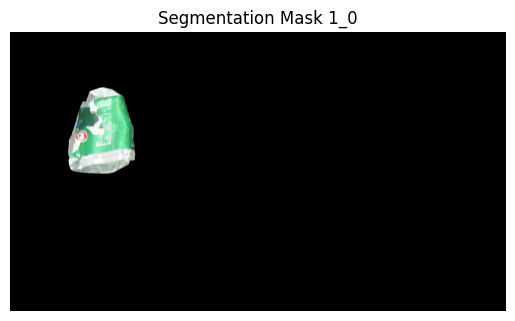

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_102.png


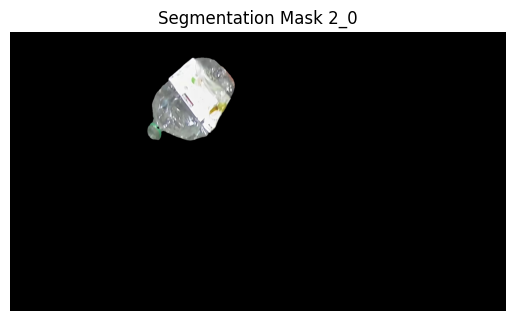

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_98.png


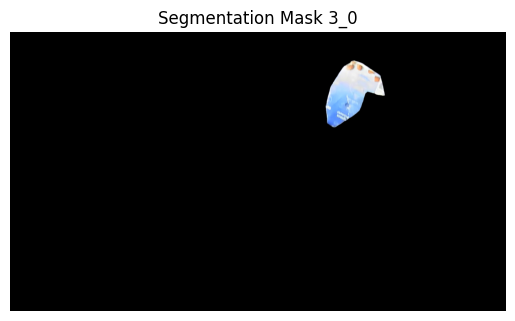

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_87.png


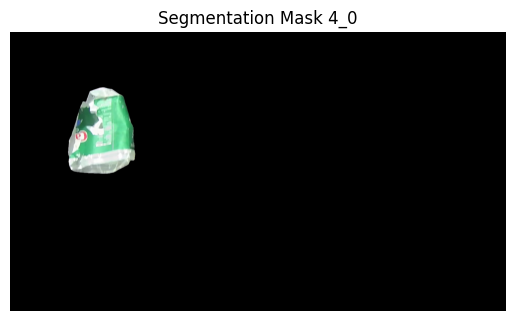

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_75.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


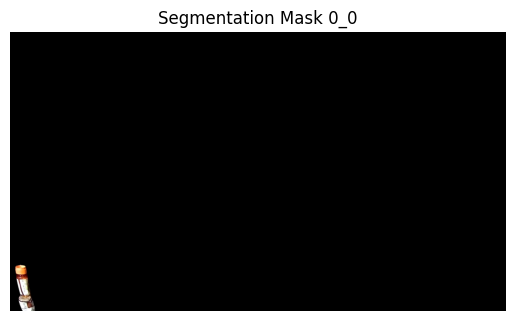

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_104.png


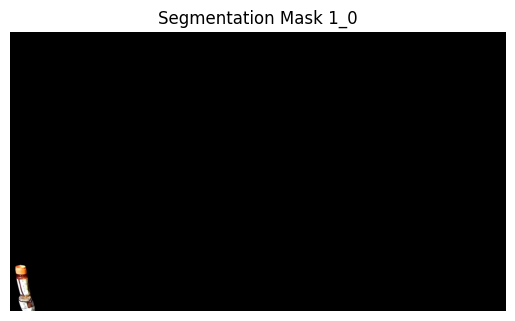

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_103.png


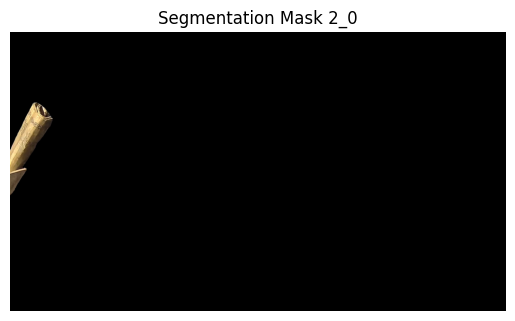

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_99.png


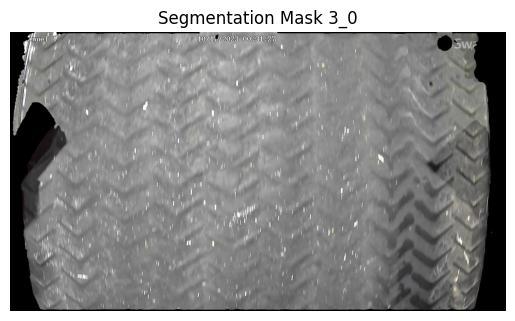

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_88.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


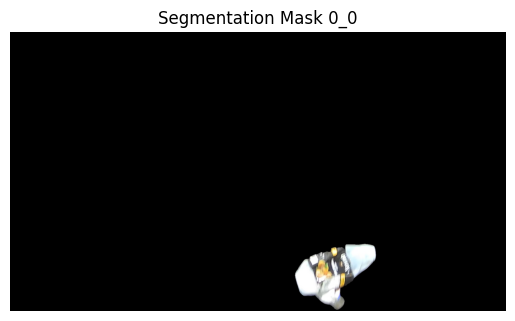

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_105.png


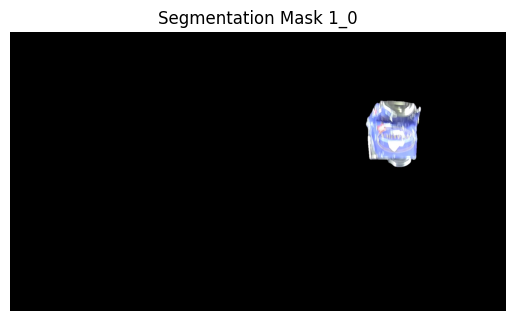

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_104.png


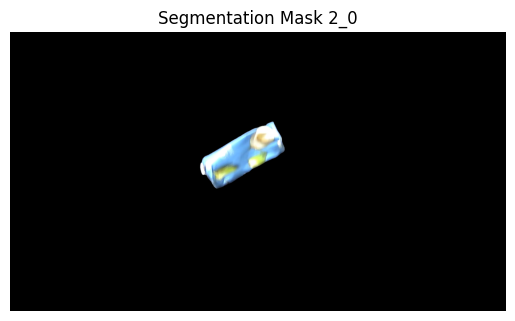

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_100.png


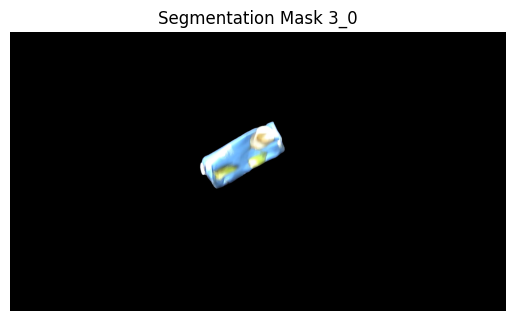

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_89.png


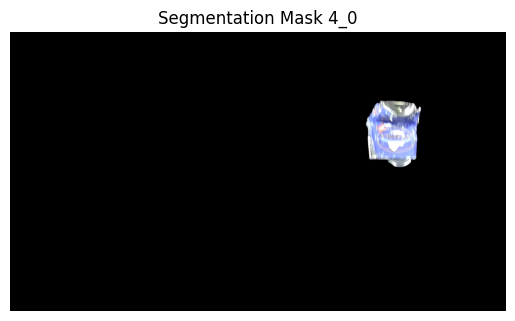

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_76.png


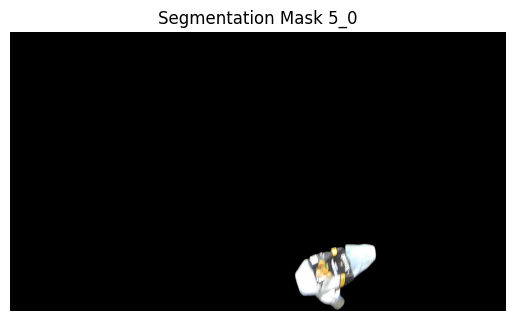

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_70.png


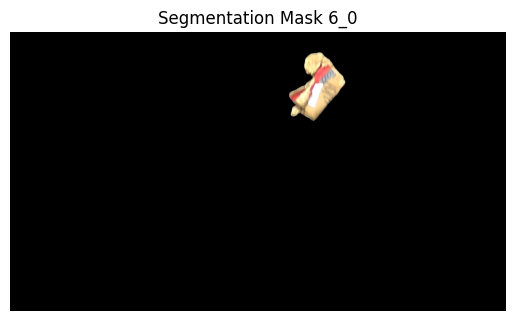

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_55.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


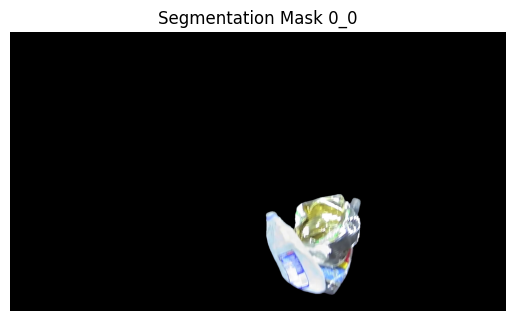

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_106.png


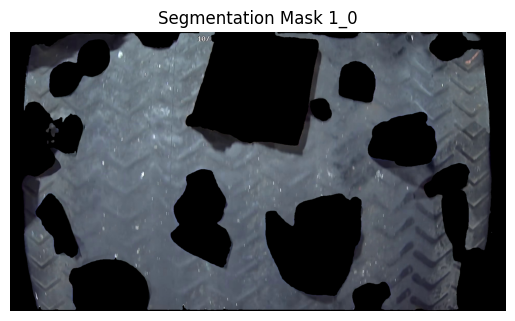

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_105.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


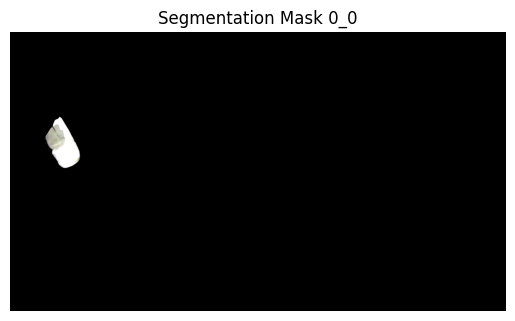

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_107.png


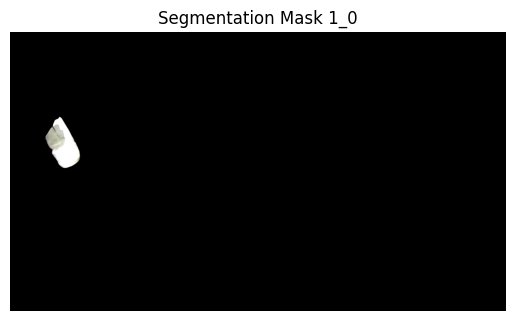

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_106.png


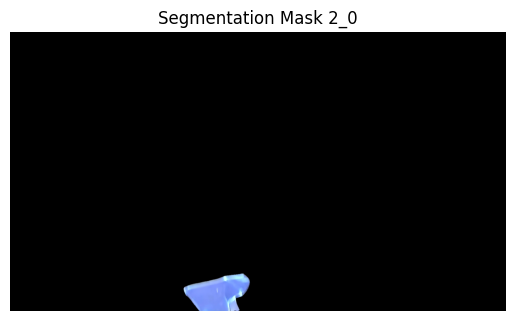

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_101.png


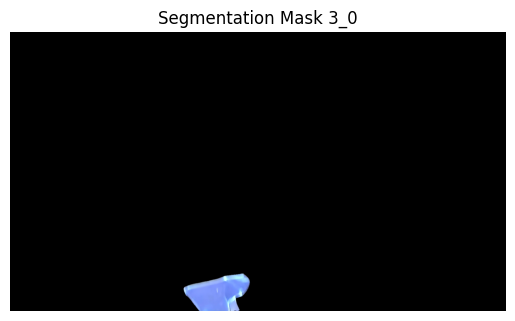

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_90.png


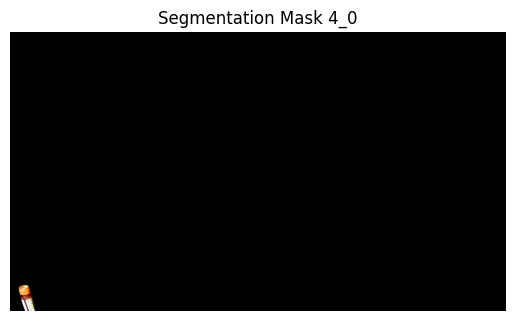

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_77.png


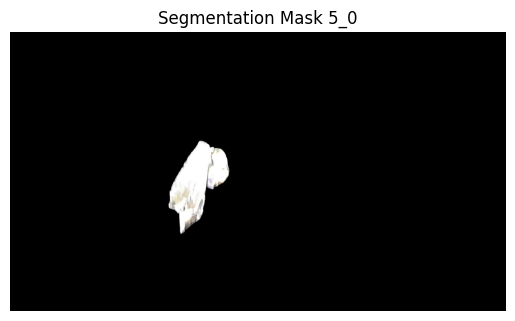

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_71.png


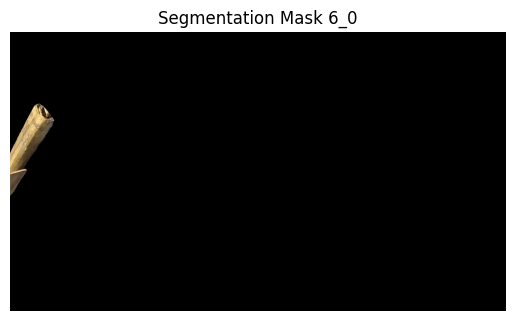

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_56.png


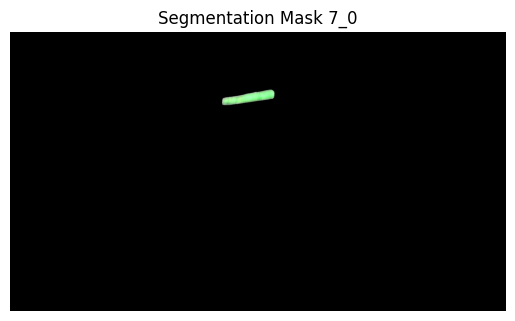

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_46.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


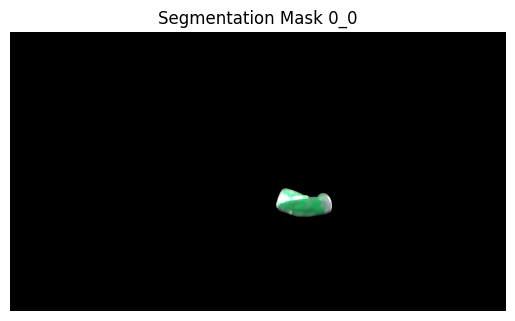

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_108.png


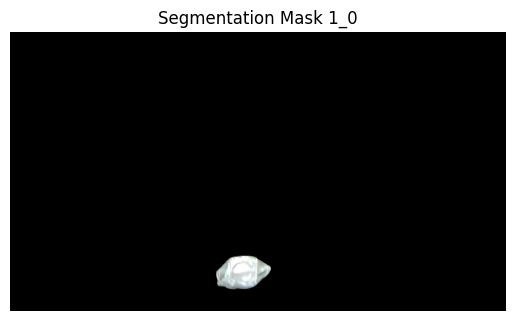

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_107.png


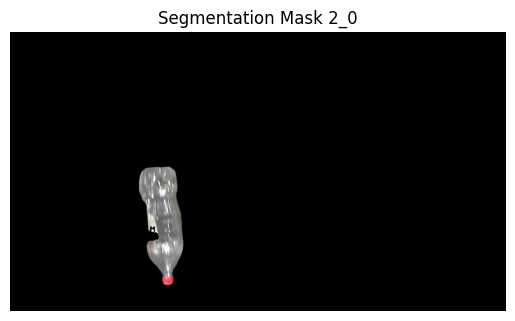

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_102.png


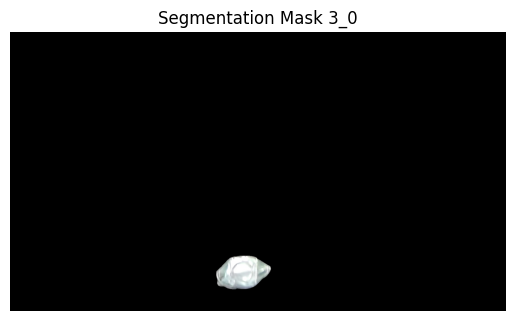

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_91.png


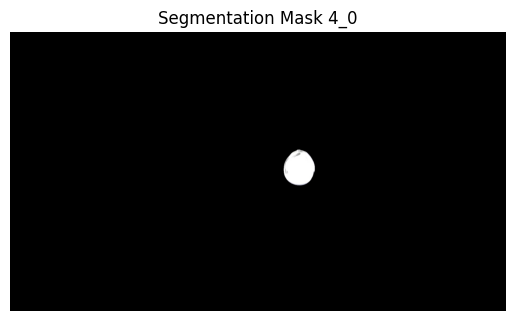

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_78.png


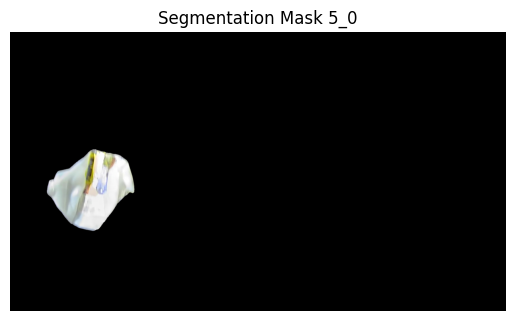

Segmentation mask 5_0 saved as /content/rando4/segmentation_mask_5_0_72.png


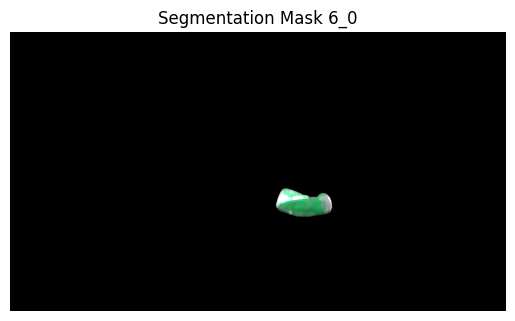

Segmentation mask 6_0 saved as /content/rando4/segmentation_mask_6_0_57.png


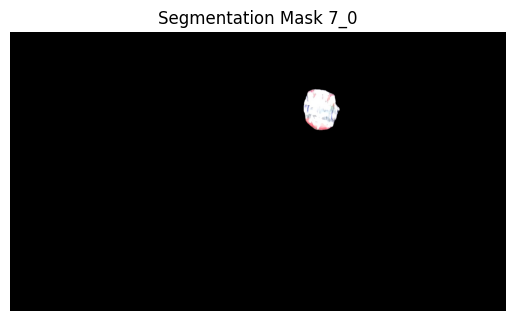

Segmentation mask 7_0 saved as /content/rando4/segmentation_mask_7_0_47.png


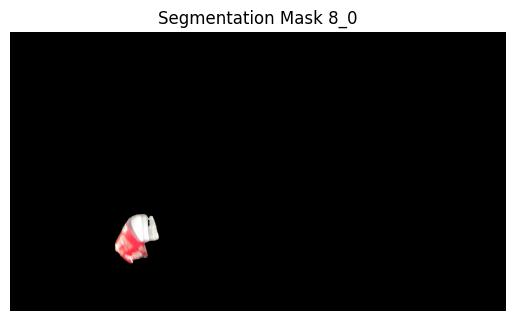

Segmentation mask 8_0 saved as /content/rando4/segmentation_mask_8_0_34.png


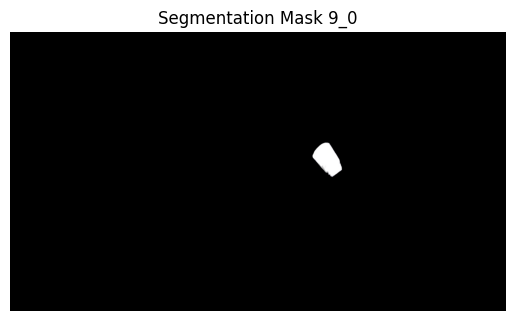

Segmentation mask 9_0 saved as /content/rando4/segmentation_mask_9_0_28.png


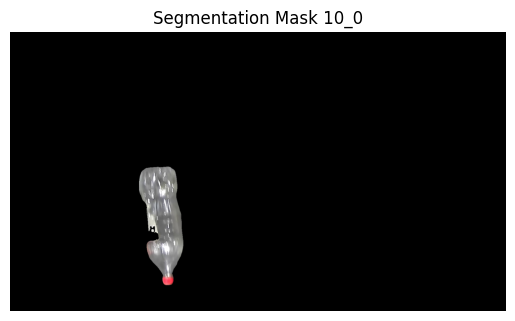

Segmentation mask 10_0 saved as /content/rando4/segmentation_mask_10_0_20.png


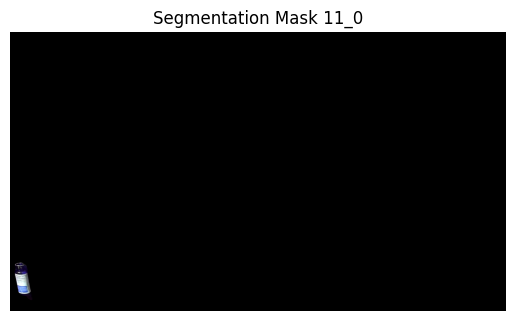

Segmentation mask 11_0 saved as /content/rando4/segmentation_mask_11_0_14.png


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


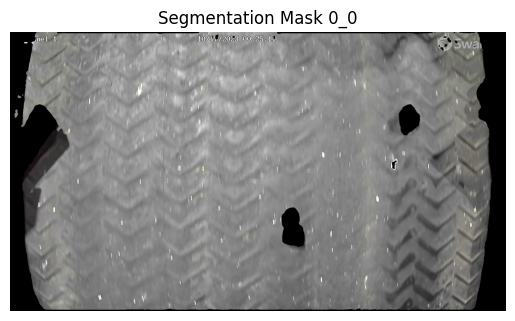

Segmentation mask 0_0 saved as /content/rando4/segmentation_mask_0_0_109.png


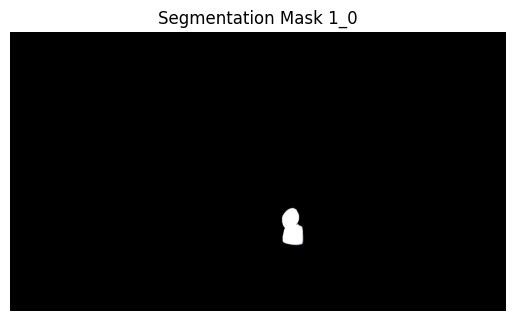

Segmentation mask 1_0 saved as /content/rando4/segmentation_mask_1_0_108.png


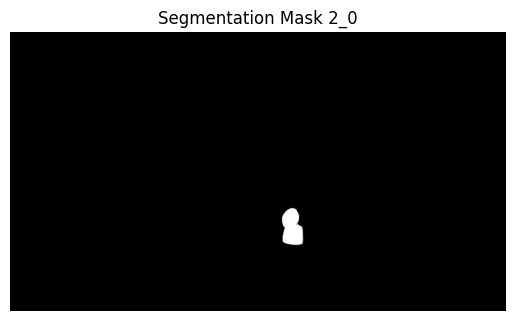

Segmentation mask 2_0 saved as /content/rando4/segmentation_mask_2_0_103.png


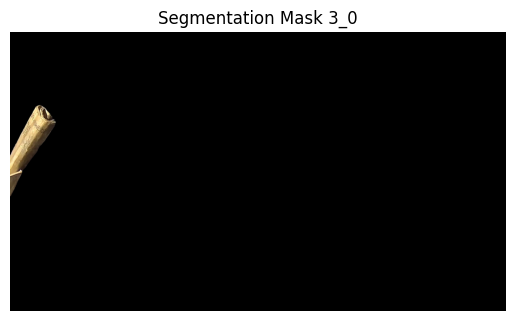

Segmentation mask 3_0 saved as /content/rando4/segmentation_mask_3_0_92.png


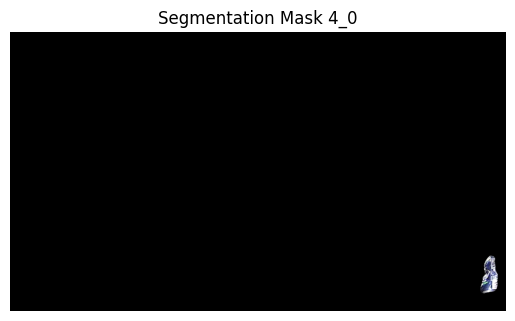

Segmentation mask 4_0 saved as /content/rando4/segmentation_mask_4_0_79.png


In [ ]:
image_directory = '/content/video_images/'

# Define the directory to save segmentation masks
save_dir = '/content/rando4/'
TEXT_PROMPT = "all jugs and bottles"
BOX_THRESHOLD = 0.3
TEXT_THRESHOLD = 0.25

def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

# Iterate over each file in the directory
for filename in os.listdir(image_directory):
    if filename.endswith(('.jpg', '.jpeg', '.png', '.gif')):
        # Construct the full path to the image
        image_path = os.path.join(image_directory, filename)

        # Load image and perform bounding box detection
        image_source, image = load_image(image_path)
        boxes, logits, phrases = predict(
            model=groundingdino_model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Display annotated frame with bounding boxes
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
        annotated_frame = annotated_frame[...,::-1] # BGR to RGB
        Image.fromarray(annotated_frame)

        # Segmentation within Bounding Boxes
        sam_predictor.set_image(image_source)  # Set image for segmentation predictor

        # Convert boxes to Torch tensor and transform to xyxy format
        H, W, _ = image_source.shape
        boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

        # Define a list to store all segmentation masks
        segmentation_masks = []

        # Generate masks for each bounding box
        for box in boxes_xyxy:
            # Apply segmentation within each bounding box
            transformed_box = sam_predictor.transform.apply_boxes_torch(box.unsqueeze(0), (H, W))
            masks, _, _ = sam_predictor.predict_torch(
                point_coords=None,
                point_labels=None,
                boxes=transformed_box,
                multimask_output=False,
            )

            # Append the masks for the current bounding box to the list
            segmentation_masks.extend(masks)

            # Overlay segmentation masks within bounding boxes and store the annotated frame
            for mask in masks:
                annotated_frame = show_mask(mask, annotated_frame)

        # Display annotated frame with segmentation masks within bounding boxes
        Image.fromarray(annotated_frame)

        # Save segmentation masks as images
        for i, box_masks in enumerate(segmentation_masks):
            for j, mask in enumerate(box_masks):
                segmentation_mask = mask.cpu().numpy()
                segmentation_mask_pil = Image.fromarray(segmentation_mask)
                width, height = segmentation_mask_pil.size
                result_image = np.zeros_like(image_source)
                result_image[:, :, :] = [0, 0, 0]  # Fill with black color
                for y in range(height):
                    for x in range(width):
                        mask_pixel = segmentation_mask_pil.getpixel((x, y))
                        if mask_pixel == 255:  # Assuming white corresponds to segmentation
                            original_color = image_source[y, x]
                            result_image[y, x] = original_color
                mask_filename = f"segmentation_mask_{i}_{j}.png"
                mask_filepath = os.path.join(save_dir, mask_filename)
                file_exists = os.path.exists(mask_filepath)
                counter = 1
                while file_exists:
                    mask_filename = f"segmentation_mask_{i}_{j}_{counter}.png"
                    mask_filepath = os.path.join(save_dir, mask_filename)
                    file_exists = os.path.exists(mask_filepath)
                    counter += 1
                plt.imsave(mask_filepath, result_image)
                plt.imshow(result_image)
                plt.title(f"Segmentation Mask {i}_{j}")
                plt.axis('off')
                plt.show()
                print(f"Segmentation mask {i}_{j} saved as {mask_filepath}")

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


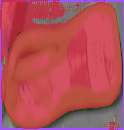

In [ ]:
#image_files = [file for file in os.listdir(local_image_path) if file.endswith(('.jpg', '.jpeg', '.png', '.gif'))]

# Define a list to store all segmentation masks
segmentation_masks = []


# Define the show_mask function
def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

# Bounding Boxes Detection
TEXT_PROMPT = "Everything not greyish black"
BOX_THRESHOLD = 0.3
TEXT_THRESHOLD = 0.25

image_source, image = load_image(local_image_path)
boxes, logits, phrases = predict(
    model=groundingdino_model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold=TEXT_THRESHOLD
)

# Display annotated frame with bounding boxes
annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
annotated_frame = annotated_frame[...,::-1] # BGR to RGB
Image.fromarray(annotated_frame)

# Segmentation within Bounding Boxes
sam_predictor.set_image(image_source)  # Set image for segmentation predictor

# Convert boxes to Torch tensor and transform to xyxy format
H, W, _ = image_source.shape
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

# Define a list to store all segmentation masks
segmentation_masks = []

# Generate masks for each bounding box
for box in boxes_xyxy:
    # Apply segmentation within each bounding box
    transformed_box = sam_predictor.transform.apply_boxes_torch(box.unsqueeze(0), (H, W))
    masks, _, _ = sam_predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=transformed_box,
        multimask_output=False,
    )

    # Append the masks for the current bounding box to the list
    segmentation_masks.extend(masks)

    # Overlay segmentation masks within bounding boxes and store the annotated frame
    for mask in masks:
        annotated_frame = show_mask(mask, annotated_frame)

# Display annotated frame with segmentation masks within bounding boxes
Image.fromarray(annotated_frame)

# Now, the segmentation_masks list contains all segmentation masks generated within the bounding boxes.
# You can use this list for further processing or analysis.


In [ ]:
save_dir = os.path.join(HOME, "Segmentations", "Jug")
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

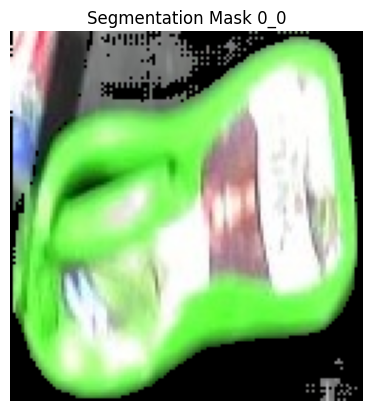

Segmentation mask 0_0 saved as /content/rando2/segmentation_mask_0_0_1.png


In [ ]:
for i, box_masks in enumerate(segmentation_masks):
    for j, mask in enumerate(box_masks):
        # Convert the segmentation mask to a NumPy array
        segmentation_mask = mask.cpu().numpy()

        # Convert the segmentation mask to a PIL Image
        segmentation_mask_pil = Image.fromarray(segmentation_mask)

        # Get the height and width of the segmentation mask
        width, height = segmentation_mask_pil.size

        # Create a new image to store the result with original colors for the segmentation and black for everything else
        result_image = np.zeros_like(image_source)
        result_image[:, :, :] = [0, 0, 0]  # Fill with black color

        # Perform pixel matching and extraction of color from the original image
        for y in range(height):
            for x in range(width):
                # Get the pixel value from the segmentation mask
                mask_pixel = segmentation_mask_pil.getpixel((x, y))

                # Check if the pixel in the segmentation mask is white
                if mask_pixel == 255:  # Assuming white corresponds to segmentation
                    # Get the color from the original image at the same pixel location
                    original_color = image_source[y, x]

                    # Set the color in the result image at the same pixel location
                    result_image[y, x] = original_color

        # Generate the filename for the segmentation mask
        mask_filename = f"segmentation_mask_{i}_{j}.png"
        mask_filepath = os.path.join(save_dir, mask_filename)

        # Check if the file already exists
        file_exists = os.path.exists(mask_filepath)

        # If the file exists, find a unique filename by incrementing the indices
        counter = 1
        while file_exists:
            mask_filename = f"segmentation_mask_{i}_{j}_{counter}.png"
            mask_filepath = os.path.join(save_dir, mask_filename)
            file_exists = os.path.exists(mask_filepath)
            counter += 1

        # Save the segmentation mask as an image file
        plt.imsave(mask_filepath, result_image)

        # Display the segmentation mask
        plt.imshow(result_image)
        plt.title(f"Segmentation Mask {i}_{j}")
        plt.axis('off')
        plt.show()

        print(f"Segmentation mask {i}_{j} saved as {mask_filepath}")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/rando2

/content/rando2


In [ ]:
!zip -r models.zip /content/rando2

  adding: content/rando2/ (stored 0%)
  adding: content/rando2/segmentation_mask_1_0_3.png (deflated 14%)
  adding: content/rando2/segmentation_mask_0_0_72.png (deflated 0%)
  adding: content/rando2/segmentation_mask_0_0_50.png (deflated 0%)
  adding: content/rando2/segmentation_mask_0_0_31.png (deflated 0%)
  adding: content/rando2/segmentation_mask_0_0_113.png (deflated 0%)
  adding: content/rando2/segmentation_mask_1_0_18.png (deflated 3%)
  adding: content/rando2/segmentation_mask_1_0_10.png (deflated 11%)
  adding: content/rando2/segmentation_mask_0_0_52.png (deflated 0%)
  adding: content/rando2/segmentation_mask_1_0_13.png (stored 0%)
  adding: content/rando2/segmentation_mask_0_0_39.png (stored 0%)
  adding: content/rando2/segmentation_mask_1_0_6.png (stored 0%)
  adding: content/rando2/segmentation_mask_0_0_15.png (stored 0%)
  adding: content/rando2/segmentation_mask_0_0_67.png (stored 0%)
  adding: content/rando2/segmentation_mask_0_0_24.png (stored 0%)
  adding: content/ran

In [ ]:
from google.colab import files
files.download('models.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import zipfile
import os

# Define the directory to be zipped
directory_to_zip = 'dataset/'

# Define the zip file name
zip_file_name = 'dataset.zip'

# Create a zip file and add files to it
with zipfile.ZipFile(zip_file_name, 'w') as zipf:
    for root, dirs, files in os.walk(directory_to_zip):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), directory_to_zip))

# Print a message indicating successful zip creation
print(f"Zip file '{zip_file_name}' created successfully.")

Zip file 'dataset.zip' created successfully.


In [ ]:
from google.colab import files
files.download('dataset.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>